In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import cobra
import numpy as np
import seaborn as sns
import itertools
from matplotlib.colors import LogNorm, Normalize


In [2]:
import subprocess
import time


In [3]:
from cobra.flux_analysis import flux_variability_analysis
from cobra.flux_analysis import production_envelope


In [4]:
def get_elements(rid):
    r = model.reactions.get_by_id(rid)
    m = r.reactants[0]    
    elements = m.elements.copy()
    
    res = {
        'reaction' : rid,
        'metabolite' : m.name,
        'mid' : m.id,
        'N' : 'N' in elements,
        'C' : 'C' in elements,
        
    }
    return pd.Series(res)

In [5]:
import os
model_dpath = os.path.join('..', 'Models',  'kbase_models','model_objects')
os.listdir(model_dpath)


['HOT1A3_BlastKOALA_KEGG_nogap.model.sbml',
 'HOT1A3_carveme_annotations_nogap.model.sbml',
 'HOT1A3_BlastKOALA_KEGG_gapfill.model.sbml',
 'HOT1A3_NCBI_EC_numbers_nogap.model.sbml',
 'HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_gapfill.model.sbml',
 'HOT1A3_ProkkaAnnotation_gapfill.model.sbml',
 'HOT1A3_RAST_annotation_nogap.model.sbml',
 'HOT1A3_DRAM_gapfill.model.sbml',
 'HOT1A3_carveme_annotations_gapfill.model.sbml',
 'HOT1A3_Majority_nogap.model.sbml',
 'HOT1A3_ProkkaAnnotation_nogap.model.sbml',
 'HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_nogap.model.sbml',
 'HOT1A3_RAST_annotation_gapfill.model.sbml',
 'HOT1A3_2OrMore_nogap.model.sbml',
 'HOT1A3_NCBI_EC_numbers_gapfill.model.sbml',
 'HOT1A3_DRAM_nogap.model.sbml',
 'HOT1A3_2OrMore_gapfill.model.sbml',
 'HOT1A3_Majority_gapfill.model.sbml',
 'HOT1A3_Union_nogap.model.sbml',
 'HOT1A3_Union_gapfill.model.sbml']

In [6]:
models_dict = {fname : cobra.io.read_sbml_model(os.path.join(model_dpath, fname)) for fname in os.listdir(model_dpath)}


Model does not contain SBML fbc package information.


Set parameter Username
Academic license - for non-commercial use only - expires 2023-07-13


SBML package 'layout' not supported by cobrapy, information is not parsed
SBML package 'render' not supported by cobrapy, information is not parsed
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00443_c0 "ABEE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02920_c0 "2_Amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridinediphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_c0 "PPi_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_c0 "H_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00683_c0 "Dihydropteroate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00002_c0 "ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_c0 "Glycine_c0">
Use of

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00089_c0 "Glucose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11735_c0 "Amylose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08289_c0 "1_deoxy_D_xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08449_c0 "3_Amino_2_oxopropyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00478_c0 "Pyridoxine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03187_c0 "Oxalosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00024_c0 "2_Oxoglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00246_c0 "Inosine_c0">
Use of the sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03529_c0 "N4_Acetylaminobutanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01889_c0 "4_Acetamidobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12780_c0 "2_Polyprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12785_c0 "4_Hydroxy_3_polyprenylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02498_c0 "2_3_Dihydroxy_isovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00123_c0 "3_Methyl_2_oxobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15181_c0 "5_Fluoromuconolactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00552_c0 "

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00309_c0 "XAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00530_c0 "XTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00497_c0 "XMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02210_c0 "Indoleglycerol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00102_c0 "Glyceraldehyde3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00359_c0 "indol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03002_c0 "Lipid_A_disaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02993_c0 "Lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00504_c0 "LL_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00516_c0 "meso_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00380_c0 "Itaconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00416_c0 "Itaconyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00905_c0 "Guanosine_3_5_bisdiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10499_c0 "1_Nitronaphthalene_7_8_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10500_c0 "1_Nitro_7_hydroxy_8_glutathionyl

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_c0 "L_Threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11922_c0 "tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12229_c0 "L_Threonyl_tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00087_c0 "Tetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02152_c0 "L_Argininosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_c0 "L_Arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00641_c0 "L_Histidinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00426_c0 "Homogentisate_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00449_c0 "Dihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00481_c0 "Isobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00863_c0 "beta_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07971_c0 "1_2_Dibromoethane_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00966_c0 "HBr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10571_c0 "Glutathione_episulfonium_ion_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00143_c0 "Phe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11313_c0 "hemeO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00773_c0 "UDP_MurNAc_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02820_c0 "UDP_N_acetylglucosamine_enolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01237_c0 "Choloyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03248_c0 "3alpha_7alpha_12alpha_Trihydroxy_5beta_24_oxocholestanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02799_c0 "Methylisocitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14698_c0 "3_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00145_c0 "Hydroxypyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02991_c0 "phosphoribulosylformimino_AICAR_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14547_c0 "C15811_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14548_c0 "C15812_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_c0 "Thymidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00151_c0 "Thymine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00509_c0 "deoxyribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11481_c0 "R_3_hydroxypalmitoyl_acyl_carrierprotein__c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10502_c0 "1_Nitro_5_hydroxy_6_glutathionyl_5_6_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00358_c0 "dUTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00978_c0 "dUDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00809_c0 "O_Phospho_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03395_c0 "3_Phosphoadenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11911_c0 "tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12060_c0 "Gln_tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02103_c0 "N2_Succinyl_L_arginine_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11487_c0 "3_oxodecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00209_c0 "Nitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02843_c0 "D_erythro_imidazol_glycerol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11669_c0 "Q_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11665_c0 "QH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03052_c0 "Imidazole_acetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01831_c0 "4_Imidazoleacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11479_c0 "D_3_Hydroxyhexanoyl_acp_c0">
Use of the species charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00039_c0 "L_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02187_c0 "Methacrylyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03572_c0 "S_3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00251_c0 "ADPribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_e0 "Mg_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_c0 "Mg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00200_c0 "4MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00340_c0 "2_5_Dioxopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03389_c0 "Selenocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00238_c0 "Sedoheptulose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_c0 "PAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03491_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04167_c0 "TCE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10565_c0 "DCVG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03441_c0 "2_Hexaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03198_c0 "Melibiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02692_c0 "2_Amino_3_carboxymuconate_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16437_c0 "5_Fluorouridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16438_c0 "5_Fluorouridine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00306_c0 "Xylitol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00154_c0 "Xylose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10489_c0 "1S_Hydroxy_2S_glutathionyl_1_2_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00382_c0 "Melit

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09793_c0 "1_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11476_c0 "hexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16395_c0 "2_Phenyl_1_3_propanediol_monocarbamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16396_c0 "3_Carbamoyl_2_phenylpropionaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11466_c0 "Myristoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03164_c0 "Chenodeoxycholoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03232_c0 "

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00401_c0 "Benzoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00977_c0 "dITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03704_c0 "dIMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00348_c0 "D_Galactose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00388_c0 "Allantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01419_c0 "Ureidoglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00976_c0 "dIDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03176_c0 "5S_HPETE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead:

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21486_c0 "Aminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21482_c0 "Z_3_Peroxyaminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11455_c0 "ps_BS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11456_c0 "Phosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02932_c0 "UDP_N_acetylmuramoyl_L_Ala_D_gamma_Glu_6_carboxy_L_Lys_D_Ala2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21016_c0 "N_Acetyl_beta_muramate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00218_e0 "Niacin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00218_c0 "Niacin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_e0 "Putrescine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_e0 "L_Phenylalanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_e0 "L_Arginine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_e0 "L_Threonine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_e0 "L_Valine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_e0 "L_Tryptophan_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead

Adding exchange reaction EX_cpd10516_b with default bounds for boundary metabolite: cpd10516_b.
Adding exchange reaction EX_cpd00007_b with default bounds for boundary metabolite: cpd00007_b.
Adding exchange reaction EX_cpd00116_b with default bounds for boundary metabolite: cpd00116_b.
Adding exchange reaction EX_cpd00011_b with default bounds for boundary metabolite: cpd00011_b.
Adding exchange reaction EX_cpd03453_b with default bounds for boundary metabolite: cpd03453_b.
Adding exchange reaction EX_cpd03726_b with default bounds for boundary metabolite: cpd03726_b.
Adding exchange reaction EX_cpd00067_b with default bounds for boundary metabolite: cpd00067_b.
Adding exchange reaction EX_cpd00084_b with default bounds for boundary metabolite: cpd00084_b.
Adding exchange reaction EX_cpd00017_b with default bounds for boundary metabolite: cpd00017_b.
Adding exchange reaction EX_cpd00322_b with default bounds for boundary metabolite: cpd00322_b.
Adding exchange reaction EX_cpd00028_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00506_c0 "Acetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00506_c0 "Acetaldehyde_NAD_p

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00512_c0 "Glycolate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00512_c0 "Glycolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00173_c0 "acetyl_CoA_phosphate_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00173_c0 "acetyl_CoA_phosphate_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00500_c0 "R_Lactate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00500_c0 "R_Lactate_NAD_plus__oxidoreductase_c0">
Encoding LO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, u

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00604_c0 "D_glucose_6_phosphate_NA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00642_c0 "GDP_mannose_4_6_hydro_lyase_GDP_4_dehydro_6_deoxy_D_mannose_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00642_c0 "GDP_mannose_4_6_hydro_lyase_GDP_4_dehydro_6_deoxy_D_mannose_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00022_c0 "maltose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00022_c0 "maltose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06522_c0 "Monocarboxylic_acid_amide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06522_c0 "Monocarboxylic_acid_amide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02316_c0 "UTP_D

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02988_c0 "glycerone_phosphate_iminosuccinate_alkyltransferase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discoura

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00337_c0 "ATP_L_aspartate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01231_c0 "3_Sulfo_L_alanine_carboxy_lyase_taurine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01231_c0 "3_Sulfo_L_alanine_carboxy_lyase_taurine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02106_c0 "2_Propyn_1_al_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02106_c0 "2_Propyn_1_al_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02679_c0 "Octanoyl_CoA_oxygen_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02679_c0 "Octanoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07434_c0 "R07603_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07434_c0 "R07603_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes ele

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11772_c0 "6_thioxanthine_5_monophosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11772_c0 "6_thioxanthine_5_monophosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02122_c0 "D_Glucuronolactone_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02122_c0 "D_Glucuronolactone_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06112_c0 "Penicillin_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02720_c0 "Lauroyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02720_c0 "Lauroyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00913_c0 "Guanosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00913_c0 "Guanosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06448_c0 "L_Tryptophan__tRNATrp_ligase_AMP_forming_c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01354_c0 "dGTP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01244_c0 "3_methyl_2_oxobutanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01244_c0 "3_methyl_2_oxobutanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02154_c0 "Deamino_NAD_plus__nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gp

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01516_c0 "dTTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01516_c0 "dTTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00758_c0 "sn_Glycero_3_phosphocholine_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in th

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00369_c0 "GTP_cytidine_5_phosphotransferase_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06281_c0 "D_Arginine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06281_c0 "D_Arginine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amido

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phospho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyrimidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyri

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07807_c0 "R08017_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04650_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04650_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01509_c0 "ATP_dGMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01509_c0 "ATP_dGMP_phosphotran

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02853_c0 "Imidazole_acetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02853_c0 "Imidazole_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01515_c0 "dTTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01515_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01937_c0 "Indole_3_acetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01937_c0 "Indole_3_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06438_c0 "glycine_tRNAGly_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01573_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08924_c0 "Mg2_plus__importing_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08924_c0 "Mg2_plus__importing_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00804_c0 "L_leucine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00804_c0 "L_leucine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00196_c0 "2_5_dioxopentanoate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00196_c0 "2_5_dioxopentanoate_NADP_plus__5_oxido

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kineti

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00490_c0 "L_arogenate_hydro_lyase_decarboxylating_L_phenylalanine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2_dehydro_3_deoxy_D_gl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding LOWER_BOUND an

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reac

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxi

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreduct

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00255_c0 "4_carboxy_4_hydroxy_2_oxoadipate_oxaloacetate_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02358_c0 "trans_4_Hydroxy_L_proline_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02358_c0 "trans_4_Hydroxy_L_proline_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05332_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05332_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00819_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05901_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03394_c0 "R04987_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03394_c0 "R04987_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01832_c0 "R02528_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes el

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07484_c0 "beta_hexachlorocyclohexane_halidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07484_c0 "beta_hexachlorocyclohexane_halidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01679_c0 "dUTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01679_c0 "dUTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Encoding LOWER_BOUND and UPPER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreducta

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02222_c0 "Indole_3_acetamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02222_c0 "Indole_3_acetamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02093_c0 "Melibiitol_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02093_c0 "Melibiitol_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01513_c0 "ATP_dTMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01513_c0 "ATP_dTMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12649_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12649_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07628_c0 "R07837_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07628_c0 "R07837_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06075_c0 "2_Deoxyuridine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06075_c0 "2_Deoxyuridine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00689_c0 "Tetrahydrofolate_L_glutamate_gamma_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00689_c0 "Tetrahydrofolate_L_glutamate_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01286_c0 "D_Glyceraldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_IVA_3_deoxy_alpha_D_manno_oct_2_ulopyranose_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07455_c0 "decenoyl_acyl_carrier_protein_del

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15090_c0 "L_cysteine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15090_c0 "L_cysteine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09690_c0 "TRANS_RXNBWI_115637cemaizeexpCYS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09690_c0 "TRANS_RXNBWI_115637cemaizeexpCYS_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00220_e0 "EX_Riboflavin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00041_e0 "EX_L_Aspartate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00039_e0 "EX_L_Lysine_e0">
Encoding LOWER_BOUND and UPPE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycerate_2_3_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00616_c0 "sn_Glycerol_3_phosphate_acceptor_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00505_c0 "Isocitrate_NAD_plus__oxidoreductase_dec

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05226_c0 "D_glucose_transport_via_PEP_Pyr_PTS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05488_c0 "acetate_reversible_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02201_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_diphosphate_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObje

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07872_c0 "R08083_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03423_c0 "N4_Acetylaminobutanal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11642_c0 "4_hydroxy_3_polyprenylbenzoate_carboxy_lyase_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01729_c0 "glutarate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encod

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01925_c0 "2_methylpropanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylpropanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04916_c0 "1_2_dibromoethane_glutathione_ethylenetransferase_episulfonium_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01016_c0 "ATP_carbamate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04831_c0 "1_nitro_7_glutathionyl_8_hydroxy_7_8_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01675_c0 "dTTP_alp

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0"

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03402_c0 "beta_D_Glucosyl_2_coumarinate_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03135_c0 "R04558_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06109_c0 "Succinate_ubiquinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02853_c0 "Imidazole_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01515_c0 "dTTP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05337_c0 "3R_3_Hydroxyhexanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_CO

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06438_c0 "glycine_tRNAGly_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydr

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adeny

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07430_c0 "R07599_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01735_c0 "L_Cystine_L_Cysteine_lyase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02200_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14059_c0 "2_3_methylthiobutylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01069_c0 "O_phos

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomethylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07256_c0 "Plasmenylethanolamine_2_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00427_c0 "methanol_hydrogen_peroxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06025_c0 "5_L_glutamyl_peptide_taurine_5_glutamy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01512_c0 "ATP_dTDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06865_c0 "R05146_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01084_c0 "ATP_cobIalamin_Co_beta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04113_c0 "isopentenyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07264_c0 "Plasmanylcholine_2_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01252_c0 "Pyridoxine_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07880_c0 "7_methyl_3_oxo_6_octenoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_amino

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02928_c0 "2_3_4_5_Tetrahydrodipicolinate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04482_c0 "R06633_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06076_c0 "2_Deoxycytidine_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxid

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02518_c0 "2_Deoxyinosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01747_c0 "allantoate_amidinohydrolase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04133_c0 "R06064_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged,

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Rea

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00839_c0 "ATP_dADP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03838_c0 "R05549_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn40037_c0 "L_aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_2S_4S_4_hydr

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15121_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn35560_c0 "Lactose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11960_c0 "Glutaryl_CoA_dihydrolipoamide_S_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15694_c0 "enzyme_N6_dihydrolipoyllysine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn40041_c0 "sulfide_quinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01784_c0 "3_Sulfino_L_alanine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00084_e0 "EX_L_Cysteine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00017_e0 "EX_S_Adenosyl_L_methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00028_e0 "EX_Heme_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00635_e0 "EX_Cbl_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00107_e0 "EX_L_Leucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00182_e0 "Adenosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00182_c0 "Adenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15539_c0 "Phosphatidylglycerol_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00100_c0 "Glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15429_c0 "cardiolipin_tetrahexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_c0 "O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03444_c0 "2_Octaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03445_c0 "2_Octaprenyl_6_hydroxyphenol_c0">
Use of t

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00206_c0 "dCMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15481_c0 "glutaredoxin_reduced_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00177_c0 "dADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15480_c0 "glutaredoxin_oxidized_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02375_c0 "Adenylosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00106_c0 "Fumarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03282_c0 "L_Allothreonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02211_c0 "L_2_Amino_acetoacetate_c0">
Use of the species charge attribute is dis

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15505_c0 "two_linked_disacharide_tetrapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00287_c0 "3_Oxo_2_methylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00086_c0 "Propionyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01113_e0 "Hexanoate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01113_c0 "Hexanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00810_c0 "Orotidylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00091_c0 "UMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02654_c0 "4_Meth

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02030_c0 "3_phosphoshikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00219_c0 "Prephenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00868_c0 "p_hydroxyphenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00485_c0 "D_Mannose1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00083_c0 "GDP_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00044_c0 "3_phosphoadenylylsulfate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01335_c0 "Octanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03130_c0 "2E_Octenoyl_CoA_c0">
Use of the species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00141_c0 "Propionate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01260_c0 "Lauroyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_c0 "ddca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00641_c0 "L_Histidinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15328_c0 "1_octadec_11_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00426_c0 "Homogentisate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00763_c0 "4_Maleylacetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02060_c0 "2E_Dodecenoyl_CoA_c0">
Use of the species char

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15327_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00822_c0 "O_Succinyl_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11484_c0 "HMA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11467_c0 "2E_Tetradecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00034_c0 "Zn2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00034_e0 "Zn2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15551_c0 "L_Prolinylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11640_e0 "H2_e0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15316_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_hexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00338_c0 "5_Aminolevulinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03115_c0 "S_3_Hydroxytetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12689_c0 "3_Oxotetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11421_c0 "trdrd_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00081_c0 "Sulfite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11420_c0 "trdox_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00834_c0 "Phosphopantetheine_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00268_c0 "H2S2O3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01211_c0 "Thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01171_e0 "Dulcose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03752_c0 "Galactitol_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02311_c0 "4_Imidazolone_5_propanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00344_c0 "N_Formimino_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_c0 "L_Valine_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00136_c0 "4_Hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15295_c0 "Tetradecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00295_c0 "dGDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00498_c0 "2_Aceto_2_hydroxybutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02535_c0 "2_3_Dihydroxy_3_methylvalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00525_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02964_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00978_c0 "dUDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00358_c0 "dUTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00650_c0 "Crotonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02884_c0 "FAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00482_c0 "2_Phospho_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00413_c0 "Glutaryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00113_c0 "Isopentenyldiphosphate_c0">
Use of the species charge attribute is di

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08625_c0 "5_Hydroxyisourate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_e0 "L_Lactate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03120_c0 "S_Hydroxyoctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00911_c0 "6_phospho_D_glucono_1_5_lactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02557_c0 "Farnesylfarnesylgeraniol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03443_c0 "3_Octaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00266_c0 "Carnitine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_e0 "L_Arginine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03125_c0 "2E_Hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11474_c0 "Decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02069_c0 "3_Phosphonooxypyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15343_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02678_c0 "N_Formyl_GAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03585_c0 "KDO_lipid_IVA_c0">
Use of the sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00162_e0 "Aminoethanol_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15430_c0 "cardiolipin_tetraoctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00742_c0 "Allophanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15522_c0 "1_2_ditetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02182_c0 "R_S_Lactoylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02720_c0 "5_Amino_6__5_phosphoribitylaminouracil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02568_c0 "Bromoxynil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd149

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03847_b "Myristic_acid_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00207_b "Guanine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00154_b "Xylose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00359_b "indol_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00412_b "Deoxyuridine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01113_b "Hexanoate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_b "Putrescine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_b "Palmitate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instea

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_b "Glycine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_b "Mg_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00081_b "Sulfite_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11574_b "Molybdate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00138_b "D_Mannose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_b "L_Isoleucine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00142_b "Acetoacetate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_b "L_Lactate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <

Adding exchange reaction EX_cpd00412_b with default bounds for boundary metabolite: cpd00412_b.
Adding exchange reaction EX_cpd01113_b with default bounds for boundary metabolite: cpd01113_b.
Adding exchange reaction EX_cpd00118_b with default bounds for boundary metabolite: cpd00118_b.
Adding exchange reaction EX_cpd00214_b with default bounds for boundary metabolite: cpd00214_b.
Adding exchange reaction EX_cpd11586_b with default bounds for boundary metabolite: cpd11586_b.
Adding exchange reaction EX_cpd00129_b with default bounds for boundary metabolite: cpd00129_b.
Adding exchange reaction EX_cpd00971_b with default bounds for boundary metabolite: cpd00971_b.
Adding exchange reaction EX_cpd00039_b with default bounds for boundary metabolite: cpd00039_b.
Adding exchange reaction EX_cpd01155_b with default bounds for boundary metabolite: cpd01155_b.
Adding exchange reaction EX_cpd00211_b with default bounds for boundary metabolite: cpd00211_b.
Adding exchange reaction EX_cpd00246_b w

Adding exchange reaction EX_cpd00051_b with default bounds for boundary metabolite: cpd00051_b.
Adding exchange reaction EX_cpd00794_b with default bounds for boundary metabolite: cpd00794_b.
Adding exchange reaction EX_cpd00105_b with default bounds for boundary metabolite: cpd00105_b.
Adding exchange reaction EX_cpd11588_b with default bounds for boundary metabolite: cpd11588_b.
Adding exchange reaction EX_cpd00751_b with default bounds for boundary metabolite: cpd00751_b.
Adding exchange reaction EX_cpd00268_b with default bounds for boundary metabolite: cpd00268_b.
Adding exchange reaction EX_cpd01329_b with default bounds for boundary metabolite: cpd01329_b.
Adding exchange reaction EX_cpd00363_b with default bounds for boundary metabolite: cpd00363_b.
Adding exchange reaction EX_cpd01080_b with default bounds for boundary metabolite: cpd01080_b.
Adding exchange reaction EX_cpd00054_b with default bounds for boundary metabolite: cpd00054_b.
Adding exchange reaction EX_cpd00007_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_N

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05573_c0 "D_glucose_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05573_c0 "D_glucose_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00162_c0 "oxaloacetate_carboxy_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00159_c0 "S_malate_NAD_plus__oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00159_c0 "S_malate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reacti

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02201_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_diphosphate_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02201_c0 "2_amino_4_hydrox

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07966_c0 "2_acyl_glycerophospho_glycerol_acyltransferase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09235_c0 "ribonucleoside_triphosphate_reductase_ATP_flavodoxin_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09235_c0 "ribonucleoside_triphosphate_reductase_ATP_flavodoxin_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02944_c0 "N

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05167_c0 "D_xylose_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05167_c0 "D_xylose_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08888_c0 "murein_crosslinking_transpeptidase_1B_A2pm_A2pm_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08888_c0 "murein_crosslinking_transpeptidase_1B_A2pm_A2pm_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03423_c0 "N4_Acetylaminobutanal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03423_c0 "N4_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08296_c0 "diacylglycerol_kinase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08704_c0 "Hexadecanoate_transport_via_facilitated_irreversible_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08704_c0 "Hexadecanoate_transport_via_facilitated_irreversible_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05541_c0 "Dipeptide_transport_via_ABC_system_ala_glu_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05541_c0 "Dipeptide_transport_via_ABC_system_ala_glu_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09143_c0 "Phospholipase_A1_phosphatidylglycerol__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08187_c0 "LysineCadaverine_antiporter_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08187_c0 "LysineCadaverine_antiporter_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00327_c0 "S_ureidoglycolate_amidohydrolase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00327_c0 "S_ureidoglycolate_amidohydrolase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08999_c0 "nitrite_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08999_c0 "nitrite_transport_via_diffusion_e

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10481_c0 "Copper_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10481_c0 "Copper_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08110_c0 "RXN_8946cmetaexpNADP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08110_c0 "RXN_8946cmetaexpNADP_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05174_c0 "nickel_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05174_c0 "nickel_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08799_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08799_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reactio

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01644_c0 "L_Aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidore

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05219_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05219_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00879_c0 "myo_Inositol_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00879_c0 "myo_Inositol_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09154_c0 "Phospholipase_A2_phosphatidylethanolamine__n_C16_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09154_c0 "Phospholipase

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05199_c0 "Uridine_permease_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05199_c0 "Uridine_permease_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09161_c0 "Phospholipase_A2_phosphatidylglycerol__n_C16_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09161_c0 "Phospholipase_A2_phosphatidylglycerol__n_C16_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_amin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00106_c0 "Triphosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08413_c0 "3_hydroxyacyl_CoA_dehydratase_3_hydroxyoctadecanoyl_CoA_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08413_c0 "3_hydroxyacyl_CoA_dehydratase_3_hydroxyoctadecanoyl_CoA_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08097_c0 "L_alanine_transport_via_ABC_system_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00126_c0 "ATP_L_methionine_S_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00126_c0 "ATP_L_methionine_S_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01518_c0 "ATP_deoxyuridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01518_c0 "ATP_deoxyuridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07947_c0 "2_acyl_glycerophospho_ethanolamine_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08166_c0 "L_aspartate_oxidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08430_c0 "D_fructose_6_phosphate_phosphatase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08430_c0 "D_fructose_6_phosphate_phosphatase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Use of GENE ASSO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn000

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05245_c0 "TRANS_RXNBWI_115362cemaizeexpVAL_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05245_c0 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09065_c0 "Phosphatidate_phosphatase_periplasmic__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00236_c0 "GDP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00236_c0 "GDP_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01544_c0 "XMP_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01544_c0 "XMP_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09113_c0 "Phosphatidylglycerol_synthase_n_C18_0_c0">
Use of GENE AS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05566_c0 "D_galactose_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08985_c0 "sodium_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08985_c0 "sodium_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05746_c0 "Maltodextrin_glucosidase_maltotriose_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05746_c0 "Maltodextrin_glucosidase_maltotriose_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01678_c0 "

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use o

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08063_c0 "Acetate_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08063_c0 "Acetate_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08851_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00436_c0 "Thiamin_diphosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00436_c0 "Thiamin_diphosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02155_c0 "ATP_nicotinamide_nucleotide_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02155_c0 "ATP_nicotinamide_nucleotide_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08747_c0 "L_iso

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08932_c0 "murein_L_D_endopeptidase_murein5px3p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08932_c0 "murein_L_D_endopeptidase_murein5px3p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00116_c0 "UDP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00116_c0 "UDP_phosphohydrolase_c0">
Encoding LOWER_BO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08783_c0 "DLACTDEHYDROGFAD_RXNcmetaexpCPD_9956_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05181_c0 "Glyci

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09157_c0 "Phospholipase_A2_phosphatidylethanolamine__n_C18_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09157_c0 "Phospholipase_A2_phosphatidylethanolamine__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05622_c0 "Na_plus__transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05622_c0 "N

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08371_c0 "D_serine_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08371_c0 "D_serine_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05204_c0 "TRANS_RXNBWI_115572cemaizeexpGUANOSINE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05204_c0 "TRANS_RXNBWI_115572cemaizeexpGUANOSINE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02803_c0 "Tetradecanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01961_c0 "Xanthosine_5_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01517_c0 "ATP_dUMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01517_c0 "ATP_dUMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08896_c0 "murein_D_D_endopeptidase_murein3px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08896_c0 "murein_D_D_endopeptidase_murein3px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09211_c0 "Phosphatidylserine_syntase_n_C18_1_c0">
Use 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07952_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07952_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidored

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10010_c0 "trans_2_hexenoyl_CoA__reductase_NAD_plus__c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10010_c0 "trans_2_hexenoyl_CoA__reductase_NAD_plus__c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08433_c0 "R08158_c0">
Use of GENE ASSOCIATIO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05538_c0 "Dipeptide_transport_via_ABC_system_gly_pro_L_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09132_c0 "Phospholipase_A1_phosphatidylethanolamine__n_C14_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09132_c0 "Phospholipase_A1_phosphatidylethanolamine__n_C14_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05616_c0 "TRANS_RXN_141ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05616_c0 "TRANS_RXN_141ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05691_c0 "L_fucose_transport_via_proton_sympo

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00301_c0 "GTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00892_c0 "ATP_N_acetyl_D_glucosamine_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00892_c0 "ATP_N_acetyl_D_glucosamine_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08937_c0 "murein_lytic_transglycosylase_murein4p4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08937_c0 "murein_lytic_transglycosylase_murein4p4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn052

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05179_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05179_c0 "nonpolar_amino_acid_transporting_A

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08775_c0 "RXN0_6981c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08775_c0 "RXN0_6981c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08213_c0 "TRANS_RXN_99cp_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08213_c0 "TRANS_RXN_99cp_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00744_c0 "ATP_glycerone_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00744_c0 "ATP_glycerone_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discour

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10770_c0 "R08557_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02297_c0 "6_Carboxyhexanoyl_CoA_L_alanine_C_carboxyhexanoyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02297_c0 "6_Carboxyhexanoyl_CoA_L_alanine_C_carboxyhexanoyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00897_c0 "N_acetyl_D_glucosamine_2_epimerase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09072_c0 "Pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08131_c0 "4_amino_2_methyl_5_phosphomethylpyrimidine_synthetase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08131_c0 "4_amino_2_methyl_5_phosphomethylpyrimidine_synthetase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08458_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08657_c0 "Glycolate_oxidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08657_c0 "Glycolate_oxidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Encoding LOWER_BOUND and 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01286_c0 "D_Glyceraldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05289_c0 "NADPH_oxidized_thioredoxin_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05289_c0 "NADPH_oxidized_thioredoxin_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08196_c0 "

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn30043_c0 "ornithine_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn30043_c0 "ornithine_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Encoding LOWE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05310_c0 "Nicotinate_transport_Plasma_membrane_c0">
Use o

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15560_e0 "EX_Ubiquinone_8_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15561_e0 "EX_Ubiquinol_8_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00367_e0 "EX_Cytidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00107_e0 "EX_L_Leucine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00244_e0 "EX_Ni2_plus__e0">
Encoding LOWER_BOUND and UP

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00142_e0 "EX_Acetoacetate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00159_e0 "EX_L_Lactate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00226_e0 "EX_HYXN_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00540_e0 "EX_BET_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00047_e0 "EX_Formate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00048_e0 "EX_Sulfate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00030_e0 "EX_Mn2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08734_c0 "hydrogenase_ubiquinone_8__2_protons_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00545_c0 "ATP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10126_c0 "succinate_dehyrdogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05040_c0 "D_ribulose_5_phosphate_formate_lyase_L_3_4_dihydroxybutan_2_one_4_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08556_c0 "sn_glycerol_3_phosphate_ubiquinone_8_oxidoreducta

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycerate_2_3_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01343_c0 "ATP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00604_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00501_c0 "3_Oxopropanoate_NAD_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09458_c0 "stearoyl_CoA_desaturase_n_C18_0CoA___n_C18_1CoA_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05167_c0 "D_xylose_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08888_c0 "murein_crosslinking_transpeptidase_1B_A2pm_A2pm_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03423_c0 "N4_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01134_c0 "Maltose_alpha_D_glucosylmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09143_c0 "Phospholipase_A1_phosphatidylglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08187_c0 "LysineCadaverine_antiporter_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydroly

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10481_c0 "Copper_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08110_c0 "RXN_8946cmetaexpNADP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05957_c0 "O4_succinyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09389_c0 "TRANS_RXN0_200cp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08691_c0 "hydrogen_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoylt

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05744_c0 "b_ketoacyl_synthetase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05256_c0 "AMP_sulfite_thioredoxin_disulfide_oxidoreductaseadenosine_5_phosphosulfate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05317_c0 "Transport_of_deoxyadenosine__extracellular_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08136_c0 "1_6_anhydrous_N_Acetylmuramate_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_h

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01023_c0 "formamide_hydro_lyase_cyanide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08226_c0 "cardiolipin_synthase_periplasmic__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05567_c0 "Galactitol_transport_via_PEP_Pyr_PTS_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07963_c0 "2_acyl_glycerophospho_glycerol_acyltransferase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08978_c0 "NADPH_Quinone_Reductase_Menaquinone_8_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12634_c0 "methionyl_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFIC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00123_c0 "pyridoxal_5_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02853_c0 "Imidazole_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08345_c0 "2_dehydro_L_idonate_NADP_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00474_c0 "L_serine_hydro_lyase_adding_indole_L_tryptophan_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08073_c0 "N_Acetyl_D_glucosamineanhydro

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08066_c0 "adentylate_kinase_GTP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05527_c0 "TRANS_RXN_199ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10094_c0 "S_adenosylmethione_2_demethylmenaquinone_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08074_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tripeptide_beta__1_4_N_acetylglucosaminidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08228_c0 "cardiolipin_synthas

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09010_c0 "5_nucleotidase_dIMP_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09162_c0 "Phospholipase_A2_phosphatidylglycerol__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00065_c0 "ATP_diphosphate_lyase_cyclizing_3_5_cyclic_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05165_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08284_c0 "L_cysteine_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05618_c0 "manganese_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08241_c0 "cobalt_Co_plus_2_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07952_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08537_c0 "D_fructose_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05538_c0 "Dipeptide_transport_via_ABC_system_gly_pro_L_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09132_c0 "Phospholipase_A1_phosphatidylethanolamine__n_C14_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05616_c0 "TRANS_RXN_141ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05691_c0 "L_fucose_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08443_c0 "fatty_acid_CoA_thioesterase_hexadecenoate_c0">
Enco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05179_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03061_c0 "2S_3R_3_Hydroxybutane_1_2_3_tricarboxylate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">


Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05155_c0 "ATP_phosphohydrolase_polar_amino_acid_importing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08446_c0 "fatty_acid_CoA_thioesterase_hexanoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09304_c0 "TRANS_RXN_244cp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08816_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObje

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09011_c0 "nucleoside_triphosphatase_dITP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05736_c0 "acyl_coenzyme_A_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08192_c0 "ABC_5_RXNcp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reactio

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00654_e0 "EX_Deoxycytidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00209_e0 "EX_Nitrate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00076_e0 "EX_Sucrose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01171_e0 "EX_Dulcose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00029_e0 "EX_Acetate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is dis

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11581_e0 "EX_gly_asn_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00162_e0 "EX_Aminoethanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00453_e0 "EX_1_2_Propanediol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01012_e0 "EX_Cd2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00128_e0 "EX_Adenine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_c0 "L_Glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_c0 "L_Cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00533_c0 "dCDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00356_c0 "dCTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00032_c0 "Oxaloacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00061_c0 "Phosphoenolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03049_c0 "2_Hydroxyethyl_ThPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00836_c0 "S_Acetyldihydrolipoamide_c0">
Use of the species charge attribute is discourage

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00049_c0 "Carboxylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00199_c0 "4_Oxobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00036_c0 "Succinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00072_c0 "D_fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00290_c0 "D_fructose_1_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00062_c0 "UTP_c0">
Use of the species charge attribute is discouraged, u

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10484_c0 "1S_2R_Naphthalene_epoxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10490_c0 "1R_Glutathionyl_2R_hydroxy_1_2_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00817_c0 "D_Arabinose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11985_c0 "tRNA_guanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12483_c0 "tRNA_containing_N1_methylguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00236_c0 "D_Erythrose4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02147_c0 "4_Phosphoerythronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14939_c0 "3_Hydroxystearoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01465_c0 "Leukotriene_C4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11612_c0 "Amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03540_c0 "LTD4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12298_c0 "5_L_Glutamyl_amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14890_c0 "4Z_7Z_10Z_13Z_16Z_19Z_Docosahexaenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15092_c0 "6Z_9Z_12Z_15Z_18Z_21Z_3_Oxotetracosahexa_6_9_12_15_18_21_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00203_c0 "1_3_Bisphospho_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03377_c0 "3_Aminopropiononitrile_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03646_c0 "gamma_Glutamyl_3_aminopropiononitrile_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_e0 "H2O_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00867_c0 "Inositol_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16422_c0 "6_Thioxanthine_5_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16423_c0 "6_Thioguanosine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00071_c0 "Acetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00675_c0 "LTA4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01464_c0 "Leukotriene_B4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_c0 "Putrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01758_c0 "N_Acetylputrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02691_c0 "2_methyl_3_hydroxy_butyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02124_c0 "2_Methylacetoacetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00216_c0 "Chorismate_c0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15055_c0 "_plus__7_Isojasmonic_acid_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15054_c0 "3_Oxo_OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00300_c0 "Urate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15047_c0 "OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15046_c0 "3_Oxo_OPC8_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00282_c0 "S_Dihydroorotate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00343_c0 "N_Carbamoyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02738_c0 "5_Methyltetrahydropteroyltri_L_glutamate_c0">
Use

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02227_c0 "S_Ribosylhomocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15175_c0 "5_Methyl_3_oxo_4_hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16421_c0 "6_Thioinosine_5_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00117_c0 "D_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00186_c0 "D_Glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02345_c0 "L_Glutamate1_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10483_c0 "1R_2S_Naphthalene_epoxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10488_c0 "1R_Hydroxy

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00152_c0 "Agmatine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02083_c0 "CoproporphyrinogenIII_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00791_c0 "ProtoporphyrinogenIX_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03091_c0 "5_Deoxyadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14940_c0 "2E_Octadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03652_c0 "Digalactosylceramide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01743_c0 "Cerebroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00472_c0 "UDPgalacturonate_c0">
Use of the species ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03364_c0 "Formylanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00136_c0 "4_Hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16401_c0 "4_Hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16402_c0 "5_Phenyl_1_3_oxazinane_2_4_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09313_c0 "2_5_Dichloro_carboxymethylenebut_2_en_4_olide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09314_c0 "2_5_Dichloro_4_oxohex_2_enedioate_c0">
Use of the species charge attribute is dis

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00045_c0 "Adenosine_3_5_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02864_c0 "cis_2_Chlorodienelactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03770_c0 "2_Chloromaleylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02884_c0 "FAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00195_c0 "1_Alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11616_c0 "RCHO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00482_c0 "2_Phospho_D_glycerate_c0">
Use of the 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00341_c0 "N_Carbamoylputrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00272_c0 "GDP_L_fucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00048_c0 "Sulfate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11473_c0 "2E_Hexenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01882_c0 "Isovaleryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00549_c0 "D_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00931_c0 "5_Amino_6__5_phosphoribosylaminouracil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00076_c0 "Sucrose_c0">
Use of the species charge attr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11619_c0 "Dolichyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12407_c0 "Dolichyl_phosphate_D_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00351_c0 "Saccharopine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02698_c0 "N_Succinyl_L_2_6_diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02724_c0 "N_Succinyl_L_2_amino_6_oxopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02524_c0 "N_Pantothenoylcysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03563_c0 "NA_1986_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00510_c0 "deoxy

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15051_c0 "OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15050_c0 "3_Oxo_OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03444_c0 "2_Octaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00404_c0 "D_Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00815_c0 "2_Oxo_5_aminovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00403_c0 "D_Mannonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00672_c0 "D_Fructuronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00434_c0 "4_Aminobutanal_c0">
Use of the species charge attribute is di

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02259_c0 "4_Hydroxybenzoylformate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02861_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02943_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02569_c0 "2_Oxo_3_hydroxyisovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02597_c0 "cis_2_Methylaconitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02160_c0 "N2_Succinyl_L_ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11611_c0 "Acyl_CoA_c0">
Use of the species charge attribute is di

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14997_c0 "Thiobenzamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00709_c0 "beta_D_Galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06227_c0 "THF_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00011_e0 "CO2_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03446_c0 "2_Octaprenyl_6_methoxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03200_c0 "Manninotriose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21088_c0 "Pimelyl_acyl_carrier_protein_methyl_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21087_c0 "Pimelyl_acyl_carrier_protein_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00063_c0 "Ca2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15666_c0 "Peptidoglycan_polymer_n_1_subunits_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17043_c0 "RNA_transcription_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15432_c0 "core_oligosaccharide_lipid_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00205_c0 "K_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01997_c0 "Dimethylbenzimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17042_c0 "DNA_replication_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17041_c0 "Protein_biosynthesis_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02295_c0 "1_4_Dihydroxy_2_naphthoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_e0 "Thymidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04918_c0 "D_Glycero_D_manno_heptose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08316_c0 "D_Glycero_D_manno_heptose1_7_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00034_e0 "Zn2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03831_c0 "ADP_L_glycero_D_manno_heptose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15485_c0 "heptosyl_kdo2_lipidA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_b "PAN_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00264_b "Spermidine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00053_b "L_Glutamine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_b "L_Leucine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_b "L_Cysteine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_b "Folate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_b "D_Glucose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00029_b "Acetate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_transphosphorylatingphosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02342_c0 "R03270_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02342_c0 "R03270_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIAT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00147_c0 "ATP_pyruvate_water_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00147_c0 "ATP_pyruvate_water_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00777_c0 "D

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00505_c0 "Isocitrate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_ph

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phospho

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02201_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_diphosphate_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00351_c0 "gamma_L_glutamyl_L_cysteine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00351_c0 "gamma_L_glutamyl_L_cysteine_glycine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05994_c0 "acyl_acyl_carrier_protein_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05994_c0 "acyl_acyl_carrier_protein_NAD_plus__oxidoreductase_c0">
Enc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07882_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07882_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03423_c0 "N4_Acetylaminobutanal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03423_c0 "N4_Acetylaminobutanal_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11642_c0 "4_hydroxy_3_polyprenylbenzoate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11642_c0 "4_hydroxy_3_polyprenylbenzoate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinetic

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07577_c0 "R07763_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07727_c0 "R07937_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01925_c0 "2_methylpropanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylpropanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01925_c0 "2_methylpropanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylpropanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04916_c0 "1_2_dibromoethane_glutathione_ethylenetransferase_episulfonium_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07689_c0 "R07899_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07689_c0 "R07899_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01522_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06673_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06673_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02417_c0 "myo_Inositol_hexakisphosphate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02417_c0 "myo_Inositol_hexakisphosphate_3_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03869_c0 "Acylamide_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03869_c0 "Acylamide_aminohydrol

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03421_c0 "2_5_Diaminopyrimidine_nucleoside_triphosphate_mutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01146_c0 "thymidine_phosphate_deoxy_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01146_c0 "thymidine_phosphate_deoxy_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05336_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05336_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01015_c0 "hydroxypyruvate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01015_c0 "hydroxypyruvate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00058_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04832_c0 "1_nitro_5_hydroxy_6_glutathionyl_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03372_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBound

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02229_c0 "3_Mercaptopyruvate_cyanide_sulfurtransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes eleme

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00226_c0 "ATP_acetate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosylt

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03801_c0 "R05511_c0">
Use of GENE ASSOCIAT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Encoding LOWER_BOUND an

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01066_c0 "cholesterol_ester_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01066_c0 "cholesterol_ester_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02934_c0 "2S_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00575_c0 "sucrose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00575_c0 "sucrose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05339_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05339_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03108_c0 "ATP_4_amino_2_methyl_5_phosphomethylpyrimidine_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetyl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02176_c0 "Dephospho_CoA_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02176_c0 "Dephospho_CoA_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14278_c0 "2_3_methylthiopentylmalate_hydroxymutase_c0">
Use 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03087_c0 "N_Succinyl_L_2_6_diaminoheptanedioate_2_oxoglutarate_amino_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03087_c0 "N_Succinyl_L_2_6_diaminoheptanedioate_2_oxoglutarate_amino_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02889_c0 "3_Methylcrotonoyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02118_c0 "phenylacrylic_acid_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04653_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04653_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00952_c0 "O_acetyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06031_c0 "4_methyl_2_oxopentanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06031_c0 "4_methyl_2_oxopentanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01961_c0 "Xanthosine_5_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in t

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00932_c0 "L_Proline_2_oxoglutarate_oxygen_oxidoreductase_4_hydroxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00932_c0 "L_Proline_2_oxoglutarate_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05328_c0 "Hexadecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05328_c0 "Hexadecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01851_c0 "4_aminobutanal_NAD_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01851_c0 "4_aminobutanal_NAD_plus__1_oxidoreductase_c0">
Encoding LOW

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12193_c0 "3_isopropylmalate_dehydratase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12193_c0 "3_isopropylmalate_dehydratase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11768_c0 "6_thioinosine_5_monophosphate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11768_c0 "6_thioinosine_5_monophosphate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05233_c0 "2_Deoxyguanosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05233

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01602_c0 "dihydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01466_c0 "Geranyl_diphosphate_isopentenyl_diphosphate_geranyltrans_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01466_c0 "Geranyl_diphosphate_isopentenyl_diphosphate_geranyltrans_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08277_c0 "Cyanate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08277_c0 "Cyana

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01747_c0 "allantoate_amidinohydrolase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01747_c0 "allantoate_amidinohydrolase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04133_c0 "R06064_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04133_c0 "R06064_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06823_c0 "Cyanoglycoside_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06823_c0 "Cyanoglycoside_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00504_c0 "S_1_pyrroline_5_carboxylate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00504_c0 "S_1_pyrroline_5_carboxylate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND an

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discourage

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00715_c0 "ITP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00715_c0 "ITP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01019_c0 "Carbamoyl_phosphate_L_ornithine_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01019_c0 "Carbamoyl_phosphate_L_ornithine_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Rea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00839_c0 "ATP_dADP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00839_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16149_c0 "3_hydroxypropionate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16149_c0 "3_hydroxypropionate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07436_c0 "7_aminomethyl_7_carbaguanine_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07436_c0 "7_aminomethyl_7_carbaguanine_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16826_c0 "Ureidoacrylate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16826_c0 "Ur

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15293_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15213_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15213_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15121_c0 "ATP_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn40040_c0 "rxn40040_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn40040_c0 "rxn40040_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01144_c0 "ADP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06848_c0 "R05075_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13783_c0 "DNA_replication_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13783_c0 "DNA_replication_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08240_c0 "cobalt_Co_plus_2_transport_out_via_proton_antiport_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08299_c0 "diacylglycerol_kinase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead:

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00971_e0 "EX_Na_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00184_e0 "EX_Thymidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00034_e0 "EX_Zn2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00038_e0 "EX_GTP_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00099_e0 "EX_Cl__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00149_e0 "EX_Co2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15311_e0 "EX_1_2_Diacyl_sn_glycerol_dioctadecanoyl_e0">
Encoding LOW

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01477_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01123_c0 "ATP_2_dehydro_3_deoxy_D_gluconate_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01870_c0 "D_Fructose_1_pho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05226_c0 "D_glucose_transport_via_PEP_Pyr_PTS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05488_c0 "acetate_reversible_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02504_c0 "2_amino_4_hydroxy_6_D_erythro_1_2_3_trihydroxypropyl_7_8_dihydropteridine_glycolaldehyde_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07872_c0 "R08083_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding OBJECTIVE_C

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00275_c0 "Glycine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05733_c0 "O3_acetyl_L_serine_thiosulfate_2_amino_2_carboxyethyltransferase_reducing__L_cysteine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01729_c0 "glutarate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07577_c0 "

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00191_c0 "L_Alanine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05116_c0 "R07406_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06447_c0 "L_Threo

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02751_c0 "R03898_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00917_c0 "Xanthosine_5_phosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01925_c0 "2_methylpropanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylpropanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04916_c0 "1_2_dibromoethane_glutathione_ethylenetransferase_episulfonium_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00999_c0 "Phenylpy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06673_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02417_c0 "myo_Inositol_hexakisphosphate_3_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03869_c0 "Acylamide_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04831_c0 "1_nitro_7_glutathionyl_8_hydroxy_7_8_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00020_c0 "cellobiose_gluco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05336_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06022_c0 "Acyl_carrier_protein_4_pantetheine_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03402_c0 "beta_D_Glucosyl_2_coumarinate_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05338_c0 "3R_3_Hydroxydecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14173_c0 "nitrite_acceptor_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03135_c0 "R04558_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06109_c0 "Succinate_ubiquinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltrans

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04833_c0 "1_nitro_5_glutathionyl_6_hydroxy_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01539_c0 "thiamin_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06438_c0 "glycine_tRNAGly_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00412_c0 "UTP_L_gluta

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03962_c0 "GDP

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07430_c0 "R07599_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01735_c0 "L_Cystine_L_Cysteine_lyase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06443_c0 "L_Methionine_tRNAMet_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomet

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01512_c0 "ATP_dTDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__o

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_KDO_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07264_c0 "Plasmanylcholine_2_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01252_c0 "Pyridoxine_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07743_c0 "R07953_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03598_c0 "Chloroacetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02928_c0 "2_3_4_5_Tetrahydrodipicolinate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02128_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03796_c0 "R05506_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02518_c0 "2_Deoxyinosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encod

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00839_c0 "ATP_dADP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03838_c0 "R05549_c0">
Encoding

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15293_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15213_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15121_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn35560_c0 "Lactose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11960_c0 "Glutaryl_CoA_dihydrolipoamide_S_succinyltransferase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10892_c0 "thymidine_transport_in_via_sodium_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03918_c0 "ATP_D_glycero_beta_D_manno_heptose_7_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05150_c0 "zinc_transport_via_ABC_sys

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09686_c0 "TRANS_RXNAVI_26378cebrachyexpTTP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08710_c0 "RXN0_5118c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd10516_e0 "EX_fe3_e0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00357_e0 "EX_TTP_e0">
Model does not contain SBML fbc package information.
SBML package 'layout' not supported by cobrapy, information is not parsed
SBML package 'render' not supported by cobrapy, information is not parsed
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00443_c0 "ABEE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02920_c0 "2_Amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridinediphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_c0 "PPi_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_c0 "H_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00683_c0 "Dihydropteroate_c0">
Use of the species charge attribute is discou

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00521_c0 "dTDP_4_oxo_6_deoxy_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00522_c0 "dTDP_4_oxo_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00003_c0 "NAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03113_c0 "S_3_Hydroxyhexadecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00004_c0 "NADH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03114_c0 "3_Oxopalmitoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_c0 "L_Asparagine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11908_c0 "tRNAAsn_c0">
Use of the species charge attrib

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00013_c0 "NH3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00039_c0 "L_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01770_c0 "N6_Acetyl_L_lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00062_c0 "UTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00805_c0 "D_Tagatose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02371_c0 "D_Tagatose_1_6_biphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00807_c0 "L_histidinol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00930_c0 "imidazole_acetol_phosphate_c0">
Use of the species charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00147_c0 "5_Methylthioadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00128_c0 "Adenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01981_c0 "5_Methylthio_D_ribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00020_c0 "Pyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11767_c0 "tRNA_uridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12321_c0 "tRNA_containing_thymine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15685_c0 "CDP_1_2_diisotetradecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15691_c0 "Diisotetradecanoylphosphatidylse

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15605_c0 "Gly_Phe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_c0 "L_Phenylalanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01977_c0 "4_Phospho_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04034_c0 "3_O_Mycarosylerythronolide_B_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04035_c0 "dTDP_beta_L_mycarose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04039_c0 "Erythronolide_B_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15523_c0 "1_2_ditetradec_7_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15422_c0 "CDP_1_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00015_c0 "FAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00098_c0 "Choline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00982_c0 "FADH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00242_c0 "H2CO3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12848_c0 "Holo_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12543_c0 "Carboxybiotin_carboxyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00239_c0 "H2S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12390_c0 "Peptidylproline_omega180_c0">
Use of the species charge attribute is discouraged,

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00114_c0 "IMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01775_c0 "Phosphoribosyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00858_c0 "L_Glutamate5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02431_c0 "1_Pyrroline_5_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00498_c0 "2_Aceto_2_hydroxybutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10162_c0 "R_3_Hydroxy_3_methyl_2_oxopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15352_c0 "2_Demethylmenaquinone_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15353_c0 "2_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00626_c0 "dTDPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_c0 "Riboflavin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00739_c0 "Reduced_riboflavin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12140_c0 "Protein_glutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11711_c0 "Protein_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08286_c0 "2_C_methyl_D_erythritol4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00101_c0 "ribose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00767_c0 "N_Acetyl_L_aspartate_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00135_c0 "Homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11484_c0 "HMA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11467_c0 "2E_Tetradecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01078_c0 "Selenide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03387_c0 "Selenite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15551_c0 "L_Prolinylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_c0 "L_Proline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02885_c0 "Trihexosylceramide_c0">
Use of the species charge attribute is discouraged, use f

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00009_e0 "Phosphate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00294_c0 "dAMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03846_c0 "octanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01335_c0 "Octanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00227_c0 "L_Homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00346_c0 "L_Aspartate4_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09027_c0 "5_Hydroxy_2_oxo_4_ureido_2_5_dihydro_1H_imidazole_5_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01567_c0 "R_Allantoin_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11225_c0 "3_4_dihydroxy_2_butanone4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02656_c0 "6_7_Dimethyl_8__1_D_ribityllumazine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15700_c0 "Diisohexadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00183_c0 "Sarcosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00756_c0 "Dimethylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00325_c0 "Progesterone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03260_c0 "5beta_Pregnane_3_20_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02311_c0 "4_Imidazolone_5_propanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00344_c0 "N_Formimino_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00182_c0 "Adenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05630_c0 "Pelargonin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00668_c0 "ALCTT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15391_c0 "MurNAc_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00221_c0 "D_Lactate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15505_c0 "two_linked_disacharide_tetrapeptide_murein_units_uncrossli

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03395_c0 "3_Phosphoadenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11911_c0 "tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12060_c0 "Gln_tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02103_c0 "N2_Succinyl_L_arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03709_c0 "Salicylaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03710_c0 "trans_O_Hydroxybenzylidenepyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03469_c0 "beta_D_Glucosyl_2_coumarinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03468_c0 "2_Coumarinate_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15547_c0 "Phosphatidylglycerophosphate_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15540_c0 "Phosphatidylglycerol_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00769_c0 "N_Formyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00275_c0 "L_Kynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15544_c0 "Phosphatidylglycerophosphate_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15537_c0 "Phosphatidylglycerol_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00146_c0 "Carbamoylphosphate_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00269_c0 "2_Oxoadipate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11488_c0 "Acetoacetyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02234_c0 "R_3_Hydroxybutanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12837_c0 "R_3_Hydroxybutanoyln_2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12836_c0 "Poly_beta_hydroxybutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15053_c0 "3_Hydroxy_OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15052_c0 "trans_2_Enoyl_OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03440_c0 "2_Hexaprenyl_6_methox

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08753_c0 "Avermectin_A2b_aglycone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11919_c0 "tRNAPhe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12335_c0 "L_Phenylalanyl_tRNAPhe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00173_c0 "NTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00354_c0 "NDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00800_c0 "8_Amino_7_oxononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00764_c0 "7_8_Diaminononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_c0 "S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Use of the spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04580_c0 "Paclitaxel_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03443_c0 "3_Octaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_c0 "PAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05527_c0 "Cyanidin_3_O_rutinoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03491_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15049_c0 "3_Hydroxy_OPC6_CoA_c0">
Use of the sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11830_c0 "S_Aminomethyldihydrolipoylprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15697_c0 "Diisotetradecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00055_c0 "Formaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00210_c0 "Taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03474_c0 "5_Glutamyl_taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14614_c0 "2_3_Dimethyl_5_phytylquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00200_c0 "4MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16330_c0 "6_2_Amino_2_car

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15468_c0 "Glycerophosphoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15375_c0 "3_oxo_cis_palm_9_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15369_c0 "R_3_hydroxy_cis_palm_9_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01401_c0 "Vitamin_K1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15051_c0 "OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17015_c0 "Iso_C6_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17013_c0 "Iso_C16_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08724_c0 "dTDP_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11470_c0 "Octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14957_c0 "Apoprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14953_c0 "Protein_N6_octanoyllysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17029_c0 "pentadecanoyl_ACP_n_C15_0ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05451_c0 "Gomphrenin_I_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00312_c0 "Histamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03056_c0 "4_beta_Acetylaminoethylimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00222_c0 "GLCN_c0">
Use of the species c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15653_c0 "Phosphatidylethanolamine_Ecoli_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04104_c0 "3_Ketopimelyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00620_c0 "Pantetheine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12600_c0 "Apo_acetyl_CoA_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12590_c0 "Holo_acetyl_CoA_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04390_c0 "Benzoyl_acetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00475_c0 "Ribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00977_c0 "dITP_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02182_c0 "R_S_Lactoylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14532_c0 "22alpha_Hydroxy_campest_4_en_3_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14533_c0 "22alpha_Hydroxy_5alpha_campestan_3_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00064_c0 "Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01564_c0 "Norephedrine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01109_c0 "Ephedrine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17569_c0 "Dihydrogeranylgeranyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17570_c0 "T

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00204_c0 "CO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02775_c0 "4_Amino_5_phosphomethyl_2_methylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23839_c0 "7_8_dihydro_D_neopterin_2_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27020_c0 "Enoylglutaryl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01298_c0 "Aminoacetone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22028_c0 "3_Ketopimeloyl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd24376_c0 "5_formyl_H4SPT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26863_c0 "DIHYDROLIPOYL_GCVH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27820_c0 "PROTEIN_LIPOYLLYSINE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22271_c0 "AMINOMETHYLDIHYDROLIPOYL_GCVH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27109_c0 "GLUCURONATE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27042_c0 "FRUCTURONATE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02386_c0 "2_Dehydro_3_deoxy_D_xylonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00340_c0 "2_5_Dioxopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11425_c0 "2dmmq7_c0">
Use of th

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd32714_c0 "DMKH2_4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd32395_c0 "MKH2_4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23248_c0 "DMKH2_6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23251_c0 "DMKH2_10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23257_c0 "MKH2_10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd20978_c0 "3S_3_Hydroxycyclocitral_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28293_c0 "UDP_GLUCOSE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17315_c0 "Picrocrocin_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_e0 "Thiamin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_e0 "L_Alanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00215_e0 "Pyridoxal_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18077_c0 "cytochrome_bo_ox_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18078_c0 "cytochrome_bo_red_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_e0 "D_Glucose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_b "H2O_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge inst

Adding exchange reaction EX_cpd00264_b with default bounds for boundary metabolite: cpd00264_b.
Adding exchange reaction EX_cpd00054_b with default bounds for boundary metabolite: cpd00054_b.
Adding exchange reaction EX_cpd00051_b with default bounds for boundary metabolite: cpd00051_b.
Adding exchange reaction EX_cpd00041_b with default bounds for boundary metabolite: cpd00041_b.
Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00161_b with default bounds for boundary metabolite: cpd00161_b.
Adding exchange reaction EX_cpd00065_b with default bounds for boundary metabolite: cpd00065_b.
Adding exchange reaction EX_cpd00156_b with default bounds for boundary metabolite: cpd00156_b.
Adding exchange reaction EX_cpd00129_b with default bounds for boundary metabolite: cpd00129_b.
Adding exchange reaction EX_cpd00023_b with default bounds for boundary metabolite: cpd00023_b.
Adding exchange reaction EX_cpd00069_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06777_c0 "S_3_Hydroxytetradecano

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00011_c0 "pyruvate_thiamin_diphosphate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the n

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">


Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10568_c0 "Methanol__coenzyme_M_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10568_c0 "Methanol__coenzyme_M_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Encoding LOWER_BO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Re

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03173_c0 "R04638_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10262_c0 "isopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, u

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00001_c0 "diphosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <React

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07722_c0 "R07932_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding LOWER_BOUND and 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07577_c0 "R07763_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00088_c0 "NADP_plus__2_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00088_c0 "NADP_plus__2_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04358_c0 "R06497_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04358_c0 "R06497_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03567_c0 "R05395_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03567_c0 "R05395_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_Iso_C17_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_Iso_C17_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoh

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_p

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00556_c0 "UTP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00556_c0 "UTP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06528_c0 "gamma_glutamyltranspeptidase_family_protein_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06528_c0 "gamma_glutamyltranspeptidase_family_protein_c0">
Encoding LOWER_BOUND and UPPER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07717_c0 "R07927_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10213_c0 "stearoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10213_c0 "stearoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02911_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04550_c0 "R06718_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04550_c0 "R06718_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01348_c0 "ITP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01348_c0 "ITP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding LOWER_BOUND an

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03268_c0 "R04777_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03268_c0 "R04777_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes eleme

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03581_c0 "R05269_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03581_c0 "R05269_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09889_c0 "dihydroxy_acid_dehydratase_2_3_dihydroxy_3_methylpentanoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09889_c0 "dihydroxy_acid_dehydratase_2_3_dihydroxy_3_methylpentanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00106_c0 "Triphosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOC

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07664_c0 "R07874_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07664_c0 "R07874_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00003_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00003_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00405_c0 "L_arginine_carboxy_lyase_agmatine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04704_c0 "coproporphyrinogen_III_S_adenosyl_L_methionine_oxidoreductasedecarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04704_c0 "coproporphyrinogen_III_S_adenosyl_L_methionine_oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00639_c0 "GDP_mannose_mannophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00639_c0 "GDP_mannose_mannophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds inst

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kin

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02990_c0 "S_4_Amino_5_oxopentanoate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02990_c0 "S_4_Amino_5_oxopentanoate_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Encoding LOWER_BO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06595_c0 "peptide_L_methionine_thioredoxin_disulfide_S_oxidoreductase_L_methionine_S_S_oxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04360_c0 "R06499_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12087_c0 "S_adenosyl_L_homocysteine_Norgalanthamine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01303_c0 "Acetyl_CoA_L_homoserine_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07579_c0 "R07765_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07579_c0 "R07765_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00137_c0 "Adenosine_3_5_bisphosphate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00137_c0 "Adenosine_3_5_bisphosphate_3_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00498_c0 "farnesyl_diphosphate_farnesyl_diphosphate_farnesyltransferase_c0">
Use of GENE ASSOC

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03005_c0 "R04326_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03005_c0 "R04326_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07804_c0 "R08014_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07804_c0 "R08014_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds ins

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06444_c0 "L_Phenylalanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01667_c0 "NTP_pyruvate_O2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01667_c0 "NTP_pyruvate_O2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn006

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07692_c0 "R07902_c0">
Use of GENE ASSOCIATION or GEN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06664_c0 "Acyl_CoA_1_alkyl_sn_glycero_3_phosphate_2_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06664_c0 "Acyl_CoA_1_alkyl_sn_glycero_3_phosphate_2_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03702_c0 "R05402_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03702_c0 "R05402_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00947_c0 "Palmitate_CoA_ligase_AMP_forming_c0">
U

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02771_c0 "R03943_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02771_c0 "R03943_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03243_c0 "Decanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03243_c0 "Decanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03907_c0 "CTP__2_C_Methyl_D_erythritol_4_phosphate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04275_c0 "trans_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04275_c0 "trans_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead:

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06037_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06037_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02989_c0 "R04293_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, us

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01128_c0 "dATP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05239_c0 "adenosine_3_5_bisphosphate_sulfite_oxidized_thioredoxin_oxidoreductase_3_phosphoadenosine_5_phosphosulfate__forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05239_c0 "adenosine_3_5_bisphosphate_sulfite_oxidized_thioredoxin_oxidoreductase_3_phosphoadenosine_5_phosphosulfate__forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08312_c0 "CDP_diacylglycerol_synthetase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08312_c0 "CDP_diacylglycerol_synthetase_n_C18_1_c0">
Encoding LO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06865_c0 "R05146_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01084_c0 "ATP_cobIalamin_Co_beta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01084_c0 "ATP_cobIalamin_Co_beta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00676_c0 "acetyl_CoA_propanoyl_CoA_2_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00676_c0 "acetyl_CoA_propanoyl_CoA_2_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12110_c0 "S_Adenosyl_L_methionine_D_cathine_N_methyltrans

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07685_c0 "R07895_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13671_c0 "b_ketoacyl_synthetase_Iso_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13671_c0 "b_ketoacyl_synthetase_Iso_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10206_c0 "anteisoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10206_c0 "anteisoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">


Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07793_c0 "R08003_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01351_c0 "2_Deoxyguanosine_5_triphosphate_diphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01351_c0 "2_Deoxyguanosine_5_triphosphate_diphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03909_c0 "1_Deo

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06285_c0 "R02961_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03068_c0 "R_2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03068_c0 "R_2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomeri

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinetic

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07803_c0 "R08013_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07803_c0 "R08013_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06932_c0 "geranylgeranyl_transferase_type_II_beta_subunit__putative__RAB_geranylgeranyltransferase_beta_subunit__putative_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06932_c0 "geranylgeranyl_transferase_type_II_beta_subunit__putative__RAB_geranylgeranyltransferase_beta_subunit__putative_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04340_c0 "R06479_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04340_c0 "R06479_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09104_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09207_c0 "Phosphatidylserine_syntase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09207_c0 "Phosphatidylserine_syntase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discoura

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tR

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07280_c0 "22alpha_Hydroxy_campest_4_en_3_one_NADPH_steroid_5alpha_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07280_c0 "22alpha_Hydroxy_campest_4_en_3_one_NADPH_steroid_5alpha_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00674_c0 "Propanoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00674_c0 "Propanoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00104_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00104_c0 "polyphosphate

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07683_c0 "R07893_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07683_c0 "R07893_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransfer

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01222_c0 "dCTP_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21857_c0 "3_oxo_glutaryl_acp_methyl_ester_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21857_c0 "3_oxo_glutaryl_acp_methyl_ester_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Use of GENE AS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21860_c0 "RXN_11479c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0"

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn30043_c0 "ornithine_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20934_c0 "acyl_ACP_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20934_c0 "acyl_ACP_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16048_c0 "R09186_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16048_c0 "R09186_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15511_c0 "S_2_Acetolactate_methylmutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24362_c0 "RXN_7666c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24362_c0 "RXN_7666c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15786_c0 "R08783_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15786_c0 "R08783_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23713_c0 "1_acylglycerolphosphate_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20567_c0 "phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20567_c0 "phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20985_c0 "RXN_10623c_c0"

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05217_c0 "TRANS_RXNBWI_115637cemaizeexpL_ASPARTATE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05217_c0 "TRANS_RXNBWI_115637cemaizeexpL_ASPARTATE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05243_c0 "TRANS_RXNBWI_115637cemaizeexpLEU_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05243_c0 "TRANS_RXNBWI_115637cemaizeexpLEU_c0">
Encoding LOWER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00132_e0 "EX_L_Asparagine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00039_e0 "EX_L_Lysine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00635_e0 "EX_Cbl_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding LOWER_BOUND and UPPER

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02314_c0 "ATP_D_tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04794_c0 "propanoyl_CoA_formate_C_propanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01169_c0 "ATP_b

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00288_c0 "Succinate_acceptor_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn011

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01210_c0 "10_Formyltetrahydrofolate_L_glutamate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06522_c0 "Monocarboxylic_acid_amide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00316_c0 "acetyl_CoA_L_lysine_N6_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02316_c0 "UTP_D_Tagatose_6_phosphate_1_phosphotransf

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03557_c0 "2_5_dichloro_2_5_cyclohexadiene_1_4_diol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11944_c0 "Methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03373_c0 "ATP_selenate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08710_c0 "RXN0_5118c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01297_c0 "hypoxanthine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06633_c0 "Peptidylproline_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01739_c0 "ATP_shikimate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02400_c0 "Nicotinate_D_ribonucleotide_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01268_c0 "Prephenate_NAD_plus__oxidoreductasedecarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04351_c0 "R06490_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00873_c0 "Butanoate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_phosphate_phosphate_lyase_cyclyzing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02768_c0 "R03937_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10019_c0 "fatty_acid__CoA_ligase_Iso_C16_1_c0">
En

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08892_c0 "murein_D_D_carboxypeptidase_murein5p5p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02791_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09013_c0 "RXN0_384c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09444_c0 "octanoyl_CoA_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01301_c0 "L_Homoserine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04457_c0 "R06605_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00143_c0 "S_Adenosyl_L_homocysteine_homocysteinylribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07884_c0 "3_methylcrotonyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03268_c0 "R04777_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07664_c0 "R07874_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00003_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08044_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08893_c0 "murein_D_D_carboxypeptidase_murein5p4p_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03484_c0 "3E_4_2_hydroxyphenyl_2_oxobut_3_enoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09205_c0 "Phosphatidylserine_syntase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11931_c0 "Choline_1_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03269_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09201_c0 "Phosphatidylserine_decarboxylase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05086_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroquinoline_2_4__c0">
Encoding OBJECTIVE_COEFFICIENT in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00986_c0 "ATP_propanoate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07719_c0 "R07929_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10215_c0 "anteisoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06701_c0 "alpha_galactosidase__putative__melibiase__putative__alpha_D_galactoside_galactohydrolase__putative_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03347_c0 "R04895_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04237_c0 "2_hydroxy_4_isopropenylcyclohexane_1_carboxyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07331_c0 "phytyl_diphosphate_homogentisate_phytyltransferas

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13666_c0 "b_ketoacyl_synthetase_Iso_C13_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05330_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00304_c0 "GTP_pyruvate_2_O_phosphotransferase_c0">
E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09010_c0 "5_nucleotidase_dIMP_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02200_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04355_c0 "R06494_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14040_c0 "ditrans_tetracis_heptaprenyl_diphosphate_isopentenyl_diphosphate_heptaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomethylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05011_c0 "S_adenosyl_L_methionine_N_N_dimethylglycine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10234_c0 "isotetradecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04443_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07865_c0 "R08076_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01153_c0 "D_Glutamine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05252_c0 "FACOAL170ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10404_c0 "fatty_acid__CoA_ligase_Iso_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05233_c0 "2_Deoxyguanosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09109_c0 "Phosphatidylglycerol_synthase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00141_c0 "S_Adenosyl_L_homocysteine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02003_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07056_c0 "R06134_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Encoding OBJECTIVE_C

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02373_c0 "L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07718_c0 "R07928_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03839_c0 "R05551_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02517_c0 "ATP_dIDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11550_c0 "S_Adenosyl_L_methionine_tRNA_guanine_N7_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06608_c0 "5_L_glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04340_c0 "R06479_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Encoding O

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07683_c0 "R07893_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03395_c0 "S_adenosyl_L_methionine_3_all_trans_octaprenylbenzene_1_2_diol_2_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05736_c0 "acyl_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20216_c0 "MTRMBARK_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn18936_c0 "3R_3_hydroxyoctanoyl_acyl_carrier_protein_hydro_lyase_oct_2_enoyl_acyl_carrier_protein_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25641_c0 "3_oxo_octanoyl_acyl_carrier_protein_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25637_c0 "acetoacetyl_acyl_carrier_protein_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_a

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn29919_c0 "TRANSALDOL_RXNd_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15114_c0 "D_ribose_5_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15293_c0 "D_Galacturonate

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25123_c0 "RXN_8748c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25122_c0 "RXN_8747c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16686_c0 "CAAX_protease_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00132_e0 "EX_L_Asparagine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00039_e0 "EX_L_Lysine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00635_e0 "EX_Cbl_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00024_c0 "2_Oxoglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00246_c0 "Inosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00475_c0 "Ribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02160_c0 "N2_Succinyl_L_ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03526_c0 "N_Succinyl_L_glutamate_5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00003_c0 "NAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00447_c0 "Betaine_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00004_c0 "NADH_c0">
Use of the species charge attr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_e0 "Na_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_c0 "L_Proline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_c0 "Na_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_c0 "O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00493_c0 "Pyridoxamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00016_c0 "Pyridoxal_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00025_c0 "H2O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_c0 "L_Histidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge in

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08286_c0 "2_C_methyl_D_erythritol4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00101_c0 "ribose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00767_c0 "N_Acetyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00247_c0 "Orotate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02893_c0 "5_Phosphoribosyl_4_carboxy_5_aminoimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02140_c0 "AIR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00216_c0 "Chorismate_c0">
Use of the s

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01973_c0 "4_Guanidinobutanamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00762_c0 "4_Guanidinobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01982_c0 "5_Phosphoribosylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08288_c0 "2_phospho_4__cytidine5_diphospho_2_C_methyl_D_erythritol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08301_c0 "2_C_methyl_D_erythritol2_4_cyclodiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02991_c0 "phosphoribulosylformimino_AICAR_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00293_c0 "N_Acetyl_D_glucosamine_6_phosphate_c0">
Use of the species cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_c0 "L_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00483_c0 "3_Hydroxyanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00284_c0 "6_Phospho_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_c0 "L_Tryptophan_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02921_c0 "SAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00045_c0 "Adenosine_3_5_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00198_c0 "D_Xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02693_c0 "3_Isopropylmalate_c0">
Use of the species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02557_c0 "Farnesylfarnesylgeraniol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03443_c0 "3_Octaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01078_c0 "Selenide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03389_c0 "Selenocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00238_c0 "Sedoheptulose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00072_c0 "D_fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_c0 "D_Glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_c0 "L_Leucine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00327_c0 "strcoa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00408_c0 "Pantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00712_c0 "2_Dehydropantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00557_c0 "Siroheme_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02698_c0 "N_Succinyl_L_2_6_diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00011_e0 "CO2_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03445_c0 "2_Octaprenyl_6_hydroxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03446_c0 "2_Octaprenyl_6_methoxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02611_c0 "N_Acetyl_D_glucosamine1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21479_c0 "2_2R_5Z_2_Carboxy_4_methylthiazol_52H_ylideneethyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21088_c0 "Pimelyl_acyl_carrier_protein_methyl_ester_c0">
Use of the species charge attribu

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22076_c0 "3_oxo_cis_D9_hexadecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22062_c0 "3_hydroxy_cis_D9_hexaecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28277_c0 "Trans_D3_cis_D9_hexadecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd36436_c0 "3R_5Z_3_hydroxy_tetradec_5_enoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd36936_c0 "5Z_3_oxo_tetradec_5_enoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28275_c0 "Trans_D3_cis_D5_dodecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03726_e0 "Fe_enterochlin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00353_c0 "D_threo_Isocitric_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15533_c0 "phosphatidylethanolamine_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00166_c0 "Calomide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00063_c0 "Ca2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00058_c0 "Cu2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01997_c0 "Dimethylbenzimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15540_c0 "Phosphatidylglycerol_dioctadecanoyl_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11620_c0 "Reducedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_e0 "D_Glucose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03919_c0 "Adenosyl_cobinamide_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03920_c0 "Adenosylcobinamide_GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11468_c0 "Dodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_c0 "ddca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_e0 "ddca_e0">
Use of the species char

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03447_c0 "2_Octaprenyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03448_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15311_e0 "1_2_Diacyl_sn_glycerol_dioctadecanoyl_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00241_e0 "dGTP_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00030_e0 "Mn2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_b "L_Proline_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_b "Na_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00009_b "Pho

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00241_b "dGTP_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00030_b "Mn2_plus__e0_b">
Adding exchange reaction EX_cpd02701_b with default bounds for boundary metabolite: cpd02701_b.
Adding exchange reaction EX_cpd11416_b with default bounds for boundary metabolite: cpd11416_b.
Adding exchange reaction EX_cpd00129_b with default bounds for boundary metabolite: cpd00129_b.
Adding exchange reaction EX_cpd00971_b with default bounds for boundary metabolite: cpd00971_b.
Adding exchange reaction EX_cpd00009_b with default bounds for boundary metabolite: cpd00009_b.
Adding exchange reaction EX_cpd00001_b with default bounds for boundary metabolite: cpd00001_b.
Adding exchange reaction EX_cpd00067_b with default bounds for boundary metabolite: cpd00067_b.
Adding exchange reaction EX_cpd00222_b with default bounds for boundary metabolite: cpd00222_b.
Addin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08556_c0 "sn_glycerol_3_phosphate_ubiquinone_8_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reac

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02167_c0 "S_3_Hydroxybutanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reacti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00642_c0 "GDP_mannose_4_6_hydro_lyase_GDP_4_dehydro_6_deoxy_D_mannose_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01358_c0 "inosine_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03373_c0 "ATP_selenate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03373_c0 "ATP_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00242_c0 "guanosine_3_5_bisdiphosphate_3_diphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00242_c0 "guanosine_3_5_bisdiphosphate_3_diphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00060_c0 "porphobilinogen_4_2_carboxyethyl_3_carboxymethylpyrrol_2_ylmethyltransferase_hydrolysing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00060_c0 "porphobilinogen_4_2_carboxyethyl_3_carboxymethylpyrrol_2_ylmethyltransferase_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08766_c0 "FabH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08766_c0 "FabH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GEN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02774_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_prop

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13182_c0 "3_HYDROXY_KYNURENINASE_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00474_c0 "L_serine_hydro_lyase_adding_indole_L_tryptophan_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00474_c0 "L_serine_hydro_lyase_adding_indole_L_tryptophan_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discou

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06723_c0 "3R_3_hydroxymyristoyl_acyl_carrier_protein_UDP_3_O_3R_3_hydroxymyristoyl_alpha_D_glucosamine_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06723_c0 "3R_3_hydroxymyristoyl_acyl_carrier_protein_UDP_3_O_3R_3_hydroxymyristoyl_alpha_D_glucosamine_N_acetyltransferase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09039_c0 "2_OCTAPRENYL_METHOXY_BENZOQ_METH_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03108_c0 "ATP_4_amino_2_methyl_5_phosphomethylpyrimidine_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03108_c0 "ATP_4_amino_2_methyl_5_phosphomethylpyrimidine_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04132_c0 "R06063_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04132_c0 "R06063_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0"

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00833_c0 "5_Inosinate_phosphoribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00833_c0 "5_Inosinate_phosphoribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02889_c0 "3_Methylc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05006_c0 "S_adenosyl_L_methionine_precorrin_1_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05006_c0 "S_adenosyl_L_methionine_precorrin_1_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00806_c0 "L

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding LOWER_BO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00653_c0 "3_aminopropanal_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Use of GENE A

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01222_c0 "dCTP_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01222_c0 "dCTP_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Use of G

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn41683_c0 "rxn41683_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn41683_c0 "rxn41683_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encod

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25457_c0 "RXN_9223c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25457_c0 "RXN_9223c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25461_c0 "RXN_9231c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25461_c0 "RXN_9231c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21734_c0 "4_hydroxybenzoate_decaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21734_c0 "4_hydroxybenzoate_decaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rx

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05663_c0 "TRANS_RXNBWI_115637cemaizeexpTRP_c0">
Use of GENE ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14120_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08318_c0 "Fatty_acid_dodecanoate_transport_via_facilitated_irreversible_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08318_c0 "Fatty_acid_dodecanoate_transport_via_facilitated_irreversible_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05893_c0 "Ammonia_ferredoxin_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05893_c0 "Ammonia_ferredoxin_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00690_c0 "Formate_tetrahydrofolate_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00690_c0 "Formate_tetrahydrofolate_ligase_AD

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05200_c0 "Transport_of_thymidine__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05200_c0 "Transport_of_thymidine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06848_c0 "R05075_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03843_c0 "Farnesyl_diphosphate_Isopentenyl_diphosphate_farnesyl_cistransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03843_c0 "Farnesyl_diphosphate_Isopentenyl_diphosphate_farnesyl_cistransferase_c0">
E

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00159_e0 "EX_L_Lactate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd10516_e0 "EX_fe3_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00149_e0 "EX_Co2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00007_e0 "EX_O2_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding LOWER_BOUN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15311_e0 "EX_1_2_Diacyl_sn_glycerol_dioctadecanoyl_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00241_e0 "EX_dGTP_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00030_e0 "EX_Mn2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_transphosphorylatingphosphoenolpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05040_c0 "D_ribulose_5_phosphate_formate_lyase_L_3_4_dihydroxybutan_2_one_4_ph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00985_c0 "ATP_propanoate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01975_c0 "beta_D_Glucose_6_phosphate_NADP_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is disco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00001_c0 "diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08341_c0 "H2NTPEPIM_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01331_c0 "D_erythrose_4_phosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03373

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01362_c0 "Orotidine_5_phosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08766_c0 "FabH_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01111_c0 "ATP_D_ribulose_5_phosphate_1_phosphotransferase_c0"

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14063_c0 "2_dehydro_L_idonate_NADP_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00916_c0 "Xanthosine_5_phosphate_ammonia_ligase_AMP_forming_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09532_c0 "acyl_carrier_protein_synthase__mitochondrial_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosylt

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03146_c0 "UDP_3_O_3R_3_hydroxymyristoyl_N_acetylglucosamine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02571_c0 "O3_Acetyl_L_serine_acetate_lyase_adding_hydrogen_sulfide_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00410_c0 "UTP_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrol

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00713_c0 "GTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08277_c0 "Cyanate_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01304_c0 "Succinyl_CoA_L_homoserine_O_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective ins

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03599_c0 "Chloroacetic_acid_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00674_c0 "Propanoate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01019_c0 "Carbamoyl_phosphate_L_ornithine_carbamoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02914_c0 "3_Phosphoserine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21009_c0 "RXN_10655c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21012_c0 "RXN_10658c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21013_c0 "RXN_10659c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21014_c0 "RXN_10660c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn46955_c0 "rxn46955_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26007_c0 "RXN0_2144c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16794_c0 "Z_3_ureidoacrylate_peracid_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kineti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05217_c0 "TRANS_RXNBWI_115637cemaizeexpL_ASPARTATE_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_115637cemaizeexpTHR_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticL

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01740_c0 "Shikimate_NADP_plus__3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08528_c0 "fumarate_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02898_c0 "O_Succinylbenzoyl_CoA_1_4_dihydroxy_2_naphthoate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05202_c0 "TRANS_RXN_206ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03538_c0 "R05223_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09210_c0 "Phosphatidylserine_syntase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03919_c0 "D_glycero_beta_D_manno_heptose_1_7_bisphosphate_7_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05651_c0 "sulfate_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00635_e0 "EX_Cbl_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00084_e0 "EX_L_Cysteine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00056_c0 "TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02700_c0 "S_2_Methylpropionyl_dihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01861_c0 "R_1_2_Propanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00693_c0 "D_Lactaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15560_c0 "Ubiquinone_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_c0 "Ubiquinol_8_c0">
Use of the species charge attribute is discouraged

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07923_c0 "2_Deoxy_5_hydroxymethylcytidine_5_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07924_c0 "2_Deoxy_5_hydroxymethylcytidine_5_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00068_c0 "ITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00072_c0 "D_fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00290_c0 "D_fructose_1_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09253_c0 "cis_3_3_Carboxyethenyl_3_5_cyclohexadiene_1_2_diol_c0">
Use of the species charge attribute is discouraged, use fbc:ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15801_c0 "Iso_C17_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02961_c0 "Dihydroneopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00229_c0 "Glycolaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00954_c0 "6_hydroxymethyl_dihydropterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00013_c0 "NH3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02978_c0 "7_8_Dihydroneopterin_3_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03521_c0 "Dihydroneopterin_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02851_c0 "AICAR_c0">
Use of the 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14475_c0 "ROOH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11848_c0 "ROH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14474_c0 "R_S_S_R_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00810_c0 "Orotidylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00091_c0 "UMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_c0 "L_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11906_c0 "tRNAAla_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11770_c0 "L_Alanyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00268_c0 "H2S2O3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11421_c0 "trdrd_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00029_c0 "Acetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00081_c0 "Sulfite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11420_c0 "trdox_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00053_c0 "L_Glutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01107_c0 "Decanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03128_c0 "Decanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11472_c0 "Hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11490_c0 "3_oxooctanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11914_c0 "tRNAHis_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12228_c0 "L_Histidyl_tRNAHis_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15553_c0 "phosphatidylserine_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15529_c0 "phosphatidylethanolamine_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15336_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00126_c0 "GMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00311_c0 "Guanosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_c0 "L_Tryptophan_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11923_c0 "tRNATrp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12336_c0 "L_Tryptophanyl_tRNATrp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00626_c0 "dTDPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12547_c0 "L_2_Lysophosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12140_c0 "Protein_glutamine_c0">
Use of the species charge attribute is 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02570_c0 "Parapyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15343_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11820_c0 "Protein_tyrosine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11704_c0 "Protein_tyrosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00863_c0 "beta_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07971_c0 "1_2_Dibromoethane_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00966_c0 "HBr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10571_c0 "Glutathione_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00050_c0 "FMN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15358_c0 "2_octadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00113_c0 "Isopentenyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02746_c0 "all_trans_Decaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02229_c0 "Bactoprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11437_c0 "fa3coa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15674_c0 "1_isopentadecanoyl_sn_glycero

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01777_c0 "Phosphoribosyl_AMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02979_c0 "phosphoribosylformiminoaicar_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15534_c0 "phosphatidylethanolamine_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15434_c0 "cyclopropane_phosphatidylethanolamine_dioctadec_11_12_cyclo_anoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02711_c0 "2_Keto_3_deoxy_6_phosphogluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15337_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03847_c0 "Myristic_acid_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00587_c0 "D_Cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14547_c0 "C15811_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14548_c0 "C15812_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11481_c0 "R_3_hydroxypalmitoyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11485_c0 "3_oxohexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00313_c0 "Quercetin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00204_c0 "CO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02754_c0 "2_Protocatechoylphloroglucinolcarboxylate_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11480_c0 "D_3_Hydroxydodecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02053_c0 "2_Amino_acetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00152_c0 "Agmatine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02083_c0 "CoproporphyrinogenIII_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00791_c0 "ProtoporphyrinogenIX_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01398_c0 "Linoleoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01122_c0 "Linoleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00862_c0 "alpha_D_Hexose_1_phosphate_c0">
Use of the

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15064_c0 "cis_3_Chloroallyl_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00043_c0 "UDP_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15571_c0 "trans_3_cis_9_palmitoleoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11624_c0 "Lecithin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00320_c0 "D_Aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00868_c0 "p_hydroxyphenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00924_c0 "AppppA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15716_c0 "Diisoheptadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15722_c0 "Diisoheptadecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15525_c0 "1_2_dihexadec_9_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15418_c0 "CDP_1_2_dihexadec_9_enoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11669_c0 "Q_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11665_c0 "QH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12237_c0 "Peptide_L_methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01859_c0 "2_Naphthylmethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09802_c0 "2_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14940_c0 "2E_Octadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12458_c0 "Stearoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_e0 "Cytochrome_c2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_e0 "Cytochrome_c3_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08405_c0 "cis_3_3_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00071_c0 "Acetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01530_c0 "Dichloromethane_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00055_c0 "Formaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15701_c0 "1_2_Diisoheptadecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15684_c0 "CDP_1_2_dianteisoheptadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17564_c0 "ditrans_tricis_Hexaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17566_c0 "ditrans_tetracis_Heptaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge ins

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02546_c0 "CMP_KDO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11929_c0 "Alkylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12360_c0 "Protein_N5_alkylglutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03704_c0 "dIMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03279_c0 "Deoxyinosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02642_c0 "N_5_phosphoribosyl_anthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03292_c0 "Penicillin_G_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00430_c0 "PACT_c0">
Use of the species charge attribute is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11830_c0 "S_Aminomethyldihydrolipoylprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15691_c0 "Diisotetradecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15697_c0 "Diisotetradecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08626_c0 "2_Aminomalonate_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00210_c0 "Taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03474_c0 "5_Glutamyl_taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04533_c0 "Isoamyl_alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09410_c0 "Demethylphylloquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01401_c0 "Vitamin_K1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15051_c0 "OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15050_c0 "3_Oxo_OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00992_c0 "1_2_Ethanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17015_c0 "Iso_C6_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17013_c0 "Iso_C16_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00404_c0 "D_Ornithine_c0">
Use of the species charge attribute is discourage

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00876_c0 "3_Hydroxyisobutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00287_c0 "3_Oxo_2_methylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11901_c0 "R_CHOH_R_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11872_c0 "R_CO_R_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15554_c0 "phosphatidylserine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15530_c0 "phosphatidylethanolamine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15423_c0 "CDP_1_2_ditetradecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11451_c0 "mql7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00774_c0 "UroporphyrinogenIII_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01772_c0 "Succinylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02021_c0 "Succinylbenzoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15657_c0 "phosphatidylserine_Ecoli_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15653_c0 "Phosphatidylethanolamine_Ecoli_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01507_c0 "3_Oxoadipyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11637_c0 "3_Oxoacyl_CoA_c0">
Use of the s

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11620_c0 "Reducedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11621_c0 "Oxidizedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15509_c0 "two_linked_disacharide_pentapeptide_and_tripeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15504_c0 "two_linked_disacharide_tetrapeptide_and_tripeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17565_c0 "ditrans_dicis_Pentaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15324_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd37036_c0 "biotin_L_lysine_in_BCCP_dimers_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22065_c0 "3_hydroxypimeloyl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27021_c0 "Enoylpimeloyl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21118_c0 "D_glycero_alpha_D_manno_Heptose_7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11574_c0 "Molybdate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21090_c0 "Adenylated_molybdopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19503_c0 "Molybdoenzyme_molybdenum_cofactor_c0">
Use of the species charge attribute is discouraged, u

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21486_c0 "Aminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21482_c0 "Z_3_Peroxyaminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22235_c0 "ACYL_SN_GLYCEROL_3P_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27368_c0 "L_PHOSPHATIDATE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22517_c0 "CDPDIACYLGLYCEROL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27638_c0 "NAD_P_OR_NOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27640_c0 "NADH_P_OR_NOP_c0">
Use of the spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd32395_c0 "MKH2_4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23248_c0 "DMKH2_6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23251_c0 "DMKH2_10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23257_c0 "MKH2_10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08615_c0 "1_Hydroxy_2_methyl_2_butenyl_4_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27758_c0 "Oxidized_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28083_c0 "Reduced_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27342_c0 "L_1_PHOSPHATIDYL_SERINE_c0">
Use of the species c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_e0 "D_Glucose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18076_c0 "cytochrome_bd_red_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18075_c0 "cytochrome_bd_ox_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00034_e0 "Zn2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03831_c0 "ADP_L_glycero_D_manno_heptose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15477_c0 "glucosyl_glucosyl_galactosyl_glucosyl_inner_core_oligosaccharide_lipid_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03444_c0 "2_Octaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_b "L_Arginine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_b "PAN_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_b "Cbl_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_b "Folate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_b "S_Adenosyl_L_methionine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_b "L_Threonine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_b "Thiamin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00264_b "Spermidine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge inst

Adding exchange reaction EX_cpd00027_b with default bounds for boundary metabolite: cpd00027_b.
Adding exchange reaction EX_cpd00034_b with default bounds for boundary metabolite: cpd00034_b.
Adding exchange reaction EX_cpd00149_b with default bounds for boundary metabolite: cpd00149_b.
Adding exchange reaction EX_cpd00010_b with default bounds for boundary metabolite: cpd00010_b.
Adding exchange reaction EX_cpd00063_b with default bounds for boundary metabolite: cpd00063_b.
Adding exchange reaction EX_cpd00030_b with default bounds for boundary metabolite: cpd00030_b.
Adding exchange reaction EX_cpd00058_b with default bounds for boundary metabolite: cpd00058_b.
Adding exchange reaction EX_cpd00048_b with default bounds for boundary metabolite: cpd00048_b.
Adding exchange reaction EX_cpd15311_b with default bounds for boundary metabolite: cpd15311_b.
Adding exchange reaction EX_cpd00205_b with default bounds for boundary metabolite: cpd00205_b.
Adding exchange reaction EX_cpd00099_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0133

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01480_c0 "3_Hydroxy_2_methylpropanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01480_c0 "3_Hydroxy_2_methylpropanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05226_c0 "D_glucose_transport_via_PEP_Pyr_PTS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05226_c0 "D_glucose_transport_via_PEP_Pyr_PTS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubi

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11962_c0 "R02670_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11962_c0 "R02670_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05063_c0 "carbamate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05063_c0 "carbamate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00889_c0 "1_sn_glycero_3_phospho_1D_myo_inositol_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08807

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00816_c0 "Lactose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00816_c0 "Lactose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03597_c0 "2_chloroethanol_cytochrome_c_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03597_c0 "2_chloroethanol_cyto

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00452_c0 "S_Adenosyl_L_methionine_L_homocysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GEN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_Iso_C17_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_p

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reacti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Re

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encodi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_formin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07689_c0 "R07899_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07689_c0 "R07899_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07681_c0 "R07891_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07433_c0 "R07602_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03435_c0 "R_2_3_Dihydroxy_3_methylpentanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03435_c0 "R_2_3_Dihydroxy_3_methylpentanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes e

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09452_c0 "acyl_coenzyme_A_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09452_c0 "acyl_coenzyme_A_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01555_c0 "quercetin_oxygen_2_3_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01555_c0 "quercetin_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06022_c0 "Acyl_carrier_protein_4_pantetheine_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06022_c0 "Acyl_carrier_protein_4_pantetheine_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <R

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06621_c0 "S_3_Methyl_2_oxopentanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04014_c0 "R_2_hydroxypropyl_CoM_2_mercaptoethanesulfonate_lyase_epoxyalkane_ring_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04014_c0 "R

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11712_c0 "Linoleoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11712_c0 "Linoleoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02379_c0 "alpha_D_Hexose_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02379_c0 "alpha_D_Hexose_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11587_c0 "Digalactosylceramide_galactohydrolase_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Encoding LO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00348_c0 "aspartate_racemase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01548_c0 "guanosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOC

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12028_c0 "R08255_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01563_c0 "pyrimidine_nucleoside_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01563_c0 "pyrimidine_nucleoside_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04599_c0 "3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylpropanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05871_c0 "primary_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05871_c0 "primary_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00977_c0 "Epimelibiose_galactohydrolase_c0">
Use of GE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03263_c0 "Selenomethionine_methanethiol_lyase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03263_c0 "Selenomethionine_methanethiol_lyase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01247_c0 "Palmitaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01247_c0 "Palm

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11152_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11710_c0 "Icosanoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11710_c0 "Icosanoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01646_c0 "N_Ribosylnicotinamide_orthophosphate_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01902_c0 "Phenylethylalcohol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01902_c0 "Phenylethylalcohol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00105_c0 "ATP_nicoti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08840_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03431_c0 "R05062_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03431_c0 "R05062_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05622_c0 "Na_plus__transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05622_c0 "Na_plus__transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the n

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01208_c0 "R01652_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01208_c0 "R01652_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fb

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00350_c0 "glutathione_gamma_glutamylaminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Enc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01859_c0 "Deoxyadenosine_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Encoding LOWE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">


Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <React

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0"

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08396_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08396_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphat

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10220_c0 "isohep

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13668_c0 "b_ketoacyl_synthetase_Iso_C15_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02409_c0 "R06099_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02409_c0 "R06099_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02743_c0 "2_aminomuconate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_IVA_3_deoxy_alpha_D_manno_oct_2_ulopyranose_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26037_c0 "IscS_c0">
Use of GENE ASSOCIATION

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25750_c0 "trans_tetradec_2_enoyl_acp_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25719_c0 "3_hydroxyst

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19270_c0 "cytidine_diphosphoglyceride_pyrophosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21733_c0 "RXN_9222c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22481_c0 "RXN_9225c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22481_c0 "RXN_9225c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22483_c0 "RXN_9240c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22483_c0 "RXN_9240c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09690_c0 "TRANS_RXNBWI_115637cemaizeexpCYS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05148_c0 "Heme_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05148_c0 "Heme_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05333_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05333_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05293_c0 "2C_methyl_D_erythritol_2_4_cyclodiphosphate_dehydratase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06848_c0 "R05075_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01213_c0 "GPPSYN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05651_c0 "sulfate_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09210_c0 "Phosphatidylserine_syntase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09210_c0 "Phosphatidylserine_syntase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12649_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12649_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphth

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15302_c0 "EX_glycogenn_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00110_e0 "EX_Cytochrome_c2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00109_e0 "EX_Cytochrome_c3_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00971_e0 "E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02342_c0 "R03270_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00545_c0 "ATP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06493_c0 "dihydrolipoylprotein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective ins

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08975_c0 "dihydronicotinamide_adenine_dinucleotide_coenzyme_Q_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00459_c0 "2_phospho_D_glycerate_hydro_lyase_phosphoenolpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00770_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01387_c0 "Isocitrate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08180_c0 "Biotin_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00062_c0 "ATP_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11567_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diam

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10262_c0 "isopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10209_c0 "anteisopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08084_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10214_c0 "isoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12846_c0 "Gly_Phe_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09417_c0 "Succinic_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00337_c0 "ATP_L_aspartate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08308_c0 "CDP_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10995_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00514_c0 "Inosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01242_c0 "pyruvate_dihydrolipoyllysine_residue_acetyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03264_c0 "ATP_L_selenomethione_S_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01362_c0 "Orotidine_5_phosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01516_c0 "dTTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00758_c0 "sn_Glycero_3_phosphocholine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synth

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13688_c0 "cytochrome_c_oxidase_2_protons_translocated_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00289_c0 "2S_3R_3_hydroxybutane_1_2_3_tricarboxylate_pyruvate_lyase_succinate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05873_c0 "primary_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discou

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09452_c0 "acyl_coenzyme_A_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02495_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_N_acetylhexosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10432_c0 "R08198_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04014_c0 "R_2_hydroxypropyl_CoM_2_mercaptoethanesulfonate_lyase_epoxyalkane_ring_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12844_c0 "Gly_Cys_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10216_c0 "isotetradecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07987_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C12_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01684_c0 "purine_nucleoside_phosphate_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08798_c0 "Lysophospholi

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09197_c0 "Phosphatidylserine_decarboxylase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12033_c0 "Monoethylglycinexylidide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09201_c0 "Phosphatidylserine_decarboxylase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleotide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03426_c0 "D_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06525_c0 "protein_dithiol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09113_c0 "Phosphatidylglycerol_synthase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08299_c0 "diacylglycerol_kinase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, us

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08846_c0 "Lysophosph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03917_c0 "D_glycero_beta_D_manno_heptose_7_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02804_c0 "myristoyl_CoA_acetylCoA_C_myristoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06751_c0 "glycosyl_hydrolase_family_35_protein_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_rib

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05342_c0 "3R_3_Hydroxytetradecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01418_c0 "2_oxoadipate_dehydrogenase_complex_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04872_c0 "3_4_dihydro_3_hydroxy_4_S_glutathionyl_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08848_c0 "Lysophospho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09101_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02937_c0 "2_Formamido_N1_5_phosphoribosylacetamidine_cyclo_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08088_c0 "1_octadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08810_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C12_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05779_c0 "alpha_amino_acid_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03991_c0 "nitric_oxide__NADPH2_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04989_c0 "L_phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase4_hydroxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08668_c0 "Glycerophosphodiester_phosphodieste

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01252_c0 "Pyridoxine_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08808_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07880_c0 "7_methyl_3_oxo_6_octenoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05055

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07056_c0 "R06134_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discoura

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08549_c0 "glycerol_3_phosphate_acyltransferase_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01466_c0 "Geranyl_diphosphate_isopentenyl_diphosphate_geranyltrans_transferase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02166_c0 "4_Nitrophenyl_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01983_c0 "1_Acyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10261_c0 "isotetradecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08816_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__o

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08129_c0 "Amylomaltase_maltohexaose_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11716_c0 "R08181_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05289_c0 "NADPH_oxidized_thioredoxin_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08392_c0 "trans_hexadecenoyl_acp_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10020_c0 "fatty_acid__CoA_ligase_anteiso_C17_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21858_c0 "RXN_11477c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn45276_c0 "rxn45276_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn46694_c0 "rxn46694_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21861_c0 "3_oxo_pimeloyl_acp_methyl_ester_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24830_c0 "thiocarboxylated_molybdopterin_synthase_cyclic_pyranopterin_monophosphate_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15947_c0 "carboxyspermidine_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn41830_c0 "rxn41830_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn33959_c0 "Cysteine_Synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05910_c0 "L_cysteine_glutathione_NADP_plus__oxidoreductase_disulfide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14146_c0 "cyclic_bis3_5diguanylate_3_guanylylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23336_c0 "octanoyl_GcvH_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26127_c0 "maltodextrin_phosphorylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn22017_c0 "manganoxidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25123_c0 "RXN_8748c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00907_c0 "5_10_methylenetetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succinylbenzoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02287_c0 "S_adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08240_c0 "cobalt_Co_plus_2_transport_out_via_proton_antiport_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in Kineti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07917_c0 "1_2_diacylglycerol_transport_via_flipping_periplasm_to_cytoplasm__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13783_c0 "DNA_replication_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05596_c0 "TRANS_RXNBWI_115525cemaizeexpK_plus__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08233_c0 "Chlorideproton_antiport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08708_c0 "LPS_heptose_kinase_I_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00010_e0 "EX_CoA_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00063_e0 "EX_Ca2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00030_e0 "EX_Mn2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00058_e0 "EX_Cu2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00048_e0 "EX_Sulfate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd15311_e0 "EX_1_2_Diacyl_sn_glycerol_dioctadecanoyl_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00205_e0 "EX_K_plus__e0">
Encoding OBJECTIVE_COEFFICIENT

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00011_c0 "CO2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00061_c0 "Phosphoenolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00075_e0 "Nitrite_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00075_c0 "Nitrite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03049_c0 "2_Hydroxyethyl_ThPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00836_c0 "S_Acetyldihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00083_c0 "GDP_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00900_c0 "GDP_4_dehydro_D_rhamnose_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00048_c0 "Sulfate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00193_c0 "APS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00029_c0 "Acetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00206_c0 "dCMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00070_c0 "Malonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02375_c0 "Adenylosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00052_c0 "CTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02201_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15682_c0 "1_2_diisohexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00112_c0 "CMP_N_acetylneuraminate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03658_c0 "GT1a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03659_c0 "GQ1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00350_c0 "Farnesyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00289_c0 "Geranylgeranyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02498_c0 "2_3_Dihydroxy_isovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00123_c0 "3_Methyl_2_ox

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_c0 "Putrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15350_c0 "2_dodecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_c0 "ddca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03274_c0 "20alpha_Hydroxycholesterol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03273_c0 "17alpha_20alpha_Dihydroxycholesterol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00345_c0 "5_Methyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03121_c0 "3_Oxooctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01399_c0 "Maltotetraose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15495_c0 "Maltopentaose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11522_c0 "5_methyl_3_hydroxy_hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11523_c0 "5_methyl_trans_hex_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03333_c0 "Sinapaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00373_c0 "Sinapate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00268_c0 "H2S2O3_c0">
Use of the species ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02534_c0 "13_beta_D_Glucosyloxydocosanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11495_c0 "2_methylbutyryl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00655_c0 "Dephospho_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00068_c0 "ITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01775_c0 "Phosphoribosyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00858_c0 "L_Glutamate5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02431_c0 "1_Pyrroline_5_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00498_c0 "2_Aceto_2_hydroxybutano

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03392_c0 "Se_Adenosylselenomethionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00247_c0 "Orotate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11478_c0 "R_3_Hydroxybutanoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02978_c0 "7_8_Dihydroneopterin_3_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03666_c0 "2_5_Diamino_6_5_triphosphoryl_3_4_trihydroxy_2_oxopentyl__amino_4_oxopyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_c0 "L_Isoleucine_c0">
Use of the species charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00362_c0 "Estrone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00143_c0 "Phenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03480_c0 "2_Hydroxyphenylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11553_c0 "6_methyl_heptanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11554_c0 "8_methyl_3_oxo_nonanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15327_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01237_c0 "Choloyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00526_c0 "Cholate_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15548_c0 "Phosphatidylglycerophosphate_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11591_e0 "Gly_Met_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11591_c0 "Gly_Met_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01270_c0 "FMNH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00050_c0 "FMN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15358_c0 "2_octadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09421_c0 "2_1_2_Dihydroxyethyl_TPP_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11907_c0 "tRNAArg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12036_c0 "L_Arginyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00039_c0 "L_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00525_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02861_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11534_c0 "11_methyl_3_hydroxy_dodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11535_c0 "11_methyl_trans_dodec_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01982_c0 "5_Phosphoribosylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08288_c0 "2_phospho_4__cytidine5_diphospho_2_C_methyl_D_erythritol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08301_c0 "2_C_methyl_D_erythritol2_4_cyclodiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15366_c0 "R_3_hydroxy_cis_dodec_5_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15569_c0 "trans_3_cis_5_dodecenoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12273_c0 "1_Alkyl_2_acylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12554_c0 "1_Alkyl_2_acylglycerophosph

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15565_c0 "L_Seryl_tRNASec_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15563_c0 "L_Selenocysteinyl_tRNASec_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02172_c0 "Solanesyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02419_c0 "Nonaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15395_c0 "applipoprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15531_c0 "phosphatidylethanolamine_dihexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11959_c0 "Lipoprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01765_c0 "N_Met

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02103_c0 "N2_Succinyl_L_arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03709_c0 "Salicylaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03710_c0 "trans_O_Hydroxybenzylidenepyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02589_c0 "3_5_Cyclic_nucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00821_c0 "Nucleoside_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00840_c0 "L_beta_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11234_c0 "7alpha_12alpha_Dihydroxy_3_oxochol_4_enoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16401_c0 "4_Hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16402_c0 "5_Phenyl_1_3_oxazinane_2_4_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15699_c0 "Dianteisopentadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03128_c0 "Decanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00298_c0 "dTMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_c0 "Thymidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16365_c0 "Alcophosphamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01560_c0 "beta_Alanyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02693_c0 "3_Isopropylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01710_c0 "2_Isopropylmaleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02605_c0 "2_isopropyl_3_oxosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15706_c0 "1_2_Diisohexadecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00841_c0 "5_diphosphomevalonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15345_c0 "2_Acyl_sn_gly

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11913_c0 "tRNAGly_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12100_c0 "Glycyl_tRNAGly_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00307_e0 "Cytosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01974_c0 "4_Hydroxy_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00830_c0 "4_Hydroxy_2_oxoglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01482_c0 "UDP_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01623_c0 "UDP_galactosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01964_c0 "3_Hydroxybenzaldehyde_c0">
Use of the species charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15371_c0 "R_3_Hydroxyoctadecanoyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15572_c0 "trans_octadec_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15717_c0 "Dianteisoheptadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15723_c0 "Dianteisoheptadecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03247_c0 "Glycochenodeoxycholate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03606_c0 "2_Oxo_3_hydroxy_4_phosphobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06739_c0 "R__plus__Citronellal_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01059_c0 "Ferulate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02546_c0 "CMP_KDO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00509_c0 "deoxyribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00510_c0 "deoxyribose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02642_c0 "N_5_phosphoribosyl_anthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00808_c0 "L_ribulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02100_c0 "L_Xylulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00009_e0 "Phosphate_e0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14796_c0 "Z_Phenylacetaldehyde_oxime_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14795_c0 "Benzyl_cyanide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00099_e0 "Cl__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11718_c0 "S_3_Hydroxyacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11637_c0 "3_Oxoacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03198_c0 "Melibiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03413_c0 "L_Glutamyl_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00141_c0 "Propionate_c0">
Use of the species charge attribute 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01731_c0 "Benzyl_thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01989_c0 "Benzyl_isothiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00727_c0 "2_Phosphoglycolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00139_c0 "Glycolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01157_c0 "Chitobiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00853_c0 "DPG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06705_c0 "2_Oxocyclohexane_1_carbonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00782_c0 "Pimeloyl_CoA_c0">
Use of the species charge attr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16395_c0 "2_Phenyl_1_3_propanediol_monocarbamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16396_c0 "3_Carbamoyl_2_phenylpropionaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00226_e0 "HYXN_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02688_c0 "S_Methyl_3_phospho_1_thio_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02380_c0 "S_Methyl_1_thio_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02490_c0 "Lysopine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11588_e0 "gly_pro_L_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15315_c0 "

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11590_c0 "met_L_ala_L_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00972_c0 "XDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00740_c0 "Trimethylsulfonium_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00450_c0 "Methyl_sulfide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04810_c0 "5_FU_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16438_c0 "5_Fluorouridine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01790_c0 "Diketopiperazine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01391_c0 "Glycylglycine_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00264_c0 "Spermidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03411_c0 "Glutathionylspermidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15695_c0 "Diisoheptadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11590_e0 "met_L_ala_L_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00127_c0 "Phenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15368_c0 "R_3_hydroxy_cis_myristol_7_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15570_c0 "trans_3_cis_7_myristoleoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00588_c0 "Sorbitol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15274_c0 "Octadecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02503_c0 "3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00039_e0 "L_Lysine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15307_c0 "1_2_Diacyl_sn_glycerol_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00147_c0 "5_Methylthioadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03158_c0 "Nicotianamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11569_c0 "14_methyl_pentadecanoyl_ACP_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11585_b "L_alanylglycine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11582_b "ala_L_Thr_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_b "PPi_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11586_b "ala_L_glu_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_b "L_Proline_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_b "Na_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_b "H2O_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01017_b "Cys_Gly_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_b "L_Serine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_b "L_Glutamate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_b "Folate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_b "S_Adenosyl_L_methionine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_b "PAN_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_b "L_Valine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_b "L_Tyrosine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_b "L_Aspartate_e0_b">
Use of the species charge attribute is discouraged, use fbc:char

Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00635_b with default bounds for boundary metabolite: cpd00635_b.
Adding exchange reaction EX_cpd00264_b with default bounds for boundary metabolite: cpd00264_b.
Adding exchange reaction EX_cpd00220_b with default bounds for boundary metabolite: cpd00220_b.
Adding exchange reaction EX_cpd00132_b with default bounds for boundary metabolite: cpd00132_b.
Adding exchange reaction EX_cpd00104_b with default bounds for boundary metabolite: cpd00104_b.
Adding exchange reaction EX_cpd00119_b with default bounds for boundary metabolite: cpd00119_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00215_b with default bounds for boundary metabolite: cpd00215_b.
Adding exchange reaction EX_cpd00060_b with default bounds for boundary metabolite: cpd00060_b.
Adding exchange reaction EX_cpd00054_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05319_c0 "TRANS_RXNBWI_115401cemaizeexpOH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05319_c0 "TRANS_RXNBWI_115401cemaizeexpOH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09295_c0 "NADP_transhydrog

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00102_c0 "carbonate_hydro_lyase_carbon_dioxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIAT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05559_c0 "formate_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00459_c0 "2_phospho_D_glycerate_hydro_lyase_phosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00459_c0 "2_phospho_D_glycerate_hydro_lyase_phosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00770_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00770_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Re

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00763_c0 "Glycerol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00763_c0 "Glycerol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06472_c0 "5_L_Glutamyl_L_amino_acid_5_glutamyltransferase_cyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06472_c0 "5_L_Glutamyl_L_amino_acid_5_glutamyltransferase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11567_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11567_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10231_c0 "isohexadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10231_c0 "isohexadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02944_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05654_c0 "Transport_of_succinate__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00771_c0 "ATP_D_ribose_5_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00771_c0 "ATP_D_ribose_5_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08807_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08807_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:flu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02090_c0 "Creatinine_iminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05377_c0 "12_methyl_3_hydroxy_tetra_decanoyl_ACP_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05377_c0 "12_methyl_3_hydroxy_tetra_decanoyl_ACP_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00816_c0 "Lactose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00816_c0 "Lactose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01750_c0 "CDPglucose_4_6_hydro_lyase_c0">
Use of GENE ASSOCIATION 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00470_c0 "L_ornithine_carboxy_lyase_putrescine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00470_c0 "L_ornithine_carboxy_lyase_putrescine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10214_c0 "isoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10214_c0 "isoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12846_c0 "Gly_Phe_aminopeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12846_c0 "Gly_Phe_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00337_c0 "ATP_L_aspartate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00337_c0 "ATP_L_aspartate_4_phosphotr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00658_c0 "N_Acetyl_beta_alanine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01909_c0 "UTP_1_Phospho_alpha_D_galacturonate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02880_c0 "UDPglucose_13_hydroxydocosanoate_13_beta_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02880_c0 "UDPglucose_13_hydroxydocosanoate_13_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05358_c0 "2_methylbutanoyl_CoA_acyl_carrier_protein_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05358_c0 "2_methylbutanoyl_CoA_acyl_carrier_protein_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourage

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00655_c0 "N_D_1_carboxyethyl_beta_alanine_NAD_plus__oxidoreductase_beta_alanine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01492_c0 "ATP_D_fructose_1_phosphate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01492_c0 "ATP_D_fructose_1_phosphate_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07875_c0 "R08086_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07875_c0 "R08086_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00378_c0 "Sulfite_ferricytochrome_c_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00378_c0 "Sulfite_ferricytochrome_c_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11723_c0 "R08188_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11723_c0 "R08188_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10060_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08078_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tetrapeptide_beta__1_4_N_acetylglucosaminidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08078_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tetrapeptide_beta__1_4_N_acetylglucosaminidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08845_c0 "Lysophospholipase_L2_2_acylglycerophosph

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02975_c0 "CDP_3_6_dideoxy_D_glucose_2_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02975_c0 "CDP_3_6_dideoxy_D_glucose_2_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03753_c0 "acetophenone_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03753_c0 "acetophenone_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synth

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08822_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08822_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04677_c0 "alpha_beta_Dihydroxyethyl_TPP_formaldehyde_glycolaldehydetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04677_c0 "alpha_beta_Dihydroxyethyl_TPP_formaldehyde_glycolaldehydetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10208_c0 "isopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00289_c0 "2S_3R_3_hydroxybutane_1_2_3_tricarboxylate_pyruvate_lyase_succinate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00289_c0 "2S_3R_3_hydroxybutane_1_2_3_tricarboxylate_pyruvate_lyase_succinate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07433_c0 "R07602_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03762_c0 "R05465_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03762_c0 "R05465_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLa

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01868_c0 "p_Cumic_alcohol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01868_c0 "p_Cumic_alcohol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09562_c0 "Guanylate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09562_c0 "Guanylate_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05359_c0 "4_methyl_3_oxo_hexanoyl_ACP_malonyl_acyl_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05533_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05533_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02642_c0 "S_Tetrahydrocolumbamine_oxigen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02642_c0 "S_Tetrahydrocolumbamine_oxigen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00190_c0 "Deamido_NAD_plus__L_glutamine_amido_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00190_c0 "Deamido_NAD_plus__L_g

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03175_c0 "N_5_Phospho_D_ribosylformimino_5_amino_1__5_phospho_D_ribosyl_4_imidazolecarboxamide_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03175_c0 "N_5_Phospho_D_ribosylformimino_5_amino_1__5_phospho_D_ribosyl_4_imidazolecarboxamide_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10264_c0 "isohexadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10264_c0 "isohexadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03421_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04052_c0 "R05814_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08893_c0 "murein_D_D_carboxypeptidase_murein5p4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08893_c0 "murein_D_D_carboxypeptidase_murein5p4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02819_c0 "S_Adenosyl_L_methionine_16_methoxy_2_3_dihydro_3_hydroxytabersonine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02819_c0 "S_Adenosyl_L_methionine_16_methoxy_2_3_dihydro_3_hydroxytabersonine_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13385_c0 "ATP_1D_myo_inositol_hexakisphosphate_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13385_c0 "ATP_1D_myo_inositol_hexakisphosphate_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08306_c0 "CDP_diacylglycerol_synthetase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08306_c0 "CDP_diacylglycerol_synthetase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08821_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03618_c0 "formaldehyde_NAD_plus__oxidoreductase_mycothiol_formylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03618_c0 "formaldehyde_NAD_plus__oxidoreductase_mycothiol_formylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01133_c0 "Acetyl_CoA_maltose_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01133_c0 "Acetyl_CoA_maltose_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12639_c0 "RXN0_6976c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12639_c0 "RXN0_6976c_c0">
Encoding 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09197_c0 "Phosphatidylserine_decarboxylase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09197_c0 "Phosphatidylserine_decarboxylase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01561_c0 "GDPglucose

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn000

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00158_c0 "O_carbamoyl_L_serine_ammonia_lyase_decarboxylating_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00158_c0 "O_carbamoyl_L_serine_ammonia_lyase_decarboxylating_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01854_c0 "Nalpha_Benzyloxycarbonyl_L_leucine_urethanehydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01854_c0 "Nalpha_Benzyloxycarbonyl_L_leucine_urethanehydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinet

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08085_c0 "1_tetradec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12146_c0 "5_Deoxy_glucuranate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12146_c0 "5_Deoxy_glucuranate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05429_c0 "12_methyl_tridecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05429_c0 "12_methyl_tridecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinetic

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03326_c0 "L_2_aminohexanedioate_L_cysteine_L_valine_ligase_AMP_forming__valine_inverting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01544_c0 "XMP_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01544_c0 "XMP_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08126_c0 "Amylomaltase_maltotriose_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03407_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_ammonia_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03407_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_ammonia_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08547_c0 "glycerol_3_phosphate_acyltransferase_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08547_c0 "glycerol_3_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08438_c0 "R08157_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08438_c0 "R08157_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06771_c0 "S_Adenosyl_L_methionine_myelin_basic_protein_arginine_Nw_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06771_c0 "S_Adenosyl_L_methionine_myelin_basic_protein_arginine_Nw_methyltransf

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12633_c0 "RXN0_6975c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12633_c0 "RXN0_6975c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND an

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08441_c0 "myristoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08441_c0 "myristoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08803_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C12_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08803_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C12_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07979_c0 "3_hydroxyacyl_acyl_carrier_protein_dehydratase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00469_c0 "N2_Acetyl_L_ornithine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00469_c0 "N2_Acetyl_L_ornithine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10266_c0 "anteisoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10266_c0 "anteisoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds inste

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02866_c0 "3_methylbutanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00304_c0 "GTP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00304_c0 "GTP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09102_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09102_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rx

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01237_c0 "butanoate_NAD_plus__delta2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02576_c0 "ATP_viomycin_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02576_c0 "ATP_viomycin_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03146_c0 "UDP_3_O_3R_3_hydroxymyristoyl_N_ac

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03970_c0 "Coniferyl_aldehyde_NAD_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00561_c0 "Guanidinoacetate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00561_c0 "Guanidinoacetate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanola

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03446_c0 "O_Phospho_4_hydroxy_L_threonine_phospho_lyase_adding_water_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03339_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03339_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn021

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06647_c0 "DNA_6_O_methylguanine_protein_L_cysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06647_c0 "DNA_6_O_methylguanine_protein_L_cysteine_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03860_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03860_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihyd

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07454_c0 "Z_phenylacetaldehyde_oxime_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08234_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08234_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01299_c0 "Inosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02107_c0 "salicylaldehyde_NAD_plus__oxidoreductase_c0">


Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03365_c0 "R04916_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03365_c0 "R04916_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03892_c0 "R05613_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03892_c0 "R05613_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01601_c0 "dihyd

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02248_c0 "O3_acetyl_L_serine_pyrazole_1_2_amino_2_carboxyethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02248_c0 "O3_acetyl_L_serine_pyrazole_1_2_amino_2_carboxyethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05951_c0 "L_Alanine_2_oxo_acid_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05951_c0 "L_Alanine_2_oxo_acid_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01775_c0 "D_Mannonate_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00355_c0 "UTP_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11834_c0 "2_phenyl_1_3_propanediol_monocarbamate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05201_c0 "TRANS_RXNBWI_115572cemaizeexpHYPOXANTHINE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05201_c0 "TRANS_RXNBWI_115572cemaizeexpHYPOXANTHINE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09449_c0 "acyl_coenzyme_A_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09449_c0 "acyl_coenzyme_A_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03002_c0 "S_Methyl_3_phospho_1_thio_D_glycerate_ph

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00629_c0 "D_Mannitol_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00629_c0 "D_Mannitol_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00134_c0 "ATP_adenosine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00134_c0 "ATP_adenosine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00851_c0 "D_alanine_D_alanine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00851_c0 "D_alanine_D_alanine_ligase_ADP_forming_c0">
Encod

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06060_c0 "Thiosulfate_thiol_sulfurtransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06060_c0 "Thiosulfate_thiol_sulfurtransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06690_c0 "UDPgalactose_D_galactosyl_1_4_beta_D_glucosyl_R_beta_1_3_galactosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06690_c0 "UDPgalactose_D_galactosyl_1_4_beta_D_glucosyl_R_beta_1_3_galactosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04866_c0 "R07060_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04866_c0 "R07060_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02174_c0 "D_Galactono_1_4_lactone_hydroxyacylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02174_c0 "D_Galactono_1_4_lactone_hydroxyacylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01633_c0 "2_Dehydro_3_deoxy_L_arabinonate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01633_c0 "2_Dehydro_3_deoxy_L_arabinonate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01466_c0 "Geranyl_diphosphate_isopentenyl_diphosphate_geranyltrans_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07885_c0 "R08096_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07885_c0 "R08096_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10192_c0 "CDP_glycerol_polyglycerophosphate_glycerophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10192_c0 "CDP_glycerol_polyglycerophosphate_glycerophosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08015_c0 "acyl_acyl_carrier_protein_synthetase__n_C14_1_c0">
Use of 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04682_c0 "S_Adenosyl_L_methionine_phosphodimethylethanolamine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05421_c0 "8_methyl_nonanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05421_c0 "8_methyl_nonanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08021_c0 "acyl_acyl_carrier_protein_synthetase__n_C10_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reac

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10268_c0 "isopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08458_c0 "FADH2_NAD_plus__oxi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08307_c0 "CDP_diacylglycerol_synthetase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08307_c0 "CDP_diacylglycerol_synthetase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11612_c0 "D_Galactosyl_N_acetyl_D_galactosaminyl_N_acetylneuraminyl_D__galactosyl_D_glucosylceramide_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOC

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10211_c0 "palmitoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01641_c0 "5_Formiminotetrahydrofolate_L_glutamate_N_formiminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01641_c0 "5_Formiminotetrahydrofolate_L_glutamate_N_formiminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01226_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes el

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00012_e0 "EX_PPi_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11586_e0 "EX_ala_L_glu_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00129_e0 "EX_L_Proline_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00971_e0 "EX_Na_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd01017_e0 "EX_Cys_Gly_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00797_e0 "EX_R_3_Hydroxybutanoate_e0">
Encoding LOWER_BOUND and UPPE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00161_e0 "EX_L_Threonine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00065_e0 "EX_L_Tryptophan_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00107_e0 "EX_L_Leucine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00635_e0 "EX_Cbl_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00220_e0 "EX_Riboflavin_e0">
Encoding LOWER_BOUND and UPPE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00499_c0 "S_Lactate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06777_c0 "S_3_Hydroxytetradecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00147_c0 "ATP_pyruvate_water_phosph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00785_c0 "D_Fructose_6_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encodin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11962_c0 "R02670_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05063_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05457_c0 "Acyl_carrier_protein_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00107_c0 "ATP_2_deoxy_5_hydroxymethylcytidine_5_diphosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04271_c0 "trans_2_Methyl_5_isopropylhexa_2_5_dienal_dehydrogenase_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10225_c0 "isohexadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03463_c0 "R05113_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01486_c0 "trans_trans_Farnesyl_diphosphate_isopentenyl_diphosphate_farnesyltranstransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00898_c0 "2_3_Dihydroxy_3_methylbutanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05334_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10205_c0 "isoheptadecanoyl_glycerol_3_phospha

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01048_c0 "D_Xylulose_5_phosphate_formaldehyde_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01604_c0 "Formate_dihydrofolate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydr

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09198_c0 "Phosphatidylserine_decarboxylase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01909_c0 "UTP_1_Phospho_alpha_D_galacturonate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02880_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07875_c0 "R08086_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00378_c0 "Sulfite_ferricytochrome_c_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11723_c0 "R08188_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00758_c0 "sn_Glycero_3_phosphocholine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02975_c0 "CDP_3_6_dideoxy_D_glucose_2_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03753_c0 "acetophenone_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01746_c0 "Allantoate_amidinohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Encoding OB

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03762_c0 "R05465_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01108_c0 "beta_D_Glucose_NAD_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00029_c0 "5_aminolevulinate_hydro_lyase_adding_5_aminolevulinate_and_cyclizing_porphobilinogen_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06673_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04841_c0 "Glutathione__15_HPETE_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05205_c0 "Transport_of_deoxycytidine__extracellular_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06446_c0 "L_Serine_tRNASer_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02728_c0 "3_Maleylpyruvate_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08801_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08615_c0 "glycogen_synthase_ADPGlc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00126_c0 "ATP_L_methionine_S_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01518_c0 "ATP_deoxyuridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07980_c0 "3_hydroxyacyl_acyl_carrier_protein_dehydratase_n_C18_1_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08120_c0 "apolipoprotein_N_acyltransferase_phosphatidylglycerol__periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00363_c0 "Cytidine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08128_c0 "Amylomaltase_maltopentaose_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03975_c0 "FMNH2_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01281_c0 "R_Glycerate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00705_c0 "D_Glucose_1_phosphate_D_glucose_1_phosphate_6_phosphotransferase_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01316_c0 "phosphoenolpyruvate_N_acetyl_D_mannosamine_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08442_c0 "fatty_acid_CoA_thioesterase_tetradecenoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04270_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienal_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reac

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04442_c0 "R06589_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02067_c0 "S_Tetrahydroberberine_oxigen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01653_c0 "5_Formyltetrahydrofolate_cyclo_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00474_c0 "L_serine_hydro_lyase_adding_indole_L_tryptophan_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03843_c0 "Farnesyl_diphosphate_Isopentenyl_diphos

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00137_c0 "Adenosine_3_5_bisphosphate_3_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00745_c0 "Phosphoenolpyruvate_glycerone_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06023_c0 "CoA_apo_acyl_carrier_protein_pantetheinephosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05566_c0 "D_galactose_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00611_c0 "sn_Glycerol_3_phosphate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07435_c0 "R07604_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02680_c0 "Octanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08924_c0 "Mg2_plus__importing_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05363_c0 "4_methyl_hexanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00547_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01025_c0 "5_Methylcytosine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08851_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05330_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_pro

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07684_c0 "R07894_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07587_c0 "S_adenosyl_L_methionine_cobalt_precorrin_5B_C1_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11984_c0 "Acetyl_CoA_histone_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03923_c0 "acetyl_phosphate_sulfite_S_acetyltransferase_acyl_phosphate_hydrolysing__2_oxoethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03907_c0 "CTP__2_C_Methyl_D_erythritol_4_phosphate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01987_c0 "R02750_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09310_c0 "thiazole_phosphate_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding OBJECTIVE_COEFFI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02937_c0 "2_Formamido_N1_5_phosphoribosylacetamidine_cyclo_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08088_c0 "1_octadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08810_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C12_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03365_c0 "R04916_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03892_c0 "R05613_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01601_c0 "dihydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03871_c0 "R05592_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04989_c0 "L_phenylalanine_tetrahyd

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00355_c0 "UTP_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01865_c0 "CDPethanolamine_L_serine_ethanolaminephosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10233_c0 "anteisoheptadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_te

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00301_c0 "GTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09199_c0 "Phosphatidylserine_decarboxylase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06453_c0 "UDP_alpha_D_glucose_glycogenin_alpha_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11768_c0 "6_thioinosine_5_monophosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05233_c0 "2_Deoxyguanosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09109_c0 "Phosph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01875_c0 "Trimethylsulfonium_tetrahydrofolate_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11759_c0 "5_fluorouridine_monophosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02700_c0 "2_5_Dioxopiperazine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02620_c0 "ATP_lombricine_N_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05384_c0 "3_methylbutanoyl_ACP_malonyl_acyl_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02518_c0 "2_Deoxyinosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09296_c0 "hydrogen_peroxide_reductase_thioredoxin_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00302_c0 "GTP_8_9_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoyl_alpha_D_glucosamine_2_3_bis3R_3_hydroxymyristoyl_beta_D_glucosaminyl_1_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Re

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02144_c0 "4_carboxymethylbut_3_en_4_olide_enol_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12645_c0 "methionyl_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03109_c0 "4_Carboxymethyl_4_methylbut_2_en_1_4_olide_methylmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07448_c0 "geranyl_diphosphate_diphosphate_lyase_3R_linalool_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00674_c0 "Propanoate_CoA_ligase_AMP_forming_c0">
En

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00741_c0 "2_Hydroxybutyrate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00839_c0 "ATP_dADP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03838_c0 "R05549_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00654_e0 "EX_Deoxycytidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd15302_c0 "EX_glycogenn_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd15605_e0 "EX_Gly_Phe_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00154_e0 "EX_Xylose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd15603_e0 "EX_Gly_Cys_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00309_e0 "EX_XAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00017_e0 "EX_S_Adenosyl_L_methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00156_e0 "EX_L_Valine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00069_e0 "EX_L_Tyrosine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00041_e0 "EX_L_Aspartate_e0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03114_c0 "3_Oxopalmitoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_c0 "L_Asparagine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11908_c0 "tRNAAsn_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00018_c0 "AMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12313_c0 "Asn_tRNAAsn_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_c0 "O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00483_c0 "3_Hydroxyanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00025_c0 "H2O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03521_c0 "Dihydroneopterin_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02851_c0 "AICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00103_c0 "PRPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02506_c0 "5_Amino_4_imidazolecarboxyamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12780_c0 "2_Polyprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12785_c0 "4_Hydroxy_3_polyprenylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02498_c0 "2_3_Dihydroxy_isovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00123_c0 "3_Methyl_2_oxobutan

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04134_c0 "2_Chloroethanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03396_c0 "Selenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03388_c0 "Adenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00309_c0 "XAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00530_c0 "XTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00497_c0 "XMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04651_c0 "2_Hydroxy_5_methyl_cis_cis_muconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04652_c0 "2_Oxo_5_methyl_cis_muconate_c0">
Use of the species charge attribute is dis

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00416_c0 "Itaconyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00905_c0 "Guanosine_3_5_bisdiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10499_c0 "1_Nitronaphthalene_7_8_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10500_c0 "1_Nitro_7_hydroxy_8_glutathionyl_7_8_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00075_c0 "Nitrite_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02996_c0 "GM2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00832_c0 "N_Acetyl_D_chondrosami

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_c0 "L_Arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00641_c0 "L_Histidinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00426_c0 "Homogentisate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00763_c0 "4_Maleylacetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11668_c0 "Penam_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01896_c0 "6_Aminopenicillanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01260_c0 "Lauroyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02060_c0 "2E_Dodecenoyl_CoA_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00143_c0 "Phenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03480_c0 "2_Hydroxyphenylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00050_c0 "FMN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00146_c0 "Carbamoylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11484_c0 "HMA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11467_c0 "2E_Tetradecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03518_c0 "Formamidopyrimidine_nucleoside_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03519_c0 "2_5_Diaminopyrimidine_nucleoside_tr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00885_c0 "Phytate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02780_c0 "Inositol_1_2_4_5_6_pentakisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06707_c0 "Benzamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00153_c0 "Benzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10501_c0 "1_Nitro_7_glutathionyl_8_hydroxy_7_8_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00834_c0 "Phosphopantetheine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00158_c0 "CELB_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00190_c0 "beta_D_Glucose_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01211_c0 "Thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03375_c0 "3_Hydroxypropanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01212_c0 "Thiopurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02228_c0 "Thiopurine_S_methylether_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02311_c0 "4_Imidazolone_5_propanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00344_c0 "N_Formimino_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00182_c0 "Adenosine_c0">
Use of the species charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03468_c0 "2_Coumarinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04015_c0 "trans_3_Chloro_2_propene_1_ol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04017_c0 "3_Chloroallyl_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02414_c0 "L_2_Amino_6_oxopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02465_c0 "tetrahydrodipicolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08287_c0 "4__cytidine5_diphospho_2_C_methyl_D_erythritol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00139_c0 "Glycolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd1509

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02921_c0 "SAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16365_c0 "Alcophosphamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00198_c0 "D_Xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02693_c0 "3_Isopropylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01710_c0 "2_Isopropylmaleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03566_c0 "Acetyl_adenylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02605_c0 "2_isopropyl_3_oxosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00120_c0 "Butyryl_CoA_c0">
Use of the species cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00354_c0 "NDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02849_c0 "3_Hydroxy_3_4_methylpent_3_en_1_ylglutaryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15170_c0 "7_Methyl_3_oxo_6_octenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00800_c0 "8_Amino_7_oxononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00764_c0 "7_8_Diaminononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_c0 "S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_b "S_Adenosyl_4_methylthio_2_oxobutanoate_c0_b">
Use of the species charge attribute is discouraged, use fbc:c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17420_c0 "2_7_Methylthioheptylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17421_c0 "3_7_Methylthioheptylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14720_c0 "L_Methionine_R_S_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00079_c0 "D_glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00908_c0 "Glycerophosphoethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02546_c0 "CMP_KDO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00381_c0 "L_Cystine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01347_c0 "Thiocysteine_c0">
Use

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00076_c0 "Sucrose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02826_c0 "5_Phosphoribosylformylglycinamidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02140_c0 "AIR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00797_c0 "R_3_Hydroxybutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01217_c0 "Xanthosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00946_c0 "Undecaprenyl_diphospho_N_acetyl_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00731_c0 "Ala_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03490_c0 "UDP_N_acetylmuramoyl_L_alanyl_gam

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00712_c0 "2_Dehydropantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02544_c0 "4_Carboxy_4_hydroxy_2_oxoadipate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00331_c0 "cis_Aconitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03671_c0 "D_Glucosamine1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02611_c0 "N_Acetyl_D_glucosamine1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00851_c0 "trans_4_Hydroxy_L_proline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15099_c0 "2_Hydroxylamino_4_6_dinitrotoluene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_e0 "Methanol_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12755_c0 "Cyanoglycoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12754_c0 "Cyanohydrin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09843_c0 "5_Carboxy_2_pentenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01747_c0 "Indole_3_acetamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00703_c0 "Indoleacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03195_c0 "Melibiitol_c0">
Use of the species charge a

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19174_c0 "S_2_Methylbutanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11610_c0 "AH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19035_c0 "beta_D_Fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11620_c0 "Reducedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11621_c0 "Oxidizedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00945_c0 "2_Dehydro_3_deoxy_D_galactonate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19006_c0 "alpha_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19028_c0 "a

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_e0 "Riboflavin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_e0 "L_Leucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_e0 "L_Tryptophan_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_e0 "L_Serine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_e0 "S_Adenosyl_L_methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_e0 "PAN_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_e0 "D_Glucose_e0">
Use of the species charge attribute is discouraged, use fbc:charge i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03726_b "Fe_enterochlin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_b "H_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_b "L_Proline_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_b "Putrescine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_b "L_Glutamate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_b "L_Aspartate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00218_b "Niacin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_b "BIOT_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge inste

Adding exchange reaction EX_cpd00039_b with default bounds for boundary metabolite: cpd00039_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00635_b with default bounds for boundary metabolite: cpd00635_b.
Adding exchange reaction EX_cpd00066_b with default bounds for boundary metabolite: cpd00066_b.
Adding exchange reaction EX_cpd00069_b with default bounds for boundary metabolite: cpd00069_b.
Adding exchange reaction EX_cpd00156_b with default bounds for boundary metabolite: cpd00156_b.
Adding exchange reaction EX_cpd00264_b with default bounds for boundary metabolite: cpd00264_b.
Adding exchange reaction EX_cpd00322_b with default bounds for boundary metabolite: cpd00322_b.
Adding exchange reaction EX_cpd00161_b with default bounds for boundary metabolite: cpd00161_b.
Adding exchange reaction EX_cpd00033_b with default bounds for boundary metabolite: cpd00033_b.
Adding exchange reaction EX_cpd00220_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10122_c0 "NADH_dehydrogenase_ubiquinone_8__35_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10122_c0 "NADH_dehydrogenase_ubiquinone_8__35_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding LOWER_BOUND and UPPER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Us

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11642_c0 "4_hydroxy_3_polyprenylbenzoate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11642_c0 "4_hydroxy_3_polyprenylbenzoate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00898_c0 "2_3_Dihydroxy_3_methylbutanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03597_c0 "2_chloroethanol_cytochrome_c_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03597_c0 "2_chloroethanol_cyto

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06672_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06672_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00514_c0 "Inosine_5_triphosphate_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00514_c0 "Inosine_5_triphosphate_pyrophosphohydr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reac

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01354_c0 "dGTP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rx

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01516_c0 "dTTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOC

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00369_c0 "GTP_cytidine_5_phosphotransferase_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01868_c0 "p_Cumic_alcohol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phospho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyrimidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyri

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07807_c0 "R08017_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04650_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04650_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01509_c0 "ATP_dGMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01509_c0 "ATP_dGMP_phosphotran

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02986_c0 "2_amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02986_c0 "2_amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05337_c0 "3R_3_Hydroxyhexanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05337_c0 "3R_3_Hydroxyhexanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07909_c0 "4_fluoromuconolactone_lactonohydrolase_c0">
Use of GENE 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06077_c0 "L_methionine_oxidized_thioredoxin_S_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00145_c0 "S_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00145_c0 "S_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01303_c0 "Acetyl_CoA_L_homoserine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01303_c0 "Acetyl_CoA_L_homoserine_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04736_c0 "2_nap

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07262_c0 "R07385_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07262_c0 "R07385_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:g

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05325_c0 "Octanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05325_c0 "Octanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBo

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03254_c0 "cis_cis_3_6_Dodecadienoyl_CoA_delta3_cis_delta2_trans_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07430_c0 "R07599_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07430_c0 "R07599_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01735_c0 "L_Cystine_L_Cysteine_lyase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01735_c0 "L_Cystine_L_Cysteine_lyase_deaminating_c0">
Encoding LOWER_BOUND and UPPE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2_dehydro_3_deoxy_D_gluconate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00368_c0 "UTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00368_c0 "UTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galact

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding LOWER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00222_c0 "cellobiose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00222_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04811_c0 "1S_hydroxy_2S_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04811_c0 "1S_hydroxy_2S_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00818_c0 "Raffinose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07685_c0 "R07895_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07685_c0 "R07895_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is d

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02596_c0 "R03634_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02596_c0 "R03634_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_N

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02928_c0 "2_3_4_5_Tetrahydrodipicolinate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02928_c0 "2_3_4_5_Tetrahydrodipicolinate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07432_c0 "R07601_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07432_c0 "R07601_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02128_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02128_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03796_c0 "R05506_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIAT

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00921_c0 "4_hydroxybenzoate_carboxy_lyase_phenol_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00921_c0 "4_hydroxybenzoate_carboxy_lyase_phenol_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05054_c0 "adenosylcobyric_acid_R_1_aminopropan_2_ol_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05054_c0 "adenosylcobyric_acid_R_1_aminopropan_2_ol_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01858_c0 "Deoxyadenosine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_r

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11609_c0 "Digalactosyl_diacylglycerol_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13995_c0 "2_3_methylthiohexylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13995_c0 "2_3_methylthiohexylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn0027

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15007_c0 "cellobiose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15007_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_am

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
E

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the note

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09202_c0 "Phosphatidylserine_decarboxylase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09202_c0 "Phosphatidylserine_decarboxylase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09225_c0 "rhamnosyltransferase_I_LPS_core_biosynthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09225_c0 "r

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03511_c0 "ADP_D_glycero_D_manno_heptose_6_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03537_c0 "R05222_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succinylbenzoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succinylbenzoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08618_c0 "glucosyltransferase_I_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08618_c0 "glucosyltransferase_I_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, us

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00069_e0 "EX_L_Tyrosine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00156_e0 "EX_L_Valine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00161_e0 "EX_L_Threonine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00033_e0 "EX_Glycine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00220_e0 "EX_Riboflavin_e0">
Encoding LOWER_BOUND a

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01169_c0 "ATP_beta_D_glucose_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00102_c0 "c

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02167_c0 "S_3_Hydroxybutanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00441_c0 "R00621_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in Kin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06522_c0 "Monocarboxylic_acid_amide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00501_c0 "3_Oxopropanoate_NAD_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04895_c0 "1_1_dichloroethylene_epoxide_glutathione_S_chloroepoxyethyltransferase_2_S_glutathionylacetyl_chloride_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00275_c0 "Glycine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05733_c0 "O3_acetyl_L_serine_thiosulfate_2_amino_2_carboxyethyltransferase_reducing__L_cysteine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07577_c0 "R077

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05116_c0 "R07406_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00692_c0 "5_10_Methy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01016_c0 "ATP_carbamate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00679_c0 "propan

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01868_c0 "p_Cumic_alcohol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01860_c0 "R_Prunasin_beta_D_glucohydrolase_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03669_c0 "cis_1_3_Dichloropropene_chlorohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00003_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01045_c0 "L_Valine_NAD_plus__oxidoreductasedeaminating_c0">
Enc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06936_c0 "L_Aspartate_tRNAAsp_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is disco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01653_c0 "5_Formyltetrahydrofolate_cyclo_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00474_c0 "L_serine_hydro_lyase_adding_indole_L_tryptophan_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02811_c0 "3_Isopropylmala

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14120_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02155_c0 "ATP_nicotinamide_nucleotide_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02866_c0 "3_methylbutanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11968_c0 "D_Lysine_2_oxocarboxylate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02475_c0 "2_5_Diamino_6_hydroxy_4_5_phosphoribosylamino_pyrimidine_2_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05339_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00065_c0 "ATP_diphosphate_lyase_cyclizing_3_5_cyclic_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00365_c0 "ATP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00684_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02176_c0 "Dephospho_CoA_nucleotidohydrolase_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01208_c0 "R01652_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02118_c0 "phenylacrylic_acid_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11680_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroquinoline_2_4_dicarboxylate_oxygen_oxidoreductase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04653_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransfer

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01648_c0 "Cytidine_orthophosphate_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05323_c0 "Tetradecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01507_c0 "2_Deoxyadenosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01790_c0 "R_Pantoate_NADP_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00255_c0 "4_carboxy_4_hydroxy_2_oxoadipate_oxaloacetate_lyase_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03394_c0 "R04987_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01832_c0 "R02528_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02663_c0 "epsilon_Caprolactone_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03004_c0 "10_Formyltetrahydrofolate_5_phosphoribosylglycinamide_formyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Encoding

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05333_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00209_c0 "Pyridoxine_5_phosphate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01274_c0 "R_S_Lactoylglutathione_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylamin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16574_c0 "ATP_molybdopterin_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24134_c0 "RXN_6201x_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15007_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instea

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02897_c0 "Nicotinate_nucleotide_dimethylbenzimidazole_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08299_c0 "diacylglycerol_kinase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08713_c0 "heptosyltransferase_IV_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03538_c0 "R05223_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00119_e0 "EX_L_Histidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00060_e0 "EX_L_Methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00305_e0 "EX_Thiamin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00132_e0 "EX_L_Asparagine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00051_e0 "EX_L_Arginine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00028_e0 "EX_Heme_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_c0 "Ubiquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_c0 "S_Adenosyl_L_methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00074_c0 "S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01311_c0 "Dethiobiotin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_c0 "L_Methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_c0 "BIOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03091_c0 "5_Deoxyadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_e0 "H_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00447_c0 "Betaine_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00540_c0 "BET_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11589_c0 "gly_asp_L_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_c0 "L_Aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00038_c0 "GTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00048_c0 "Sulfate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00193_c0 "APS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00206_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00492_c0 "N_Acetyl_D_mannosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00412_e0 "Deoxyuridine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00412_c0 "Deoxyuridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00236_c0 "D_Erythrose4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02147_c0 "4_Phosphoerythronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15506_c0 "two_disacharide_linked_murein_units__tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15505_c0 "two_linked_disacharide_tetrapeptide_murein_units_uncrosslinked__middle_of_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00128_c0 "Adenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15380_c0 "5_deoxyribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15341_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_n_C18_0_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15533_c0 "phosphatidylethanolamine_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00029_c0 "Acetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00383_c0 "Shikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02030_c0 "3_phosphoshikimate_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00699_c0 "5_Dehydroquinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_c0 "L_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00387_c0 "ADPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00242_c0 "H2CO3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00087_c0 "Tetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00371_c0 "Propanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00141_c0 "Propionate_c0">
Use of the species charge attribute is discourag

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00070_c0 "Malonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_c0 "L_Lactate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03220_c0 "gamma_Carotene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14590_c0 "1_Hydroxy_gamma_carotene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00050_c0 "FMN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15327_c0 "1_hexadecanoyl

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00349_c0 "Sedoheptulose_1_7_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15528_c0 "phosphatidylethanolamine_didodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15336_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_e0 "L_Methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00524_c0 "2_Inosose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15531_c0 "phosphatidylethanolamine_dihexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15316_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_hexadecanoyl_c0">
Use of the species charge att

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01974_c0 "4_Hydroxy_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00378_c0 "Formamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00293_c0 "N_Acetyl_D_glucosamine_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15535_c0 "Phosphatidylglycerol_didodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15425_c0 "cardiolipin_tetradodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00078_c0 "Succinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00268_c0 "H2S2O3_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03127_c0 "2E_Tetradecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00122_e0 "N_Acetyl_D_glucosamine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00043_c0 "UDP_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00201_c0 "10_Formyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00063_c0 "Ca2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00063_e0 "Ca2_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_c0 "L_Tyrosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00924_c0 "AppppA_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11488_c0 "Acetoacetyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01262_c0 "Amylotriose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03411_c0 "Glutathionylspermidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00790_c0 "O_Acetyl_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_c0 "L_Phenylalanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00045_c0 "Adenosine_3_5_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00157_c0 "Glycerone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_e0 "Galactose_e0">
Use of the species charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15310_c0 "1_2_Diacyl_sn_glycerol_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00931_c0 "5_Amino_6__5_phosphoribosylaminouracil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00076_c0 "Sucrose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00263_c0 "Pyridoxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00478_c0 "Pyridoxine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00142_e0 "Acetoacetate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00142_c0 "Acetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00146_c0 "Carbamoylphosphate_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03123_c0 "3_Oxohexanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15269_e0 "octadecenoate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_e0 "L_Threonine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15468_c0 "Glycerophosphoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11589_e0 "gly_asp_L_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00403_c0 "D_Mannonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00672_c0 "D_Fructuronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00266_e0 "Carnitine_e0">
Use of the species charge attribute is discourag

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11590_c0 "met_L_ala_L_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11581_e0 "gly_asn_L_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11581_c0 "gly_asn_L_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15512_c0 "three_linked_disacharide_pentapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00782_c0 "Pimeloyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_e0 "Methanol_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_c0 "Methanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00162_e0 "Aminoethanol_e0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_e0 "L_Histidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_e0 "S_Adenosyl_L_methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03495_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl__N_acetylglucosamine_L_ala_D_glu_meso_2_6_diaminopimeloyl_D_ala_D_ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03448_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03449_c0 "2_Octaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00521_c0 "dTDP_4_oxo_6_deoxy_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00009_b "Phosphate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00276_b "GLUM_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00082_b "D_Fructose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_b "H2O_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_b "L_Glutamate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15560_b "Ubiquinone_8_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_b "Ubiquinol_8_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00367_b "Cytidine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_b "L_Threonine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11589_b "gly_asp_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00266_b "Carnitine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_b "L_Arginine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00794_b "TRHL_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00105_b "D_Ribose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11588_b "gly_pro_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00751_b "L_Fucose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00244_b with default bounds for boundary metabolite: cpd00244_b.
Adding exchange reaction EX_cpd00184_b with default bounds for boundary metabolite: cpd00184_b.
Adding exchange reaction EX_cpd00224_b with default bounds for boundary metabolite: cpd00224_b.
Adding exchange reaction EX_cpd00314_b with default bounds for boundary metabolite: cpd00314_b.
Adding exchange reaction EX_cpd01017_b with default bounds for boundary metabolite: cpd01017_b.
Adding exchange reaction EX_cpd00222_b with default bounds for boundary metabolite: cpd00222_b.
Adding exchange reaction EX_cpd00013_b with default bounds for boundary metabolite: cpd00013_b.
Adding exchange reaction EX_cpd01217_b with default bounds for boundary metabolite: cpd01217_b.
Adding exchange reaction EX_cpd00034_b with default bounds for boundary metabolite: cpd00034_b.
Adding exchange reaction EX_cpd11640_b w

Adding exchange reaction EX_cpd00453_b with default bounds for boundary metabolite: cpd00453_b.
Adding exchange reaction EX_cpd01012_b with default bounds for boundary metabolite: cpd01012_b.
Adding exchange reaction EX_cpd00011_b with default bounds for boundary metabolite: cpd00011_b.
Adding exchange reaction EX_cpd00128_b with default bounds for boundary metabolite: cpd00128_b.
Adding exchange reaction EX_cpd00042_b with default bounds for boundary metabolite: cpd00042_b.
Adding exchange reaction EX_cpd00731_b with default bounds for boundary metabolite: cpd00731_b.
Adding exchange reaction EX_cpd03453_b with default bounds for boundary metabolite: cpd03453_b.
Adding exchange reaction EX_cpd03726_b with default bounds for boundary metabolite: cpd03726_b.
Adding exchange reaction EX_cpd00066_b with default bounds for boundary metabolite: cpd00066_b.
Adding exchange reaction EX_cpd00644_b with default bounds for boundary metabolite: cpd00644_b.
Adding exchange reaction EX_cpd00069_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09295_c0 "NADP_transhydrogenase_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09295_c0 "NADP_transhydrogenase_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00102_c0 "carbonate_hydro_lyase_carbon_dioxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIAT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05559_c0 "formate_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00459_c0 "2_phospho_D_glycerate_hydro_lyase_phosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00459_c0 "2_phospho_D_glycerate_hydro_lyase_phosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05209_c0 "TRANS_RXNBWI_115525cemaizeexpNA_plus__c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05209_c0 "TRANS_RXNBWI_115525cemaizeexpNA_plus__c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn0017

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00763_c0 "Glycerol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00763_c0 "Glycerol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08656_c0 "Glycolate_oxidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08656_c0 "Glycolate_oxidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02209_c0 "R_Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08180_c0 "Biotin_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08180_c0 "Biotin_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05318_c0 "TRANS_RXN_203ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05318_c0 "TRANS_RXN_203ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08230_c0 "cardiolipin_synthase_periplasmic__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09240_c0 "Sulfate_adenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09231_c0 "ribonucleoside_diphosphate_reductase_ADP_glutaredoxin_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09231_c0 "ribonucleoside_diphosphate_reductase_ADP_glutaredoxin_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00165_c0 "L_serine_ammonia_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00165_c0 "L_serine_ammonia_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01117_c0 "D_arabinose_5_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01117_c0 "D_arabinose_5_phosphate_aldose_ketose_isomerase_c0">
Encod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07951_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01739_c0 "ATP_shikimate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01739_c0 "ATP_shikimate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00789_c0 "1_5_phospho_D_ribosyl_ATP_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00789_c0 "1_5_phospho_D_ribosyl_ATP_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02374_c0 "R03314_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02374_c0 "R03314_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05560_c0 "D_fructose_transport_via_PEP_Pyr_PTS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05560_c0 "D_fructose_transport_via_PEP_Pyr_PT

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00926_c0 "Adenine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00926_c0 "Adenine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00198_c0 "Isocitrate_NADP_plus__oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00198_c0 "Isocitrate_NADP_plus__oxidoredu

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01445_c0 "2_Deoxyguanosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01445_c0 "2_Deoxyguanosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00220_c0 "D_Glucose_6_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00220_c0 "D_Glucose_6_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00612_c0 "sn_Glycerol_3_phosphate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00612_c0 "sn_G

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08691_c0 "hydrogen_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08691_c0 "hydrogen_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding LOWER_BOUN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01620_c0 "L_Fuculose_1_phosphate_lactaldehyde_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01620_c0 "L_Fuculose_1_phosphate_lactaldehyde_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Encoding LOWE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05317_c0 "Transport_of_deoxyadenosine__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05317_c0 "Transport_of_deoxyadenosine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08136_c0 "1_6_anhydrous_N_Acetylmuramate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08136_c0 "1_6_anhydrous_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05205_c0 "Transport_of_deoxycytidine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01013_c0 "D_Glycerate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01013_c0 "D_Glycerate_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08447_c0 "fatty_acid_CoA_thioesterase_octanoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08447_c0 "fatty_acid_CoA_thioesterase_octanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09005_c0 "nitrate_transport_via_diffusion_extr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01023_c0 "formamide_hydro_lyase_cyanide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01023_c0 "formamide_hydro_lyase_cyanide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08226_c0 "cardiolipin_synthase_periplasmic__n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08226_c0 "cardiolipin_synt

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08306_c0 "CDP_diacylglycerol_synthetase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08306_c0 "CDP_diacylglycerol_synthetase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08821_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08821_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00206_c0 "superox

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08114_c0 "allantoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08114_c0 "allantoate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07963_c0 "2_acyl_glycerophospho_glycerol_acyltransferase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07963_c0 "2_acyl_glycerophospho_glycerol_acyltransferase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrol

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08730_c0 "proton_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03253_c0 "Decanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01509_c0 "AT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03135_c0 "R04558_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03135_c0 "R04558_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05237_c0 "ATP_phosphohydrolase_polar_amino_acid_importing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05237_c0 "ATP_phosphohydrolase_polar_amino_acid_importing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Use of GENE ASSOCIATION or GEN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05673_c0 "D_galacturonate_transport_via_proton_symport__reversible_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05673_c0 "D_galacturonate_transport_via_proton_symport__reversible_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12154_c0 "R_nitrile_glutathione_R_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12154_c0 "R_nitrile_glutathione_R_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08167_c0 "L_aspartate_oxidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08756_c0 "isopentenyl_diphosphate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08756_c0 "isopentenyl_diphosphate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10012_c0 "acyl_CoA_dehydrogenase_decanoyl_CoA_c0">

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09237_c0 "ribonucleoside_triphosphate_reductase_CTP_flavodoxin_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09237_c0 "ribonucleoside_triphosphate_reductase_CTP_flavodoxin_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08661_c0 "glycine_transport_in_via_sodium_symport_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08661_c0 "gl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00420_c0 "O_phospho_L_serine_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00420_c0 "O_phospho_L_serine_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08475_c0 "iron_II_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08475_c0 "iron_II_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08935_c0 "Maltodextrin_glucosidase_maltohexaose_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08935_c0 "Maltod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02475_c0 "2_5_Diamino_6_hydroxy_4_5_phosphoribosylamino_pyrimidine_2_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00575_c0 "sucrose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00575_c0 "sucrose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01398_c0 "pyridoxine_5_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01398_c0 "pyridoxine_5_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08123_c0 "anhydrous_N_Acetylmuramyl_tripeptide_amidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08737_c0 "Hypoxanthine_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08737_c0 "Hypoxanthine_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08933_c0 "Maltodextrin_glucosidase_maltotetraose_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08856_c0 "L_lysine_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08856_c0 "L_lysine_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05215_c0 "Alanine_Sodium_symporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05215_c0 "Alanine_Sodium_symporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding LOWER_BOUND an

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00818_c0 "Raffinose_galac

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09067_c0 "Phosphatidate_phosphatase_periplasmic__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09067_c0 "Phosphatidate_phosphatase_periplasmic__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0247

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08786_c0 "L_leucine_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08786_c0 "L_leucine_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00743_c0 "Glycerone_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00743_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_KDO_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, us

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08605_c0 "1_4_alpha_glucan_branching_enzyme_glycogen___bglycogen_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08605_c0 "1_4_alpha_glucan_branching_enzyme_glycogen___bglycogen_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01541_c0 "Cytidine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05176_c0 "thiosulfate_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05176_c0 "thiosulfate_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylgly

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09034_c0 "Octadecanoate_transport_via_facilitated_irreversible_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09247_c0 "RXN0_4083cp_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09247_c0 "RXN0_4083cp_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05596_c0 "TRANS_RXNBWI_115525cemaizeexpK_plus__c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01032_c0 "Benzaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01032_c0 "Benzaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00848_c0 "Pyridoxamine_5_phosphate_2_oxoglutarate_aminotransferase_c0">
Use of 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08335_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08335_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09882_c0 "RXN_5581cmetaexpNADP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09882_c0 "RXN_5581cmetaexpNADP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09296_c0 "hydrogen_peroxide_reductase_thioredoxin_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09296_c0 "hydrogen_peroxide_reductase_thioredoxin_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07946_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07946_c0 "2_acyl_glycerophospho_ethanolamine_acyltransferase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09448_c0 "fatty_acid__CoA_ligase_octadecenoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09208_c0 "Phosphatidylserine_syntase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09208_c0 "Phosphatidylserine_syntase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09014_c0 "RXN0_5107c_c0">
Use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00493_c0 "L_Phenylal

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08233_c0 "Chlorideproton_antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09037_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_farnesyltranstransferase_adding_5_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09037_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_farnesyltranstransferase_adding_5_isopentenyl_units_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08473_c0 "Transport_of_Fe2_plus__c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08473_c0 "Transport_of_Fe2_plus__c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:flu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08192_c0 "ABC_5_RXNcp_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08192_c0 "ABC_5_RXNcp_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08710_c0 "RXN0_5118c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08710_c0 "RXN0_5118c_c0">
Encoding LOWER_BOUND and 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04675_c0 "menaquinone_biosynthesis_protein_related_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04675_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00276_e0 "EX_GLUM_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00082_e0 "EX_D_Fructose_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15560_e0 "EX_Ubiquinone_8_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15561_e0 "EX_Ubiquinol_8_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00367_e0 "EX_Cytidine_e0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00142_e0 "EX_Acetoacetate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00159_e0 "EX_L_Lactate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00226_e0 "EX_HYXN_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00540_e0 "EX_BET_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00047_e0 "EX_Formate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00048_e0 "EX_Sulfate_e0">
Encoding LOWER_BOUND and UPPER_BOUND

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05625_c0 "nitrite_transport_in_via_proton_symport__reversible_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00973_c0 "citrate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08734_c0 "hydrogenase_ubiquinone_8__2_protons_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00545_c0 "ATP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10126_c0 "succinate_dehyrdogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05040_c0 "D_ribulose_5_phosphate_formate_lyase_L_3_4_dihydroxybutan_2_one_4_phosphate_formi

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycerate_2_3_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08617_c0 "glucose_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01343_c0 "ATP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00604_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidor

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08807_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00501_c0 "3_Oxopropanoate_NAD_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09458_c0 "stearoyl_CoA_desaturase_n_C18_0CoA___n_C18_1CoA_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05167_c0 "D_xylose_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_r

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01729_c0 "glutarate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01134_c0 "Maltose_alpha_D_glucosylmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09143_c0 "Phospholipase_A1_phosphatidylglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08187_c0 "LysineCadaverine_antiporter_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10481_c0 "Copper_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08110_c0 "RXN_8946cmetaexpNADP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05174_c0 "nickel_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08799_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05957_c0 "O4_succinyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09389_c0 "TRANS_RXN0_200cp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00029_c0 "5_aminolevulinate_hydro_lyase_adding_5_aminolevulinate_and_cyclizing_porphobilinogen_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05744_c0 "b_ketoacyl_synthetase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05256_c0 "AMP_sulfite_thioredoxin_disulfide_oxidoreductaseadenosine_5_phosphosulfate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05317_c0 "Transport_of_deoxyadenosine__extracellular_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01365_c0 "D_cysteine_sulfide_lyase_deaminating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03071_c0 "L_1_Pyrroline_3_hydroxy_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01023_c0 "formamide_hydro_lyase_cyanide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08226_c0 "cardiolipin_synthase_periplasmic__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxid

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08114_c0 "allantoate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07963_c0 "2_acyl_glycerophospho_glycerol_acyltransferase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08978_c0 "NADPH_Quinone_Reductase_Menaquinone_8_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05237_c0 "ATP_phosphohydrolase_polar_amino_acid_importing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00123_c0 "pyridoxal_5_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02853_c0 "Imidazole_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08345_c0 "2_dehydro_L_idonate_NADP_plus__5_oxidoreductase

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09450_c0 "fatty_acid__CoA_ligase_hexadecenoate__peroxisomal_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00938_c0 "Nicotinamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08066_c0 "adentylate_kinase_GTP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05527_c0 "TRANS_RXN_199ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is dis

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09200_c0 "Phosphatidylserine_decarboxylase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08074_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tripeptide_beta__1_4_N_acetylglucosaminidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02405_c0 "CTP_3_deoxy_D_manno_octulosonate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09010_c0 "5_nucleotidase_dIMP_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09162_c0 "Phospholipase_A2_phosphatidylglycerol__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00791_c0 "N_5_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08930_c0 "murein_L_D_carboxypeptidase_murein5px3p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01208_c0 "R01652_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05165_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08284_c0 "L_cysteine_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05618_c0 "manganese_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00713_c0 "GTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09142_c0 "Phospholipase_A1_phosphatidylglycerol__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00507_c0 "Acetaldehyde_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09449_c0 "acyl_coenzyme_A_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08537_c0 "D_fructose_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05538_c0 "Dipeptide_transport_via_ABC_system_gly_pro_L_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09132_c0 "Phospholipase_A1_phosphatidylethanolamine__n_C14_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05616_c0 "TRANS_RXN_141ce_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09148_c0 "Phospholipase_A2_phosphatidate__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05179_c0 "nonpolar_amino_acid_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03061_c0 "2S_3R_3_Hydroxybutane_1_2_3_tricarboxylate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxyl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05155_c0 "ATP_phosphohydrolase_polar_amino_acid_importing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08446_c0 "fatty_acid_CoA_thioesterase_hexanoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08458_c0 "FADH2_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08076_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tetrapeptide_amidase_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08816_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09011_c0 "nucleoside_triphosphatase_dITP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05736_c0 "acyl_coenzyme_A_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLa

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08192_c0 "ABC_5_RXNcp_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:flux

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04675_c0 "menaquinone_biosynthesis_protein_related_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08713_c0 "heptosyltransferase_IV_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in K

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00205_e0 "EX_K_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01741_e0 "EX_ddca_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00100_e0 "EX_Glycerol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00104_e0 "EX_BIOT_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00060_e0 "EX_L_Methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00438_e0 "EX_Deoxyadenosine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00098_e0 "EX_Choline_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01329_e0 "EX_Maltohexaose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00363_e0 "EX_Ethanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01080_e0 "EX_ocdca_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00007_e0 "EX_O2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00141_e0 "EX_Propionate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11592_e0 "EX_gly_glu_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourage

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15560_c0 "Ubiquinone_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_c0 "Ubiquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_c0 "H2O_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_c0 "Methanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02246_c0 "CoM_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02438_c0 "Methyl_CoM_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00947_c0 "LacCer_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00024_c0 "2_Oxoglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00246_c0 "Inosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00475_c0 "Ribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03572_c0 "S_3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00876_c0 "3_Hydroxyisobutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00447_c0 "Betaine_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00540_c0 "BET_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_c0 "L_Valine_c0">
Use of the species charge attribute is di

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15675_c0 "1_anteisopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12780_c0 "2_Polyprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12785_c0 "4_Hydroxy_3_polyprenylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11466_c0 "Myristoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15331_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11493_c0 "ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15522_c0 "1_2_ditetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_c0 "L_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11906_c0 "tRNAAla_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11770_c0 "L_Alanyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02654_c0 "4_Methyl_5__2_phosphoethyl_thiazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02894_c0 "4_Amino_2_methyl_5_diphosphomethylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00793_c0 "Thiamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15350_c0 "2_dodecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02065_c0 "3_Hydroxy_L_kynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00483_c0 "3_Hydroxyanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00493_c0 "Pyridoxamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00016_c0 "Pyridoxal_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00025_c0 "H2O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15357_c0 "2_octadec_11_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15269_c0 "octadecenoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00446_c0 "cAMP_c0">
Use o

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08709_c0 "dTDP_D_desosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08789_c0 "L_Oleandrosyl_oleandolide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01337_c0 "Romicil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00038_c0 "GTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00485_c0 "D_Mannose1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00193_c0 "APS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01335_c0 "Octanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03130_c0 "2E_Octenoyl_CoA_c0">
Use of the species charge attribute is discouraged

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00867_c0 "Inositol_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00121_c0 "L_Inositol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08768_c0 "Avermectin_B2a_aglycone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08770_c0 "Avermectin_B2a_monosaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00492_c0 "N_Acetyl_D_mannosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09789_c0 "2_Hydroxy_3_methylbenzalpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09790_c0 "3_Methylsalicylaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02508_c0 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01464_c0 "Leukotriene_B4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_c0 "Cytochrome_c3_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_c0 "Cytochrome_c2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_c0 "Putrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01758_c0 "N_Acetylputrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02691_c0 "2_methyl_3_hydroxy_butyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02124_c0 "2_Methylacetoacetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00745_c0 "Hydracrylic_acid_c0">
Use

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15013_c0 "Pelargonidin_3_O_6_caffeoyl_beta_D_glucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15704_c0 "1_2_Diisopentadecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15680_c0 "1_2_diisopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01501_c0 "2_Methylcitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02264_c0 "CDPparatose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02265_c0 "CDPtyvelose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09810_c0 "2_Hydroxy_4_hydroxymethylbenzalpyruvate_c0">
Use of the species charge attribute is discouraged, use fb

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09138_c0 "Premithramycin_A2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09195_c0 "dTDP_beta_D_mycarose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09139_c0 "Premithramycin_A3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14936_c0 "3_Hydroxystearoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00130_c0 "L_Malate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15342_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01923_c0 "N_Acetylmuramoyl_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03485_c0 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03227_c0 "5beta_Cholestane_3alpha_7alpha_26_triol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03228_c0 "3alpha_7alpha_Dihydroxy_5beta_cholestan_26_al_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02535_c0 "2_3_Dihydroxy_3_methylvalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02656_c0 "6_7_Dimethyl_8__1_D_ribityllumazine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00183_c0 "Sarcosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00756_c0 "Dimethylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00325_c0 "Progesterone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instea

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03083_c0 "R_Reticuline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01211_c0 "Thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01212_c0 "Thiopurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02228_c0 "Thiopurine_S_methylether_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02311_c0 "4_Imidazolone_5_propanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00344_c0 "N_Formimino_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05630_c0 "Pelargonin_c0">
Use of the species charge attribu

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01441_c0 "Acetyl_maltose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02835_c0 "UDP_2_3_bis3_hydroxytetradecanoylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02930_c0 "Lipid_X_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03043_c0 "3_Hydroxybutanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03447_c0 "2_Octaprenyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03448_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00187_c0 "Methanamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15603_e0 "Gly_Cys_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11611_c0 "Acyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14505_c0 "1_1_Alkenyl_sn_glycero_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14506_c0 "2_Acyl_1_1_alkenyl_sn_glycero_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_c0 "BIOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04322_c0 "3_Keto_3_deoxy_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01251_c0 "Homocystine_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16439_c0 "5_Deoxy_5_fluorocytidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16586_c0 "1_Pentanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00284_c0 "6_Phospho_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02197_c0 "5_Formyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02893_c0 "5_Phosphoribosyl_4_carboxy_5_aminoimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02921_c0 "SAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15515_c0 "three_disacharide_linked_murein_units_pentapeptide_crosslinked_tetrapeptide_A2pm_D_ala_tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00157_c0 "Glycerone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_e0 "Galactose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14703_c0 "S_2_Methylbutanoyl_dihydrolipoamide_E_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00978_c0 "dUDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00358_c0 "dUTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00773_c0 "UDP_MurNAc_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00120_c0 "Butyryl_CoA_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11919_c0 "tRNAPhe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12335_c0 "L_Phenylalanyl_tRNAPhe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15313_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00800_c0 "8_Amino_7_oxononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00764_c0 "7_8_Diaminononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_c0 "S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_b "S_Adenosyl_4_methylthio_2_oxobutanoate_c0_b">
Use of the species charge attribute is discouraged, use fbc:

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02503_c0 "3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00911_c0 "6_phospho_D_glucono_1_5_lactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16339_c0 "3_N_Debenzoyltaxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04580_c0 "Paclitaxel_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01085_c0 "Viomycin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01684_c0 "O_Phosphoviomycin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03132_c0 "ci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11619_c0 "Dolichyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12407_c0 "Dolichyl_phosphate_D_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00351_c0 "Saccharopine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02820_c0 "UDP_N_acetylglucosamine_enolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02524_c0 "N_Pantothenoylcysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15346_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_hexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05444_c0 "Amaranthin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00453_c0 "1_2_Propanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09167_c0 "Urdamycin_G_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09166_c0 "Urdamycin_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11583_e0 "Ala_Leu_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11583_c0 "Ala_Leu_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15326_c0 "1_hexadec_9_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15525_c0 "1_2_dihexadec_9_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05449_c0 "Celosianin_II_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08772_c0 "Avermectin_B2a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00304_c0 "Retinal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04130_c0 "6_Hydroxycyclohex_1_enecarbonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06716_c0 "2_6_Dihydroxycyclohexane_1_carboxyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08355_c0 "2_alpha_D_Mannosyl_3_phosphoglycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08374_c0 "alpha_Mannosylglycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02069_c0 "3_Phosphonooxypyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00448_c0 "D_Glyceraldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00794_c0 "TRHL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15319_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14894_c0 "4Z_7Z_10Z_13Z_16Z_Docosapentaenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15095_c0 "6Z_9Z_12Z_15Z_18Z_3_Oxotetracosapenta_6_9_12_15_18_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00274_c0 "Citrulline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15362_c0 "2_tetradec_7_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01772_c0 "Succinylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02021_c0 "Succinylbenzoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00402_c0 "CDPglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02967_c0 "N_Acetyl_beta_D_mannosaminyl_1_4_N_acetyl_D__glucosaminyldiphosphoundecaprenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15661_c0 "Prenol_45n_teichoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08211_c0 "trans_trans_cis_Geranylgeranyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11592_e0 "gly_glu_L_e0">
Use of the species charge attribute is discouraged, use fbc

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11727_c0 "N_Acyl_D_mannosamine_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03306_c0 "3_4_Dihydroxyphenylethyleneglycol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03307_c0 "3_4_Dihydroxymandelaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12072_c0 "Protein_dithiol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12139_c0 "Protein_disulfide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11584_e0 "Ala_His_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11584_c0 "Ala_His_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00235_c0 "D_mannose_6_phosphat

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03200_c0 "Manninotriose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09798_c0 "2_Hydroxy_3_carboxybenzalpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09799_c0 "3_Formylsalicylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14632_c0 "Hydroxyspheroidene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14635_c0 "Hydroxyspheroidenone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22027_c0 "3_Ketoglutaryl_ACP_methyl_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22022_c0 "3_Hydroxyglutaryl_ACP_methyl_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22076_c0 "3_oxo_cis_D9_hexadecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22062_c0 "3_hydroxy_cis_D9_hexaecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21482_c0 "Z_3_Peroxyaminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21486_c0 "Aminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22235_c0 "ACYL_SN_GLYCEROL_3P_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27368_c0 "L_PHOSPHATIDATE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27059_c0 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_e0 "L_Tyrosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00215_e0 "Pyridoxal_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_e0 "L_Aspartate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_e0 "L_Phenylalanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_e0 "L_Valine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00264_e0 "Spermidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_e0 "L_Methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03847_b "Myristic_acid_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00030_b "Mn2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00149_b "Co2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00099_b "Cl__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11583_b "Ala_Leu_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11589_b "gly_asp_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00226_b "HYXN_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11588_b "gly_pro_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Adding exchange reaction EX_cpd00154_b with default bounds for boundary metabolite: cpd00154_b.
Adding exchange reaction EX_cpd00035_b with default bounds for boundary metabolite: cpd00035_b.
Adding exchange reaction EX_cpd15603_b with default bounds for boundary metabolite: cpd15603_b.
Adding exchange reaction EX_cpd00309_b with default bounds for boundary metabolite: cpd00309_b.
Adding exchange reaction EX_cpd11580_b with default bounds for boundary metabolite: cpd11580_b.
Adding exchange reaction EX_cpd01092_b with default bounds for boundary metabolite: cpd01092_b.
Adding exchange reaction EX_cpd00117_b with default bounds for boundary metabolite: cpd00117_b.
Adding exchange reaction EX_cpd00110_b with default bounds for boundary metabolite: cpd00110_b.
Adding exchange reaction EX_cpd00109_b with default bounds for boundary metabolite: cpd00109_b.
Adding exchange reaction EX_cpd00108_b with default bounds for boundary metabolite: cpd00108_b.
Adding exchange reaction EX_cpd00307_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08734_c0 "hydrogenase_ubiquinone_8__2_protons_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08734_c0 "hydrogenase_ubiquinone_8__2_protons_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00199_c0 "oxalosuccinate_carboxy_lyase_2_oxoglutarate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00545_c0 "ATP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03240_c0 "S_3_Hydroxyhexadecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00147_c0 "ATP_pyruvate_water_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sed

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07431_c0 "R07600_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00836_c0 "IMP_diphosphate_phospho_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00836_c0 "IMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02209_c0 "R_Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02209_c0 "R_Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00062_c0 "ATP_phosphohydrolase_c0">
Use of GENE ASSOCIATION

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03867_c0 "R05587_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03867_c0 "R05587_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14030_c0 "dTDP_D_olivose_compound_100_1_O_beta_D_olivosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14030_c0 "dTDP_D_olivose_compound_100_1_O_beta_D_olivosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05542_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05542_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12092_c0 "S

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08710_c0 "RXN0_5118c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01297_c0 "hypoxanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01297_c0 "hypoxanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01962_c0 "XTP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01962_c0 "XTP_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10254_c0 "anteisoheptadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in th

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00275_c0 "Glycine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00275_c0 "Glycine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00452_c0 "S_Adenosyl_L_methionine_L_homocysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00452_c0 "S_Adeno

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04351_c0 "R06490_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04351_c0 "R06490_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04318_c0 "R06457_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04318_c0 "R06457_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04512_c0 "S_adenosyl_L_methionine_aklanonic_acid_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04512_c0 "S_adenosyl_L_methionine_aklanonic_acid_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07575_c0 "R07761_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07575_c0 "R07761_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Encoding LOWER_BOUN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Ki

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02192_c0 "7E_9E_11Z_14Z_5S_6S_5_6_Epoxyicosa_7_9_11_14_tetraenoate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02791_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02791_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05466_c0 "TRANS_RXN_173ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05466_c0 "TRANS_RXN_173ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylgl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06078_c0 "O_acetyl_L_homoserine_acetate_lyase_L_homocysteine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05348_c0 "Decanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05348_c0 "Decanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
E

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03052_c0 "5_Methyltetrahydropteroyltri_L_glutamate_L_homocysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03052_c0 "5_Methyltetrahydropteroylt

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03807_c0 "4_6_Dideoxy_4_oxo_dTDP_D_glucose_2_3_hydro_lyase_dTDP_3_4_dioxo_2_6_dideoxy_D_glucose_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01108_c0 "beta_D_Glucose_NAD_plus__1_oxoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01108_c0 "beta_D_Glucose_NAD_plus__1_oxoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10113_c0 "cytochrome_oxidase_bo3_u

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01501_c0 "R_Mevalonate_NADP_plus__oxidoreductase_CoA_acylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07676_c0 "R07886_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07676_c0 "R07886_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03282_c0 "R04805_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05205_c0 "Transport_of_deoxycytidine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01013_c0 "D_Glycerate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01013_c0 "D_Glycerate_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06446_c0 "L_Serine_tRNASer_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06446_c0 "L_Serine_tRNASer_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07357_c0 "R07526_c0">
Use of GENE ASSOCIATION or G

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01555_c0 "quercetin_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01953_c0 "N_acetyl_D_mannosamine_N_acetylmannosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01953_c0 "N_acetyl_D_mannosamine_N_acetylmannosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reacti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00916_c0 "Xanthosine_5_phosphate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00126_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03091_c0 "S_Adenosyl_L_methionine_2_3_carboxy_3_aminopropyl_L_histidine_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03091_c0 "S_Adenosyl_L_methionine_2_3_carboxy_3_aminopropyl_L_histidine_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00299_c0 "GTP_7_8_8_9_dihydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00299_c0 "GTP_7_8_8_9_dihydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08546_c0 "glycerol_3_phosphate_acyltransferase_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reactio

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01670_c0 "Nicotinamide_ribonucleotide_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04832_c0 "1_nitro_5_hydroxy_6_glutathionyl_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04832_c0 "1_nitro_5_hydroxy_6_glutathionyl_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11703_c0 "2_succinyl_6_hydroxy_2_4_cyclohexadiene_1_carboxylate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11703_c0 "2_succinyl_6_hydroxy_2_4_cyclohexadiene_1_carboxylate_synthase_c0">
Enc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11774_c0 "S_adenosyl_L_methionine_6_thioguanosine_monophosphate_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05251_c0 "FACOAL170anteiso_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05251_c0 "FACOAL170anteiso_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01702_c0 "retinyl_palmitate_palmitohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01702_c0 "retinyl_palmitate_palmitohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01781_c0 "Hexadecanol_NAD_plus__oxidoreductase_c0">
Use of GENE AS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11838_c0 "4_hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01951_c0 "ATP_N_acyl_D_mannosamine_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01951_c0 "ATP_N_acyl_D_mannosamine_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Rea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14211_c0 "1_O_feruloyl_beta_D_glucose_betanin_feruloyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14211_c0 "1_O_feruloyl_beta_D_glucose_betanin_feruloyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Encoding LOWER_BOUND an

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05763_c0 "dinucleotide_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05763_c0 "dinucleotide_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10258_c0 "isohexadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10258_c0 "isohexadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08847_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08847_c0 "Lysophospholipase_L2_2_acylglycer

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11920_c0 "rxn11920_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11920_c0 "rxn11920_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06077_c0 "L_methionine_oxidized_thioredoxin_S_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06077_c0 "L_methionine_oxidized_thioredoxin_S_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07687_c0 "R07897_c0">
Use of GENE A

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04599_c0 "3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylpropanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04599_c0 "3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylpropanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05871_c0 "primary_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05871_c0 "primary_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04833_c0 "1_nitro_5_glutathionyl_6_hydroxy_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03244_c0 "S_hydroxydecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr inste

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03671_c0 "R05370_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03671_c0 "R05370_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05124_c0 "R07415_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05124_c0 "R07415_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07692_c0 "R07902_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07692_c0 "R07902_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12191_c0 "R08558_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12191_c0 "R08558_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05231_c0 "2_Deoxy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03379_c0 "Selenocystathionine_L_homocysteine_lyase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03379_c0 "Selenocystathionine_L_homocysteine_lyase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14299_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14299_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00410_c0 "UTP_ammonia_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02883_c0 "R04132_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02883_c0 "R04132_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00065_c0 "ATP_diphosphate_lyase_cyclizing_3_5_cyclic_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00065_c0 "ATP_diphosphate

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomethylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06377_c0 "glycine

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08234_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08234_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02989_c0 "R04293_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05239_c0 "adenosine_3_5_bisphosphate_sulfite_oxidized_thioredoxin_oxidoreductase_3_phosphoadenosine_5_phosphosulfate__forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12110_c0 "S_Adenosyl_L_methionine_D_cathine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12110_c0 "S_Adenosyl_L_methionine_D_cathine_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00713_c0 "GTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00713_c0 "GTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10218_c0 "anteisopentadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn1021

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01305_c0 "1_2_Ethanediol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01305_c0 "1_2_Ethanediol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10206_c0 "anteisoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10206_c0 "anteisoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00291_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03881_c0 "R05602_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03881_c0 "R05602_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04037_c0 "alpha_D_mannosyl_3_phosphoglycerate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04037_c0 "alpha_D_mannosyl_3_phosphoglycerate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransf

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01851_c0 "4_aminobutanal_NAD_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11834_c0 "2_phenyl_1_3_propanediol_monocarbamate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11834_c0 "2_phenyl_1_3_propanediol_monocarbamate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04337_c0 "R06476_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04337_c0 "R06476_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05201_c0 "TRANS_RXNBWI_115572cemaizeexpHYPOXANTHINE_c0">
Use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02596_c0 "R03634_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02596_c0 "R03634_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12030_c0 "R08258_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12030_c0 "R08258_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08811_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05344_c0 "Tetradecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05901_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05901_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, u

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08549_c0 "glycerol_3_phosphate_acyltr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05534_c0 "Dipeptide_transport_via_ABC_system_gly_glu_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05534_c0 "Dipeptide_transport_via_ABC_system_gly_glu_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03866_c0 "R05586_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, u

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04340_c0 "R06479_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04694_c0 "R06885_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04049_c0 "R05811_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04049_c0 "R05811_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08021_c0 "acyl_acyl_carrier_protein_synthetase__n_C10_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr ins

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08894_c0 "murein_D_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02144_c0 "4_carboxymethylbut_3_en_4_olide_enol_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02144_c0 "4_carboxymethylbut_3_en_4_olide_enol_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn002

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01603_c0 "7_8_dihydropteroate_L_glutamate_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01603_c0 "7_8_dihydropteroate_L_glutamate_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02788_c0 "R03966_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02788_c0 "R03966_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00686_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00686_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11970_c0 "serotonin_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11970_c0 "serotonin_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00293_c0 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26037_c0 "IscS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26037_c0 "IscS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20643_c0 "thiC_gene_name_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20643_c0 "thiC_g

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21013_c0 "RXN_10659c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21013_c0 "RXN_10659c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16794_c0 "Z_3_ureidoacrylate_peracid_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16794_c0 "Z_3_ureidoacrylate_peracid_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16828_c0 "R09982_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16828_c0 "R09982_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rx

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05306_c0 "TRANS_RXNBWI_115637cemaizeexpPHE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05669_c0 "TRANS_RXNBWI_115637cemaizeexpVAL_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05669_c0 "TRANS_RXNBWI_115637cemaizeexpVAL_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Use of GE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00012_e0 "EX_PPi_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11586_e0 "EX_ala_L_glu_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00129_e0 "EX_L_Proline_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00971_e0 "EX_Na_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd01017_e0 "EX_Cys_Gly_e0">
Encoding LOWER_BOUND and UPPER_BOUND in 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03453_e0 "EX_Enterobactin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03726_e0 "EX_Fe_enterochlin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00104_e0 "EX_BIOT_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00132_e0 "EX_L_Asparagine_e0">
Encoding LOWER_BOUND and UPPER

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06777_c0 "S_3_Hydroxytetradecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03884_c0 "2_dehydro_3_deoxy_D_gluconate_6_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02185_c0 "2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00763_c0 "Glycerol_NAD_plus__oxido

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03046_c0 "ATP_guanidinoethyyl_methyl_phosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05542_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00001_c0 "diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08341_c0 "H2NTPEPIM_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01331_c0 "D_erythrose_4_phosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07741_c0 "R07951_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjec

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05733_c0 "O3_acetyl_L_serine_thiosulfate_2_amino_2_carboxyethyltransferase_reducing__L_cysteine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07356_c0 "R07525_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07273_c0 "Campest_4_en_3_one_NADPH_steroid_5alpha_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02270_c0 "Branched_chain_acyl_CoA_dehydro

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00789_c0 "1_5_phospho_D_ribosyl_ATP_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02374_c0 "R03314_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02261_c0 "R03158_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01354_c0 "dGTP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02154_c0 "Deamino_NAD_plus__nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04896_c0 "chloroacetyl_chloride_glutathione_S_chloroacetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12095_c0 "S_Adenosyl_L_methionine_Isoandrocymbine_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10213_c0 "stearoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08300_c0 "diacylglycerol_kinase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08208_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylethanolamine__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03440_c0 "R05076_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03910_c0 "2_Phospho_4_cytidine_5_diphospho_2_C_methyl_D_erythritol_CMP_lyase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00422_c0 "L_Serine_pyruvate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00106_c0 "Triphosphate_phos

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04789_c0 "sulfoacetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08206_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylethanolamine__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09388_c0 "Zn2_plus__exporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08821_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06936_c0 "L_Aspartate_tRNAAsp_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01457_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_C

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08850_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02229_c0 "3_Mercaptopyruvate_cyanide_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06280_c0 "L_Tyrosine_tRNATyr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08812_c0 "Lyso

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12845_c0 "Gly_Leu_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07993_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05494_c0 "D_alanine_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Enc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03005_c0 "R04326_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07804_c0 "R08014_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00882_c0 "1D_myo_Inositol_4_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjec

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04715_c0 "R06906_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07692_c0 "R07902_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12191_c0 "R08558_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02571_c0 "O3_Acetyl_L_serine_acetate_lyase_adding_hydrogen_sulfide_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00410_c0 "UTP_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04633_c0 "R06818_c0">
Encoding OB

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02889_c0 "3_Methylcrotonoyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01109_c0 "beta_D_Glucose_NADP_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08848_c0 "Lysophospholipase_L2_2_acylglycerop

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05247_c0 "FACOAL140ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged,

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00513_c0 "ITP_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02007_c0 "2_4_63_5_Pentahydroxycyclohexanone_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06600_c0 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06453_c0 "UDP_alpha_D_glucose_glycogenin_alpha_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11768_c0 "6_thioinosine_5_monophosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05233_c0 "2_Deoxyguanosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00141_c0 "S_Adenosyl_L_homocysteine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02003_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07056_c0 "R06

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04290_c0 "R06428_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02373_c0 "L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07718_c0 "R07928_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01893_c0 "R02601_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01649_c0 "Xanthosine_orthophosphate_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reac

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04348_c0 "R06487_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04133_c0 "R06064_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04347_c0 "R06486_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00946_c0 "Palmitoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05540_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05326_c0 "Hexanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:flu

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00183_c0 "L_Glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00815_c0 "D_Galactose_oxygen_6_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03670_c0 "1_3_4_6_tetrachloro_1_4_cyclohexadiene_chlorohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06206_c0 "ATP_N_acyl_D_mannosamine_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05543_c0 "oligopeptide_transporting

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14094_c0 "tetrahydrogeranylgeranyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10211_c0 "palmitoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09014_c0 "RXN0_5107c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00014_c0 "ferrocytochrome_c_hydrogen_peroxide_oxidoreducta

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25636_c0 "oxalate_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16583_c0 "adenylyl_molybdopterin_molybdate_molybdate_transferase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16615_c0 "4_amino_4_deoxy_alpha_L_arabinopyranosyl_ditrans_octacis_undecaprenyl_phosphate_lipid_IVA_4_amino_4_deoxy_beta_L_arabinopyranosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn44539_c0 "rxn44539_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_I

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25042_c0 "RXN_8629c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16048_c0 "R09186_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03396_c0 "R04989_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00067_e0 "EX_H_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00106_e0 "EX_Fumarate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00075_e0 "EX_Nitrite_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00036_e0 "EX_Succinate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11585_e0 "EX_L_alanylglycine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11582_e0 "EX_ala_L_Thr_L_e0">
Encoding OBJECTIVE_COEFFICIENT in Kine

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11590_e0 "EX_met_L_ala_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11581_e0 "EX_gly_asn_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01080_e0 "EX_ocdca_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11584_e0 "EX_Ala_His_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00039_e0 "EX_L_Lysine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged,

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_c0 "H2O_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01759_c0 "N_Acyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_c0 "L_Aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00049_c0 "Carboxylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_c0 "S_Adenosyl_L_methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00074_c0 "S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01311_c0 "Dethiobiotin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_c0 "L_Methionine_c0">
Use of the species charge attribute is discouraged, use f

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09254_c0 "2_3_dihydroxicinnamic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11657_c0 "Starch_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00089_c0 "Glucose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11735_c0 "Amylose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08289_c0 "1_deoxy_D_xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08449_c0 "3_Amino_2_oxopropyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00478_c0 "Pyridoxine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03187_c0 "Oxalosuccinate_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02851_c0 "AICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00103_c0 "PRPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02506_c0 "5_Amino_4_imidazolecarboxyamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15686_c0 "CDP_1_2_diisopentadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15719_c0 "Diisopentadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11439_c0 "fa4coa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15675_c0 "1_anteisopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11770_c0 "L_Alanyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02654_c0 "4_Methyl_5__2_phosphoethyl_thiazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02894_c0 "4_Amino_2_methyl_5_diphosphomethylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00793_c0 "Thiamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15350_c0 "2_dodecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01741_c0 "ddca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00345_c0 "5_Methyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03128_c0 "Decanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00232_c0 "Neu5Ac_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00112_c0 "CMP_N_acetylneuraminate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03189_c0 "3_Carboxy_1_hydroxypropyl_ThPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03077_c0 "alpha_Amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11625_c0 "2_Oxo_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14938_c0 "3_Oxostearoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14939_c0 "3_Hydroxystearoyl_acp_c0">
Use of the specie

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15336_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14901_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14902_c0 "beta_2_3_5_6_Tetrachloro_1_4_cyclohexanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15995_c0 "Menaquinone6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15994_c0 "Menaquinol6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00655_c0 "Dephospho_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00114_c0 "IMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12547_c0 "L_2_Lysophosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12140_c0 "Protein_glutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11711_c0 "Protein_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08286_c0 "2_C_methyl_D_erythritol4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11827_c0 "Phospholipid_olefinic_fatty_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12523_c0 "Phospholipid_cyclopropane_fatty_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00767_c0 "N_Acetyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge ins

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00966_c0 "HBr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10571_c0 "Glutathione_episulfonium_ion_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00143_c0 "Phenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03480_c0 "2_Hydroxyphenylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15327_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15368_c0 "R_3_hydroxy_cis_myristol_7_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11484_c0 "HMA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11467_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11437_c0 "fa3coa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15674_c0 "1_isopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14886_c0 "5Z_8Z_11Z_14Z_17Z_Icosapentaenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03851_c0 "Eicosapentaenoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00806_c0 "L_Fuculose1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00334_c0 "L_Lactaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11491_c0 "3_oxotetradecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15055

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15337_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03847_c0 "Myristic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11907_c0 "tRNAArg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12036_c0 "L_Arginyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15413_c0 "branching_glycogen_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15301_c0 "glycogenn_1branch_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00233_c0 "Tetrahydrobiopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00231_c0 "Dihydrobiopterin_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00204_c0 "CO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02754_c0 "2_Protocatechoylphloroglucinolcarboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12370_c0 "apo_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00176_c0 "2_keto_3_deoxygluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00078_c0 "Succinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01211_c0 "Thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03375_c0 "3_Hydroxypropanoyl_CoA_c0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01122_c0 "Linoleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00862_c0 "alpha_D_Hexose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02340_c0 "alpha_D_Hexose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03652_c0 "Digalactosylceramide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01743_c0 "Cerebroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11494_c0 "Acetyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00922_c0 "delta1_Piperideine_2_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01441_c0 "Acetyl_maltose_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00924_c0 "AppppA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11920_c0 "tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12164_c0 "L_Prolyl_tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01749_c0 "N_Formylkynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03364_c0 "Formylanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15314_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01659_c0 "5_Ribonu

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11665_c0 "QH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12237_c0 "Peptide_L_methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12420_c0 "Peptide_L_methionine_S_S_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03657_c0 "GA1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15681_c0 "1_2_dianteisopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11479_c0 "D_3_Hydroxyhexanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01804_c0 "3_Hydroxykynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09280_c0 "Capecitabi

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_e0 "Cytochrome_c3_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08405_c0 "cis_3_3_carboxyethyl_3_5_cyclohexadiene_1_2_diol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02501_c0 "2_3_Dihydroxyphenylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00482_c0 "2_Phospho_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03196_c0 "Epimelibiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00138_c0 "D_Mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17564_c0 "ditrans_tricis_Hexaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17566_c0 "ditrans_tetracis_Heptaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15717_c0 "Dianteisoheptadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15723_c0 "Dianteisoheptadecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04918_c0 "D_Glycero_D_manno_heptose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03114_c0 "3_Oxopalmitoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03606_c0 "2_Oxo_3_hydroxy_4_phosphobutanoate_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02642_c0 "N_5_phosphoribosyl_anthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03292_c0 "Penicillin_G_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00430_c0 "PACT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03852_c0 "Docosahexaenoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00808_c0 "L_ribulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02100_c0 "L_Xylulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00133_c0 "Nicotinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03393_c0 "Se_Adenosylselenohomocysteine_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00210_c0 "Taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03474_c0 "5_Glutamyl_taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04533_c0 "Isoamyl_alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04534_c0 "3_Methylbutanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16330_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_1_2_3_4_7_8_hexahydroquinoline__2_4_dicarboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00218_c0 "Niacin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03198_c0 "Melibiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02692_c0 "2_Am

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17015_c0 "Iso_C6_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17013_c0 "Iso_C16_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00404_c0 "D_Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00815_c0 "2_Oxo_5_aminovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14507_c0 "Peptide_L_methionine_R_S_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14721_c0 "L_Methionine_S_S_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03123_c0 "3_Oxohexanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11709_c0 "Long_chain_aldehyde_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15530_c0 "phosphatidylethanolamine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15423_c0 "CDP_1_2_ditetradecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02113_c0 "dTDP_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01293_c0 "5_Oxoproline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08545_c0 "Floxuridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02607_c0 "5_Fluorodeoxyuridine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14957_c0 "Apoprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14953_c0 "Prot

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15653_c0 "Phosphatidylethanolamine_Ecoli_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01507_c0 "3_Oxoadipyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11637_c0 "3_Oxoacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08211_c0 "trans_trans_cis_Geranylgeranyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15340_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_hexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_c0 "Thiamin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00620_c0 "Pantetheine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17565_c0 "ditrans_dicis_Pentaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15324_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03585_c0 "KDO_lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00164_c0 "Glucuronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00672_c0 "D_Fructuronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15703_c0 "1_2_Diisotetradecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08337_c0 "2_S_Hydroxypropyl_CoM_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21090_c0 "Adenylated_molybdopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19503_c0 "Molybdoenzyme_molybdenum_cofactor_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14545_c0 "Iminoglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28259_c0 "Thiocarboxyadenylated_ThiS_Proteins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14878_c0 "Undecaprenyl_phosphate_alpha_L_Ara4N_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19245_c0 "di_trans_poly_cis_Undecaprenyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21124_c0 "Lipid_IIA_c0">
Use of the species charge attribute is discouraged, use fbc:charge in

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22517_c0 "CDPDIACYLGLYCEROL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27638_c0 "NAD_P_OR_NOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27640_c0 "NADH_P_OR_NOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27341_c0 "L_1_PHOSPHATIDYL_GLYCEROL_P_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27340_c0 "L_1_PHOSPHATIDYL_GLYCEROL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27059_c0 "Fatty_Acyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11455_c0 "ps_BS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11456_c0 "Phosphatidylethanolamine_c0">
Use of the spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27758_c0 "Oxidized_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28083_c0 "Reduced_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27342_c0 "L_1_PHOSPHATIDYL_SERINE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27339_c0 "L_1_PHOSPHATIDYL_ETHANOLAMINE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26855_c0 "DIACYLGLYCEROL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15167_c0 "cdiGMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18057_c0 "5_Phosphoguanylyl3_5guanosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27144_c0 "Gcv_H_c0">
Use of 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00009_b "Phosphate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_b "Cytochrome_c2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_b "Cytochrome_c3_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_b "Mg_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_b "Na_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_b "fe3_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_b "O2_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_b "Methanol_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead

Adding exchange reaction EX_cpd00220_b with default bounds for boundary metabolite: cpd00220_b.
Adding exchange reaction EX_cpd00069_b with default bounds for boundary metabolite: cpd00069_b.
Adding exchange reaction EX_cpd00635_b with default bounds for boundary metabolite: cpd00635_b.
Adding exchange reaction EX_cpd00028_b with default bounds for boundary metabolite: cpd00028_b.
Adding exchange reaction EX_cpd00305_b with default bounds for boundary metabolite: cpd00305_b.
Adding exchange reaction EX_cpd00033_b with default bounds for boundary metabolite: cpd00033_b.
Adding exchange reaction EX_cpd00084_b with default bounds for boundary metabolite: cpd00084_b.
Adding exchange reaction EX_cpd00017_b with default bounds for boundary metabolite: cpd00017_b.
Adding exchange reaction EX_cpd00023_b with default bounds for boundary metabolite: cpd00023_b.
Adding exchange reaction EX_cpd00156_b with default bounds for boundary metabolite: cpd00156_b.
Adding exchange reaction EX_cpd00053_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycerate_2_3_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the not

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01480_c0 "3_Hydroxy_2_methylpropanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01480_c0 "3_Hydroxy_2_methylpr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11962_c0 "R02670_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11962_c0 "R02670_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05063_c0 "carbamate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05063_c0 "carbamate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds inste

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01218_c0 "2_Deoxycytidine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00509_c0 "S

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00816_c0 "Lactose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is disc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03597_c0 "2_chlor

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10021_c0 "fatt

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14123_c0 "gamma_Gl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02315_c0 "CTP_D_Ta

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encodi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_formin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07689_c0 "R07899_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07689_c0 "R07899_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07681_c0 "R07891_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07433_c0 "R07602_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03435_c0 "R_2_3_Dihydroxy_3_methylpentanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03435_c0 "R_2_3_Dihydroxy_3_methylpentanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes e

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09452_c0 "acyl_coenzyme_A_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09452_c0 "acyl_coenzyme_A_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01555_c0 "quercetin_oxygen_2_3_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01555_c0 "quercetin_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06022_c0 "Acyl_carrier_protein_4_pantetheine_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06022_c0 "Acyl_carrier_protein_4_pantetheine_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <R

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06621_c0 "S_3_Methyl_2_oxopentanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_2_methylpropanoylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04014_c0 "R_2_hydroxypropyl_CoM_2_mercaptoethanesulfonate_lyase_epoxyalkane_ring_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04014_c0 "R

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11712_c0 "Linoleoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11712_c0 "Linoleoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02379_c0 "alpha_D_Hexose_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02379_c0 "alpha_D_Hexose_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11587_c0 "Digalactosylceramide_galactohydrolase_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Encoding LO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00348_c0 "aspartate_racemase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01548_c0 "guanosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOC

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12028_c0 "R08255_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01563_c0 "pyrimidine_nucleoside_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01563_c0 "pyrimidine_nucleoside_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04599_c0 "3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylpropanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05871_c0 "primary_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05871_c0 "primary_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00977_c0 "Epimelibiose_galactohydrolase_c0">
Use of GE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03263_c0 "Selenomethionine_methanethiol_lyase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03263_c0 "Selenomethionine_methanethiol_lyase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01247_c0 "Palmitaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01247_c0 "Palm

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11152_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11710_c0 "Icosanoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11710_c0 "Icosanoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01646_c0 "N_Ribosylnicotinamide_orthophosphate_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01902_c0 "Phenylethylalcohol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01902_c0 "Phenylethylalcohol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00105_c0 "ATP_nicoti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08840_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03431_c0 "R05062_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03431_c0 "R05062_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05622_c0 "Na_plus__transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05622_c0 "Na_plus__transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the n

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01208_c0 "R01652_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01208_c0 "R01652_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fb

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00350_c0 "glutathione_gamma_glutamylaminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Enc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01859_c0 "Deoxyadenosine_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Encoding LOWE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">


Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <React

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04886_c0 "4_5_dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0"

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04751_c0 "3S_3_hydroxyacyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08396_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08396_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphat

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10220_c0 "isohep

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13668_c0 "b_ketoacyl_synthetase_Iso_C15_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02409_c0 "R06099_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02409_c0 "R06099_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02743_c0 "2_aminomuconate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_IVA_3_deoxy_alpha_D_manno_oct_2_ulopyranose_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26037_c0 "IscS_c0">
Use of GENE ASSOCIATION

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25750_c0 "trans_tetradec_2_enoyl_acp_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25719_c0 "3_hydroxyst

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19270_c0 "cytidine_diphosphoglyceride_pyrophosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21733_c0 "RXN_9222c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22481_c0 "RXN_9225c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22481_c0 "RXN_9225c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22483_c0 "RXN_9240c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22483_c0 "RXN_9240c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05307_c0 "TRANS_RXNBWI_115637cemaizeexpSER_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Use of GENE ASSOCIATION or G

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_115637cemaizeexpTHR_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_115637cemaizeexpTHR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00067_e0 "EX_H_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15302_c0 "E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06493_c0 "dihydrolipoylprotein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00568_c0 "NIRBD_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00762_c0 "glycerol_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01387_c0 "Isocitrate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09272_c0 "fumarate_reductase_complex_ie_FRD__involved_in_anaerobic_respiration__repressed_in_aerobic_respiration_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00359_c0 "3_phosphoadenylyl_sulfate_sulfohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05250_c0 "FACOAL160ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10262_c0 "isopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10209_c0 "anteisopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08084_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10225_c0 "isohexadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00898_c0 "2_3_Dihydroxy_3_methylbutanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12846_c0 "Gly_Phe_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09417_c0 "Succinic_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00337_c0 "ATP_L_aspartate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08308_c0 "CDP_diacylglycerol_synthetase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10995_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00514_c0 "Inosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00789_c0 "1_5_phospho_D_ribosyl_ATP_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02374_c0 "R03314_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01362_c0 "Orotidine_5_phosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01516_c0 "dTTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00758_c0 "sn_Glycero_3_phosphocholine_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09111_c0 "Phosphatidylglycerol_synthase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11713_c0 "R08178_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07433_c0 "R07602_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03406_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05873_c0 "primary_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00029_c0 "5_aminolevulinate_hydro_lyase_adding_5_aminolevulinate_and_cyclizing_porphobilinogen_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04831_c0 "1_nitro_7_glutathionyl_8_hydroxy_7_8_dihydronaphthalene_glutathione_lyase_epoxide_form

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02495_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_N_acetylhexosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10432_c0 "R08198_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02936_c0 "3_Phospho_D_erythronate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03910_c0 "2_Phospho_4_cytidine_5

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10216_c0 "isotetradecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07987_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C12_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01684_c0 "purine_nucleoside_phosphate_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08798_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07059_c0 "rxn07059_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04789_c0 "sulfoacetaldehyde_NAD_plus__oxidoreduct

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09197_c0 "Phosphatidylserine_decarboxylase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00838_c0 "IMP_L_aspartate_ligase_GDP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06936_c0 "L_Aspartate_tRNAAsp_ligase

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleotide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03426_c0 "D_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06525_c0 "protein_dithiol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05086_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroquinoline_2_4__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_pho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08299_c0 "diacylglycerol_kinase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03596_c0 "1_2_Dichloroethane_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05982_c0 "D_alanine_2_oxo_acid_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08846_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02804_c0 "myristoyl_CoA_acetylCoA_C_myristoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06751_c0 "glycosyl_hydrolase_family_35_protein_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn121

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05342_c0 "3R_3_Hydroxytetradecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08398_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00307_c0 "GTP_diphosphate_lyase_cyclizing_3_5_cyclic_GMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00414_c0 "hydrogen_carbonat

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08848_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05878_c0 "Carboxylic_ester_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">


Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08088_c0 "1_octadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08810_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C12_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01615_c0 "Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00350_c0 "glutathione_gamma_glutamylaminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00086_c0 "glutathione_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04989_c0 "L_phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase4_hydroxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08668_c0 "Glycerophosphodiester_phosphodiesterase_Glycerophosphoserine_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransf

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07880_c0 "7_methyl_3_oxo_6_octenoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01859_c0 "Deoxyadenosine_orthophosphate_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminot

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13669_c0 "b_ketoacyl_synthetase_C15_0_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinetic

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07992_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08549_c0 "glycerol_3_phosphate_acyltransferase_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01466_c0 "Geranyl_diphosphate_isopentenyl_diphosphate_geranyltrans_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08277_c0 "Cyanate_aminohydrolase_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02166_c0 "4_Nitrophenyl_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01983_c0 "1_Acyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08816_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05289_c0 "NADPH_oxidized_thioredoxin_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08392_c0 "trans_hexadecenoyl_acp_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10020_c0 "fatty_acid__CoA_ligase_anteiso_C17_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02523_c0 "maleamate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is di

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn46694_c0 "rxn46694_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21861_c0 "3_oxo_pimeloyl_acp_methyl_ester_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24830_c0 "thiocarboxylated_molybdopterin_synthase_cyclic_pyranopterin_monophosphate_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15947_c0 "carboxyspermidine_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn42709_c0 "rxn42709_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn17731_c0 "biotin_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discoura

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn41830_c0 "rxn41830_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn33959_c0 "Cysteine_Synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05910_c0 "L_cysteine_glutathione_NADP_plus__oxidoreductase_disulfide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15090_c0 "L_cysteine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in Ki

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23336_c0 "octanoyl_GcvH_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26127_c0 "maltodextrin_phosphorylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn22017_c0 "manganoxidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25123_c0 "RXN_8748c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00065_e0 "EX_L_Tryptophan_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00107_e0 "EX_L_Leucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00129_e0 "EX_L_Proline_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00104_e0 "EX_BIOT_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00521_c0 "dTDP_4_oxo_6_deoxy_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00522_c0 "dTDP_4_oxo_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08289_c0 "1_deoxy_D_xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08449_c0 "3_Amino_2_oxopropyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00478_c0 "Pyridoxine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03187_c0 "Oxalosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00024_c0 "2_Oxoglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00246_c0 "Ino

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00359_c0 "indol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03002_c0 "Lipid_A_disaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02993_c0 "Lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_c0 "L_Aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01977_c0 "4_Phospho_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_e0 "L_Proline_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_e0 "Na_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_c0 "L_Proline_c0">
Use of the species charge attribute is discouraged, use fbc:

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00641_c0 "L_Histidinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00426_c0 "Homogentisate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00763_c0 "4_Maleylacetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00126_c0 "GMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00311_c0 "Guanosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00626_c0 "dTDPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08286_c0 "2_C_methyl_D_erythritol4_phosphate_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00186_c0 "D_Glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_c0 "L_Threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00094_c0 "2_Oxobutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00062_c0 "UTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00026_c0 "UDP_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02345_c0 "L_Glutamate1_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00638_c0 "Deamido_NAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01973_c0 "4_Guanidinobutanamide_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02964_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_gamma_glutamyl_meso_2_6_diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00207_c0 "Guanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00199_c0 "4_Oxobutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00221_c0 "D_Lactate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02843_c0 "D_erythro_imidazol_glycerol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01804_c0 "3_Hydroxykynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_c0 "L_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15361_c0 "2_Octaprenyl3_methyl_6_methoxy__1_4_benzoquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02775_c0 "4_Amino_5_phosphomethyl_2_methylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08625_c0 "5_Hydroxyisourate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_e0 "L_Lactate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_c0 "L_Lactate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00911_c0 "6_phospho_D_glucono_1_5_lactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00120_c0 "Butyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00307_c0 "Cytosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15353_c0 "2_Demethylmenaquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15499_c0 "Menaquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02069_c0 "3_Phosphonooxypyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02678_c0 "N_Formyl_GAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00068_c0 "ITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02182_c0 "R_S_Lactoylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02720_c0 "5_Amino_6__5_phosphoribitylaminouracil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00278_c0 "Indolepyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04135_c0 "Chloroacetic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00064_c0 "Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00330_c0 "Dihydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00170_c0 "Gluconolactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02698_c0 "N_Succinyl_L_2_6_diaminopimelat

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28379_c0 "a_3_oxo_cis_delta5_dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28378_c0 "a_3_hydroxy_cis_delta5_dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26726_c0 "Cis_Delta5_dodecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22075_c0 "3_oxo_cis_D7_tetradecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26729_c0 "Cis_delta_3_decenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22061_c0 "3_hydroxy_cis_D7_tetraecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26727_c0 "Cis_Delta7_tetradecenoyl_ACPs_c0">
Use of the species charge attribute is disc

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15994_c0 "Menaquinol6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08615_c0 "1_Hydroxy_2_methyl_2_butenyl_4_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27758_c0 "Oxidized_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28083_c0 "Reduced_flavodoxins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22306_c0 "Acyl_Phosphates_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00452_c0 "Phenylacetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21301_c0 "2_1_2_Epoxy_1_2_dihydrophenylacetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03453_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_c0 "Thiamin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_e0 "Riboflavin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_e0 "L_Tyrosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_e0 "L_Alanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11621_c0 "Oxidizedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11620_c0 "Reducedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18075_c0 "cytochrome_bd_ox_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18076_c0 "cytochrome_bd_red_c0">
Use of the species charge attribute is discourag

Adding exchange reaction EX_cpd00011_b with default bounds for boundary metabolite: cpd00011_b.
Adding exchange reaction EX_cpd03453_b with default bounds for boundary metabolite: cpd03453_b.
Adding exchange reaction EX_cpd03726_b with default bounds for boundary metabolite: cpd03726_b.
Adding exchange reaction EX_cpd00051_b with default bounds for boundary metabolite: cpd00051_b.
Adding exchange reaction EX_cpd00054_b with default bounds for boundary metabolite: cpd00054_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00161_b with default bounds for boundary metabolite: cpd00161_b.
Adding exchange reaction EX_cpd00156_b with default bounds for boundary metabolite: cpd00156_b.
Adding exchange reaction EX_cpd00264_b with default bounds for boundary metabolite: cpd00264_b.
Adding exchange reaction EX_cpd00017_b with default bounds for boundary metabolite: cpd00017_b.
Adding exchange reaction EX_cpd00065_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00777_c0 "D_ribose_5_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00162_c0 "oxaloacetate_carboxy_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00162_c0 "oxaloacetate_carboxy_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phospho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead:

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05938_c0 "pyruvate_ferredoxin_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05938_c0 "pyruvate_ferredoxin_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_proto

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02320_c0 "5_Amino_2_oxopentanoate_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02504_c0 "2_amino_4_hyd

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00416_c0 "L_a

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02264_c0 "Hydroxymethylbilane_hydro_lyasecyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01451_c0 "S_3_Hydroxybutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01451_c0 "S_3_Hydroxybutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00097_c0 "ATP_AMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00097_c0 "ATP_AMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_p

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04056_c0 "2_dehydro_D_gluconate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04056_c0 "2_dehydro_D_gluconate_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03245_c0 "S_Hydroxydecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03245_c0 "S_Hydroxydecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02404_c0 "3_Deox

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00849_c0 "D_Alanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09388_c0 "Zn2_plus__exporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03894_c0 "R05616_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03894_c0 "R05616_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00405_c0 "L_arginine_carboxy_lyase_agmatine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is disc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08168_c0 "L_aspartate___fumarate_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08168_c0 "L_aspartate___fumarate_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01138_c0 "Adenosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03671_c0 "R05370_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03671_c0 "R05370_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_AD

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00307_c0 "GTP_diphosphate_lyase_cyclizing_3_5_cyclic_GMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00307_c0 "GTP_diphosphate_lyase_cyclizing_3_5_cyclic_GMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00076_c0 "NAD_plus__phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00427_c0 "methanol_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00427_c0 "methanol_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01366_c0 "Uridine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01366_c0 "Uridine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01208_c0 "R01652_c0">
Use of GENE ASSOCIATI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08668_c0 "Glycerophosphodiester_phosphodiesterase_Glycerophosphoserine_c0">
Use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03504_c0 "N_acetyl_D_galactosamine_6_phosphate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03504_c0 "N_acetyl_D_galactosamine_6_phosphate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08277_c0 "Cyanate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn42230_c0 "rxn42230_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn42230_c0 "rxn42230_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn44539_c0 "rxn44539_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn44539_c0 "rxn44539_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_IVA_3_deoxy_alpha_D_man

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26006_c0 "RXN0_2142c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26006_c0 "RXN0_2142c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21008_c0 "RXN_10654c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21008_c0 "RXN_10654c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26005_c0 "RXN0_2141c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26005_c0 "RXN0_2141c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21009_c0 "RXN_10655c_c0">
Use of GENE ASSOCIATION or 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn17392_c0 "2_methylcitrate_synthase_c0">
E

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05303_c0 "TRANS_RXNBWI_115637cemaizeexpARG_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05310_c0 "Nicotinate_transport_Plasma_membrane_c0">
Use of GENE ASSOCIATION 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00041_e0 "EX_L_Aspartate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00028_e0 "EX_Heme_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00119_e0 "EX_L_Histidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00060_e0 "EX_L_Methionine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding LOWER_BOUND and UPP

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Encoding OBJE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02504_c0 "2_amino_4_hydroxy_6_D_erythro_1_2_3_trihydroxypropyl_7_8_dihydropteridine_glycolaldehyde_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02988_c0 "glycerone_phosphate_iminosuccinate_alkyltransferase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00913_c0 "Guanosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01997_c0 "dTDPglucose_4_6_hydro_lya

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03910_c0 "2_Phospho_4_cytidine_5_diphospho_2_C_methyl_D_erythritol_CMP_lyase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03175_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07456_c0 "R07641_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03135_c0 "R04558_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02155_c0 "ATP_nicotinamide_nucleotide_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02475_c0 "2_5_Diamino_6_hydroxy_4_5_phosphoribosylamino_pyrimidine_2_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09039_c0 "2_OCTAPRENYL_METHOXY_BENZOQ_METH_RXNc_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01961_c0 "Xanthosine_5_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03141_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05006_c0 "S_adenosyl_L_methionine_precorrin_1_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01800_c0 "Deoxycytid

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03061_c0 "2S_3R_3_Hydroxybutane_1_2_3_tricarboxylate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02373_c0 "L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphorylating_c0">
En

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08598_c0 "GDPPYPHOSKIN_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01513_c0 "ATP_dTMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02435_c0 "D_myo_Inositol_1_4_5_trisphosphate_5_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25719_c0 "3_hydroxystearoyl_acyl_carrier_protein_dehydratase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25718_c0 "3_oxo_stearoyl_acyl_carrier_protein_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00154_c0 "pyruvate_NAD_plus__2_oxidoreductase_CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16149_c0 "3_hydroxypropionate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIEN

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn47493_c0 "rxn47493_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn43581_c0 "rxn43581_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09390_c0 "zinc_Zn_plus_2_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25683_c0 "RXN_9590c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16679_c0 "phenylacetyl_CoA_oxygen_oxidoreductase_1_2_epoxidizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08502_e0 "enterobactin_FeIII_binding_spontaneous_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03453_e0 "EX_Enterobactin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03726_e0 "EX_Fe_enterochlin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00051_e0 "EX_L_Arginine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01293_c0 "5_Oxoproline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11623_c0 "L_Amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_c0 "H2O_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00947_c0 "LacCer_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_c0 "Galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00878_c0 "Glucocerebroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00022_c0 "Acetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_c0 "L_Serine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_c0 "Ubiquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11492_c0 "Malonyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11528_c0 "7_methyl_octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11529_c0 "9_methyl_3_oxo_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02557_c0 "Farnesylfarnesylgeraniol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00113_c0 "Isopentenyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02590_c0 "all_trans_Heptaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00908_c0 "Glycerophosphoethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15237_c0 "hexadecenoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00191_c0 "3_Oxopropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00807_c0 "L_histidinol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00930_c0 "imidazole_acetol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03414_c0 "UroporphyrinogenI_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03416_c0 "CoproporphyrinogenI_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11999_c0 "Deoxylimonate_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11585_e0 "L_alanylglycine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11585_c0 "L_alanylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00162_c0 "Aminoethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00071_c0 "Acetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02511_c0 "Bis5_adenosyl_pentaphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14891_c0 "7Z_10Z_13Z_16Z_Docosatetraenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16342_c0 "Adrenic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00122_c0 "N_Acetyl_D_glucosamine_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00773_c0 "UDP_MurNAc_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15387_c0 "L_alanine_D_glutamate_meso_2_6_diaminoheptanedioate_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15579_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_gamma_glutamyl_meso_2_6_diaminopimelate_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00330_c0 "Dihydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02046_c0 "10_Formyldihydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02730_c0 "3_Deoxy_D_manno_octulosonate8_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12225_c0 "Dihydrolipolprotein_c0">
Use of the sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04103_c0 "3_Hydroxypimelyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00239_c0 "H2S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12390_c0 "Peptidylproline_omega180_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12358_c0 "Peptidylproline_omega0_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00383_c0 "Shikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02030_c0 "3_phosphoshikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00873_c0 "Nicotinate_ribonucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03471_c0 "Nicotinate_D_ribonucleoside_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00089_c0 "Glucose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00387_c0 "ADPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04539_c0 "2_Amino_3_oxo_4_phosphonooxybutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_c0 "L_Threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11922_c0 "tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12229_c0 "L_Threonyl_tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01489_c0 "beta_Alanopine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00087_c0 "Tetrahydrofolate_c0">
Use of the species ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15339_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_n_C16_0_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_c0 "Palmitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01306_c0 "Cycloartenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05727_c0 "24_Methylenecycloartanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00797_e0 "R_3_Hydroxybutanoate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00797_c0 "R_3_Hydroxybutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00134_c0 "Palmitoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00365_c0 "Retinol_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03963_c0 "Biuret_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11474_c0 "Decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11489_c0 "3_oxododecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01018_c0 "Cystine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00111_c0 "Oxidized_glutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00547_c0 "Cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03118_c0 "S_Hydroxydecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03129_c0 "2E_Decenoyl_CoA_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02733_c0 "Deoxycholate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00249_c0 "Uridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02820_c0 "UDP_N_acetylglucosamine_enolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02799_c0 "Methylisocitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14698_c0 "3_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14699_c0 "S_3_Methylbutanoyl_dihydrolipoamide_E_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04058_c0 "L_N2_2_Carboxyethylarginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00349_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00225_c0 "Benzaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00153_c0 "Benzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15341_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_n_C18_0_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09790_c0 "3_Methylsalicylaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09791_c0 "3_Methylsalicylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_e0 "Palmitate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17043_c0 "RNA_transcription_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01709_c0 "2_Hydroxyglutarate_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03343_c0 "Phenylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08375_c0 "Cobalt_precorrin_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03421_c0 "Cobyrinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15510_c0 "two_linked_disacharide_pentapeptide_and_tetrapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02787_c0 "16_Methoxy_2_3_dihydro_3_hydroxytabersonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01736_c0 "Deacetoxyvindoline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15302_c0 "glycogenn_1_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09802_c0 "2_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09804_c0 "2_Naphthoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04122_c0 "Aminoacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08279_c0 "1_Hydroxy_2_naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02045_c0 "1_Hydroxy_2_naphthoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_c0 "L_Valine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00154_e0 "Xylose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00499_c0 "D_glucose_1_6_biphosphate_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11679_c0 "Secondary_alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11733_c0 "Ketone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11542_c0 "15_methyl_3_hydroxy_hexa_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11543_c0 "15_methyl_trans_hexa_dec_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09793_c0 "1_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09794_c0 "1_Naphthoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01317_c0 "Geranoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00948_c0 "Isohexenyl_glutaco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15320_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_tetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01092_e0 "Allantoin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01092_c0 "Allantoin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02843_c0 "D_erythro_imidazol_glycerol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02851_c0 "AICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15294_c0 "Tetradecenoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16540_c0 "5_Deoxy_glucuronic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04242_c0 "DKH_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03492_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_D_isoglutaminyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11524_c0 "5_methyl_hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11525_c0 "7_methyl_3_oxo_octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00790_c0 "O_Acetyl_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00146_c0 "Carbamoylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01859_c0 "2_Naphthylmethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03161_c0 "Phenethylamine_c0">
Use of the species charge at

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03365_c0 "5_2_Formylethyl_4_6_dihydroxypicolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03366_c0 "5_2_Carboxyethyl_4_6_dihydroxypicolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02200_c0 "CDP_N_methylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15313_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00800_c0 "8_Amino_7_oxononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00764_c0 "7_8_Diaminononanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02701_c0 "S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Use of the species charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08625_c0 "5_Hydroxyisourate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03706_c0 "UppppU_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15321_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_hexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00211_e0 "Butyrate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00211_c0 "Butyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_e0 "L_Lactate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00215_c0 "Pyridoxal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15676_c0 "1_isohexadecanoyl_sn_glycerol_3_phosphate_c0">
Use of

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01242_c0 "Thyminose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02654_c0 "4_Methyl_5__2_phosphoethyl_thiazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15378_c0 "4_Hydroxy_benzylalcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00283_c0 "Geranyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12172_c0 "Protein_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12502_c0 "DNA_containing_6_O_methylguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12392_c0 "Protein_S_methyl_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd13370_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00263_c0 "Pyridoxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02996_c0 "GM2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03655_c0 "GD2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02907_c0 "13S_HPOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02846_c0 "12_13S_EOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15683_c0 "CDP_1_2_diisoheptadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15689_c0 "Diisoheptadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15558_c0 "phosphatidylserine_dioctadec_11_enoyl_c0">
Use of the s

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02027_c0 "S_Methyl_L_methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00434_c0 "4_Aminobutanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11431_c0 "fa11_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03699_c0 "cDPG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11584_c0 "Ala_His_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01107_c0 "Decanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00549_c0 "D_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03073_c0 "2_5_Diaminohexanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00793_c0 "Thiamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09811_c0 "4_Hydroxymethylsalicylaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09812_c0 "4_Hydroxymethylsalicylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00448_c0 "D_Glyceraldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00794_c0 "TRHL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15319_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00222_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09433_c0 "9_cis_Neoxanthin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09434_c0 "9_cis_Violaxanthin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15131_c0 "Isopentenyl_ADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15666_c0 "Peptidoglycan_polymer_n_1_subunits_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15665_c0 "Peptidoglycan_polymer_n_subunits_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00945_c0 "2_Dehydro_3_deoxy_D_galactonate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01772_c0 "Succinylbenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01877_c0 "3_4_Dihydroxypyridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02715_c0 "3_3_4_Dihydroxypyridin_1_yl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15324_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02345_c0 "L_Glutamate1_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00261_c0 "L_Lyxulose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01067_c0 "L_Lyxose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15037_c0 "9S_HPOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15040_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_e0 "Putrescine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_e0 "L_Tyrosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_e0 "L_Isoleucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_e0 "Riboflavin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_e0 "L_Leucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_e0 "L_Serine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_e0 "L_Histidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_b "PPi_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11586_b "ala_L_glu_L_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00129_b "L_Proline_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00971_b "Na_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_b "H2O_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01017_b "Cys_Gly_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00797_b "R_3_Hydroxybutanoate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00013_b "NH3_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_b "Cbl_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_b "L_Aspartate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00028_b "Heme_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_b "BIOT_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_b "L_Asparagine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_b "PAN_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_b "L_Valine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_b "L_Phenylalanine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Adding exchange reaction EX_cpd00039_b with default bounds for boundary metabolite: cpd00039_b.
Adding exchange reaction EX_cpd00011_b with default bounds for boundary metabolite: cpd00011_b.
Adding exchange reaction EX_cpd03453_b with default bounds for boundary metabolite: cpd03453_b.
Adding exchange reaction EX_cpd03726_b with default bounds for boundary metabolite: cpd03726_b.
Adding exchange reaction EX_cpd00218_b with default bounds for boundary metabolite: cpd00218_b.
Adding exchange reaction EX_cpd00118_b with default bounds for boundary metabolite: cpd00118_b.
Adding exchange reaction EX_cpd00069_b with default bounds for boundary metabolite: cpd00069_b.
Adding exchange reaction EX_cpd00322_b with default bounds for boundary metabolite: cpd00322_b.
Adding exchange reaction EX_cpd00220_b with default bounds for boundary metabolite: cpd00220_b.
Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00054_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00568_c0 "NIRBD_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08971_c0 "NADH_dehydrogenase_menaquinone_8__0_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08971_c0 "NADH_dehydrogenase_menaquinone_8__0_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01871_c0 "acetyl_CoA_enzyme_N6_dihydrolipoyllysine_S_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00011_c0 "pyruvate_thiamin_diphosphate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00011_c0 "pyruvate_thiamin_diphosphate_acetaldehydetransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08975_c0 "dihydronicotinamide_adenine_dinucleotide_coenzyme_Q_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is disco

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01480_c0 "3_Hydroxy_2_methylpropanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01200_c0 "Sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01241_c0 "Dihydrolipoamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00351_c0 "gamma_L_glutamyl_L_cysteine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00351_c0 "gamma_L_glutamyl_L_cysteine_glycine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07431_c0 "R07600_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07431_c0 "R07600_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00836_c0 "IMP_diphosphate_phospho_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00836_c0 "IMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding LOWER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05392_c0 "7_methyl_octanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05392_c0 "7_methyl_octanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12008_c0 "R05611_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12008_c0 "R05611_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04681_c0 "S_Adenosyl_L_methionine_methylethanolamine_phosphate_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03456_c0 "cyclohexane_1_2_dione_acylhydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03456_c0 "cyclohexane_1_2_dione_acylhydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03360_c0 "5_Hydroxykynurenamine_decarboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03360_c0 "5_Hydroxykynurenamine_decarboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02898_c0 "O_Succinylbenzoyl_CoA_1_4_dihydroxy_2_naphthoate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02898_c0 "O_Succi

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05334_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10205_c0 "isoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10205_c0 "isoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05400_c0 "11_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05400_c0 "11_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOW

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08895_c0 "murein_D_D_endopeptidase_murein4px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08895_c0 "murein_D_D_endopeptidase_murein4px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00671_c0 "2_Methyl_3_oxopropanoate_NAD_plus__oxidoreductase_CoA_propanoylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00671_c0 "2_Methyl_3_oxopropanoate_NAD_plus__oxidoreductase_CoA_propanoylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11268_c0 "phosphate_ABC_transporter_permease_protein_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use f

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01604_c0 "Formate_dihydrofolate_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01604_c0 "Formate_dihydrofolate_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09206_c0 "Phosphatidylserine_syntase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09206_c0 "Phosphatidylserine_syntase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08017_c0 "acyl_acyl_carrier_protein_synthetase__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08017_c0 "acyl_acyl_carrier_protein_synthetase__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09198_c0 "Phosphatidylserine_decarboxylase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09198_c0 "Phosphatidylserine_decarboxylase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_phosphate_phosphate_lyase_cyclyzing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05116_c0 "R07406_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05116_c0 "R07406_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10222_c0 "isotetradecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10263_c0 "anteisopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encodi

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00758_c0 "sn_Glycero_3_phosphocholine_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09320_c0 "ATP_3_dephospho_CoA_5_triphosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05535_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05535_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Use o

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05120_c0 "protoheme_IX_farnesyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03095_c0 "Taurodeoxycholate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03095_c0 "Taurodeoxycholate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00708_c0 "Uridine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00708_c0 "Uridine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02284_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
U

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02009_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamate_L_lysine_gamma_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02009_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamate_L_lysine_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05398_c0 "11_methyl_3_hydroxy_dodecanoyl_ACP_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05398_c0 "11_methyl_3_hydroxy_dodecanoyl_ACP_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10162_c0 "Hexadecanoate_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10162_c0 "Hexadecanoate_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11732_c0 "R08198_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11732_c0 "R08198_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00463_c0 "Uridine_triphosphate_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07100_c0 "CDPethanolamine_1_alkyl_2_acylglycerol_ethanolaminephosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07100_c0 "CDPethanolamine_1_alkyl_2_acylglycerol_ethanolaminephosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Ki

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11724_c0 "R08189_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11724_c0 "R08189_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08044_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08044_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01610_c0 "phenylpro

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01478_c0 "S_Adenosyl_L_methionine_ethanolamine_phosphate_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01478_c0 "S_Adenosyl_L_methionine_ethanolamine_phosphate_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08119_c0 "apolipoprotein_N_acyltransferase_phosphatidylethanolamine__periplasm_c0">
Use of GENE ASSOCIATION or GENE_AS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03921_c0 "R05649_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00904_c0 "L_Valine_pyruvate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05671_c0 "D_xylose_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05671_c0 "D_xylose_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00013_c0 "D_Glucose_1_phosphate_D_glucose_1_phosphate_6_phosphotransferase_c0">
Use o

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00321_c0 "L_Lysine_2_3_aminomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00321_c0 "L_Lysine_2_3_aminomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05066_c0 "7alpha_12alpha_dihydroxy_3_oxochol_4_enoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05066_c0 "7alpha_12alpha_dihydroxy_3_oxochol_4_enoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14089_c0 "cis_3_chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14089_c0 "cis_3_chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07268_c0 "UDP_N_acetyl_D_glucosamine_beta_D_glucuronosyl_1_3_beta_D_galactosyl_1_3_beta_D_galactosyl_1_4_beta_D_xylosyl_proteoglycan_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08528_c0 "fumarate_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07586_c0 "cobalt_precorrin_5A_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07586_c0 "cobalt_precorrin_5A_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09205_c0 "Phosphatidylserine_syntase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05682_c0 "allantoin_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05682_c0 "allantoin_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gp

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10258_c0 "isohexadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10258_c0 "isohexadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00829_c0 "ATP_R_5_diphosphomevalonate_carboxy_lyase_adding_ATP_isopentenyl_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05494_c0 "D_alanine_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04865_c0 "R07059_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04865_c0 "R07059_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00404_c0 "L_A

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05919_c0 "Acyl_CoA_glycerone_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05919_c0 "Acyl_CoA_glycerone_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05871_c0 "primary_c0">
Use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05012_c0 "carbamoyl_phosphate_N2_acetyl_L_ornithine_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05012_c0 "carbamoyl_phosphate_N2_acetyl_L_ornithine_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14229_c0 "sn_glycerol_3_phosphate_quinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14229_c0 "sn_glycerol_3_phosphate_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kin

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10253_c0 "isoheptadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10253_c0 "isoheptadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10207_c0 "isotetradecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10207_c0 "isotetradecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10221_c0 "anteisoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_r

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01025_c0 "5_Methylcytosine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01025_c0 "5_Methylcytosine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08851_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08851_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05330_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05330_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11801_c0 "R08273_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08793_c0 "L_Lactate_dehydrogenase_menaquinone_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08793_c0 "L_Lactate_dehydrogenase_menaquinone_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00947_c0 "Palmitate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00947_c0 "Palmitate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11984_c0 "Acetyl_CoA_histone_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11984_c0 "Acetyl_CoA_histone_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_li

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05312_c0 "Inorganic_phosphate_transporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05312_c0 "Inorganic_phosphate_transporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06386_c0 "Acetyl_CoA_1_alkyl_sn_glycero_3_phosphate_2_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06386_c0 "Acetyl_CoA_1_alkyl_sn_glycero_3_phosphate_2_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03378_c0 "Se

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03923_c0 "acetyl_phosphate_sulfite_S_acetyltransferase_acyl_phosphate_hydrolysing__2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03923_c0 "acetyl_phosphate_sulfite_S_acetyltransferase_acyl_phosphate_hydrolysing__2_oxoethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03907_c0 "CTP__2_C_Methyl_D_erythritol_4_phosphate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05618_c0 "manganese_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05618_c0 "manganese_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotran

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09101_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02693_c0 "Dimethylallyl_diphosphate_aspulvinone_E_dimethylallyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02693_c0 "Dimethylallyl_diphosphate_aspulvinone_E_dimethylallyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02937_c0 "2_Formamido_N1_5_phosphoribosylacetamidine_cyclo_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02937_c0 "2_Formamido_N1_5_phosphoribosylacetamidine_cyclo_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and U

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01807_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00282_c0 "L_alanine_oxaloacetate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00282_c0 "L_alanine_oxaloacetate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01840_c0 "Phenylacetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01840_c0 "Phenylacetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09234_c0 "ribonucleoside_diphosphate_redu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02818_c0 "Benzyl_thiocyanate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02818_c0 "Benzyl_thiocyanate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Use of GENE ASSOCI

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00291_c0 "N_succinyl_L_glutamate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00495_c0 "L_phenylalanine_ammonia_lyase_trans_cinnamate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00495_c0 "L_phenylalanine_ammonia_lyase_trans_cinnamate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00743_c0 "Glycerone_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00743_c0 "Glycerone_pho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01530_c0 "retinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01530_c0 "retinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01499_c0 "3_4_Dihydroxy_L_phenylalanine_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01499_c0 "3_4_Dihydroxy_L_phenylalanine_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08113_c0 "D_allose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08113_c0 "D_allose_6_phosphate_aldose_ketose_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02199_c0 "Acetyl_CoA_chloramphenicol_O3_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02199_c0 "Acetyl_CoA_chloramphenicol_O3_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05024_c0 "4_2_carboxyphenyl_4_oxobutanoyl_CoA_dehydratase_cyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05024_c0 "4_2_carboxyphenyl_4_oxobutanoyl_CoA_dehydratase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05361_c0 "4_methyl_3_hydroxy_hexanoyl_ACP_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Re

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10260_c0 "anteisoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03915_c0 "2_formylbenzoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03915_c0 "2_formylbenzoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:flux

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04744_c0 "R06935_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04744_c0 "R06935_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08550_c0 "glycerol_3_phosphate_acyltransferase_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08550_c0 "glycerol_3_phosphate_acyltransferase_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02100_c0 "L_Gulono_1_4_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06313_c0 "Acyl_CoA_1_O_alk_1_enyl_glycero_3_phosphocholine_2_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06313_c0 "Acyl_CoA_1_O_alk_1_enyl_glycero_3_phosphocholine_2_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01569_c0 "N_Acyl_D_aspartate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01569_c0 "N_Acyl_D_aspartate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07432_c0 "R07601_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08667_c0 "Gp4G_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08667_c0 "Gp4G_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is disco

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02517_c0 "ATP_dIDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04840_c0 "Glutathione__5_HPETE_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04840_c0 "Glutathione__5_HPETE_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00653_c0 "3_aminopropanal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01858_c0 "Deoxyadenosine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05128_c0 "4_Glutamylaminobutanoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05128_c0 "4_Glutamylaminobutanoate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04612_c0 "malonyl_CoA_flavonol_3_O_beta_D_glucoside_6_O_malonyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04612_c0 "malonyl_CoA_flavonol_3_O_beta_D_glucoside_6_O_malonyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn1077

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11725_c0 "R08190_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11725_c0 "R08190_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05543_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05543_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14293_c0 "dTDP_4_amino_4_6_dideoxy_D_glucose_ammonia_lyase_dTDP_3_oxo_4_6_dideoxy_D_glucose_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03323_c0 "R04857_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03323_c0 "R04857_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01513_c0 "ATP_dTMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01513_c0 "ATP_dTMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12649_c0 "5_6_7_8_tetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCI

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08849_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08849_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00633_c0 "D_Glucose_D_fructose_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05425_c0 "10_methyl_undecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05425_c0 "10_methyl_undecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransf

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05243_c0 "TRANS_RXNBWI_115637cemaizeexpLEU_c0">
Use of GENE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00068_c0 "Fe2_plus__NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03919_c0 "D_glycero_beta_D_manno_heptose_1_7_bisphosphate_7_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03919_c0 "D_glycero_beta_D_manno_he

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01505_c0 "N_Acetyl_D_glucosamine_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01505_c0 "N_Acetyl_D_glucosamine_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06848_c0 "R05075_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08954_c0 "3_deoxy_D_manno_octulosonic_acid_transferase_III_LPS_core_biosynthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08954_c0 "3_deoxy_D_manno_octulosonic_acid_transferas

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12647_c0 "TRANS_RXNAVI_26378cebrachyexpDATP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05514_c0 "calcium_transport_inout_via_proton_antiporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05514_c0 "calcium_transport_inout_via_proton_antiporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03538_c0 "R05223_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03538_c0 "R05223_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10481_c0 "Copper_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00033_e0 "EX_Glycine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00305_e0 "EX_Thiamin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00142_e0 "EX_Acetoacetate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00211_e0 "EX_Butyrate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00159_e0 "EX_L_Lactate_e0">
Encodin

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00215_e0 "EX_Pyridoxal_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00034_e0 "EX_Zn2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00149_e0 "EX_Co2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00038_e0 "EX_GTP_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00010_e0 "EX_CoA_e0">
Encoding LOWER_BOUND and UPPER_BOUND in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00102_c0 "carbonate_hydro_lyase_carbon_dioxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08527_c0 "fumarate_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00173_c0 "acetyl_CoA_phosphate_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00500_c0 "R_Lactate_NAD_plus__oxidoreducta

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00985_c0 "ATP_propanoate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01975_c0 "beta_D_Glucose_6_phosphate_NADP_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12637_c0 "RXN0_6987c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03046_c0 "ATP_guanidinoethyyl_methyl_phosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13971_c0 "pheophorbide_a_hydrolase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09240_c0 "Sulfate_adenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10228_c0 "isotetradecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01117_c0 "D_arabinose_5_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05814_c0 "ATP_nucleoside_phosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05542_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00539_c0 "ethanolamine_ammonia_lyase_acetaldehyde_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08137_c0 "P1_P5_bis5_adenosylpentaphosphat

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08823_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07680_c0 "R07890_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00452_c0 "S_Adenosyl_L_methionine_L_h

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05408_c0 "2_methylpropionyl_CoA_acyl_carrier_protein_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00292_c0 "UDP_N_acetyl_D_glucosamine_2_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02264_c0 "Hydroxymethylbilane_hydro_lyasecyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03185_c0 "R04661_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, us

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01445_c0 "2_Deoxyguanosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05248_c0 "FACOAL150anteiso_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00612_c0 "sn_Glycerol_3_phosphate_NADP_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05539_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08841_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07312_c0 "R07481_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08300_c0 "diacylglycerol_kinase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01644_c0 "L_Aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Enco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02353_c0 "beta_Alanyl_Npai_methyl_L_histidine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00146_c0 "R_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08839_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03289_c0 "3alpha_7alpha_12alpha_24_tetrahydroxy_5beta_cholestanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14003

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03910_c0 "2_Phospho_4_cytidine_5_diphospho_2_C_methyl_D_erythritol_CMP_lyase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07976_c0 "3_hydroxyacyl_acyl_carrier_protein_dehydratase_n_C12_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00463_c0 "Uridine_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reactio

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08599_c0 "GDP_mannose_mannosyl_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06461_c0 "1_4_Lactone_hydroxyacylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09244_c0 "selenophosphate_L_seryl_tRNASec_selenium_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01478_c0 "S_Adenosyl_L_methionine_ethanolamine_phosphate_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08119_c0 "apolipoprotein_N_acyltransf

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02334_c0 "3_5_Cyclic_nucleotide_5_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00321_c0 "L_Lysine_2_3_aminomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05066_c0 "7alpha_12alpha_dihydroxy_3_oxochol_4_enoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07586_c0 "cobalt_precorrin_5A_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09205_c0 "Phosphatidylserine_syntase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03269_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00158_c0 "O_carbamoyl_L_serine_ammonia_lyase_decarboxylating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01854_c0 "Nalpha_Benzyloxyca

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08847_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03326_c0 "L_2_aminohexanedioate_L_cysteine_L_valine_ligase_AMP_forming__valine_inverting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01544_c0 "XMP_pyrophosphate_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09113_c0 "Phosphatidylglycerol_synthase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11719_c0 "R08184_c0">
Enc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08438_c0 "R08157_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06771_c0 "S_Adenosyl_L_methionine_myelin_basic_protein_arginine_Nw_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01188_c0 "3_dehydroshikimate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02418_c0 "myo_inositol_hexakisphosphate_4_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08756_c0 "isopentenyl_diphosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02312_c0 "S_Adenosyl_L_methionine_8_amino_7_oxononanoate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00622_c0 "Glycerophosphodiester_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06062_c0 "O_Acylcarnitine_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01956_c0 "4_Methylene_L_glut

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01754_c0 "ATP_erythritol_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08552_c0 "glycerol_3_phosphate_acyltransferase_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02475_c0 "2_5_Diamino_6_hydroxy_4_5_phosphoribosylamino_pyrimidine_2_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05460_c0 "3_Oxooctodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02614_c0 "UDPglucose_gibberellin_2_O_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <React

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01986_c0 "2_deoxy_D_ribose_1_phosphate_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02200_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00065_c0 "ATP_diphosphate_lyase_cyclizing_3_5_cyclic_AMP_forming_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06377_c0 "glycine_lipoylprotein_oxidoreductase_decarboxylating_and_acceptor_aminomethylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12822_c0 "L_glutamate_ferredoxin_oxidoreductase_transaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05011_c0 "S_adenosyl_L_methionine_N_N_dimethylglycine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10234_c0 "isotetradecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08444_c0 "Stearoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05059_c0 "

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01396_c0 "ATP_pyridoxine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01961_c0 "Xanthosine_5_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01517_c0 "ATP_dUMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06750_c0 "R04632_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07653_c0 "9Z_11E_15Z_13S_hydroperoxyoctadeca_9_11_15_trienoate_12_13_hydro_lyase_9Z_15Z_13S_12_13_epoxyoctadeca_9_11_15_trienoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10226_c0 "isoheptadecanoyl_CDPdiacylglycerol

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06160_c0 "Acyl_CoA_retinol_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07493_c0 "R07678_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03979_c0 "2_mercaptoethanesulfonate_acetoacetate_NADP_plus__oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03971_c0 "Coniferyl_aldehyde_NADP_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10206_c0 "anteisoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
E

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07841_c0 "2_Isopentenyl_diphosphate_ATP_delta2_isopentenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01703_c0 "all_trans_Retinol_11_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02199_c0 "Acetyl_CoA_chloramphenicol_O3_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05024_c0 "4_2_carboxyphenyl_4_oxobutano

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05332_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04744_c0 "R06935_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08550_c0 "glycerol_3_phosphate_acyltransferase_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08811_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_0_periplasm_c0">
Encoding OBJECTI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07432_c0 "R07601_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08667_c0 "Gp4G_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08549_c0 "glycerol_3_phosphate_acyltransferase_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09345_c0 "Undecaprenyl_diphosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00653_c0 "3_aminopropanal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03251_c0 "Hexanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00929_c0 "L_Proline_NAD_plus__5_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08800_c0 "Lysophospholipase_L1_2_acylgly

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00950_c0 "Cystathionine_L_homocysteine_lyase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00002_c0 "urea_1_carboxylate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10268_c0 "isopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08458_c0 "FADH2_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09208_c0 "Phosphatidylserine_syntase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10211_c0 "palmitoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08295_c0 "diacylglycerol_kinase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02914_c0 "3_Phosphoserine_2_oxoglutarate_aminotransferase_c0">
Enco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_115637cemaizeexpTHR_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05582_c0 "TRANS_RXNBWI_115637cemaizeexpGLY_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11946_c0 "R05614_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08619_c0 "glucosyltransferase_II_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02008_c0 "UDP_N_acetylmuramoyl_L_alanine_D_glutamate_ligaseADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03918_c0 "ATP_D_glycero_beta_D_manno_heptose_7_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10832_c0 "CoA_transporter_c0">
Encoding OBJECTIVE_COEFFICIENT in Kine

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01092_e0 "EX_Allantoin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00117_e0 "EX_D_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00108_e0 "EX_Galactose_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00307_e0 "EX_Cytosine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00033_e0 "EX_Glycine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding OBJECTIVE_COEFFICIEN

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00065_e0 "EX_L_Tryptophan_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00215_e0 "EX_Pyridoxal_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00034_e0 "EX_Zn2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00149_e0 "EX_Co2_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in Kineti

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00881_c0 "Caffeate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00011_c0 "CO2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03723_c0 "3_4_Dihydroxystyrene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_c0 "L_Glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_c0 "L_Cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00533_c0 "dCDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00356_c0 "dCTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00032_c0 "Oxaloacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15173_c0 "3_Hydroxy_5_methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02375_c0 "Adenylosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00106_c0 "Fumarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00367_c0 "Cytidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00052_c0 "CTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02201_c0 "4_phosphopantothenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02666_c0 "R_4_Phosphopantothenoyl_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00026_c0 "UDP_glucose_c0">
Use of the species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01498_c0 "Maleylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11483_c0 "R_3_Hydroxyoctanoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11471_c0 "2E_Octenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02026_c0 "TSST_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02602_c0 "2_Deoxyribonucleoside_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01418_c0 "TSH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12378_c0 "Ribonucleoside_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11432_c0 "fa11coa_c0">
Use of the 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04134_c0 "2_Chloroethanal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15308_c0 "1_2_Diacyl_sn_glycerol_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15523_c0 "1_2_ditetradec_7_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03396_c0 "Selenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03388_c0 "Adenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00309_c0 "XAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00530_c0 "XTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00497_c0 "XMP_c0">
Use of the specie

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15418_c0 "CDP_1_2_dihexadec_9_enoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15556_c0 "phosphatidylserine_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02090_c0 "Glycerophosphoglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00100_c0 "Glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01646_c0 "2_Isopropylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14876_c0 "UDP_L_Ara4O_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14874_c0 "UDP_L_Ara4N_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00015_c0 "FAD_c0">
Use of the 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15995_c0 "Menaquinone6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15994_c0 "Menaquinol6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00223_c0 "Glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00169_c0 "3_Phosphoglycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00655_c0 "Dephospho_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01775_c0 "Phosphoribosyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00858_c0 "L_Glutamate5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02431_c0 "1_Pyrroline_5_carboxylate_c0">
Use of the species ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00626_c0 "dTDPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_c0 "Riboflavin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00739_c0 "Reduced_riboflavin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12547_c0 "L_2_Lysophosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12140_c0 "Protein_glutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11711_c0 "Protein_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01599_c0 "Glutaconyl_1_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00650_c0 "Crotonyl_CoA_c0">
Use of the species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15322_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_hexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02570_c0 "Parapyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01502_c0 "Citraconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03593_c0 "D_erythro_3_Methylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15343_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00449_c0 "Dihydrolipoamide_c0">
Use of the species charge attribute is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15277_c0 "Palmitoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15377_c0 "3_Oxooctadecanoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01270_c0 "FMNH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15358_c0 "2_octadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00113_c0 "Isopentenyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02746_c0 "all_trans_Decaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02229_c0 "Bacto

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01777_c0 "Phosphoribosyl_AMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02979_c0 "phosphoribosylformiminoaicar_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02711_c0 "2_Keto_3_deoxy_6_phosphogluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01620_c0 "Precorrin_2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03426_c0 "Sirohydrochlorin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15337_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03847_c0 "Myristic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15684_c0 "CDP_1_2_dianteisoheptadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15690_c0 "Dianteisoheptadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_c0 "Thymidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00151_c0 "Thymine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00509_c0 "deoxyribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11481_c0 "R_3_hydroxypalmitoyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11485_c0 "3_oxohexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14940_c0 "2E_Octadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03652_c0 "Digalactosylceramide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01743_c0 "Cerebroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00472_c0 "UDPgalacturonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00939_c0 "Toxopyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02775_c0 "4_Amino_5_phosphomethyl_2_methylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11494_c0 "Acetyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04103_c0 "3_Hydroxypimelyl_CoA_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15064_c0 "cis_3_Chloroallyl_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00043_c0 "UDP_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00924_c0 "AppppA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11920_c0 "tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12164_c0 "L_Prolyl_tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01749_c0 "N_Formylkynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03364_c0 "Formylanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15314_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_tetradecanoyl_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02197_c0 "5_Formyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02921_c0 "SAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08211_c0 "trans_trans_cis_Geranylgeranyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15515_c0 "three_disacharide_linked_murein_units_pentapeptide_crosslinked_tetrapeptide_A2pm_D_ala_tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15508_c0 "three_disacharide_linked_murein_units_tetrapeptide_crosslinked_tetrapeptide_A2pm_D_ala__tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16365

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02678_c0 "N_Formyl_GAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02394_c0 "GAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_c0 "Folate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15692_c0 "Diisopentadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15698_c0 "Diisopentadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02230_c0 "Inositol_4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03119_c0 "3_Oxodecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12105_c0 "L_Methionyl_tRNA_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00048_c0 "Sulfate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15349_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11473_c0 "2E_Hexenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01882_c0 "Isovaleryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15543_c0 "Phosphatidylglycerophosphate_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15536_c0 "Phosphatidylglycerol_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00549_c0 "D_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16736_c0 "C04051_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03422_c0 "Cobinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03918_c0 "Adenosyl_cobinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03199_c0 "3_Ketolactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03193_c0 "3_Keto_beta_D_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00413_c0 "Glutaryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10536_c0 "Bromobenzene_3_4_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10544_c0 "3_4_Dihydro_3_hydroxy_4_S_glutathionyl_bromobenzene_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15363_c0 "2_tetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00797_c0 "R_3_Hydroxybutanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15718_c0 "Diisotetradecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15724_c0 "Diisotetradecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15683_c0 "CDP_1_2_diisoheptadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15689_c0 "Diisoheptadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15584_c0 "alpha_Methyl_D_glucoside_c0">
Use of the species ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02649_c0 "1_Alkyl_sn_glycero_3_phosphocholine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00263_c0 "Pyridoxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15174_c0 "5_Methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00085_c0 "beta_Alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09792_c0 "1_Naphthalenemethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09793_c0 "1_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11476_c0 "hexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12414_c0 "N_Substituted_aminoacyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11615_c0 "tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12338_c0 "N_Substituted_amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02597_c0 "cis_2_Methylaconitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11611_c0 "Acyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00517_c0 "1_Acyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03445_c0 "2_Octaprenyl_6_hydroxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03105_c0 "Acetol_c0">
Use

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01747_c0 "Indole_3_acetamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00703_c0 "Indoleacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03195_c0 "Melibiitol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00588_c0 "Sorbitol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04001_c0 "1_3_4_6_Tetrachloro_1_4_cyclohexadiene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15541_c0 "Phosphatidylglycerol_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03306_c0 "3_4_Dihydroxyphenylethyleneglycol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03307_c0 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22065_c0 "3_hydroxypimeloyl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27021_c0 "Enoylpimeloyl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11574_c0 "Molybdate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21090_c0 "Adenylated_molybdopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19503_c0 "Molybdoenzyme_molybdenum_cofactor_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14545_c0 "Iminoglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28259_c0 "Thiocarboxyadenylated_ThiS_Proteins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11456_c0 "Phosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21015_c0 "1_6_Anhydro_N_acetyl_beta_muramate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21016_c0 "N_Acetyl_beta_muramate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02932_c0 "UDP_N_acetylmuramoyl_L_Ala_D_gamma_Glu_6_carboxy_L_Lys_D_Ala2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25964_c0 "GlcNAc_1_6_anhMurNAc_L_Ala_gamma_D_Glu_DAP_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25965_c0 "N_acetyl_beta_D_glucosamineanhydrous_N_acetylmuramate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25966_c0 "L_Ala_gamm

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27713_c0 "Octanoylated_Gcv_H_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03453_e0 "Enterobactin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03726_e0 "Fe_enterochlin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00030_c0 "Mn2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd20864_c0 "Manganese3_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25517_c0 "ethylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00353_c0 "D_threo_Isocitric_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00058_c0 "Cu2_plus__c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_b "BIOT_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_b "L_Asparagine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_b "Thiamin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_b "L_Aspartate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_b "L_Tryptophan_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_b "Cbl_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_b "S_Adenosyl_L_methionine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_b "L_Cysteine_e0_b">
Use of the species charge attribute is discouraged, use fbc:ch

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08977_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08977_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_transphosphorylatingphosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_transphosphorylatingphosphoenolpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02342_c0 "R03270_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02342_c0 "R03270_c0">
Encoding LOWER_BOUND 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01334_c0 "Sedoheptulose_1_7_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01870_c0 "D_Fructose_1_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09272_c0 "fumarate_reductase_complex_ie_FRD__involved_in_anaerobic_respiration__repressed_in_aerobic_respiration_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00441_c0 "R00621_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02415_c0 "R03367_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02415_c0 "R03367_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00646_c0 "L_glutamate_L_cysteine_gamma_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00646_c0 "L_glutamate_L_cysteine_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07882_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01705_c0 "dCTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01705_c0 "dCTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09177_c0 "R_4_Phosphopan

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03173_c0 "R04638_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00165_c0 "L_serine_ammonia_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00165_c0 "L_serine_ammonia_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10228_c0 "isotetradecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10228_c0 "isotetradecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04810_c0 "1R_glutathionyl_2R_hydroxy_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr in

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08796_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C12_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09447_c0 "fatty_acid__C

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07727_c0 "R07937_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06737_c0 "N_Acetyl_D_galactosaminyl_N_acetylneuraminyl_D_galactosyl_D__glucosylceramide_N_acetylhexosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06737_c0 "N_Acetyl_D_galactosaminyl_N_acetylneuraminyl_D_galactosyl_D__glucosylceramide_N_acetylhexosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01906_c0 "3_sulfino_L_alanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01906_c0 "3_sulfino_L_alanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02888_c0 "3_Hydroxyisopentyl_CoA_hydro_lyase_c0">
Use of GEN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03043_c0 "5_Dehydro_4_deoxy_D_glucuronate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03043_c0 "5_Dehydro_4_deoxy_D_glucuronate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02264_c0 "Hydroxymethylbilane_hydro_lyasecyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02264_c0 "Hydroxymethylbilane_hydro_lyasecyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00212_c0 "UDP_glucose_glucophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00212_c0 "UDP_glucose_glucophosp

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01825_c0 "Homogentisate_oxygen_1_2_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00926_c0 "Adenine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00926_c0 "Adenine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00198_c0 "Isocitrate_NADP_plus__oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00198_c0 "Isocitrate_NADP_plus__oxidoredu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03072_c0 "L_1_Pyrroline_3_hydroxy_5_carboxylate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is di

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01111_c0 "ATP_D_ribulose_5_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08892_c0 "murein_D_D_carboxypeptidase_murein5p5p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08892_c0 "murein_D_D_carboxypeptidase_murein5p5p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:f

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08551_c0 "glycerol_3_phosphate_acyltransferase_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08551_c0 "glycerol_3_phosphate_acyltransferase_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn1

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12847_c0 "Gly_Try_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Use

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00369_c0 "GTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06937_c0 "L_glutamate_tRNAGlu_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06937_c0 "L_glutamate_tRNAGlu_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14017_c0 "sn_glycerol_3_phosphate_ubiquinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14017_c0 "sn_glycerol_3_phosphate_ubiquinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01637_c0 "N2_Acetyl_L_ornithine_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10057_c0 "NAD_kinase_dATP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10057_c0 "NAD_kinase_dATP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08839_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08839_c0 "Lysophospholipase_L2_2_acylgl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_aminomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_aminomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11732_c0 "R08198_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00463_c0 "Uridine_triphosphate_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00463_c0 "Uridine_triphosphate_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01642_c0 "4_imidaz

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08798_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08798_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14248_c0 "2_3_methylthiopropylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14248_c0 "2_3_methylthiopropylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01133_c0 "Acetyl_CoA_maltose_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01133_c0 "Acetyl_CoA_maltose_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03159_c0 "UDP_2_3_bis3_hydroxytetradecanoylglucosamine_2_3_bis_3_hydroxytetradecanoyl_alpha_D_glucosaminyl_1_phosphate_2_3_bis3_hydroxytetradecanoyl_glucosaminyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03402_c0 "beta_D_Glucosyl_2_coumarinate_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03012_c0 "R04336_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotrans

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05322_c0 "Butyryl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05322_c0 "Butyryl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00792_c0 "biotin_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00792_c0 "biotin_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06445_c0 "L_proline_tRNAPro_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes e

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11931_c0 "Choline_1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03269_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03269_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09201_c0 "Phosphatidylserine_decarboxylase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09201_c0 "Phosphatidylserine_decarboxylase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleo

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03135_c0 "R04558_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03135_c0 "R04558_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08085_c0 "1_tetradec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08085_c0 "1_tetradec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01345_c0 "Sedoheptulose_1_7_bisphosphate_1_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01345_c0 "Sedoheptulose_1_7_bisphosphate_1

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02811_c0 "3_Isopropylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00226_c0 "ATP_acetate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00226_c0 "ATP_acetate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06077_c0 "L_methionine_oxidized_thioredoxin_S_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATIO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01539_c0 "thiamin_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01539_c0 "thiamin_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00931_c0 "L_Proline_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04938_c0 "S_hydroxymethylglutathione_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04938_c0 "S_hydroxymethylglutathione_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00735_c0 "2R_3S_3_methylmalate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08089_c0 "1_octadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10269

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13666_c0 "b_ketoacyl_synthetase_Iso_C13_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13666_c0 "b_ketoacyl_synthetase_Iso_C13_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01439_c0 "ATP_D_glucosamine_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01439_c0 "ATP_D_glucosamine_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00947_c0 "Palmitate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00947_c0 "P

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03392_c0 "R04984_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03392_c0 "R04984_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00684_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04676_c0 "D_xylulose_5_phosphate_thiamin_diphosphate_glycolaldehydetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04676_c0 "D_xylulose_5_phosphate_thiamin_diphosphate_glycolaldehydetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding LOWER

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00328_c0 "4_hydroxy_2_oxoglutarate_glyoxylate_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00328_c0 "4_hydroxy_2_oxoglutarate_glyoxylate_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02285_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08806_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_ferric_ion_transporting_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00076_c0 "N

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_r

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08312_c0 "CDP_diacylglycerol_synthetase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08312_c0 "CDP_diacylglycerol_synthetase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00952_c0 "O_acetyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00952_c0 "O_acetyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06031_c0 "4_methyl_2_oxopentanoate_dihydrolipoyllysine_residue_2_methylpropanoyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06865_c0 "R05146_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06865_c0 "R05146_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01084_c0 "ATP_cobIalamin_Co_beta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04674_c0 "R06859_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04674_c0 "R06859_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10404_c0 "fatty_acid__CoA_ligase_Iso_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10404_c0 "fatty_acid__CoA_ligase_Iso_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05328_c0 "Hexadecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes elemen

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Use of GENE ASSOCIATION or GEN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08558_c0 "anaerobic_glycerol_3_phosphate_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08558_c0 "anaerobic_glycerol_3_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotran

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10212_c0 "myristoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLa

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02373_c0 "L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02373_c0 "L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01649_c0 "Xanthosine_orthophosphate_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01649_c0 "Xanthosine_orthophosphate_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03839_c0 "R05551_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03839

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01225_c0 "Guanine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01225_c0 "Guanine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07484_c0 "beta_hexachlorocyclohexane_halidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07484_c0 "beta_hexachlorocyclohexane_halidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01679_c0 "dUTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01679_c0 "dUTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01747_c0 "allantoate_amidinohydrolase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01747_c0 "allantoate_amidinohydrolase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10405_c0 "fatty_acid__CoA_ligase_anteiso_C15_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10405_c0 "fatty_acid__CoA_ligase_anteiso_C15_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04133_c0 "R06064_c0">
Use of GENE ASSOCIATION

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10232_c0 "isoheptadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06729_c0 "R_3_Hydroxytetradecanoly_acyl_carrier_protein_UDP_N_acetyl_glucosamine_3_O_3_hydroxytetradecanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06729_c0 "R_3_Hydroxytetradecanoly_acyl_carrier_protein_UDP_N_acetyl_glucosamine_3_O_3_hydroxytetradecanoyltransferase_c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02222_c0 "Indole_3_acetamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02093_c0 "Melibiitol_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02093_c0 "Melibiitol_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoyl_alpha_D_glucosamine_2_3_bis3R_3_hydroxymyristoyl_beta_D_glucosaminyl_1_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoyl_alpha_D_glucosamine_2_3_bis3R_3_hydroxymyristoyl_beta_D_glucosaminyl_1_phosphate_phosphohydrolase_c0">
En

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06591_c0 "L_glutamate_semialdehyde__NADP_plus__oxidoreductaseL_glutamyl_tRNAGlu_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01519_c0 "dUTP_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01137_c0 "Adenosine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03182_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_lipid_IVA_3_deoxy_D_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01274_c0 "R_S_Lactoylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02409_c0 "R06099_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03194_c0 "S_2_Aceto_2_hydroxybutanoate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03194_c0 "S_2_Aceto_2_hydroxybutanoate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06075_c0 "2_Deoxyuridine_5_diphosphate_oxidiz

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00367_c0 "CTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14011_c0 "ditrans_pentacis_octaprenyl_diphosphate_isopentenyl_diphosphate_octaprenylcistransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14011_c0 "ditrans_pentacis_octaprenyl_diphosphate_isopentenyl_diphosphate_octaprenylcistransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00839_c0 "ATP_dADP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20643_c0 "thiC_gene_name_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21864_c0 "RXN_11484c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21864_c0 "RXN_11484c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn39451_c0 "2_3_4_5_tetrahydrodipicolinate_NAD_plus__4_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn39451_c0 "2_3_4_5_tetrahydrodipicolinate_NAD_plus__4_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21858_c0 "RXN_11477c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16680_c0 "R09839_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16680_c0 "R09839_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02485_c0 "R03472_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02485_c0 "R03472_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16149_c0 "3_hydroxypropionate_NADP_plus__oxidoreductase_c0">
Use of G

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06090_c0 "Phsophatidyl_L_serine_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16484_c0 "ATP_1_6_anhydro_N_acetylmuramate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16484_c0 "ATP_1_6_anhydro_N_acetylmuramate_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn39472_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn39472_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15108_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21734_c0 "4_hydroxybenzoate_decaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21734_c0 "4_hydroxybenzoate_decaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09037_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_farnesyltranstransferase_adding_5_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09037_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_farnesyltranstransferase_adding_5_isopentenyl_units_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn40594_c0 "rxn40594_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Encoding 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03453_e0 "EX_Enterobactin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd03726_e0 "EX_Fe_enterochlin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00104_e0 "EX_BIOT_e0">
Encoding LOWER_BOUND and UPPER_BO

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09272_c0 "fumarate_reductase_complex_ie_FRD__involved_in_anaerobic_respiration__repressed_in_aerobic_respiration_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObje

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05250_c0 "FACOAL160ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02415_c0 "R03367_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00646_c0 "L_glutamate_L_cysteine_gamma_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00642_c0 "G

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07872_c0 "R08083_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10262_c0 "isopentadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10209_c0 "anteisopentadecanoyl_glycerol_3_ph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02331_c0 "phosphoenolpyruvate_D_arabinose_5_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10214_c0 "isoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12846_c0 "Gly_Phe_aminopeptidase_c0">
Encoding OBJECTIVE_COEF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02888_c0 "3_Hydroxyisopentyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04384_c0 "adenosylcobyric_acid_R_1_aminopropan_2_yl_phosphate_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00060_c0 "porphobilinogen_4_2_carboxyethyl_3_carboxymethylpyrrol_2_ylmethyltransferase_hydrolysing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06112_c0 "Penicillin_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02720_c0 "Lauroyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00913_c0 "Guanosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06448_c0 "L_Tryptophan__tRNATrp_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01997_c0 "dTDPglucose_4_6_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08521_c0 "reduced_riboflavin_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00004_c0 "4_hydroxy_4_methyl_2_oxoglutarate_pyruvate_lyase_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02751_c0 "R03898_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00917_c0 "Xanthosine_5_phosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08845_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07689_c0 "R07899_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01522_c0 "xanthine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07681_c0 "R07891_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03052_c0 "5_Methyltetrahydropteroyltri_L_glutamate_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10204_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00517_c0 "ITP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03282_c0 "R04805_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03435_c0 "R_2_3_Dihydroxy_3_methylpentanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxyla

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03071_c0 "L_1_Pyrroline_3_hydroxy_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03421_c0 "2_5_Diaminopyrimidine_nucleoside_triphosphate_mutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10227_c0 "anteisoheptadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01146_c0 "thymidine_phosphate_deoxy_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05336_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08546_c0 "glycerol_3_phosphate_acyltransferase_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02379_c0 "alpha_D_Hexose_1_phosphate_1_6_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07578_c0 "R07764_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11587_c0 "Digalactosylceramide_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is dis

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11774_c0 "S_adenosyl_L_methionine_6_thioguanosine_monophosphate_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05251_c0 "FACOAL170anteiso_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13975_c0 "2_2_methylthioethylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14089_c0 "cis_3_chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Encodi

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07456_c0 "R07641_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06280_c0 "L_Tyrosine_tRNATyr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05338_c0 "3R_3_Hydroxydecanoyl_acy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12845_c0 "Gly_Leu_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07993_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01424_c0 "2_Oxoadipate_lipoamde_2_oxidoreductasedecarboxylating_and_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxid

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06723_c0 "3R_3_hydroxymyristoyl_acyl_carrier_protein_UDP_3_O_3R_3_hydroxymyristoyl_alpha_D_glucosamine_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00313_c0 "meso_2_6_diaminoheptanedioate_carboxy_lyase_L_lysine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02949_c0 "S_3_Hydroxyisobutyryl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:flu

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13666_c0 "b_ketoacyl_synthetase_Iso_C13_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03392_c0 "R04984_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00307_c0 "GTP_diphosphate_lyase_cyclizing_3_5_cyclic_GMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encodin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02303_c0 "Coproporphyrinogen_oxygen_oxidoreductasedecarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03087_c0 "N_Succinyl_L_2_6_diaminoheptanedioate_2_oxoglutarate_amino_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03047_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02889_c0 "3_Methylcrotonoyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01109_c0 "beta_D_Glucose_NADP_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08848_c0 "Lysophospho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00222_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10229_c0 "isopentadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04811_c0 "1S_hydroxy_2S_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12052_c0 "trypanothione_hydroperoxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00818_c0 "Raffinose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09101_c0 "phosphatidylglycerol_phos

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10218_c0 "anteisopentadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00980_c0 "2_Phosphoglycolate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01351_c0 "2_Deoxyguanosine_5_triphosphate_diphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:flux

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01368_c0 "Cytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00629_c0 "D_Mannitol_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00851_c0 "D_alanine_D_alanine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00301_c0 "GTP_diphosphohydrolase_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09199_c0 "Phosphatidylserine_decarboxylase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02927_c0 "N2_succinyl_L_arginine_iminohydrolase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05344_c0 "Tetradecanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03241_c0 "S_3_Hydroxytetradecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04866_c0 "R07060_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05901_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_mon

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03866_c0 "R05586_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08842_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02128_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06726_c0 "Biotin_apo_acetyl_CoA_carbondioxide_ligase_ADP_forming_ligase_AMP_forming_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09104_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09207_c0 "Phosphatidylserine_syntase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidor

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08307_c0 "CDP_diacylglycerol_synthetase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11612_c0 "D_Galactosyl_N_acetyl_D_galactosaminyl_N_acetylneuraminyl_D__galactosyl_D_glucosylceramide_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00367_c0 "CTP_diphospho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15007_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00154_c0 "pyruvate_NAD_plus__2_oxidoreductase_CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16680_c0 "R09839_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02485_c0 "R03472_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16149_c0 "3_hydroxypropio

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15108_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn29919_c0 "TRANSALDOL_RXNd_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rx

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05669_c0 "TRANS_RXNBWI_115637cemaizeexpVAL_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00051_e0 "EX_L_Arginine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00028_e0 "EX_Heme_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00060_e0 "EX_L_Methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00218_e0 "EX_Niacin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00119_e0 "EX_L_Histidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is di

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00056_c0 "TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00836_c0 "S_Acetyldihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00083_c0 "GDP_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00900_c0 "GDP_4_dehydro_D_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_c0 "Cbl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00166_c0 "Calomide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11436_c0 "fa3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15804_c0 "Iso_C15_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12003_c0 "L_Leucyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02097_c0 "L_Glutamyl_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08743_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08744_c0 "3_Hydroxy_2_6_dimethyl_5_methylene_heptanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00201_c0 "10_Formyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03524_c0 "10_Formyl_THF_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00477_c0 "N_Acetyl_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12579_c0 "alpha_D_Mannosylchitobiosyldiphosphodolichol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02333_c0 "Quinolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03470_c0 "Iminoaspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02832_c0 "6_Thioinosine_5_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00019_c0 "S_Adenosyl_homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16419_c0 "6_Methylthioinosine_5_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09879_c0 "S_Hydroxymethylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09274_c0 "Cyanidin_3_6_malonylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15089_c0 "Cyanidin_3_O_6_O_malonyl_2_O_glucuronylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15270_c0 "octadecynoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15272_c0 "Octadecynoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02730_c0 "3_Deoxy_D_manno_octulosonate8_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00817_c0 "D_Arabinose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12225_c0 "Dihydrolipolprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01112_c0 "Galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15418_c0 "CDP_1_2_dihexadec_9_enoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15556_c0 "phosphatidylserine_dihexadec_9_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02090_c0 "Glycerophosphoglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16292_c0 "Juvenile_hormone_III_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06588_c0 "Juvenile_hormone_III_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01646_c0 "2_Isopropylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14876_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15995_c0 "Menaquinone6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15994_c0 "Menaquinol6_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09173_c0 "Aklanonic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09174_c0 "Aklanonic_acid_methyl_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14937_c0 "2E_Octadecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00327_c0 "strcoa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00655_c0 "Dephospho_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14630_c0 "Spheroidene_c0">
Use of the species charge attribute is 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00422_c0 "Cinnamoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15110_c0 "Pinocembrin_chalcone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15687_c0 "CDP_1_2_dianteisopentadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15693_c0 "Dianteisopentadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00126_c0 "GMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00311_c0 "Guanosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_c0 "L_Tryptophan_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11923_c0 "tRNATrp_c0">
Use of the

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00047_c0 "Formate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00863_c0 "beta_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00143_c0 "Phenylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03480_c0 "2_Hydroxyphenylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00050_c0 "FMN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15368_c0 "R_3_hydroxy_cis_myristol_7_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Specie

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11491_c0 "3_oxotetradecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15055_c0 "_plus__7_Isojasmonic_acid_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15054_c0 "3_Oxo_OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00300_c0 "Urate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15047_c0 "OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00040_c0 "Glyoxalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00906_c0 "all_trans_Hexaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00282_c0 "S_Dihydroorotate_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00231_c0 "Dihydrobiopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08745_c0 "2_6_Dimethyl_5_methylene_3_oxo_heptanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08746_c0 "3_Isopropylbut_3_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03126_c0 "2E_Hexadecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15017_c0 "Delphinidin_3_O_6_O_malonyl_beta_D_glucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15006_c0 "Delphinidin_3_O_3_6_O_dimalonylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00288_c0 "D_Glucosamine_phosphate_c0">
Use of the species charge attribute is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00861_c0 "UDP_N_acetyl_D_mannosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00176_c0 "2_keto_3_deoxygluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04374_c0 "2_3_6_Trichlorohydroquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04372_c0 "2_6_Dichlorohydroquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01211_c0 "Thiocyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03375_c0 "3_Hydroxypropanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01212_c0 "Thiopurine_c0">
Use of

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00043_c0 "UDP_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00355_c0 "Nicotinamide_ribonucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02016_c0 "N_Ribosylnicotinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11433_c0 "fa12_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15802_c0 "Anteiso_C17_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15416_c0 "cis_dec_3_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00358_c0 "dUTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00978_c0 "dUDP_c0">
Use of the species charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03413_c0 "L_Glutamyl_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00196_c0 "Acetylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00298_c0 "dTMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_c0 "Thymidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03192_c0 "GDP_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03171_c0 "GDP_4_oxo_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15532_c0 "phosphatidylethanolamine_dihexadec_9enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11251_c0 "6_2_Amino_2_carboxyethyl_7_8_diox

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15672_c0 "1_anteisoheptadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15678_c0 "1_2_dianteisoheptadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12813_c0 "DGDG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12371_c0 "MGDG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08755_c0 "Avermectin_A2b_monosaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08757_c0 "Avermectin_A2b_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15604_c0 "Gly_Leu_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15370_c0 "R_3_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03584_c0 "UDP_3_O_beta_hydroxymyristoyl_D_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02187_c0 "Methacrylyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03572_c0 "S_3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03593_c0 "D_erythro_3_Methylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00251_c0 "ADPribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_e0 "Mg_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_c0 "Mg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09844_c0 "3S_3_Hydroxyadipyl_CoA_c0">
Use of the

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_c0 "Palmitate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00134_c0 "Palmitoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04108_c0 "1_2_Dihydroxy_3_methylcyclohexa_3_5_dienecarboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01871_c0 "3_Methylcatechol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03120_c0 "S_Hydroxyoctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03130_c0 "2E_Octenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02503_c0 "3_Hydroxyisobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00911_c0 "6_phospho

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12502_c0 "DNA_containing_6_O_methylguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12392_c0 "Protein_S_methyl_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd13370_c0 "DNA_containing_guanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06711_c0 "Hydroxymethylphenylsuccinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03242_c0 "Chenodeoxyglycocholoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11918_c0 "tRNAMet_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_e0 "fe3_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_c0 "fe3_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00122_c0 "N_Acetyl_D_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08717_c0 "dTDP_L_olivose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08787_c0 "Oleandolide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08788_c0 "L_Olivosyl_oleandolide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02591_c0 "pendp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08780_c0 "Avermectin_B1a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03897_c0 "4a_Hydroxytetrahydrobiopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06703_c0 "Cyclohex_1_ene_1_carboxyl_CoA_c0">
Use of

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00876_c0 "3_Hydroxyisobutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00287_c0 "3_Oxo_2_methylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15554_c0 "phosphatidylserine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15530_c0 "phosphatidylethanolamine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02113_c0 "dTDP_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11636_c0 "Amide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01293_c0 "5_Oxoproline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08545_c0 "Flox

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02968_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_6_carboxy_L_lysyl_D_alanyl__D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15044_c0 "trans_2_Enoyl_OPC8_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15131_c0 "Isopentenyl_ADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11606_c0 "Menaquinone_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11451_c0 "mql7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15112_c0 "Phlorizin_chalcone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12788_c0 "Dehydrodolichol_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14961_c0 "Cobalt_precorrin_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00672_c0 "D_Fructuronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15031_c0 "Tulipanin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15022_c0 "Cyanidin_3_O_sophoroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01476_c0 "Protoporphyrin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17011_c0 "Iso_C14_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17012_c0 "iso_C15_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15290_c0 "Ubiquinone_6_c0">
Use of the species charge attribute

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27355_c0 "L_Cysteine_Desulfurases_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27847_c0 "Persulfurated_L_cysteine_desulfurases_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22119_c0 "4_Phosphonooxy_L_threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00705_c0 "L_2_Aminoadipate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21125_c0 "alpha_Aminoadipate_carrier_protein_LysW_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21126_c0 "LysW_gamma_L_alpha_aminoadipate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11475_c0 "2E_Decenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge inst

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25966_c0 "L_Ala_gamma_D_Glu_DAP_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02416_c0 "N_Acetyl_beta_D_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27348_c0 "L_Ala_D_Glu_meso_A2pm_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27349_c0 "L_Ala_gamma_D_Glu_Dap_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26936_c0 "Demethylated_methyl_acceptors_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27518_c0 "Methylated_methyl_acceptors_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00547_c0 "Cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12732_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25886_c0 "6_methoxy_3_methyl_2_all_trans_decaprenyl_1_4_benzoquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25888_c0 "3_demethylubiquinol_10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25915_c0 "ubiquinol10_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25883_c0 "2_decaprenyl_6_hydroxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25881_c0 "2_methoxy_6_all_trans_decaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19241_c0 "all_trans_Decaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25880_c0 "3_decaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is d

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_e0 "L_Tryptophan_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_e0 "L_Tyrosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_e0 "L_Histidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_e0 "Riboflavin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_e0 "Glycine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00017_e0 "S_Adenosyl_L_methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_e0 "L_Isoleucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_e0 "L_Alanine_e0">
Use of the species charge attribute is discouraged, use fb

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_b "L_Asparagine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_b "L_Glutamate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_b "L_Aspartate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00053_b "L_Glutamine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_b "L_Threonine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_b "Folate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_b "L_Serine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_b "L_Leucine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charg

Adding exchange reaction EX_cpd00069_b with default bounds for boundary metabolite: cpd00069_b.
Adding exchange reaction EX_cpd00119_b with default bounds for boundary metabolite: cpd00119_b.
Adding exchange reaction EX_cpd00220_b with default bounds for boundary metabolite: cpd00220_b.
Adding exchange reaction EX_cpd00033_b with default bounds for boundary metabolite: cpd00033_b.
Adding exchange reaction EX_cpd00017_b with default bounds for boundary metabolite: cpd00017_b.
Adding exchange reaction EX_cpd00322_b with default bounds for boundary metabolite: cpd00322_b.
Adding exchange reaction EX_cpd00035_b with default bounds for boundary metabolite: cpd00035_b.
Adding exchange reaction EX_cpd00066_b with default bounds for boundary metabolite: cpd00066_b.
Adding exchange reaction EX_cpd00118_b with default bounds for boundary metabolite: cpd00118_b.
Adding exchange reaction EX_cpd00215_b with default bounds for boundary metabolite: cpd00215_b.
Adding exchange reaction EX_cpd00060_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00747_c0 "D_glyceraldehyde_3_phosphate_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08180_c0 "Biotin_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00062_c0 "ATP_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00062_c0 "ATP_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10568_c0 "Methanol__coenzyme_M_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10568_c0 "Methanol__coenzyme_M_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn1027

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03173_c0 "R04638_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10228_c0 "isotetradecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10228_c0 "isotetradecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes e

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07864_c0 "R08075_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07864_c0 "R08075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07722_c0 "R07932_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07722_c0 "R07932_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09447_c0 "fatty_acid__CoA_ligase_octadecynoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02331_c0 "phospho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05778_c0 "alpha_amino_acid_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05778_c0 "alpha_amino_acid_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07577_c0 "R07763_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00088_c0 "NADP_plus__2_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00088_c0 "NADP_plus__2_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinetic

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04358_c0 "R06497_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04358_c0 "R06497_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03567_c0 "R05395_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03567_c0 "R05395_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02374_c0 "R03314_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03436_c0 "S_2_Aceto_2_hydroxybutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00556_c0 "UTP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00556_c0 "UTP_D_fruc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00340_c0 "L_aspartate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10060_c0 "NAD_ki

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00917_c0 "Xanthosine_5_phosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00300_c0 "GTP_7_8_8_9_dihydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use f

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00907_c0 "5_10_methylenetetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07717_c0 "R07927_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07717_c0 "R07927_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10213_c0 "stearoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10213_c0 "stearoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02404_c0 "3_Deoxy_D_manno_octulosonate_8_phosphate_8_phosphohydro

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04457_c0 "R06605_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04457_c0 "R06605_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04550_c0 "R06718_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04550_c0 "R06718_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02175_c0 "ATP_pantetheine_4_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Use of GENE ASS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03268_c0 "R04777_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03268_c0 "R04777_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03581_c0 "R05269_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03581_c0 "R05269_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09889_c0 "dihydroxy_acid_dehydratase_2_3_dihydroxy_3_methylpentanoate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09889_c0 "dihydroxy_acid_dehydratase_2_3_dihydroxy_3_methylpentanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01642_c0 "4_imidazolone_5_propanoate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00132_c0 "Adenosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07664_c0 "R07874_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07664_c0 "R07874_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00003_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00405_c0 "L_arginine_carboxy_lyase_agmatine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00405_c0 "L_arginine_carboxy_lyase_agmatine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04704_c0 "coproporphyrinogen_III_S_adenosyl_L_methionine_oxidoreductasedecarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04704_c0 "coproporphyrinogen_III_S_adenosyl_L_methionine_oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00639_c0 "GDP_mannose_mannophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
E

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06848_c0 "R05075_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00214_c0 "UDP_glucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02011_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamate_L_meso_2_6_diaminoheptanedioate_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02990_c0 "S_4_Amino_5_oxopentanoate_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02990_c0 "S_4_Amino_5_oxopentanoate_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10265_c0 "isoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10265_c0 "isoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08310_c0 "CDP_diacylglycerol_synthetase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Rea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04360_c0 "R06499_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04360_c0 "R06499_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07894_c0 "R08105_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01303_c0 "Acetyl_CoA_L_homoserine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01303_c0 "Acetyl_CoA_L_homoserine_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07579_c0 "R07765_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07579_c0 "R07765_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00137_c0 "Adenosine_3_5_bisphosphate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03005_c0 "R04326_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03005_c0 "R04326_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLa

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06444_c0 "L_Phenylalanine_tRNAAla_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06444_c0 "L_Phenylalanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01667_c0 "NTP_pyruvate_O2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01667_c0 "NTP_pyruvate_O2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04715_c0 "R06906_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04715_c0 "R06906_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11951_c0 "S_Adenosyl_L_methionine_tRNA_uracil_5_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11951_c0 "S_Adenosyl_L_methionine_tRNA_uracil_5_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10219_c0 "isohexadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06664_c0 "Acyl_CoA_1_alkyl_sn_glycero_3_phosphate_2_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00307_c0 "GTP_diphosphate_lyase_cyclizing_3_5_cyclic_GMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00414_c0 "hydrogen_carbonate_L_glutamine_amido_ligase_ADP_forming__carbamate_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07260_c0 "R07383_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07260_c0 "R07383_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02176_c0 "Dephospho_CoA_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02176_c0 "Dephospho_CoA_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03378_c0 "Se_Adenosylselenohomocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13970_c0 "UDP_glucuronate_betanin_beta_D_glucuronosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13970_c0 "UDP_glucuronate_betanin_beta_D_glucuronosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03907_c0 "CTP__2_C_Methyl_D_erythritol_4_phosphate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reac

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04717_c0 "R06908_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04717_c0 "R06908_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08023_c0 "FUC4NACTRANS_RXNc_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08023_c0 "FUC4NACTRANS_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10267_c0 "isotetradecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10267_c0 "isotetradecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01128_c0 "dATP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <React

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06865_c0 "R05146_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06865_c0 "R05146_c0">
Encoding LOWER_BOUND and UPPER_BO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04674_c0 "R06859_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04674_c0 "R06859_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05341_c0 "3R_3_Hydroxyoctanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07685_c0 "R07895_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07685_c0 "R07895_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01510_c0 "dGTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01510_c0 "dGTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03881_c0 "R05602_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03881_c0 "R05602_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07793_c0 "R08003_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07793_c0 "R08003_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00693_c0 "5_Methyltet

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04377_c0 "3_sn_phosphatidate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04377_c0 "3_sn_phosphatidate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07832_c0 "R08042_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07832_c0 "R08042_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06285_c0 "R02961_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06285_c0 "R02961_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05249_c0 "FACOAL150

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08558_c0 "anaerobic_glycerol_3_phosphate_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08558_c0 "anaerobic_glycerol_3_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00859_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Enc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10212_c0 "myristoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07667_c0 "R07877_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07667_c0 "R07877_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phos

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05747_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02287_c0 "S_adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02287_c0 "S_adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07803_c0 "R08013_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07803_c0 "R08013_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06932_c0 "geranylgeranyl_transferase_type_II_beta_subunit__putative__RAB_geranylgeranyltra

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11550_c0 "S_Adenosyl_L_methionine_tRNA_guanine_N7_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06608_c0 "5_L_glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06608_c0 "5_L_glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04340_c0 "R06479_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04340_c0 "R06479_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01741_c0 "Shikimate_NADP_plus__5_oxidoreductase_c0">
Use of GENE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01485_c0 "D_Glucosamine_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09104_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09104_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03031_c0 "Succinyl_CoA_2_3_4_5_tetrahydropyridine_2_6_dicarboxylate_N_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02341_c0 "N_R_4_Phosphopantothenoyl_L_cysteine_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00274_c0 "Acetyl_CoA_glycine_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07280_c0 "22alpha_Hydroxy_campest_4_en_3_one_NADPH_steroid_5alpha_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07280_c0 "22alpha_Hydroxy_campest_4_en_3_one_NADPH_steroid_5alpha_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00674_c0 "Propanoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07683_c0 "R07893_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07683_c0 "R07893_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE AS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01222_c0 "dCTP_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01222_c0 "dCTP_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21857_c0 "3_oxo_glutaryl_acp_methyl_ester_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21857_c0 "3_oxo_glutaryl_acp_methyl_ester_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in K

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21860_c0 "RXN_11479c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21860_c0 "RXN_11479c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinet

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn30043_c0 "ornithine_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn30043_c0 "ornithine_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20934_c0 "acyl_ACP_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Rea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16048_c0 "R09186_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16048_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24360_c0 "RXN_7665c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24360_c0 "RXN_7665c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24362_c0 "RXN_7666c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24362_c0 "RXN_7666c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBo

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24954_c0 "RXN_8477c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23713_c0 "1_acylglycerolphosphate_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23713_c0 "1_acylglycerolphosphate_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20567_c0 "phosphatidylserine_decarboxyla

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05652_c0 "spermidine_transport_in_via_proton_antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05310_c0 "Nicotinate_transport_Plasma_membrane_c0">
Use of GENE ASSOCIATION

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00124_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00124_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00193_c0 "glutamate_racemase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00193_c0 "glutamate_racemase_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_KDO_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_KDO_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03164_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_meso_2_6_diaminoheptanedioate_D_alanyl_D_alanine_ligaseADP_forming_c0">
Use o

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10124_c0 "NADH_dehydrogenase_demethylmenaquinone_8__28_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10124_c0 "NADH_dehydrogenase_demethylmenaquinone_8__28_protons_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn1

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00132_e0 "EX_L_Asparagine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00041_e0 "EX_L_Aspartate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00161_e0 "EX_L_Threonine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding LOWER_BOUND

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00392_c0 "ATP_riboflavin_5_phosphotransferase_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01275_c0 "ATP_D_Gluconate_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00122_c0 "ATP_FMN_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08094_c0 "2_Oxoglutarate_dehydrogenase_complex_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">
Encoding OBJECTIVE_COEFFICIENT in Kin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01219_c0 "ATP_dCMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07882_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00800_c0 "N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_forming_c

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00001_c0 "diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08341_c0 "H2NTPEPIM_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01331_c0 "D_erythrose_4_phosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07741_c0 "R07951_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10059_c0 "NAD_kinase_dCTP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Re

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14242_c0 "2_amino_4_ketopentanoate_thiolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02581_c0 "Galactosylglycerol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12512_c0 "R_4_Phosphopantothenate_L_cysteine_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxO

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04345_c0 "R06484_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11772_c0 "6_thioxanthine_5_monophosphate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04722_c0 "R06913_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06893_c0 "R05267_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03043_c0 "5_Dehydro_4_deoxy_D_glucuronate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00212_c0 "UDP_glucose_glucophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reac

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02154_c0 "Deamino_NAD_plus__nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06200_c0 "Phosphoenolpyruvate_protein_L_histidine_N_pros_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06614_c0 "S_Adenosyl_L_methionine_protein_L_isoaspartate_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09105_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12095_c0 "S_Adenosyl_L_methionine_Isoandrocymbine_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reac

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04353_c0 "R06492_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05030_c0 "di_trans_poly_cis_decaprenyl_diphosphate_isopentenyl_diphosphate_undecaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10208_c0 "isopentadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05345_c0 "dodecanoyl_acyl_carrier_protein_malonyl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01315_c0 "L_Phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01868_c0 "p_Cumic_alcohol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04277_c0 "2_6_Dimethyl_5_methylene_3_oxo_heptanoyl_CoA_C_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07676_c0 "R07886_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00517_c0 "ITP_pyruvate_2_O_phosphotran

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10227_c0 "anteisoheptadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05336_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09210_c0 "Phosphatidylserine_syntase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01484_c0 "N_Acetyl_D_glucosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01953_c0 "N_acetyl_D_mannosamine_N_acetylmannosaminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01124

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03874_c0 "R05595_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03397_c0 "UDP_L_rhamnose_flavonol_3_O_D_glucoside_L_rhamnosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00363_c0 "Cytidine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04352_c0 "R06491_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08128_c0 "Amylomaltase_maltopentaose_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04678_c0 "D_Sedoheptulose_7_phosphate_thiamin_diphosphate_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12170_c0 "Monoterpenyl_diphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10236_c0 "anteisopentadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03389_c0 "R04981_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06947_c0 "Formyl_L_methionyl_peptide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01509_c0 "ATP_dGMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07665_c0 "R07875_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05763_c0 "dinucleotide_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07355_c0 "S_adenosyl_L_methionine_demethylspheroidene_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00863_c0 "L_histidinal_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09113_c0 "Phosphatidylglycerol_synthase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00711_c0 "UMP_diphosphate_phospho_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07674_c0 "R07884_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00515_c0 "ATP_IDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03005_c0 "R04326_c0">
Encoding OBJECTIVE_COEFFI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04715_c0 "R06906_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11646_c0 "UDP_glucose_4_hydroxyphenylethanol_1_O_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00048_c0 "6_7_Dimethyl_8_1_D_ribityllumazine_6_7_dimethyl_8_1_D_ribityllumazine_2_3_butanediyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07692_c0 "R07902_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredo

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09110_c0 "Phosphatidylglycerol_synthase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13672_c0 "b_ketoacyl_synthetase_Iso_C17_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00909_c0 "methylenetetrahydrofolate_reductase_1_MTHFR1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07352_c0 "S_adenosyl_L_methionine_demethylspheroidene_O_methyltransferase_c0">
Encodi

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02834_c0 "Phosphoribosyl_ATP_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06680_c0 "ATP_isocitrate_dehydrogenase_NADP_plus__phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06647_c0 "DNA_6_O_methylguanine_protein_L_cysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03860_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03288_c0 "acetyl_CoA_C_ac

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01961_c0 "Xanthosine_5_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00121_c0 "FAD_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01517_c0 "ATP_dUMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10226_c0 "isoheptadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09978_c0 "beta_glucosidase_methyl_alpha_D_glucoside_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09211_c0 "Phosphatidylserine_syntase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07438_c0 "peptide_methionine_thioredoxin_disulfide_S_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00743_c0 "Glycerone_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10202_c0 "glycerol_3_phosphate__acyl_coa_acyltransferase_16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02822_c0 "alpha_galactosidase__putative__melibiase__putative__alpha_D_galactoside_galactohydrolase__putative_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07437_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00268_c0 "glycine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11649_c0 "rxn11649_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02596_c0 "R03634_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10260_c0 "anteisoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01368_c0 "Cytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLa

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05901_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00860_c0 "S_adenosyl_L_methionine_L_histidine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11759_c0 "5_fluorouridine_monophosphate_diphosphate_phospho_alpha_D_ribosy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06726_c0 "Biotin_apo_acetyl_CoA_carbondioxide_ligase_ADP_forming_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03796_c0 "R05506_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02518_c0 "2_Deoxyinosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04376_c0 "3_sn_phosphatidate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11609_c0 "Digalactosyl_diacylglycerol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10268_c0 "isopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_r

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00905_c0 "2_dehydropantoate_formaldehyde_lyase_3_methyl_2_oxobutanoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03194_c0 "S_2_Aceto_2_hydroxybutanoate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06075_c0 "2_Deoxyuridine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00689_c0 "Tetrahydrofolate_L_glutamate_gamma_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn22817_c0 "RXN_12358c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn39451_c0 "2_3_4_5_tetrahydrodipicolinate_NAD_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21858_c0 "RXN_11477c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn45276_c0 "rxn45276_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21861_c0 "3_oxo_pimeloyl_acp_methyl_ester_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19735_c0 "FTRMBARK_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn17731_c0 "biotin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24326_c0 "RXN_7605c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn33959_c0 "Cysteine_Synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05910_c0 "L_cysteine_glutathione_NADP_plus__oxidoreductase_disulfide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04551_c0 "S_adenosyl_L_methionine_premithramycin_A3_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25042_c0 "RXN_8629c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19766_c0 "protein_8_S_aminomethyldihydrolipoyllysine_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
En

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn38904_c0 "OPPSYN_RXNdchlamyexpCPD_9610_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn40594_c0 "rxn40594_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25456_c0 "RXN_9220c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25518_c0 "RXN_9361c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24954_c0 "RXN_8477c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23713_c0 "1_acylglycerolphosphate_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatid

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03150_c0 "R04594_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01258_c0 "chorismate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00124_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00193_c0 "glutamate_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05618_c0 "manganese_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Re

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10124_c0 "NADH_dehydrogenase_demethylmenaquinone_8__28_protons_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12224_c0 "2_octaprenyl_6_methoxyphenol_hydroxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03538_c0 "R05223_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00017_e0 "EX_S_Adenosyl_L_methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00215_e0 "EX_Pyridoxal_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00060_e0 "EX_L_Methionine_e0">
Encoding OBJECTIVE_CO

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00836_c0 "S_Acetyldihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00083_c0 "GDP_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00900_c0 "GDP_4_dehydro_D_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00137_c0 "Citrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00260_c0 "Isocitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00521_c0 "dTDP_4_oxo_6_deoxy_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00522_c0 "dTDP_4_oxo_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03113_c0 "S_3_Hydroxyhexadecanoyl_CoA_c0">


Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02961_c0 "Dihydroneopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00229_c0 "Glycolaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00954_c0 "6_hydroxymethyl_dihydropterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06761_c0 "Nerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06738_c0 "Neral_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_c0 "L_Aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00793_c0 "Thiamine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00345_c0 "5_Methyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00115_c0 "dATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00249_c0 "Uridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00177_c0 "dADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00097_c0 "Pyrroloquinoline_quinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04133_c0 "2_Chloroethanol_c0">
Use of the species charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00015_c0 "FAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01335_c0 "Octanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00982_c0 "FADH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03130_c0 "2E_Octenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00508_c0 "3MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14702_c0 "2_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00504_c0 "LL_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00516_c0 "meso_2_6_Diaminopimelate_c0">
Use of the species charge attribute is d

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11469_c0 "2E_Dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03915_c0 "CobIyrinate_diamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00421_c0 "Triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03916_c0 "Adenosyl_cobyrinate_diamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_c0 "L_Threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11922_c0 "tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12229_c0 "L_Threonyl_tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00087_c0 "Tetrahydrofolate_c0">
Use of the species charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01502_c0 "Citraconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03593_c0 "D_erythro_3_Methylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00449_c0 "Dihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00481_c0 "Isobutyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00863_c0 "beta_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07971_c0 "1_2_Dibromoethane_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00966_c0 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02820_c0 "UDP_N_acetylglucosamine_enolpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02799_c0 "Methylisocitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14698_c0 "3_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14699_c0 "S_3_Methylbutanoyl_dihydrolipoamide_E_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00349_c0 "Sedoheptulose_1_7_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00338_c0 "5_Aminolevulinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00070_c0 "Malonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14547_c0 "C15811_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14548_c0 "C15812_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00184_c0 "Thymidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00151_c0 "Thymine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00509_c0 "deoxyribose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11481_c0 "R_3_hydroxypalmitoyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11485_c0 "3_oxohexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00293_c0 "N_Acetyl_D_glucosamine_6_phosphate_c0">
Use o

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00358_c0 "dUTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00978_c0 "dUDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00809_c0 "O_Phospho_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03395_c0 "3_Phosphoadenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11911_c0 "tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12060_c0 "Gln_tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02103_c0 "N2_Succinyl_L_arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00653_c0 "D_Galactonate_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02843_c0 "D_erythro_imidazol_glycerol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11669_c0 "Q_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11665_c0 "QH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02315_c0 "6_Pyruvoyltetrahydropterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11479_c0 "D_3_Hydroxyhexanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15180_c0 "4_Fluoromuconolactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00284_c0 "6_Phospho_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02197_c0 "5_Formyltetrahydrofolate_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_e0 "Mg_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_c0 "Mg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00200_c0 "4MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00082_c0 "D_Fructose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09844_c0 "3S_3_Hydroxyadipyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01507_c0 "3_Oxoadipyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11470_c0 "Octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11919_c0 "tRNAPhe_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <S

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03389_c0 "Selenocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00238_c0 "Sedoheptulose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_c0 "PAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03491_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04167_c0 "TCE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10565_c0 "DCVG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03441_c0 "2_Hexaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09317_c0 "trans_4_Carboxymethylenebut_2_en_4_olide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03127_c0 "2E_Tetradecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03198_c0 "Melibiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02692_c0 "2_Amino_3_carboxymuconate_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16437_c0 "5_Fluorouridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16438_c0 "5_Fluorouridine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00306_c0 "Xylitol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00154_c0 "

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15174_c0 "5_Methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09792_c0 "1_Naphthalenemethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09793_c0 "1_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11476_c0 "hexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16395_c0 "2_Phenyl_1_3_propanediol_monocarbamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16396_c0 "3_Carbamoyl_2_phenylpropionaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00976_c0 "dIDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03176_c0 "5S_HPETE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02918_c0 "5_HETE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10548_c0 "Benzoapyrene_4_5_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10552_c0 "4_5_Dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03125_c0 "2E_Hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00127_c0 "Phenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02039_c0 "1_Aminopropan_2_ol_c0">
Use of the species cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21486_c0 "Aminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21482_c0 "Z_3_Peroxyaminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11455_c0 "ps_BS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11456_c0 "Phosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02932_c0 "UDP_N_acetylmuramoyl_L_Ala_D_gamma_Glu_6_carboxy_L_Lys_D_Ala2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21016_c0 "N_Acetyl_beta_muramate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge inste

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_e0 "L_Methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00053_e0 "L_Glutamine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00156_e0 "L_Valine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_e0 "Cbl_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00107_e0 "L_Leucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00264_e0 "Spermidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_e0 "L_Tyrosine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Sp

Adding exchange reaction EX_cpd00116_b with default bounds for boundary metabolite: cpd00116_b.
Adding exchange reaction EX_cpd00011_b with default bounds for boundary metabolite: cpd00011_b.
Adding exchange reaction EX_cpd03453_b with default bounds for boundary metabolite: cpd03453_b.
Adding exchange reaction EX_cpd03726_b with default bounds for boundary metabolite: cpd03726_b.
Adding exchange reaction EX_cpd00215_b with default bounds for boundary metabolite: cpd00215_b.
Adding exchange reaction EX_cpd00033_b with default bounds for boundary metabolite: cpd00033_b.
Adding exchange reaction EX_cpd00067_b with default bounds for boundary metabolite: cpd00067_b.
Adding exchange reaction EX_cpd00644_b with default bounds for boundary metabolite: cpd00644_b.
Adding exchange reaction EX_cpd00051_b with default bounds for boundary metabolite: cpd00051_b.
Adding exchange reaction EX_cpd00322_b with default bounds for boundary metabolite: cpd00322_b.
Adding exchange reaction EX_cpd00017_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds ins

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01123_c0 "ATP_2_dehydro_3_deoxy_D_gluconate_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00868_c0 "Butanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_pro

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00785_c0 "D_Fructose_6_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00785_c0 "D_Fructose_6_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00216_c0 "ATP_D_glucose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14419_c0 "cytochrome_bd_oxidase_2_protons_translocated_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14418_c0 "cytochrome_bd_reductase_ubiquinol__2_protons_c0">
Encoding LOWER_BOUND and UPPE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06096_c0 "1_4_alpha_D_Glucan_orthophosphate_alpha_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01867_c0 "p_cumic_alcohol_NA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03173_c0 "R04638_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03173_c0 "R04638_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_imidazolecarboxamide_pyrophosphate_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03039_c0 "1_5_Phosphoribosyl_5_amino_4_i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydro

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07577_c0 "R07763_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_methyl_2_oxobutanoate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00902_c0 "acetyl_CoA_3_met

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00692_c0 "5_10_Methylenetetrahydrofolate_glycine_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds ins

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02192_c0 "7E_9E_11Z_14Z_5S_6S_5_6_Epoxyicosa_7_9_11_14_tetraenoate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02192_c0 "7E_9E_11Z_14Z_5S_6S_5_6_Epoxyicosa_7_9_11_14_tetraenoate_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00855_c0 "acetyl_CoA_putrescine_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00855_c0 "acetyl_CoA_putrescine_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01016_c0 "ATP_carbamate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01016_c0 "ATP_carbamate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03419_c0 "forma

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04457_c0 "R06605_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04457_c0 "R06605_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04841_c0 "Glutathione__15_HPETE_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06446_c0 "L_Serine_tRNASer_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06446_c0 "L_Serine_tRNASer_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06281_c0 "D_Arginine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06281_c0 "D_Arginine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreducta

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxyla

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00299_c0 "GTP_7_8_8_9_dihydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07578_c0 "R07764_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07578_c0 "R07764_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11587_c0 "Digalactosylceramide_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11587_c0 "Digalactosylceramide_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01008_c0 "UDP_glucuronate_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03012_c0 "R04336_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11838_c0 "4_hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11838_c0 "4_hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04650_c0 "4_carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes elemen

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06109_c0 "Succinate_ubiquinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01515_c0 "dTTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01515_c0 "dTTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02986_c0 "2_amino_4_hydroxy_6_er

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03976_c0 "reduced_riboflavin_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05347_c0 "Acyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06077_c0 "L_methionine_oxidized_thioredoxin_S_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATIO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00804_c0 "L_leucine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00804_c0 "L_leucine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00547_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00547_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00283_c0 "alanine_racemase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03146_c0 "UDP_3_O_3R_3_hydroxymyristoyl_N_acetylglucosamine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03146_c0 "UDP_3_O_3R_3_hydroxymyristoyl_N_acetylglucosamine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03254_c0 "cis_cis_3_6_Dodecadienoyl_CoA_delta3_cis_delta2_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discourag

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07439_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_L_methionine_R_S_oxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07439_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_L_methionine_R_S_oxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00490_c0 "L_arogenate_hydro_lyase_decarboxylating_L_phenylalanine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06435_c0 "L_Cysteine_tRNACys_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2_dehydro_3_deoxy_D_gl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01213_c0 "GPPSYN_RXN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06443_c0 "L_Methionine_tRNAMet_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06443_c0 "L_Methionine_tRNAMet_ligase_AMP_forming_c0">
Encoding LOWER_BOUND an

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NAD

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05331_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidore

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIAT

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Encoding LOWER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00912_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01649_c0 "Xanthosine_orthophosphate_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03839_c0 "R05551_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03839_c0 "R05551_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00085_c0 "L_Glutamate_NADP_plus__oxidoreductase_transaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOC

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03866_c0 "R05586_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03866_c0 "R05586_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01538_c0 "AT

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00138_c0 "deamido_NAD_plus__ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06729_c0 "R_3_Hydroxytetradecanoly_acyl_carrier_protein_UDP_N_acetyl_glucosamine_3_O_3_hydroxytetradecanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06729_c0 "R_3_Hydroxytetradecanoly_acyl_carrier_protein_UDP_N_acetyl_glucosamine_3_O_3_hydroxytetradecanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00921_c0 "4_hydroxybenzoate_carboxy_lyase_phenol_forming_c0">
Use of

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01757_c0 "L_cysteate_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01757_c0 "L_cysteate_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11609_c0 "Digalactosyl_diacylglycerol_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00209_c0 "Pyridoxine_5_phosphate_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00209_c0 "Pyridoxine_5_phosphate_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01274_c0 "R_S_Lactoylglutathione_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01274_c0 "R_S_Lactoylglutathione_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02474_c0 "5_amino_6_5_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03395_c0 "S_adenosyl_L_methionine_3_all_trans_octaprenylbenzene_1_2_diol_2_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03395_c0 "S_adenosyl_L_methionine_3_all_trans_octaprenylbenzene_1_2_diol_2_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03445_c0 "O_Phospho_4_hydroxy_L_threonine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24134_c0 "RXN_6201x_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24134_c0 "RXN_6201x_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinetic

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15511_c0 "S_2_Acetolactate_methylmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15081_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14070_c0 "E_4_hydroxy_3_methylbut_2_en_1_yl_diphosphate_oxidized_ferredoxin_oxidoreductase_hydrating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05244_c0 "TRANS_RXNBWI_115637cemaizeexpILE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIAT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06493_c0 "dihydrolipoylprotein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00568_c0 "NIRBD_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11962_c0 "R02670_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00107_c0 "ATP_2_deoxy_5_hydroxymethylcytidine_5_diphosphate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06096_c0 "1_4_alpha_D_Glucan_orthophosphate_alpha_D_glucosyltransfe

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01331_c0 "D_erythrose_4_phosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00671_c0 "2_Methyl_3_oxopropanoate_NAD_plus__oxidoreductase_CoA_propanoylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hydroxymethylpyrimidine_diphosphate_4_methyl_5_2_phosphoethyl_thiazole_2_methyl_4_aminopyridine_5_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is di

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00100_c0 "ATP_dephospho_CoA_3_phospho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02192_c0 "7E_9E_11Z_14Z_5S_6S_5_6_Epoxyicosa_7_9_11_14_tetraenoate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00855_c0 "acetyl_CoA_putrescine_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00727_c0 "Chorismate_pyruvate_lyase_amino_accepting_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01354_c0 "dGTP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01244_c0 "3_methyl_2_oxobutanoate

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00369_c0 "GTP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06937_c0 "L_glutamate_tRNAGlu_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01637_c0 "N2_Acetyl_L_ornithine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03910_c0 "2_Phospho_4_cytidine_5_diphospho_2_C_methyl_D_erythritol_CMP_lyase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00237_c0 "ATP_GDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reacti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02916_c0 "R04175_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14248_c0 "2_3_methylthiopropylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03159_c0 "UDP_2_3_bis3_hydroxytetradecanoylglucosamine_2_3_bis_3_hydroxytetradecanoyl_alpha_D_glucosaminyl_1_phosphate_2_3_bis3_hydroxytetradecanoyl_glucosaminyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01000_c0 "prephenate_hydro_lyase_decarboxylating_phenylpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03397_c0 "UDP_L_rhamnose_flavonol_3_O_D_glucoside_L_rhamnosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discou

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleotide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03426_c0 "D_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08352_c0 "R08210_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05086_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroquinoline_2_4__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00728_c0 "L_Kynurenine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07435_c0 "R07604_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00872_c0 "Butanoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03801_c0 "R05511_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00832_c0 "IMP_1_2_hydrolase_decyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01066_c0 "cholesterol_ester_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy_2_methylbutanoyl_CoA_hydro_liase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02508_c0 "N_5_Phospho_beta_D_ribosylanthranilate_ketol_isome

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05342_c0 "3R_3_Hydroxytetradecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04903_c0 "trichloroethene_glutathione_S_1_2_dichlorovinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00407_c0 "CTP_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03392_c0 "R04984_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07883_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00691_c0 "10_Formyltetrahydrofolate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03431_c0 "R05062_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00290_c0 "succinyl_CoA_acetoacetate_CoA_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03907_c0 "CTP__2_C_Methyl_D_erythritol_4_phosphate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01987_c0 "R02750_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is di

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01517_c0 "ATP_dUMP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08040_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_phosphate_N_acetyl_D_glucosamine_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03141_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04443_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01153_c0 "D_Glutamine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Re

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04037_c0 "alpha_D_mannosyl_3_phosphoglycerate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01351_c0 "2_Deoxyguanosine_5_triphosphate_diphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01101_c0 "3_Phospho_D_glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04873_c0 "

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00819_c0 "Galactosylglycerol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00007_c0 "alpha_alpha_trehalose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoa

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosphate_cistransferase_adding_8_isopentenyl_units_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03866_c0 "R05586_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02128_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01757_c0 "L_cysteate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11609_c0 "Digalactosyl_diacylglycerol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08043_c0 "pyruvate_2_oxobutanoate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01029_c0 "Agma

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00701_c0 "UDP_glucose_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00367_c0 "

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15108_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn29919_c0 "TRANSALDOL_RXNd_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15114_c0 "D_ribose_5_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15293_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15213_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFIC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd10516_e0 "EX_fe3_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00007_e0 "EX_O2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03453_e0 "EX_Enterobactin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03726_e0 "EX_Fe_enterochlin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00114_c0 "IMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00103_c0 "PRPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00226_c0 "HYXN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15560_c0 "Ubiquinone_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00006_c0 "NADP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15561_c0 "Ubiquinol_8_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00001_c0 "H2O_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01759_c0 "N_Acyl

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07924_c0 "2_Deoxy_5_hydroxymethylcytidine_5_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00068_c0 "ITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00072_c0 "D_fructose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00090_c0 "IDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00290_c0 "D_fructose_1_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11657_c0 "Starch_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00089_c0 "Glucose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11735_c0 "Amylose_c0">
Use of the species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10562_c0 "2_S_Glutathionylacetyl_chloride_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00807_c0 "L_histidinol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00930_c0 "imidazole_acetol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03414_c0 "UroporphyrinogenI_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03416_c0 "CoproporphyrinogenI_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11431_c0 "fa11_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15801_c0 "Iso_C17_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02961_c0 "Dihydroneopterin_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01981_c0 "5_Methylthio_D_ribose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00020_c0 "Pyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15685_c0 "CDP_1_2_diisotetradecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15691_c0 "Diisotetradecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10484_c0 "1S_2R_Naphthalene_epoxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10490_c0 "1R_Glutathionyl_2R_hydroxy_1_2_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00817_c0 "D_Arabinose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15357_c0 "2_octadec_11_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15269_c0 "octadecenoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00446_c0 "cAMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11464_c0 "Butyryl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11486_c0 "3_Oxohexanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_c0 "L_Histidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00581_c0 "Urocanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00040_c0 "Glyoxalate_c0">
Use of the species charge attribute

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00508_c0 "3MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14702_c0 "2_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00504_c0 "LL_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00516_c0 "meso_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00380_c0 "Itaconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00416_c0 "Itaconyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00905_c0 "Guanosine_3_5_bisdiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species char

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15806_c0 "Iso_C16_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02857_c0 "DAHP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00699_c0 "5_Dehydroquinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00387_c0 "ADPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04539_c0 "2_Amino_3_oxo_4_phosphonooxybutyrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11468_c0 "Dodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11469_c0 "2E_Dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03915_c0 "CobIyrinate_diamide_c0">
Use of the species char

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02691_c0 "2_methyl_3_hydroxy_butyryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02124_c0 "2_Methylacetoacetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00216_c0 "Chorismate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00093_c0 "Anthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00638_c0 "Deamido_NAD_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11712_c0 "Protein_histidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12508_c0 "Protein_N_pros_phosphohistidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12290_c0 "Protein_L_isoaspartate_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00507_c0 "Glycerophosphocholine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11767_c0 "tRNA_uridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12182_c0 "tRNA_pseudouridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15419_c0 "CDP_1_2_dihexadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15545_c0 "Phosphatidylglycerophosphate_dihexadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00790_c0 "O_Acetyl_L_homoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00135_c0 "Homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00064_c0 "O

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01923_c0 "N_Acetylmuramoyl_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03485_c0 "N_Acetyl_D_muramoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11912_c0 "tRNA_Glu_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12227_c0 "L_Glutamyl_tRNA_Glu_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11669_c0 "Q_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11665_c0 "QH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00342_c0 "N_Acetylornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00918_c0 "2_Acetamido_5_oxopentanoate_c0">
Use of the species charge attribute i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11475_c0 "2E_Decenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03555_c0 "15S_HPETE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00111_c0 "Oxidized_glutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02890_c0 "15S_HETE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11921_c0 "tRNASer_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12132_c0 "L_Seryl_tRNASer_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01466_c0 "Maleylpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01653_c0 "3_Fumarylpyruvate_c0">
Use of the species charge attribute is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10567_c0 "2_Bromoacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10568_c0 "S_Formylmethylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15603_c0 "Gly_Cys_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11435_c0 "fa1coa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15673_c0 "1_isotetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15373_c0 "3_oxo_cis_dodec_5_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15366_c0 "R_3_hydroxy_cis_dodec_5_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charg

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03395_c0 "3_Phosphoadenylylselenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11911_c0 "tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12060_c0 "Gln_tRNAGln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02103_c0 "N2_Succinyl_L_arginine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00653_c0 "D_Galactonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00894_c0 "2_Dehydro_3_deoxy_D_galactonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03469_c0 "beta_D_Glucosyl_2_coumarinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03468_c0 "2_Coumarinate_c0">
U

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15540_c0 "Phosphatidylglycerol_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00769_c0 "N_Formyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00275_c0 "L_Kynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15348_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_octadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10555_c0 "2_2_Dichloroacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10558_c0 "S_2_2_Dichloro_1_hydroxyethyl_glutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15544_c0 "Phosphatidylglycerophosphate_ditetradec_7_enoyl_c0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01914_c0 "L_Methionine_S_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10527_c0 "GDP_4_keto_6_L_deoxygalactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11836_c0 "R_3_Hydroxyacyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_c0 "L_Lactate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01262_c0 "Amylotriose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17010_c0 "Fatty_Acid_n_C5_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17018_c0 "heptadecanoyl_ACP_n_C17_0ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00802_c0 "D_fr

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04003_c0 "2_5_Dichloro_2_5_cyclohexadiene_1_4_diol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02000_c0 "Glycerophosphodiester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10560_c0 "2_S_Glutathionylacetyl_glutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03525_c0 "N_Succinyl_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01664_c0 "Cholesterol_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00160_c0 "Cholesterol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02125_c0 "Tiglyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11825_c0 "Oct

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04167_c0 "TCE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10565_c0 "DCVG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03441_c0 "2_Hexaprenyl_3_methyl_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03442_c0 "2_Hexaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00697_c0 "cGMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17007_c0 "Iso_C17_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17420_c0 "2_7_Methylthioheptylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17421_c0 "3_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17567_c0 "ditrans_pentacis_Octaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11830_c0 "S_Aminomethyldihydrolipoylprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15697_c0 "Diisotetradecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02822_c0 "1_Alkenylglycerophosphoethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_c0 "Methanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00055_c0 "Formaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00210_c0 "Taurine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01401_c0 "Vitamin_K1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15051_c0 "OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15050_c0 "3_Oxo_OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03444_c0 "2_Octaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17015_c0 "Iso_C6_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17013_c0 "Iso_C16_0_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00404_c0 "D_Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00815_c0 "2_Oxo_5_aminovalerate_c0">
Use of the species charge attribute is discou

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01293_c0 "5_Oxoproline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08545_c0 "Floxuridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02607_c0 "5_Fluorodeoxyuridine_monophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14957_c0 "Apoprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14953_c0 "Protein_N6_octanoyllysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17029_c0 "pentadecanoyl_ACP_n_C15_0ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03197_c0 "Galactosylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00794_c0 "TRHL_c0">
Use of the

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12590_c0 "Holo_acetyl_CoA_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04390_c0 "Benzoyl_acetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00401_c0 "Benzoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00977_c0 "dITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00348_c0 "D_Galactose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00388_c0 "Allantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01419_c0 "Ureidoglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15805_c0 "Anteiso_C15_0_CoA_c0">
Use of the species charge att

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12422_c0 "S_2_Hydroxyacylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12221_c0 "2_Hydroxy_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15307_c0 "1_2_Diacyl_sn_glycerol_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00709_c0 "beta_D_Galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06227_c0 "THF_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15494_c0 "Maltoheptaose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15597_c0 "Fatty_acid_Anteiso_C17_1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15598_c0 "Antei

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03845_c0 "beta_Cellobiose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21184_c0 "3_Oxo_5_6_dehydrosuberyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00745_c0 "Hydracrylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14718_c0 "7_Cyano_7_deazaguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28379_c0 "a_3_oxo_cis_delta5_dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28378_c0 "a_3_hydroxy_cis_delta5_dodecenoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26726_c0 "Cis_Delta5_dodecenoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16497_c0 "S_Glutaryldihydrolipoamide_E_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19172_c0 "Enzyme_N6_dihydrolipoyllysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19171_c0 "Enzyme_N6_lipoyllysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22421_c0 "BCCP_dimers_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26673_c0 "Carboxybiotin_BCCP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16768_c0 "2_nonaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27735_c0 "Ox_Thioredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28060_c0 "Red_Thioredoxin_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_e0 "PAN_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_e0 "L_Aspartate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_e0 "Thiamin_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00084_e0 "L_Cysteine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_e0 "L_Serine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00035_e0 "L_Alanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00039_e0 "L_Lysine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_e0 "Glycine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00023_b "L_Glutamate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00118_b "Putrescine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_b "L_Histidine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_b "L_Tryptophan_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00393_b "Folate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00069_b "L_Tyrosine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00220_b "Riboflavin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00215_b "Pyridoxal_e0_b">
Use of the species charge attribute is discouraged, use fbc:charg

Adding exchange reaction EX_cpd00104_b with default bounds for boundary metabolite: cpd00104_b.
Adding exchange reaction EX_cpd00264_b with default bounds for boundary metabolite: cpd00264_b.
Adding exchange reaction EX_cpd00051_b with default bounds for boundary metabolite: cpd00051_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00161_b with default bounds for boundary metabolite: cpd00161_b.
Adding exchange reaction EX_cpd00028_b with default bounds for boundary metabolite: cpd00028_b.
Adding exchange reaction EX_cpd00027_b with default bounds for boundary metabolite: cpd00027_b.
Adding exchange reaction EX_cpd00099_b with default bounds for boundary metabolite: cpd00099_b.
Adding exchange reaction EX_cpd15311_b with default bounds for boundary metabolite: cpd15311_b.
Adding exchange reaction EX_cpd00058_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00336_c0 "isocitrate_glyoxylate_lyase_succinate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00500_c0 "R_Lactate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00500_c0 "R_Lactate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01477_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01477_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01123_c0 "ATP_2_dehydro_3_deoxy_D_gluconate_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discou

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01387_c0 "Isocitrate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05468_c0 "TRANS_RXNAVI_26568ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00974_c0 "citrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferase_thioester_hydrolysing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00256_c0 "acetyl_CoA_oxaloacetate_C_acetyltransferas

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00423_c0 "acetyl_CoA_L_serine_O_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00364_c0 "ATP_CMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_4_beta_N_acetylglucosaminlytransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08002_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10270_c0 "isohexadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06449_c0 "L_Valine_tRNAVal_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Re

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10409_c0 "fatty_acid__CoA_ligase_Iso_C17_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10409_c0 "fatty_acid__CoA_ligase_Iso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02504_c0 "2_amino_4_hydroxy_6_D_erythro_1_2_3_trihydroxypropyl_7_8_dihydropteridine_glycolaldehyde_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02504_c0 "2_amino

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01243_c0 "2_oxoglutarate_dihydrolipoyllysine_residue_succinyltransferase_lipoyllysine_2_oxidoreductase_decarboxylating__acceptor_succinylating_c0"

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01297_c0 "hypoxanthine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01297_c0 "hypoxanthine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01962_c0 "XTP_pyrophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01962_c0 "XTP_pyrophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10254_c0 "anteisoheptadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10254_c0 "anteisoheptadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00416_c0 "L_aspartate_L_glutamine_amido_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09453_c0 "RXN_13614c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09453_c0 "RXN_13614c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09206_c0 "Phosphatidylserine_syntase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09206_c0 "Phosphatidylserine_syntase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07434_c0 "R07603_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01731_c0 "Itaconate_CoA_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01731_c0 "Itaconate_CoA_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00242_c0 "guanosine_3_5_bisdiphosphate_3_diphosphohydrolase_c0">
Use of GENE ASSOCIATION or

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05874_c0 "phosphate_mono

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01362_c0 "Orotidine_5_phosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08766_c0 "FabH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08766_c0 "FabH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06403_c0 "D_Glucoside_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06403_c0 "D_Glucoside_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08841_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08841_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02570_c0 "Hydrogen_selenide_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02570_c0 "Hydrogen_selenide_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08133_c0 "aminopeptidas

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05039_c0 "R07280_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATIO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08844_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08844_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02875_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00707_c0 "ITP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00707_c0 "IT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00737_c0 "L_threonine_ammonia_lyase_2_oxobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08843_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08843_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01256_c0 "Chorismate_pyruvatemutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00213_c0 "UTP_alp

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00790_c0 "5_phosphoribosylamine_diphosphate_phospho_alpha_D_ribosyltransferase_glutamate_amidating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02936_c0 "3_Phospho_D_erythronate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02936_c0 "3_Phospho_D_erythronate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01124_c0 "2_Dehydro_3_deoxy_D_gluconate_NAD_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00182_c0 "L_glutamate_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01015_c0 "hydroxypyruvate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01015_c0 "hydroxypyruvate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12844_c0 "Gly_Cys_aminopeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12844_c0 "Gly_Cys_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10216_c0 "isotetradecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10216_c0 "isotetradecanoyl_1_acylglycerol_3_phosphate_O_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyrimidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02484_c0 "ATP_4_amino_5_hydroxymethyl_2_methylpyrimidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08861_c0 "malonyl_acyl_carrier_protein_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08861_c0 "malonyl_acyl_carrier_protein_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03617_c0 "3_hydroxypimeloyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0"

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encod

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01548_c0 "guanosine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01548_c0 "guanosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01145_c0 "Thymidylate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Encoding LOWER_BOUND and UPPER_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00006_c0 "hydrogen_peroxide_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02503_c0 "ATP_2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_6_pyrophosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05338_c0 "3R_3_Hydroxydecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08891_c0 "murein_D_D_carboxypeptidase_murein5px4px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08891_c0 "murein_D_D_carboxypeptidase_murein5px4px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02317_c0 "ITP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02317_c0 "ITP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn1

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07993_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00832_c0 "IMP_1_2_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00360_c0 "3_Phospho_5_adenylyl_sulfate_3_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05871_c0 "primary_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05871_c0 "primary_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00977_c0 "Epimelibiose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_AS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07181_c0 "2_S_glutathionylacetyl_chloride_glutathione_2_S_glutathionylacetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07181_c0 "2_S_glutathionylacetyl_chloride_glutathione_2_S_glutathionylacetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00853_c0 "N_Carbamoylputrescine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12191_c0 "R08558_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12191_c0 "R08558_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05231_c0 "2_Deoxyadenosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09200_c0 "Phosphatidylserine_decarboxylase_n_C16_0_c0">

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04132_c0 "R06063_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04132_c0 "R06063_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08813_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08813_c0 "Lysophospholipase_L1_2_acylglycerophosphoglyc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12510_c0 "ATP_pantothenate_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14059_c0 "2_3_methylthiobutylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14059_c0 "2_3_methylthiobutylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01069_c0 "O_phospho_L_homoserine_phosphate_lyase_adding_waterL_threonine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00791_c0 "N_5_Phospho_D_ribosylanthranilate_pyrophosphate_phosphoribosyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00368_c0 "UTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00368_c0 "UTP_cytidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01418_c0 "2_oxoadipate_dehydrogenase_complex_c0">
Use of GENE ASSOCIATIO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06680_c0 "ATP_isocitrate_dehydrogenase_NADP_plus__phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06680_c0 "ATP_isocitrate_dehydrogenase_NADP_plus__phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06647_c0 "DNA_6_O_methylguanine_protein_L_cysteine_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06647_c0 "DNA_6_O_methylguanine_protein_L_cysteine_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02803_c0 "Tetradecanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02803_c0 "Tetradecanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00992_c0 "R_3_Hydroxybutanoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10267_c0 "isotetradecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04989_c0 "L_phenylalanine_tetrahydrobiopterin_oxygen_oxidoreductase4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08668_c0 "Glycerophosphodiester_phosphodiesterase_Glycerophosphoserine_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08668_c0 "Glycerophosphodiester_phosphodiesterase_Glycerophosphoserine_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01127_c0 "ATP_dAMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reactio

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00704_c0 "alpha_D_Glucose_1_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01459_c0 "4_Aminobutyraldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01459_c0 "4_Aminobutyraldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05252_c0 "FACOAL170ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05252_c0 "FACOAL170ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Use of GENE ASSOCIATION or GENE_AS

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07264_c0 "Plasmanylcholine_2_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01252_c0 "Pyridoxine_oxygen_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01252_c0 "Pyridoxine_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08808_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C18_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08808_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C18_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10217_c0 "isopentadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02358_c0 "trans_4_Hydroxy_L_proline_NADP_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02358_c0 "trans_4_Hydroxy_L_proline_NADP_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07832_c0 "R08042_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07832_c0 "R08042_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06285_c0 "R02961_c0">
Use of GENE ASSOCIATION or GENE_ASSOCI

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09109_c0 "Phosphatidylglycerol_synthase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09109_c0 "Phosphatidylglycerol_synthase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00141_c0 "S_Adenosyl_L_homocysteine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00141_c0 "S_Adenosyl_L_homocysteine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02003_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02003_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08819_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08819_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02345_c0 "S_3_Hydroxybutanoyl_CoA_3_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09979_c0 "beta_glucosidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09979_c0 "beta_glucosidase_c0">
Encoding 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01832_c0 "R02528_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02663_c0 "epsilon_Caprolactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02663_c0 "epsilon_Caprolactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, us

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01674_c0 "dCTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01674_c0 "dCTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01869_c0 "CHLREDRAFT_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01869_c0 "CHLREDRAFT_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02008_c0 "UDP_N_acetylmuramoyl_L_alanine_D_glutamate_ligaseADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02008_c0 "UDP_N_acetylmuramoyl_L_alanine_D_glutamate_ligaseADP_forming_c0">
Encoding LOWER_BO

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06726_c0 "Biotin_apo_acetyl_CoA_carbondioxide_ligase_ADP_forming_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06726_c0 "Biotin_apo_acetyl_CoA_carbondioxide_ligase_ADP_forming_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03796_c0 "R05506_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03796_c0 "R05506_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding LOWE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02166_c0 "4_Nitrophenyl_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08335_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Use of GENE ASSOCI

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09207_c0 "Phosphatidylserine_syntase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09207_c0 "Phosphatidylserine_syntase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00239_c0 "ATP_GMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14333_c0 "ditrans_dicis_pentaprenyl_diphosphate_isopentenyl_diphosphate_pentaprenylcistransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01964_c0 "L_serine_hydro_lyase_adding_1_C_indol_3_ylglycerol_3_phosphate_L_tryptophan_and_glyceraldehyde_3_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06510_c0 "Lauroyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08307_c0 "CDP_diacylglycerol_synthetase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08307_c0 "CDP_diacylglycerol_synthetase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08295_c0 "diacylglycerol_kinase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08295_c0 "diacylglycerol_kinase_n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02914_c0 "3_Phosphoserine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02914_c0 "3_Phosphoserine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01603_c0 "7_8_dihydropteroate_L_glutamate_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01603_c0 "7_8_dihydropteroate_L_gluta

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16609_c0 "ATP_KDO_lipid_IVA_3_deoxy_alpha_D_manno_oct_2_ulopyranose_4_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15949_c0 "carboxyspermidine_carboxy_lyase_spermidine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn24718_c0 "RXN_8243c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26037_c0 "IscS_c0">
Use of GENE ASSOCIATION

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25719_c0 "3_hydroxystearoyl_acyl_carrier_protein_dehydratase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25719_c0 "3_hydroxystearoyl_acyl_carrier_protein_dehydratase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25718_c0 "3_oxo_stearoyl_acyl_carrier_protein_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25718_c0 "3_oxo_stearoyl_acyl_carrier_protein_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn150

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16846_c0 "1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15511_c0 "S_2_Acetolactate_methylmutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06831_c0 "S_adenosyl_L_methione_demethylmenaquinone_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06831_c0 "S_adenosyl_L_methione_demethylmenaquinone_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn17275_c0 "PAPS_reductase__thioredoxin_dependent_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn17275_c0 "PAPS_reductase__thioredoxin_dependent_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09574_c0 "RXN_9003m_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09574_c0 "RXN_9003m_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn40674_c0 "5_demethylubiquinone_8_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn40674_c0 "5_demethylubiquinone_8_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05663_c0 "TRANS_RXNBWI_115637cemaizeexpTRP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Use of GENE ASS

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05148_c0 "Heme_transport_via_ABC_system_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05148_c0 "Heme_transport_via_ABC_system_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08583_c0 "galactosyltransferase_I_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08583_c0 "galactosyltransferase_I_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08233_c0 "Chlorideproton_antiport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08233_c0 "Chlorideproton_antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succinylbenzoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10868_c0 "ammonium_transport_out_via_K_plus__antiport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10868_c0 "ammonium_transport_out_via_K_plus__antiport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00254_e0 "EX_Mg_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd02701_c0 "EX_S_Adenosyl_4_methylthio_2_oxobutanoate_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00159_e0 "EX_L_Lactate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd10516_e0 "EX_fe3_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00007_e0 "EX_O2_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00011_e0 "EX_CO2_e0">
Encoding LOWER_BOUND and 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08556_c0 "sn_glycerol_3_phosphate_ubiquinone_8_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06493_c0 "dihydrolipoylprotein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00568_c0 "NIRBD_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00148_c0 "ATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00159_c0 "S_malate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00011_c0 "pyruvate_thiamin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02201_c0 "2_amino_4_hydroxy_6_hydroxymethyl_7_8_dihydropteridine_diphosphate_4_aminobenzoate_2_amino_4_hydroxydihydropteridine_6_methenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00351_c0 "gamma_L_glutamyl_L_cysteine_glycine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05994_c0 "acyl_acyl_carrier_protein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07431_c0 "R07600_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00836_c0 "IMP_diphosphate_phospho_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06522_c0 "Monocarboxylic_acid_amide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00509_c0 "Succinate_semialdehyde_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08807_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02316_c0 "UTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00501_c0 "3_Oxopropanoate_NAD_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_r

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01129_c0 "dATP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03597_c0 "2_chloroethanol_cytochrome_c_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08296_c0 "diacylglycerol_kinase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03373_c0 "ATP_selenate_adenylyltransferase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02679_c0 "Octanoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_Iso_C17_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07434_c0 "R07603_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10019_c0 "fatty_acid__CoA_ligase_Iso_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02315_c0 "CTP_D_Tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00556_c0 "UTP_D_fructose_6_phospha

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08766_c0 "FabH_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06403_c0 "D_Glucoside_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08841_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01111_c0 "ATP_D_ribulose_5_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08892_c0 "murein_D_D_carboxypeptidase_murein5p5p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in Kine

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05039_c0 "R07280_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12847_c0 "Gly_Try_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10057_c0 "NAD_kinase_dATP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08839_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00463_c0 "Uridine_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07251_c0 "NADH_quinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00422_c0 "L_Serine_pyruvate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09889_c0 "dihydroxy_acid_dehydratase_2_3_dihydroxy_3_methylpentanoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00106_c0 "Triphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Encoding

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03894_c0 "R05616_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08306_c0 "CDP_diacylglycerol_synthetase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08821_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14118_c0 "homomethionine_2_oxo_acid_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05340_c0 "3R_3_Hydroxydodecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06936_c0 "L_Aspartate_tRNAAsp_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is disco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00376_c0 "N_Formyl_L_aspartate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00728_c0 "L_Kynurenine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08850_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Encoding OBJECT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08299_c0 "diacylglycerol_kinase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03596_c0 "1_2_Dichloroethane_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00986_c0 "ATP_propanoate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10215_c0 "anteisoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01138_c0 "Adenosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14346_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08846_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03005_c0 "R04326_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07804_c0 "R08014_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14120_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10266_c0 "anteisoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02804_c0 "myristoyl_CoA_acetylCoA_C_myristoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05005_c0 "S_adenosyl_L_methionine_uroporphyrinogen_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn0004

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14384_c0 "dihomomethionine_2_oxo_acid_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02571_c0 "O3_Acetyl_L_serine_acetate_lyase_adding_hydrogen_sulfide_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00410_c0 "UTP_ammonia_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05035_c0 "O_phospho_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2_dehydro_3_deoxy_D_gluconate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12778_c0 "adenine_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00368_c0 "UTP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01418_c0 "2_oxoadipate_dehydrogenase_complex_c0">
Encoding OBJECTIVE_COEFFICIENT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02803_c0 "Tetradecanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00817_c0 "melibiose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05247_c0 "FACOAL140ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08309_c0 "CDP_diacylglycerol_synthetase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01512_c0 "ATP_dTDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10404_c0 "fatty_acid__CoA_ligase_Iso_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransf

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03504_c0 "N_acetyl_D_galactosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reactio

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01171_c0 "D_glucose_1_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05747_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02287_c0 "S_adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02288_c0 "Uroporphyrinogen_III_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, us

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08857_c0 "Lysyl_tRNA_synthetase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05054_c0 "adenosylcobyric_acid_R_1_aminopropan_2_ol_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01858_c0 "Deoxyadenosine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00176_c0 "acetyl_adenylate_CoA_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10770_c0 "R08557_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00231_c0 "Acetamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10255_c0 "isotetradecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08598_c0 "GDPPYPHOSKIN_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08797_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00478_c0 "L_tryptophan_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09108_c0 "Phosphatidylglycerol_synthase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13667_c0 "b_ketoacyl_synthetase_Iso_C14_0_c0">
Encoding OBJECTIVE_COEF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00117_c0 "ATP_UDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05343_c0 "Octanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01520_c0 "5_10_Methylenetetrahydrofolate_dUMP_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03395_c0 "S_adenosyl_L_methionine_3_all_trans_octaprenylbenzene_1_2_diol_2_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21860_c0 "RXN_11479c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23042_c0 "thiamine_phosphate_diphosphorylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15491_c0 "S_2_Acetolactate_pyruvate_lyase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15021_c0 "pyruvate_pyruvate_acetaldehydetransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn18936_c0 "3R_3_hydroxyoctanoyl_acyl_carrier_protein_hydro_lyase_oct_2_enoyl_acyl_carrier_protein_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25641_c0 "3_oxo_octanoyl_acyl_carrier_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25042_c0 "RXN_8629c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19766_c0 "protein_8_S_aminomethyldihydrolipoyllysine_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn39382_c0 "S_2_methylbutanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03396_c0 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05299_c0 "TRANS_RXNBWI_115637cemaizeexpHIS_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05663_c0 "TRANS_RXNBWI_115637cemaizeexpTRP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05255_c0 "folate_transport_via_proton_simport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05514_c0 "calcium_transport_inout_via_proton_antiporter_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02832_c0 "1R_6R_6_hydroxy_2_succinylcyclohexa_2_4_diene_1_carboxylate_hydrolyase_2_succinylbenzoate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10868_c0 "ammonium_transport_out_via_K_plus__antiport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08620_c0 "glucosyltransferase_III_LPS_core_synthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00041_e0 "EX_L_Aspartate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00305_e0 "EX_Thiamin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00084_e0 "EX_L_Cysteine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00054_e0 "EX_L_Serine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00035_e0 "EX_L_Alanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00039_e0 "EX_L_Lysine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discour

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00010_c0 "CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00722_c0 "O_Acetyl_L_serine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00046_c0 "CMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00096_c0 "CDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00067_e0 "H_plus__e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00106_e0 "Fumarate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00106_c0 "Fumarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00037_c0 "UDP_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02744_c0 "N_Phosphoguanidinoethyl_methyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18004_c0 "Pheophorbide_a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd18047_c0 "Pyropheophorbide_a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00206_c0 "dCMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15172_c0 "2E_5_Methylhexa_2_4_dienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15173_c0 "3_Hydroxy_5_methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02375_c0 "Adenylosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00052_c0 "CT

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15671_c0 "1_isoheptadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00171_c0 "D_Ribulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00047_c0 "Formate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11225_c0 "3_4_dihydroxy_2_butanone4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02465_c0 "tetrahydrodipicolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03289_c0 "L_2_Acetamido_6_oxopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03390_c0 "Se_Methylselenocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spec

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00345_c0 "5_Methyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00125_c0 "5_10_Methylenetetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04003_c0 "2_5_Dichloro_2_5_cyclohexadiene_1_4_diol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04004_c0 "2_5_Dichlorohydroquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02738_c0 "5_Methyltetrahydropteroyltri_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02555_c0 "Tetrahydropteroyltri_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00097_c0 "Pyrroloquinoline_quinone_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00581_c0 "Urocanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00040_c0 "Glyoxalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00135_c0 "Homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_c0 "L_Methionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03124_c0 "Hexanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03121_c0 "3_Oxooctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00268_c0 "H2S2O3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11421_c0 "trdrd_c0">
Use of the species charge attribute is discouraged, use fbc:charge in

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14702_c0 "2_Methyl_1_hydroxybutyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00504_c0 "LL_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00516_c0 "meso_2_6_Diaminopimelate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00905_c0 "Guanosine_3_5_bisdiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10499_c0 "1_Nitronaphthalene_7_8_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10500_c0 "1_Nitro_7_hydroxy_8_glutathionyl_7_8_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15500_c0 "Menaquinone_8_c0">
Use of the species charge attribute is discouraged, use fbc:c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02862_c0 "UDPMurAcoyl_L_Ala_D_gamma_Glu_L_Lys_D_Ala_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02948_c0 "MurAcoyl_L_Ala_D_gamma_Glu_L_Lys_D_Ala_D_Ala_diphospho__undecaprenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02857_c0 "DAHP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00699_c0 "5_Dehydroquinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00387_c0 "ADPglucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01599_c0 "Glutaconyl_1_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01957_c0 "2_Hydroxyglutaryl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10556_c0 "Chloroacetyl_chloride_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10561_c0 "S_2_Chloroacetylglutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16515_c0 "Isoandrocymbine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16516_c0 "O_Methylandrocymbine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00296_c0 "dGMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00277_c0 "Deoxyguanosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11438_c0 "fa4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11488_c0 "Acetoacetyl_ACP_c0">
Use of the species charge attribu

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11722_c0 "trans_2_Enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03118_c0 "S_Hydroxydecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03129_c0 "2E_Decenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00292_c0 "HMG_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02068_c0 "3_Methylglutaconyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00347_c0 "5_10_Methenyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15084_c0 "Pelargonidin_3_6_p_coumaroylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15526_c0 "1_2_diocta

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00028_c0 "Heme_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00350_c0 "Farnesyldiphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11313_c0 "hemeO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11812_c0 "R_3_Hydroxyacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11813_c0 "cis_2_3_Dehydroacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00249_c0 "Uridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03248_c0 "3alpha_7alpha_12alpha_Trihydroxy_5beta_24_oxocholestanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02799_c0 "Methylisocitrate_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03323_c0 "p_Hydroxyphenylacetylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00062_c0 "UTP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00214_e0 "Palmitate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02345_c0 "L_Glutamate1_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10483_c0 "1R_2S_Naphthalene_epoxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10488_c0 "1R_Hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17043_c0 "RNA_transcription_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01716_c0 "3_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03517_c0 "Biotinyl_5_AMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12847_c0 "Apo_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11314_c0 "L_Sorbosonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01793_c0 "2_5_diketo_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05511_c0 "Cyanidin_3_O_glucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08878_c0 "Cyanidin_3_O_6_O_p_coumaroylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02638_c0 "CDP_4_dehydro_3_6_dideoxy_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01233_c0 "

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03652_c0 "Digalactosylceramide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00355_c0 "Nicotinamide_ribonucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02016_c0 "N_Ribosylnicotinamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10497_c0 "1_Nitronaphthalene_5_6_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10502_c0 "1_Nitro_5_hydroxy_6_glutathionyl_5_6_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16335_c0 "2_Succinyl_5_enolpyruvyl_6_hydroxy_3_cyclohexene_1_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03451_c0 "SHCHC_c0">
Use of the species charge attribute is d

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17041_c0 "Protein_biosynthesis_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16401_c0 "4_Hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16402_c0 "5_Phenyl_1_3_oxazinane_2_4_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02612_c0 "N_Acetylmannosamine_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03438_c0 "2_Hexaprenyl_6_hydroxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03439_c0 "2_Hexaprenyl_6_methoxyphenol_c0">
Use of the species charge attribute is discourag

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01710_c0 "2_Isopropylmaleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16445_c0 "Irinotecan_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08049_c0 "SN_38_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16588_c0 "1_4_Bipiperidine_1_carboxylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02605_c0 "2_isopropyl_3_oxosuccinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09271_c0 "Bisdemalonylsalvianin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11973_c0 "Dinucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01469_c0 "Mononucleotide_c0">
Use of the s

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00195_c0 "1_Alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11616_c0 "RCHO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00482_c0 "2_Phospho_D_glycerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10503_c0 "1_Nitro_5_glutathionyl_6_hydroxy_5_6_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_c0 "Thiamin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08776_c0 "Avermectin_B1a_aglycone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08778_c0 "Avermectin_B1a_monosaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14989_c0 "3_Hydroxy_

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03525_c0 "N_Succinyl_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05446_c0 "Betanidin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01664_c0 "Cholesterol_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00160_c0 "Cholesterol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11825_c0 "Octadecenoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02642_c0 "N_5_phosphoribosyl_anthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00956_c0 "1_2_carboxyphenylamino_1_deoxyribulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00363_c0 "Et

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00238_c0 "Sedoheptulose7_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15705_c0 "1_2_Dianteisopentadecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15681_c0 "1_2_dianteisopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_c0 "PAN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05527_c0 "Cyanidin_3_O_rutinoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03491_c0 "Undecaprenyl_diphospho_N_acetylmuramoyl_N_acetylglucosamine_L_alanyl_gamma_D_glutamyl_L_lysyl_D_alanyl_D_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04167_c0 "TCE_c0">
Use o

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08742_c0 "trans_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15378_c0 "4_Hydroxy_benzylalcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15541_c0 "Phosphatidylglycerol_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15436_c0 "cyclopropane_phosphatidylglycerol_dioctadec_11_12_cyclo_anoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15606_e0 "Gly_Tyr_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11918_c0 "tRNAMet_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00048_e0 "Sulfate_e0">
Use of the species charge attribute is discouraged, use fbc:charge i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15481_c0 "glutaredoxin_reduced_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15480_c0 "glutaredoxin_oxidized_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01386_c0 "Dihydrozeatin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15152_c0 "Dihydrozeatin_O_glucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08210_c0 "ADC_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03586_c0 "kdo2_lipid_iva_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00480_c0 "2_Dehydro_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03122_c0 "S_Hydroxyhexanoyl_CoA_c0">
Use of the spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12225_c0 "Dihydrolipolprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12678_c0 "1_Radyl_2_acyl_sn_glycero_3_phosphocholine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02649_c0 "1_Alkyl_sn_glycero_3_phosphocholine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00263_c0 "Pyridoxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00215_c0 "Pyridoxal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15170_c0 "7_Methyl_3_oxo_6_octenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15174_c0 "5_Methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01029_c0 "Base_Q_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11985_c0 "tRNA_guanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11986_c0 "tRNA_queuine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15604_e0 "Gly_Leu_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15021_c0 "Pelargonidin_3_O_sophoroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15514_c0 "two_disacharide_linked_murein_units__pentapeptide_crosslinked_tetrapeptide_A2pm_D_ala_middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15506_c0 "two_disacharide_linked_murein_units__tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_middle_of_ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03704_c0 "dIMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00348_c0 "D_Galactose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00388_c0 "Allantoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01419_c0 "Ureidoglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08771_c0 "Avermectin_A2a_monosaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08773_c0 "Avermectin_A2a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11587_e0 "Ala_Gln_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11587_c0 "Ala_Gln_c0">
Use of the species charge attribute is discou

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15504_c0 "two_linked_disacharide_tetrapeptide_and_tripeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15324_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03585_c0 "KDO_lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08373_c0 "Cobalt_precorrin_6B_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14961_c0 "Cobalt_precorrin_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15703_c0 "1_2_Diisotetradecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15031_c0 "Tulipanin_c0">
Use of the species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03520_c0 "Molybdopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd28253_c0 "Thi_S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27484_c0 "MPT_Synthases_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26672_c0 "Carboxyadenylated_MPT_synthases_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd26978_c0 "Donor_H2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22290_c0 "Acceptor_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd36025_c0 "8S_3_8_cyclo_7_8_dihydroguanosine_5_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21488_c0 "2S_4S_4_Hydroxy_2_3_4_5_tetrahyd

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21016_c0 "N_Acetyl_beta_muramate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27551_c0 "Myristoyl_ACPs_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21130_c0 "alpha_Kdo_2_4_alpha_Kdo_2_6_4_P_L_Ara4N_lipid_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25964_c0 "GlcNAc_1_6_anhMurNAc_L_Ala_gamma_D_Glu_DAP_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25965_c0 "N_acetyl_beta_D_glucosamineanhydrous_N_acetylmuramate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25966_c0 "L_Ala_gamma_D_Glu_DAP_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27349_c0 "L_Ala_gamma_D_Glu_Dap_c0">
Use of the spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_e0 "Cbl_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_c0 "Cbl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00644_e0 "PAN_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_e0 "L_Aspartate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00132_e0 "L_Asparagine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00119_e0 "L_Histidine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00060_e0 "L_Methionine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_e0 "BIOT_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd001

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01092_b "Allantoin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00117_b "D_Alanine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_b "Cytochrome_c2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_b "Cytochrome_c3_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_b "Galactose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00307_b "Cytosine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_b "Glycine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_b "Mg_e0_b">
Use of the species charge attribute is discouraged, use fbc:ch

Adding exchange reaction EX_cpd00106_b with default bounds for boundary metabolite: cpd00106_b.
Adding exchange reaction EX_cpd00075_b with default bounds for boundary metabolite: cpd00075_b.
Adding exchange reaction EX_cpd00036_b with default bounds for boundary metabolite: cpd00036_b.
Adding exchange reaction EX_cpd11585_b with default bounds for boundary metabolite: cpd11585_b.
Adding exchange reaction EX_cpd11582_b with default bounds for boundary metabolite: cpd11582_b.
Adding exchange reaction EX_cpd00012_b with default bounds for boundary metabolite: cpd00012_b.
Adding exchange reaction EX_cpd11586_b with default bounds for boundary metabolite: cpd11586_b.
Adding exchange reaction EX_cpd00129_b with default bounds for boundary metabolite: cpd00129_b.
Adding exchange reaction EX_cpd00971_b with default bounds for boundary metabolite: cpd00971_b.
Adding exchange reaction EX_cpd00009_b with default bounds for boundary metabolite: cpd00009_b.
Adding exchange reaction EX_cpd00001_b w

Adding exchange reaction EX_cpd00119_b with default bounds for boundary metabolite: cpd00119_b.
Adding exchange reaction EX_cpd00060_b with default bounds for boundary metabolite: cpd00060_b.
Adding exchange reaction EX_cpd00104_b with default bounds for boundary metabolite: cpd00104_b.
Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00118_b with default bounds for boundary metabolite: cpd00118_b.
Adding exchange reaction EX_cpd00215_b with default bounds for boundary metabolite: cpd00215_b.
Adding exchange reaction EX_cpd00023_b with default bounds for boundary metabolite: cpd00023_b.
Adding exchange reaction EX_cpd00205_b with default bounds for boundary metabolite: cpd00205_b.
Adding exchange reaction EX_cpd00063_b with default bounds for boundary metabolite: cpd00063_b.
Adding exchange reaction EX_cpd00058_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05145_c0 "phosphate_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01872_c0 "succinyl_CoA_enzyme_N6_dihydrolipoyllysine_S_succinyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00248_c0 "S_malate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00248_c0 "S_malate_N

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01123_c0 "ATP_2_dehydro_3_deoxy_D_gluconate_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01116_c0 "D_Ribulose_5_phosphate_3_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00670_c0 "propanoyl_CoA_phosphate_propanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycera

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Encod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acetyltransferase_thioester_hydrolysing__carboxymethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00499_c0 "S_Lactate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00499_c0 "S_Lactate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0643

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05654_c0 "Transport_of_succinate__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05654_c0 "Transport_of_succinate__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00316_c0 "acetyl_CoA_L_lysine_N6_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00316_c0 "acetyl_CoA_L_lysine_N6_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08807_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08807_c0 "Lys

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01021_c0 "Methylthioadenosine_methylthioribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03557_c0 "2_5_dichloro_2_5_cyclohexadiene_1_4_diol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03557_c0 "2_5_dichloro_2_5_cyclohexadiene_1_4_diol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11944_c0 "Methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reacti

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05221_c0 "Na_plus_Proline_L_symporter_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05221_c0 "Na_plus_Proline_L_symporter_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deamin

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06672_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06672_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00649_c0 "O3_acetyl_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06633_c0 "Peptidylproline_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09121_c0 "phosphate_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08838_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds ins

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03903_c0 "UDPMurAcoyl_L_Ala_D_gamma_Glu_L_Lys_D_Ala_D_Ala_undecaprenyl_phosphate_phospho_N_acetylmuramoyl_pentapeptide_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00097_c0 "ATP_AMP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00097_c0 "ATP_AMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_phosphate_phosphate_lyase_cyclyzing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02212_c0 "2_Dehydro_3_deoxy_D_arabino_heptonate_7_phosphate_phosphate_lyase_cyclyzing_c0">
Encoding LOWER_BOUND and UP

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00131_c0 "AMP_phosphoribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00131_c0 "AMP_phosphoribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06373_c0 "S_Adenosyl_L_methionine_unsaturated_phospholipid_methyltransferase_cyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06373_c0 "S_Adenosyl_L_methionine_unsaturated_phospholipid_methyltransferase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00345_c0 "N_Acetyl_L_aspartate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0034

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12405_c0 "transport_of_r_3_hydroxybutanoate_extraorganism_cytosolpassive_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12405_c0 "transport_of_r_3_hydroxybutanoate_extraorganism_cytosolpassive_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01111_c0 "ATP_D_ribulose_5_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10256_c0 "isopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00679_c0 "propanoyl_CoA_oxaloacetate_C_propanoyltransferase_thioester_hydrolysing__1_carboxyethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02975_c0 "CDP_3_6_dideoxy_D_glucose_2_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05535_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04353_c0 "R06492_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04353_c0 "R06492_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08822_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes elemen

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00566_c0 "L_Cysteine_hydrogen_sulfide_lyase_deaminating_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00566_c0 "L_Cysteine_hydrogen_sulfide_lyase_deaminating_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06347_c0 "3R_3_Hydroxyacyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06347_c0 "3R_3_Hydroxyacyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00708_c0 "Uridine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00708_c0 "U

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06432_c0 "L_Arginine_tRNAArg_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14003_c0 "ATP_ADP_phosphatransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01575_c0 "L_Isoleucine_2_oxoglutarate_aminotransferase_c0">
Encoding 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01740_c0 "Shikimate_NADP_plus__3_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08086_c0 "1_hexadecanoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08413_c0 "3_hydroxyacyl_CoA_dehydratase_3_hydroxyoctadecanoyl_CoA_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08413_c0 "3_hydroxyacyl_CoA_dehydratase_3_hydroxyoctadecanoyl_CoA_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04615_c0 "R06800_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01610_c0 "phenylpropanoate_NAD_plus__delta2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01610_c0 "phenylpropanoate_NAD_plus__delta2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08893_c0 "murein_D_D_carboxypeptidase_murein5p4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08893_c0 "murein_D_D_carboxypeptidase_murein5p4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06864_c0 "Biotinyl_5_AMP_apo_carboxylase_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_r

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00206_c0 "superoxide_superoxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05340_c0 "3R_3_Hydroxydodecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05340_c0 "3R_3_Hydroxydodecanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02974_c0 "R04265_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02974_c0 "R04265_c0">
E

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03800_c0 "Protoanemonin_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03800_c0 "Protoanemonin_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00363_c0 "Cytidine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00363_c0 "Cytidine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04352_c0 "R06491_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04352_c0 "R06491_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, us

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01457_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01457_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01255_c0 "5_O_1_Carboxyvinyl_3_phosphoshikimate_p

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03938_c0 "R05668_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03938_c0 "R05668_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02648_c0 "rxn02648_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02648_c0 "rxn02648_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06445_c0 "L_proline_tRNAPro_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06445_c0 "L_proline_tRNAPro_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08804_c0 "Lys

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02229_c0 "3_Mercaptopyruvate_cyanide_sulfurtransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02229_c0 "3_Mercaptopyruvate_cyanide_sulfurtransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kine

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08891_c0 "murein_D_D_carboxypeptidase_murein5px4px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09532_c0 "acyl_carrier_protein_synthase__mitochondrial_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09532_c0 "acyl_carrier_protein_synthase__mitochondrial_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02811_c0 "3_Isoprop

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12845_c0 "Gly_Leu_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn079

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00611_c0 "sn_Glycerol_3_phosphate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07435_c0 "R07604_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07435_c0 "R07604_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01678_c0 "ATP_dUDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02286_c0 "UDP_N_acetylmuramate_L_alanine_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes e

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07674_c0 "R07884_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08846_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08846_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14043_c0 "acetyl_CoA_demethylphosphinothricin_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03005_c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04339_c0 "R06478_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04339_c0 "R06478_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05325_c0 "Octanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00993_c0 "4_fumarylacetoacetate_fumarylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04715

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04132_c0 "R06063_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04132_c0 "R06063_c0">
Encoding LOWER_BOUND and 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03254_c0 "cis_cis_3_6_Dodecadienoyl_CoA_delta3_cis_delta2_trans_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxB

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06546_c0 "Protein_glutamine_amine_gamma_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06546_c0 "Protein_glutamine_amine_gamma_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07430_c0 "R07599_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07430_c0 "R07599_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01986_c0 "2_deoxy_D_ribose_1_phosphate_1_5_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01986_c0 "2_deoxy_D_ribose_1_phosphate_1_5_phosphomutase_c0">
Encoding LOWER_BOUND 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11409_c0 "TDPFUCACTRANS_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04516_c0 "dTDP_beta_L_daunosamine_epsilon_rhodomycinone_beta_L_daunosaminyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04516_c0 "dTDP_beta_L_daunosamine_epsilon_rhodomycinone_beta_L_daunosaminyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04872_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08209_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylglycerol__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08209_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylglycerol__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12851_c0 "Gly_Try_ABC_transporters_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Rea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08241_c0 "cobalt_Co_plus_2_transport_via_diffusion_extracellular_to_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08241_c0 "cobalt_Co_plus_2_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04717_c0 "R06908_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04717_c0 "R06

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01615_c0 "Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01615_c0 "Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00350_c0 "glutathione_gamma_glutamylaminopeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00350_c0 "glutathione_gamma_glutamylaminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14253_c0 "dTDP_D_olivose_urdamycin_G_D_olivosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14253_c0 "dTDP_D_olivose_urda

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01512_c0 "ATP_dTDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06865_c0 "R05146_c0">
Use of GENE 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07991_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07991_c0 "3_oxoacyl_acyl_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_benzoapyrene_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00932_c0 "L_Proline_2_oxoglutarate_oxygen_oxidoreductase_4_hydroxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00932_c0 "L_Proline_2_oxoglutarate_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05055_c0 "N_benzylformamide_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00194_c0 "L_glutamate

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06285_c0 "R02961_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05249_c0 "FACOAL150ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00438_c0 "ATP_thiamin_phosphate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13960_c0 "UDP_glucose_betanidin_6_O_beta_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13960_c0 "UDP_glucose_betanidin_6_O_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01551_c0 "R0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01602_c0 "dihydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01602_c0 "dihydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03068_c0 "R_2_3_Dihydroxy_3_methylbutanoate_NADP_plus_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00119_c0 "ATP_UMP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02529_c0 "Cyanate_C_N_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00709_c0 "ATP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07432_c0 "R07601_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10199_c0 "Peptidoglycan_subunit_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00409_c0 "ATP_CDP_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02831_c0 "O_Succinylbenzoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UP

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00653_c0 "3_aminopropanal_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00653_c0 "3_aminopropanal

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10770_c0 "R08557_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10161_c0 "Octadecanoate_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10161_c0 "Octadecanoate_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07701_c0 "R07911_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07701_c0 "R07911_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02297_c0 "6_Carboxyhexanoyl_CoA_L_alanine_C_carboxyhexanoyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03333_c0 "3_4_dihydroxyphenylethyleneglycol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05543_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05543_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01329_c0 "D_mannose_6_phosphate_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00002_c0 "urea_1_carboxylate_amidohydro

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07628_c0 "R07837_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07628_c0 "R07837_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09523_c0 "Complex_I_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02186_c0 "2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UP

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10211_c0 "palmitoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10211_c0 "palmitoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09014_c0 "RXN0_5107c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09014_c0 "RXN0_5107c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00014_c0 "ferrocytochrome_c_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00014_c0 "ferrocytochrome_c_hydrogen_peroxide_oxidoreductase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03054_c0 "rxn03054_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01226_c0 "Guanosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07572_c0 "R07758_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16583_c0 "adenylyl_molybdopterin_molybdate_molybdate_transferase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16583_c0 "adenylyl_molybdopterin_molybdate_molybdate_transferase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16615_c0 "4_amino_4_deoxy_alpha_L_arabinopyranosyl_ditrans_octacis_undecaprenyl_phosphate_lipid_IVA_4_amino_4_deoxy_beta_L_arabinopyranosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15007_c0 "cellobiose_glucohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23764_c0 "cellulosin_AP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23764_c0 "cellulosin_AP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr inste

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04551_c0 "S_adenosyl_L_methionine_premithramycin_A3_C_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25042_c0 "RXN_8629c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25042_c0 "RXN_8629c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05645_c0 "riboflavin_transport_in_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05582_c0 "TRANS_RXNBWI_115637cemaizeexpGLY_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05582_c0 "TRANS_RXNBWI_115637cemaizeexpGLY_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05638_c0 "TRANS_RXNBWI_115637cemaizeexpPRO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Use of GENE ASSOCIA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05297_c0 "TRANS_RXNBWI_115637cemaizeexpGLT_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinet

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08311_c0 "CDP_diacylglycerol_synthetase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08311_c0 "CDP_diacylglycerol_synthetase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08333_c0 "1_4_dihydroxy_2_naphthoate_octaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11702_c0 "2_succinyl_5_enolpyruvyl_6_hydroxy_3_cyclohexene_1_carboxylate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00067_e0 "EX_H_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00106_e0 "EX_Fumarate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00075_e0 "EX_Nitrite_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00036_e0 "EX_Succinate_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Rea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11592_e0 "EX_gly_glu_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11587_e0 "EX_Ala_Gln_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00092_e0 "EX_Uracil_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11590_e0 "EX_met_L_ala_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11581_e0 "EX_gly_asn_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd01080_e0 "EX_ocdca_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding LOWER_BOUND and UPPER_BOUN

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09295_c0 "NADP_transhydrogenase_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00506_c0 "Acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05581_c0 "RXN0_1683cemaizeexpGLYCEROL_c0">
Encoding OBJECTIVE_COEFFICIENT in Kine

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05209_c0 "TRANS_RXNBWI_115525cemaizeexpNA_plus__c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00175_c0 "Acetate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01115_c0 "6_phospho_D_gluconate_NADP_plus__2_oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00161_c0 "S_Malate_NADP_plus__oxidoreductaseoxaloacetate_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00371_c0 "Formate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03249_c0 "S_hydroxyhexanoyl_CoA_NAD_plus__oxidoreduc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00642_c0 "GDP_mannose_4_6_hydro_lyase_GDP_4_dehydro_6_deoxy_D_mannose_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00022_c0 "maltose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02000_c0 "dTDP_4_dehydro_6_deoxy_D_glucose_3_5_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03239_c0 "S_3_Hydroxyhexadecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06434_c0 "L_Asparagine_tRNAAsn_ligase_AMP_forming_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02988_c0 "glycerone_phosphate_iminosuccinate_alkyltransferase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11767_c0 "S_adenosyl_L_methionine_6_thioinosine_5_monophosphate_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04792_c0 "S_hydroxymethylglutathione_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01021_c0 "Methylthioadenosine_methylthioribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00165_c0 "L_serine_ammonia_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04810_c0 "1R_glutathionyl_2R_hydroxy_1_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08823_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02880_c0 "UDPglucose_13_hydroxydocosanoate_13_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10995_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04512_c0 "S_adenosyl_L_methionine_aklanonic_acid_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07575_c0 "R07761_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, u

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01362_c0 "Orotidine_5_phosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02192_c0 "7E_9E_11Z_14Z_5S_6S_5_6_Epoxyicosa_7_9_11_14_tetraenoate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reacti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06078_c0 "O_acetyl_L_homoserine_acetate_lyase_L_homocysteine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05348_c0 "Decanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06216_c0 "3S_3_Hydroxyacyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03245_c0 "S_Hydroxydecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01504_c0 "

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01108_c0 "beta_D_Glucose_NAD_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10113_c0 "cytochrome_oxidase_bo3_ubiquinol_8__25_protons_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00029_c0 "5_aminolevulinate_hydro_lyase_adding_5_aminolevulinate_and_cyclizing_porphobilinogen_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06673_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02417_c0 "myo_Inositol_hexakisphosphate_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07357_c0 "R07526_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11633_c0 "S_Adenosyl_L_methionine_thiol_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00668_c0 "propanoyl_CoA_NADP_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08801_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04919_c0 "2_bromoacetaldehyde_glutathione_S_formylmethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01015_c0 "hydroxypyruvate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12844_c0 "Gly_Cys_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10216_c0 "isotetradecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07987_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C12_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08798_c0 "Lysophospholipase_L1_2_acylglycerophospho

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02173_c0 "D_Galactonate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00321_c0 "L_Lysine_2_3_aminomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03402_c0 "beta_D_Glucosyl_2_coumarinate_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14054_c0 "trans_3_Chloro_2_propene_1_ol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03012_c0 "R04336_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03908_c0 "ATP_4_Cytidine_5_diphospho_2_C_methyl_D_erythritol_2_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kine

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12033_c0 "Monoethylglycinexylidide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleotide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05202_c0 "TRANS_RXN_206ce_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00508_c0 "Succinate_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05547_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08352_c0 "R08210_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObject

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07719_c0 "R07929_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10215_c0 "anteisoheptadecanoyl_1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06356_c0 "Acetyl_CoA_carboxylase_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01138_c0 "Adenosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05465_c0 "Malonyl_CoA_acyl_carrier_pr

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02339_c0 "4_Hydroxy_L_glutamate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01573_c0 "L_Isoleucine_NAD_plus__oxidoreductasedeaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07262_c0 "R07385_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07674_c0 "R07884_c0">
Encod

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09657_c0 "Thiamine_transporter_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10253_c0 "isoheptadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10207_c0 "isotetradecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04617_c0 "R06802_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00993_c0 "4_fumarylacetoacetate_fumarylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02576_c0 "ATP_viomycin_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03146_c0 "UDP_3_O_3R_3_hydroxymyristoyl_N_acetylglucosamine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03254_c0 "cis_cis_3_6_Dodecadienoyl_CoA_delta3_cis_delta2_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03893_c0 "all_trans_octaprenyl_diphosphate_4_hydroxybenzoate_3_octaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02789_c0 "2_Isopropylmalate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07099_c0 "Penic

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11409_c0 "TDPFUCACTRANS_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04516_c0 "dTDP_beta_L_daunosamine_epsilon_rhodomycinone_beta_L_daunosaminyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03273_c0 "3_Ketolactose_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04872_c0 "3_4_dihydro_3_hydroxy_4_S_glutathionyl_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05918_c0 "GDPmannose_dolichyl_phosphate_O_beta_D_mannosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00510_c0 "N

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00260_c0 "L_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04717_c0 "R06908_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08023_c0 "FUC4NACTRANS_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02803_c0 "Tetradecanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00461_c0 "Phosphoenolpyruvate_UDP_N_acetyl_D_glucosamine_1_carboxyvinyl_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08234_c0 "chloride_Cl_1_transport_via_diffusion_extracellular_to_periplasm_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01279_c0 "D_Gluconate_acceptor_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04113_c0 "isopentenyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00676_c0 "acetyl_CoA_propanoyl_CoA_2_C_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12110_c0 "S_Adenosyl_L_methionine_D_cathine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00713_c0 "GTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10218_c0 "anteisopentadecanoyl_1_acylglycerol_3_phosphate_O_a

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01530_c0 "retinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03881_c0 "R05602_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04037_c0 "alpha_D_mannosyl_3_phosphoglycerate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00693_c0 "5_Methyltetrahydrofolate_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01351_c0 "2_Deoxyguanosine_5_triphosphate_diphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03909_c0 "1_Deoxy_D_xylulose_5_phosphate_pyruvate_lyase_carboxylating_c0">
Enco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12030_c0 "R08258_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01924_c0 "isobutyryl_CoA_dehydrogenase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01368_c0 "Cytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00629_c0 "D_Mannitol_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01521_c0 "2_Deoxyuridine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03394_c0 "R04987_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01832_c0 "R02528_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02663_c0 "epsilon_Caprolactone_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00860_c0 "S_adenosyl_L_methionine_L_histidine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00840_c0 "dATP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03796_c0 "R05506_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00778_c0 "D_Ribose_1_5_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02518_c0 "2_Deoxyinosine_5_triphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03901_c0 "undecaprenyl_diphosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00808_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02222_c0 "Indole_3_acetamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoyl_alpha_D_glucosamine_2_3_bis3R_3_hydroxymyristoyl_beta_D_glucosaminyl_1_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01791_c0 "R_Pantoate_beta_alanine_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07113_c0 "R06546_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08849_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00633_c0 "D_Glucose_D_fructose_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09448_c0 "fatty_acid__CoA_ligase_octadecenoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07627_c0 "R07836_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn41896_c0 "rxn41896_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21729_c0 "adenylyltransferase_and_sulfurtransferase_MOCS3_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn45425_c0 "rxn45425_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn45996_c0 "rxn45996_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn40037_c0 "L_aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_2S_4S_4_hydroxy_2_3_4_5_tetrahydrodipicolinate_forming_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn41830_c0 "rxn41830_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24326_c0 "RXN_7605c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04551_c0 "S_adenosyl_L_methionine_premithramycin_A3_C_methyltransferase_c0">
Encoding OBJECTIVE_C

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09693_c0 "Biotin_uptake_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05243_c0 "TRANS_RXNBWI_115637cemaizeexpLEU_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12666_c0 "Pyridoxal_transport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Rea

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08954_c0 "3_deoxy_D_manno_octulosonic_acid_transferase_III_LPS_core_biosynthesis_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11702_c0 "2_succinyl_5_enolpyruvyl_6_hydroxy_3_cyclohexene_1_carboxylate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00067_e0 "EX_H_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00106_e0 "EX_Fumarate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00075_e0 "EX_Nitrite_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11592_e0 "EX_gly_glu_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11587_e0 "EX_Ala_Gln_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00092_e0 "EX_Uracil_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11590_e0 "EX_met_L_ala_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11581_e0 "EX_gly_asn_L_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01080_e0 "EX_ocdca_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00116_e0 "EX_Methanol_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02700_c0 "S_2_Methylpropionyl_dihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00114_c0 "IMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00103_c0 "PRPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00226_c0 "HYXN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01861_c0 "R_1_2_Propanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00693_c0 "D_Lactaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00005_c0 "NADPH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15560_c0 "Ubiquinone_8_c0">
Use of the species charge attribute is discouraged, use f

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00836_c0 "S_Acetyldihydrolipoamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00083_c0 "GDP_mannose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00900_c0 "GDP_4_dehydro_D_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00179_c0 "Maltose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00027_c0 "D_Glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_c0 "Cbl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00166_c0 "Calomide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11436_c0 "fa3_c0">
Use of the species charge attribute is discouraged, use fbc:cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03526_c0 "N_Succinyl_L_glutamate_5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00447_c0 "Betaine_aldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00540_c0 "BET_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15239_c0 "Hexadecenoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15376_c0 "3_oxo_cis_vacc_11_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15721_c0 "Diisohexadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15727_c0 "Diisohexadecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00191_c0 "3_Oxopropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10554_c0 "2_2_Dichlorooxirane_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00099_c0 "Cl__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10562_c0 "2_S_Glutathionylacetyl_chloride_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00807_c0 "L_histidinol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00930_c0 "imidazole_acetol_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06712_c0 "Benzoylsuccinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00078_c0 "Succinyl_CoA_c0">
Use o

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00171_c0 "D_Ribulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00047_c0 "Formate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11225_c0 "3_4_dihydroxy_2_butanone4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11536_c0 "11_methyl_dodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11537_c0 "13_methyl_3_oxo_tetra_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00910_c0 "Galactinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02465_c0 "tetrahydrodipicolinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03289_c0 "L_2_A

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11506_c0 "8_methyl_trans_dec_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11174_c0 "Fluoroacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03644_c0 "HFA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15443_c0 "dihydromonapterin_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00236_c0 "D_Erythrose4_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02147_c0 "4_Phosphoerythronate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15094_c0 "6Z_9Z_12Z_15Z_18Z_3_Hydroxytetracosapenta_6_9_12_15_18_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge inst

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15678_c0 "1_2_dianteisoheptadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11573_c0 "Octodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00327_c0 "strcoa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04651_c0 "2_Hydroxy_5_methyl_cis_cis_muconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04652_c0 "2_Oxo_5_methyl_cis_muconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17027_c0 "methylmenaquinone_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17026_c0 "methymenaquinol_7_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00581_c0 "Urocanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15045_c0 "3_Hydroxy_OPC8_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15046_c0 "3_Oxo_OPC8_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00040_c0 "Glyoxalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00135_c0 "Homocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03124_c0 "Hexanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03121_c0 "3_Oxooctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01399_c0 "Maltotetraose_c0">
Use of the species charge attribute is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04103_c0 "3_Hydroxypimelyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00239_c0 "H2S_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12390_c0 "Peptidylproline_omega180_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12358_c0 "Peptidylproline_omega0_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00383_c0 "Shikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02030_c0 "3_phosphoshikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00873_c0 "Nicotinate_ribonucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03471_c0 "Nicotinate_D_ribonucleoside_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12228_c0 "L_Histidyl_tRNAHis_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15529_c0 "phosphatidylethanolamine_ditetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15336_c0 "2_Acyl_sn_glycero_3_phosphoethanolamine_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14901_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14902_c0 "beta_2_3_5_6_Tetrachloro_1_4_cyclohexanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00472_c0 "UDPgalacturonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02497_c0 "D_Galacturonate_1_phosphate_c0">
Use of the species charge

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00295_c0 "dGDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00286_c0 "Undecaprenylphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02862_c0 "UDPMurAcoyl_L_Ala_D_gamma_Glu_L_Lys_D_Ala_D_Ala_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02948_c0 "MurAcoyl_L_Ala_D_gamma_Glu_L_Lys_D_Ala_D_Ala_diphospho__undecaprenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15806_c0 "Iso_C16_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02857_c0 "DAHP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00699_c0 "5_Dehydroquinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03392_c0 "Se_Adenosylselenomethionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00247_c0 "Orotate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11478_c0 "R_3_Hydroxybutanoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11465_c0 "But_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03666_c0 "2_5_Diamino_6_5_triphosphoryl_3_4_trihydroxy_2_oxopentyl__amino_4_oxopyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_c0 "L_Isoleucine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11915_c0 "tRNAIle_c0">
Use of the species charge attribute is discouraged, us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15511_c0 "two_linked_disacharide_pentapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15510_c0 "two_linked_disacharide_pentapeptide_and_tetrapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15521_c0 "1_2_didodecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15679_c0 "1_2_diisotetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15720_c0 "Dianteisopentadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01651_c0 "L_3_Cyanoalanine_c0">
Use of the species charge attribute i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01501_c0 "2_Methylcitrate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00507_c0 "Glycerophosphocholine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02264_c0 "CDPparatose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02265_c0 "CDPtyvelose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04385_c0 "Acetophenone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04386_c0 "Benzoyl_acetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09810_c0 "2_Hydroxy_4_hydroxymethylbenzalpyruvate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09811_c0 "4_Hydroxymethylsalicylaldehyde_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01270_c0 "FMNH2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15358_c0 "2_octadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01080_c0 "ocdca_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02746_c0 "all_trans_Decaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02229_c0 "Bactoprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09421_c0 "2_1_2_Dihydroxyethyl_TPP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15674_c0 "1_isopentadecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00195_c0 "1_Alcohol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11616_c0 "RCHO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00338_c0 "5_Aminolevulinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11580_c0 "Gly_Gln_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03115_c0 "S_3_Hydroxytetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12689_c0 "3_Oxotetradecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00885_c0 "Phytate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02780_c0 "Inositol_1_2_4_5_6_pentakisphosphate_c0">
Use of the species cha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00325_c0 "Progesterone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03260_c0 "5beta_Pregnane_3_20_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02227_c0 "S_Ribosylhomocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15175_c0 "5_Methyl_3_oxo_4_hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16421_c0 "6_Thioinosine_5_triphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11501_c0 "6_methyl_3_hydroxy_octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11502_c0 "6_methyl_trans_oct_2_enoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12273_c0 "1_Alkyl_2_acylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12554_c0 "1_Alkyl_2_acylglycerophosphoethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15204_c0 "S_3_Hydroxyoctadecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09272_c0 "Monodemalonylsalvianin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09278_c0 "Salvianin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15421_c0 "CDP_1_2_dioctadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02991_c0 "phosphoribulosylformimino_AICAR_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15323_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00412_c0 "Deoxyuridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00299_c0 "dUMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15370_c0 "R_3_hydroxy_cis_vacc_11_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15568_c0 "trans_3_cis_11_vacceoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11611_c0 "Acyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12400_c0 "1_Alkyl_2_acetyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:char

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01398_c0 "Linoleoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01122_c0 "Linoleate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd13383_c0 "1_Phosphatidyl_1D_myo_inositol_3_4_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12572_c0 "1_Phosphatidyl_1D_myo_inositol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09802_c0 "2_Naphthaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09804_c0 "2_Naphthoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00862_c0 "alpha_D_Hexose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00894_c0 "2_Dehydro_3_deoxy_D_galactonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00840_c0 "L_beta_Lysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11234_c0 "7alpha_12alpha_Dihydroxy_3_oxochol_4_enoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11235_c0 "12alpha_Hydroxy_3_oxochola_4_6_dienoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03469_c0 "beta_D_Glucosyl_2_coumarinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03468_c0 "2_Coumarinate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04015_c0 "trans_3_Chloro_2_propene_1_ol_c0">
Use of the species charge attribute is discouraged, use fbc:c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04322_c0 "3_Keto_3_deoxy_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01251_c0 "Homocystine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03410_c0 "2_Amino_4_cyanobutanoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11920_c0 "tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12164_c0 "L_Prolyl_tRNAPro_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01749_c0 "N_Formylkynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03364_c0 "Formylanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15314_c0 "1_Acyl_sn_glycero_3_phosphoethanolamine_te

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00275_c0 "L_Kynurenine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15348_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_octadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00180_c0 "Oxalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10555_c0 "2_2_Dichloroacetaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10558_c0 "S_2_2_Dichloro_1_hydroxyethyl_glutathione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15544_c0 "Phosphatidylglycerophosphate_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15537_c0 "Phosphatidylglycerol_ditetradec_7_enoyl_c0">
Use of the species charge attribute is d

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09271_c0 "Bisdemalonylsalvianin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11973_c0 "Dinucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01469_c0 "Mononucleotide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15706_c0 "1_2_Diisohexadecanoyl_sn_glycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00841_c0 "5_diphosphomevalonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15345_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_tetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00705_c0 "L_2_Aminoadipate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15187_c0 "4_Fluorocyclohexadiene_cis_cis_1_2_diol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15177_c0 "4_Fluorocatechol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11524_c0 "5_methyl_hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11525_c0 "7_methyl_3_oxo_octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01859_c0 "2_Naphthylmethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01356_c0 "R_Amygdalin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03161_c0 "Phenethylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00429_c0 "Arterenol_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12285_c0 "N_Formylmethionyl_tRNA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08726_c0 "Perillyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08731_c0 "2_Hydroxy_4_isopropenylcyclohexane_1_carboxyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14613_c0 "2_Methyl_6_phytylquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11546_c0 "4_methyl_3_oxo_pentanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03401_c0 "Methaneselenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03584_c0 "UDP_3_O_beta_hydroxymyristoyl_D_glucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15572_c0 "trans_octadec_2_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01481_c0 "UDP_L_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09275_c0 "Pelargonidin_3_O_rutinoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00142_c0 "Acetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00780_c0 "Fumarylacetoacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15717_c0 "Dianteisoheptadecanoylphosphatidylglycerophosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15723_c0 "Dianteisoheptadecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12800_c0 "2_Acyl_1_alkyl_sn_glycero_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00276_c0 "GLUM_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02174_c0 "Tetrachlorohydroquinone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04108_c0 "1_2_Dihydroxy_3_methylcyclohexa_3_5_dienecarboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01871_c0 "3_Methylcatechol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03120_c0 "S_Hydroxyoctanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01223_c0 "2_Butenoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd0250

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08713_c0 "dTDP_L_mycarose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08800_c0 "Demethyllactenocin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01597_c0 "Demethylmacrocin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00808_c0 "L_ribulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02100_c0 "L_Xylulose_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17412_c0 "2_5_Methylthiopentylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17413_c0 "3_5_Methylthiopentylmalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11835_c0 "2_Acetyl_1_al

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12573_c0 "Isocitrate_dehydrogenase_NADP_plus__phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12172_c0 "Protein_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12502_c0 "DNA_containing_6_O_methylguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12392_c0 "Protein_S_methyl_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd13370_c0 "DNA_containing_guanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06711_c0 "Hydroxymethylphenylsuccinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15606_e0 "Gly_Tyr_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02826_c0 "5_Phosphoribosylformylglycinamidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15318_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00453_c0 "1_2_Propanediol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09167_c0 "Urdamycin_G_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09166_c0 "Urdamycin_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11583_e0 "Ala_Leu_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15326_c0 "1_hexadec_9_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08780_c0 "Avermectin_B1a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00943_c0 "Inositol_1_3_4_5_6_pentakisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03897_c0 "4a_Hydroxytetrahydrobiopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06703_c0 "Cyclohex_1_ene_1_carboxyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06704_c0 "2_Hydroxycyclohexane_1_carboxyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15468_c0 "Glycerophosphoserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11544_c0 "15_methyl_hexa_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00348_c0 "D_Galactose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00524_c0 "2_Inosose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02631_c0 "DKDI_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15696_c0 "Dianteisoheptadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03585_c0 "KDO_lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02451_c0 "Glycerol_1_2_cyclic_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16494_c0 "DL_Glyceryl_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12592_c0 "alpha_N_Ace

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15554_c0 "phosphatidylserine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15530_c0 "phosphatidylethanolamine_ditetradec_7_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11937_c0 "Glycogenin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12161_c0 "alpha_D_Glucosylglycogenin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02113_c0 "dTDP_rhamnose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11511_c0 "10_methyl_dodecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11512_c0 "12_methyl_3_oxo_tetra_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge inst

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00972_c0 "XDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00740_c0 "Trimethylsulfonium_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00450_c0 "Methyl_sulfide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04810_c0 "5_FU_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12796_c0 "10_Formyl_THF_polyglutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15091_c0 "6Z_9Z_12Z_15Z_18Z_21Z_3_Hydroxytetracosahexa_6_9_12_15_18_21__enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15090_c0 "2E_6Z_9Z_12Z_15Z_18Z_21Z_Tetracosahepta_2_6_9_12_15_18_21_enoyl__CoA_c0">
Use of the species charge attribute is discouraged, u

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12600_c0 "Apo_acetyl_CoA_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12590_c0 "Holo_acetyl_CoA_carboxylase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04390_c0 "Benzoyl_acetyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00977_c0 "dITP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08771_c0 "Avermectin_A2a_monosaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08773_c0 "Avermectin_A2a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15805_c0 "Anteiso_C15_0_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11587_e0 "Ala_Gln_e0">
Use of the

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00623_c0 "Sphinganine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03306_c0 "3_4_Dihydroxyphenylethyleneglycol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03307_c0 "3_4_Dihydroxymandelaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14900_c0 "11Z_14Z_Icosadienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16340_c0 "Icosadienoic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11584_e0 "Ala_His_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00424_c0 "Cystathionine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03460_c0 "N_Carbamyl_L_glutamate_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01644_c0 "2_Hydroxymuconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02183_c0 "4_Oxalocrotonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03158_c0 "Nicotianamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11569_c0 "14_methyl_pentadecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01496_c0 "o_Aminomuconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06227_c0 "THF_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15494_c0 "Maltoheptaose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01942_c0 "gamma_Linolenoyl_CoA_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd33817_c0 "CbiII_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27744_c0 "Oxidized_Flavoproteins_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd33647_c0 "bismolybdenum_cofactor_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd35194_c0 "MoDtpp_mGDP2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21117_c0 "4_O_Phospho_alpha_Kdo_2_6_lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19442_c0 "Carboxyspermidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00339_c0 "5_Aminopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27355_c0 "L_Cysteine_Desulfurases_c0">

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19016_c0 "Ornithine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21487_c0 "Ureidoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21486_c0 "Aminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21464_c0 "Z_3_Ureidoacrylate_peracid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21482_c0 "Z_3_Peroxyaminoacrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22235_c0 "ACYL_SN_GLYCEROL_3P_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27368_c0 "L_PHOSPHATIDATE_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22517_c0 "CDPDIACYLGLYCEROL_c0">
Use of the speci

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03148_c0 "Chlorophyll_a_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16355_c0 "Chlorophyllide_b_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03149_c0 "Chlorophyll_b_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17691_c0 "2_Methyl_6_solanyl_1_4_benzoquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd07274_c0 "Plastoquinone_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16768_c0 "2_nonaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23695_c0 "tetrahydropteroyl_tri_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd19168_c0 "C15602_c0">
Use 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21353_c0 "S_Farnesyl_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12562_c0 "Protein_C_terminal_S_farnesyl_L_cysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00205_c0 "K_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01997_c0 "Dimethylbenzimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15432_c0 "core_oligosaccharide_lipid_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00063_c0 "Ca2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00058_c0 "Cu2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15793_c0 "Stearoylcardiolipin_B_subt

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00307_b "Cytosine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_b "Glycine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_b "Mg_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00305_b "Thiamin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00142_b "Acetoacetate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00211_b "Butyrate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00159_b "L_Lactate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00047_b "Formate_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species

Adding exchange reaction EX_cpd00971_b with default bounds for boundary metabolite: cpd00971_b.
Adding exchange reaction EX_cpd00009_b with default bounds for boundary metabolite: cpd00009_b.
Adding exchange reaction EX_cpd00001_b with default bounds for boundary metabolite: cpd00001_b.
Adding exchange reaction EX_cpd01017_b with default bounds for boundary metabolite: cpd01017_b.
Adding exchange reaction EX_cpd00797_b with default bounds for boundary metabolite: cpd00797_b.
Adding exchange reaction EX_cpd00222_b with default bounds for boundary metabolite: cpd00222_b.
Adding exchange reaction EX_cpd00013_b with default bounds for boundary metabolite: cpd00013_b.
Adding exchange reaction EX_cpd00100_b with default bounds for boundary metabolite: cpd00100_b.
Adding exchange reaction EX_cpd11591_b with default bounds for boundary metabolite: cpd11591_b.
Adding exchange reaction EX_cpd00214_b with default bounds for boundary metabolite: cpd00214_b.
Adding exchange reaction EX_cpd11593_b w

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08977_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08977_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05561_c0 "Transport_of_dicarboxylates__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05561_c0 "Transport_of_dicarboxylates__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_transphosphorylatingphosphoenolpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00247_c0 "ATP_oxaloacetate_carboxy_lyase_tr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00549_c0 "D_Fructose_1_6_bisphosphate_1_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00506_c0 "Acetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00506_c0 "Acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02380_c0 "beta_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05581_c0 "RXN0_1683cemaizeexpGLYCER

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01169_c0 "ATP_beta_D_glucose_6_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01169_c0 "ATP_beta_D_glucose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00786_c0 "D_fructose_1_6_bisphosphate_D_glyceraldehyde_3_phosphate_lyase_glycerone_phosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01100_c0 "ATP_3_phospho_D_glycerate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the n

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00159_c0 "S_malate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00799_c0 "S_malate_hydro_lyase_fumarate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01977_c0 "alpha_D_Glucose_6_phosphate_ketol_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00011_c0 "pyruvate_thiamin_dip

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00558_c0 "D_glucose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00077_c0 "ATP_NAD_plus__2_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01388_c0 "isocitrate_hydro_lyase_cis_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00224_c0 "protoheme_ferro_lyase_protoporphyrin_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00604_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00604_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05467_c0 "CO2_transporter_via_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00330_c0 "acetyl_CoA_glyoxylate_C_acety

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05250_c0 "FACOAL160ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02415_c0 "R03367_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02415_c0 "R03367_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00646_c0 "L_glutamate_L_cysteine_gamma_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00646_c0 "L_glutamate_L_cysteine_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01673_c0 "ATP_dCDP_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discourage

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01358_c0 "inosine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03433_c0 "S_3_Hydroxyisobutyryl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10231_c0 "isohexadecanoyl_CDPdiacylglycerol_serine

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00730_c0 "Malonyl_CoA_anthranilate_N_malonyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00738_c0 "1_aminocyclopropane_1_carboxylate_aminohydrolase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00738_c0 "1_aminocyclopropane_1_carboxylate_aminohydrolase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reac

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02504_c0 "2_amino_4_hydroxy_6_D_erythro_1_2_3_trihydroxypropyl_7_8_dihydropteridine_glycolaldehyde_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07872_c0 "R08083_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07872_c0 "R08083_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02090_c0 "Creatinine_iminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00539_c0 "ethanolamine_ammonia_lyase_acetaldehyde_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00539_c0 "ethanolamine_ammonia_lyase_acetaldehyde_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08137_c0 "P1_P5_bis5_adenosylpentaphosphate_nucleotidohydrolase_ATP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00470_c0 "L_ornithine_carboxy_lyase_putrescine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00470_c0 "L_ornithine_carboxy_lyase_putrescine_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03320_c0 "20alpha_Hydroxycholesterol_hydrogen_donor_oxygen_oxidoreductase_17_alpha_hydroxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is di

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07669_c0 "R07879_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03142_c0 "cis_2_Chloro_4_carboxymethylenebut_2_en_1_4_olide_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03142_c0 "cis_2_Chloro_4_carboxymethylenebut_2_en_1_4_olide_cis_trans_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03698_c0 "R05397_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03698_c0 "R05397_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_gluc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00140_c0 "adenosine_3_5_phosphate_5_nucleotidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05346_c0 "butyryl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11577_c0 "5_Glutamyl_peptide_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14242_c0 "2_amino_4_ketopentanoate_thiolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14242_c0 "2_amino_4_ketopentanoate_thiolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07727_c0 "R07937_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02581_c0 "Galactosylglycerol_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes el

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03806_c0 "dTDP_4_dehydro_6_deoxy_alpha_D_glucopyranose_dTDP_3_dehydro_6_deoxy_alpha_D_glucopyranose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00361_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07998_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:f

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02046_c0 "D_O_Phosphoserine_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02046_c0 "D_O_Phosphoserine_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06439_c0 "L_Histidine_tRNAHis_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09198_c0 "Phosphatidylserine_decarboxylase_n_C14_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09198_c0 "Phosphatidylserine_decarboxylase_n_C14_0_c0">

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11564_c0 "S_Adenosyl_L_methionine_tRNA_guanosine_2_O__methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05874_c0 "phosphate_monoester_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05874_c0 "phosphate_monoester_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05408_c0 "2_methylpropionyl_CoA_acyl_carrier_protein_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05408_c0 "2_methylpropionyl_CoA_acyl_carrier_protein_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_r

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05324_c0 "Dodecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03535_c0 "ATP_cobIyrinic_acid_a_c_diamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06447_c0 "L_Threonine_tRNAThr_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw i

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00913_c0 "Guanosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06448_c0 "L_Tryptophan__tRNATrp_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06448_c0 "L_Tryptophan__tRNATrp_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01997_c0 "dTDPglucose_4_6_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01997_c0 "dTDPglucose_4_6_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08521_c0 "reduced_riboflavin_NAD_plus__oxidoreductase_c0">
Use 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03951_c0 "NAD_dependent_threonine_4_phosphate_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02938_c0 "1_5_phospho_D_ribosyl_5_amino_4_imidazolecarboxylate_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06195_c0 "S_Adenosyl_L_methionine_protein_L_glutamate_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Ki

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12095_c0 "S_Adenosyl_L_methionine_Isoandrocymbine_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12095_c0 "S_Adenosyl_L_methionine_Isoandrocymbine_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01445_c0 "2_Deoxyguanosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01445_c0 "2_Deoxyguanosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05248_c0 "FACOAL150anteiso_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05248_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08078_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tetrapeptide_beta__1_4_N_acetylglucosaminidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08078_c0 "N_Acetyl_D_glucosamineanhydrousN_Acetylmuramyl_tetrapeptide_beta__1_4_N_acetylglucosaminidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08845_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08845_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00375_c0 "N_Formyl_L_glutamate_amidohydrolase_c0">
Use of GENE ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02570_c0 "Hydrogen_selenide_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08133_c0 "aminopeptidase_pro_gly_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02922_c0 "Trihexosylceramide_N_acetylhexosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02922_c0 "Trihexosylceramide_N_acetylhexosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03419_c0 "formamidopyrimidine_nucleoside_triphosphate_amidoh

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06216_c0 "3S_3_Hydroxyacyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04056_c0 "2_dehydro_D_gluconate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04056_c0 "2_dehydro_D_gluconate_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00822_c0 "Glutathione_cystine_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00822_c0 "Glutathione_cystine_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03245_c0 "S_Hydroxydecanoyl_CoA_hydro_lya

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04353_c0 "R06492_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08001_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03974_c0 "FMNH2_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08822_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C18_0_c0">
Use of 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02449_c0 "guanosine_3_diphosphate_5_triphosphate_5_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04550_c0 "R06718_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04550_c0 "R06718_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01348_c0 "ITP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01348_c0 "ITP_Sedoheptulose_7_phosphate_1_phosphotransferase_c0

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03762_c0 "R05465_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03807_c0 "4_6_Dideoxy_4_oxo_dTDP_D_glucose_2_3_hydro_lyase_dTDP_3_4_dioxo_2_6_dideoxy_D_glucose_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03807_c0 "4_6_Dideoxy_4_oxo_dTDP_D_glucose_2_3_hydro_lyase_dTDP_3_4_dioxo_2_6_dideoxy_D_glucose_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08979_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01108_c0 "bet

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01675_c0 "dTTP_alpha_D_glucose_1_phosphate_thymidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02353_c0 "beta_Alanyl_Npai_methyl_L_histidine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02353_c0 "beta_Alanyl_Npai_methyl_L_histidine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00146_c0 "R_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00146_c0 "R_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08839_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03080_c0 "5_amino_6_D_ribitylaminouracil_butanedionetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10237_c0 "isohexadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05010_c0 "S_adenosyl_L_methionine_sarcosine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead:

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01740_c0 "Shikimate_NADP_plus__3_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05533_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05533_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02642_c0 "S_Tetrahydrocolumbamine_oxigen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02642_c0 "S_Tetrahydrocolumbamine_oxigen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01251_c0 "Pyridoxamine_oxygen_oxidoreductase_dea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02495_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_N_acetylhexosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02495_c0 "beta_D_Galactosyl_1_4_beta_D_glucosylceramide_N_acetylhexosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10432_c0 "R08198_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10432_c0 "R08198_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00139_c0 "AMP_diphosphate_phospho_D_r

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07292_c0 "L_cysteine_ThiI_sulfurtransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10264_c0 "isohexadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10264_c0 "isohexadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03071_c0 "L_1_Pyrroline_3_hydroxy_5_carboxylate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03071_c0 "L_1_Pyrroline_3_hydroxy_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and U

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00532_c0 "3_oxopropanoate_NADP_plus__oxidoreductase_CoA_malonylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00532_c0 "3_oxopropanoate_NADP_plus__oxidoreductase_CoA_malonylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00424_c0 "L_Serine_glyoxylate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03258_c0 "S_adenosyl_L_methionine_2_Hydroxyestrone_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <React

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00126_c0 "ATP_L_methionine_S_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00126_c0 "ATP_L_m

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08119_c0 "apolipoprotein_N_acyltransferase_phosphatidylethanolamine__periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08546_c0 "glycerol_3_phosphate_acyltransferase_C12_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08546_c0 "glycerol_3_phosphate_acyltransferase_C12_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06181_c0 "ATP_protein_L_tyrosine_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03159_c0 "UDP_2_3_bis3_hydroxytetradecanoylglucosamine_2_3_bis_3_hydroxytetradecanoyl_alpha_D_glucosaminyl_1_phosphate_2_3_bis3_hydroxytetradecanoyl_glucosaminyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01000_c0 "prephenate_hydro_lyase_decarboxylating_phenylpyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01000_c0 "prephenate_hydro_lyase_decarboxylating_phenylpyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03874_c0 "R05595_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03874_c0 "R05595_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinylt

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12634_c0 "methionyl_aminopeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12634_c0 "methionyl_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01457_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10056_c0 "NAD_kinase_GTP_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01981_c0 "5_L_Glutamyl_L_amino_acid_5_glutamyltransferase_cyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01981_c0 "5_L_Glutamyl_L_amino_acid_5_glutamyltransferase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANIN

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00554_c0 "CTP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00554_c0 "CTP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05050_c0 "5_ribonucleotide_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05050_c0 "5_ribonucleotide_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11838_c0 "4_hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11838_c0 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03269_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03916_c0 "ATP_D_glycero_beta_D_manno_heptose_1_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12707_c0 "4_oxalcitromalate_aldolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12707_c0 "4_oxalcitromalate_aldolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12033

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05734_c0 "aldehyde_dehydrogenase_glyoxylate__NAD_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05734_c0 "aldehyde_dehydrogenase_glyoxylate__NAD_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00772_c0 "ATP_D_ribose_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04894_c0 "S_2_2_dichloro_1_hydroxyethyl_glutathione_2_2_dichloroacetaldehyde_lyase_glutathione_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04894

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06109_c0 "Succinate_ubiquinone_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06109_c0 "Succinate_ubiquinone_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00915_c0 "GMP_diphosphate_5_phospho_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00373_c0 "Oxalate_carboxy_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00373_c0 "Oxalate_carboxy_lyase_c0">
Encodin

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11809_c0 "alcophosphamide_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12204_c0 "alpha_D_glucose_1_6_phosphomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02182_c0 "beta_alanyl_CoA_ammonia_lyase_acryloyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02182_c0 "beta_alanyl_CoA_ammonia_lyase_acr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05982_c0 "D_alanine_2_oxo_acid_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05982_c0 "D_alanine_2_oxo_acid_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12087_c0 "S_adenosyl_L_homocysteine_Norgalanthamine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12087_c0 "S_adenosyl_L_homocysteine_Norgalanthamine_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00986_c0 "ATP_propanoate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00986_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01937_c0 "Indole_3_acetaldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01937_c0 "Indole_3_acetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01424_c0 "2_Oxoadipate_lipoamde_2_oxidoreductasedecarboxylating_and_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01424_c0 "2_Oxoadipate_lipoamde_2_oxidoreductasedecarboxylating_and_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05494_c0 "D_alanine_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04736_c0 "2_naphthylmethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04736_c0 "2_naphthylmethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02139_c0 "amygdalin_beta_glucosidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02139_c0 "amygdalin_beta_glucosidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00497_c0 "L_phenylalanine_carboxy_lyase_phenylethylamine_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00497_c0 "L_phenylalanine_carboxy_lyase_phenyle

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07544_c0 "R07730_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12640_c0 "methionyl_aminopeptidase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12640_c0 "methionyl_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00977_c0 "Epimelibiose_galactohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00977_c0 "Epimelibiose_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04833_c0 "1_nitro_5_glutathionyl_6_hydroxy_5_6_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATIO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00650_c0 "L_cysteinylglycine_dipeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03167_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_phosphohydrolase_alkaline_optimum_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02737_c0 "UDPglucosamine_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02737_c0 "UDPglucosamine_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07331_c0 "phytyl_diphosphate_homogentisate_phytyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07331_c0 "phytyl_diphosphate_homogentisate_phytyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01639_c0 "N_Formimino_L_glutamate_formiminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05409_c0 "2_methylpropionyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11040_c0 "RXN_3341c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06444_c0 "L_Phenylalanine_tRNAAla_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06444_c0 "L_Phenylalanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03842_c0 "Ureidoglycine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03842_c0 "Ureidoglycine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00189_c0 "L_Glutamine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10269_c0 "anteisopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10269_c0 "anteisopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02508_c0 "N_5_Phospho_beta_D_ribosylanthranilate_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02795_c0 "Glycochenodeoxycholate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02795_c0 "Glycochenodeoxycholate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10203_c0 "myristoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02939_c0 "4_phospho_D_erythronate_NAD_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02939_c0 "4_phospho

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08851_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05330_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05330_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00436_c0 "Thiamin_diphosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00436_c0 "Thiamin_diphosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn021

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01018_c0 "carbamoyl_phosphate_L_aspartate_carbamoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04132_c0 "R06063_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04132_c0 "R06063_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00714_c0 "P1_P4_bis5_uridyl_tetraphosphate_uridylohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00714_c0 "P1_P4_bis5_uridyl_tetraphosphate_uridylohydrolase_c0">
Encoding 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12020_c0 "benzoyl_CoA_3_N_debenzoyltaxol_3_N_benzoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12020_c0 "benzoyl_CoA_3_N_debenzoyltaxol_3_N_benzoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00205_c0 "glutathione_hydrogen_peroxide_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02576_c0 "ATP_viomycin_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02576_c0 "AT

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04633_c0 "R06818_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetylglucosaminlytransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03933_c0 "UDP_N_acetyl_D_glucosamine_N_acetyl_alpha_D_muramyloyl_L_Ala_gamma_D_Glu_L_Lys_D_Ala_D_Ala_diphosphoundecaprenol_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07684_c0 "R07894_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07684_c0 "R07894_c0">
Encoding LOWER_BOUND and UPPE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07716_c0 "R07926_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07439_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_L_methionine_R_S_oxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07439_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_L_methionine_R_S_oxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01073_c0 "sn_Glycero_3_phosphoethanolamine_glycerophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02321_c0 "L_ribulose_5_phosphate_3_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02321_c0 "L_ribulose_5_phosphate_3_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01672_c0 "dCTP_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07260_c0 "R07383_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07260_c0 "R07383_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12778_c0 "adenine_phosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12778_c0 "adenine_phosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11409_c0 "TDPFUCACTRANS_RXNc_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11409_c0 "TDPFUCACTRANS_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03934_c0 "R05663_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03934_c0 "R05663_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07883_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07883_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13970_c0 "UDP_glucuronate_betanin_beta_D_glucuronosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13970_c0 "UDP_glucuronate_betanin_beta_D_glucuronosyltran

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05153_c0 "sulfate_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05153_c0 "sulfate_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08806_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_0_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08806_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02557_c

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10163_c0 "Tetradecanoate_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11680_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroqu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plu

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03137_c0 "10_Formyltetrahydrofolate_5_phosphoribosyl_5_amino_4_imidazolecarboxamide_formyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14253_c0 "dTDP_D_olivose_urdamycin_G_D_olivosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14253_c0 "dTDP_D_olivose_urdamycin_G_D_olivosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Re

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08040_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_phosphate_N_acetyl_D_glucosamine_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03102_c0 "1_1_Alkenyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03102_c0 "1_1_Alkenyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02021_c0 "Hg_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02021_c0 "Hg_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05379_c0 "12_methyl_tetra_decanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05379_c0 "12_methyl_tetra_decanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02476_c0 "Phosphoenolpyruvate_3_phosphoshikimate_5_O_1_carboxyvinyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00056_c0 "FeII_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00016_c0 "chitobiose_N_acetylglucosaminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01648_c0 "Cytidine_orthophosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01648_c0 "Cytidine_orthophosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01216_c0 "3_phospho_D_glycerate_1_2

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02749_c0 "R_2_Methylmalate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06160_c0 "Acyl_CoA_retinol_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06160_c0 "Acyl_CoA_retinol_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04674_c0 "R06859_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04674_c0 "R06859_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02822_c0 "alpha_galactosidase__putative__melibiase__putative__alpha_D_galactoside_galactohydrolase__putative_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02822_c0 "alpha_galactosidase__putative__melibiase__putative__alpha_D_galactoside_galactohydrolase__putative_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07437_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07437_c0 "L_methionine_thioredoxin_disulfide_S_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03236_c0 "4a_hydroxytetrahydrobiopterin_hydro_lyase_c0">
Use of GENE ASSOC

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00932_c0 "L_Proline_2_oxoglutarate_oxygen_oxidoreductase_4_hydroxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01332_c0 "Phosphoenolpyruvate_D_erythrose_4_phosphate_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08433_c0 "R08158_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08433_c0 "R08158_c0">
Encoding LOWER_BOUND and UPPE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10233_c0 "anteisoheptadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06600_c0 "S_aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2_ulosonate_KDO_lipid_IVA_3_deoxy_D_manno_oct_2_ulosonate_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03439_c0 "CMP_3_deoxy_D_manno_oct_2

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06968_c0 "N_carbamoyl_L_amino_acid_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06968_c0 "N_carbamoyl_L_amino_acid_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05024_c0 "4_2_carboxyphenyl_4_oxobutanoyl_CoA_dehydratase_cyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05024_c0 "4_2_carboxyphenyl_4_oxobutanoyl_CoA_dehydratase_cyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05361_c0 "4_methyl_3_hydroxy_hexanoyl_ACP_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn0536

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03638_c0 "Acetyl_CoA_D_glucosamine_1_phosphate_N_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08767_c0 "3_ketoacyl_CoA_thiolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08767_c0 "3_ketoacyl_CoA_thiolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01541_c0 "Cytidine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01541_c0 "Cytidine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05126_c0 "R07417_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is dis

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12030_c0 "R08258_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03242_c0 "S_3_hydroxydodecanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01924_c0 "isobutyryl_CoA_dehydrogenase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01924_c0 "isobutyryl_CoA_dehydrogenase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01368_c0 "Cytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCI

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11761_c0 "ATP_5_fluorodeoxyuridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07580_c0 "octanoyl_acp_protein_N6_octanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05332_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05332_c0 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03849_c0 "biuret_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03849_c0 "biuret_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04482_c0 "R06633_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04482_c0 "R06633_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14200_c0 "S_adenosyl_L_methionine_S_corytuberine_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14200_c0 "S_adenosyl_L_methionine_S_corytuberine_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11717_c0 "R08182_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06313_c0 "Acyl_CoA_1_O_alk_1_enyl_glycero_3_phosphocholine_2_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06313_c0 "Acyl_CoA_1_O_alk_1_enyl_glycero_3_phosphocholine_2_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03061_c0 "2S_3R_3_Hydroxybutane_1_2_3_tricarboxylate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03061_c0 "2S_3R_3_Hydroxybutane_1_2_3_tricarboxylate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Rea

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02620_c0 "ATP_lombricine_N_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04290_c0 "R06428_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04290_c0 "R06428_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00338_c0 "L_aspartate_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05384_c0 "3_methylbutanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02174_c0 "D_Galactono_1_4_lactone_hydroxyacylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02174_c0 "D_Galactono_1_4_lactone_hydroxyacylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01633_c0 "2_Dehydro_3_deoxy_L_arabinonate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01633_c0 "2_Dehydro_3_deoxy_L_arabinonate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03568_c0 "R05396_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03568_c0 "R05396_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01679_c0 "dUTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04039_c0 "ATP_1D_myo_inositol_hexakisphosphate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04039_c0 "ATP_1D_myo_inositol_hexakisphosphate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04760_c0 "violaxanthin_neoxanthin_isomerase_epoxide_opening_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04760_c0 "violaxanthin_neoxanthin_isomerase_epoxide_opening_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_r

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03866_c0 "R05586_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03866_c0 "R05586_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08842_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08842_c0 "Lysophospholipase_L2_2_acylglycerophosphoethanolamine__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01538_c0 "ATP_thiamine_phosphotransferase_c0">
Encoding LOWER_BOUND and 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04840_c0 "Glutathione__5_HPETE_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04840_c0 "Glutathione__5_HPETE_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05197_c0 "Uracil_permease_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05114_c0 "5_amino_1_5_phospho_D_ribosylimidazole_carbon_dioxide_lig

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01403_c0 "gamma_L_glutamyl_L_cysteinyl_glycine_spermidine_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03004_c0 "10_Formyltetrahydrofolate_5_phosphoribosylglycinamide_formyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03004_c0 "10_Formyltetrahydrofolate_5_phosphoribosylglycinamide_formyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10232_c0 "isoheptadecanoyl_phosphatidylserine_decarboxylase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10232_c0 "isoheptadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02297_c0 "6_Carboxyhexanoyl_CoA_L_alanine_C_carboxyhexanoyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05421_c0 "8_methyl_nonanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05421_c0 "8_methyl_nonanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, us

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01791_c0 "R_Pantoate_beta_alanine_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01791_c0 "R_Pantoate_beta_alanine_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01710_c0 "Propane_1_3_diol_NAD_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01710_c0 "Propane_1_3_diol_NAD_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00183_c0 "L_Glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00183_c0 "L_Glutam

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05003_c0 "S_adenosyl_L_methionine_2_nonaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_3_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05003_c0 "S_adenosyl_L_methionine_2_nonaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_3_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08458_c0 "FADH2_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATIO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08797_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07693_c0 "R07903_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07693_c0 "R07903_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00478_c0 "L_tryptophan_oxygen_2_3_oxidoreductase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00478_c0 "L_tryptophan_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06759_c0 "R04649_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02474_c0 "5_amino_6_5_phosphoribitylaminouracil_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02230_c0 "3_mercaptopyruvate_cyanide_sulfurtransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02230_c0 "3_mercaptopyruvate_cyanide_sulfurtransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09208_c0 "Phosphatidylserine_syntase_n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07627_c0 "R07836_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07627_c0 "R07836_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14094_c0 "tetrahydrogeranylgeranyl_diphosphate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14094_c0 "tetrahydrogeranylgeranyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Use of GENE 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00689_c0 "Tetrahydrofolate_L_glutamate_gamma_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08129_c0 "Amylomaltase_maltohexaose_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08129_c0 "Amylomaltase_maltohexaose_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11716_c0 "R08181_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11716_c0 "R08181_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01286_c0 "D_Glyceraldehyde_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03442_c0 "R05078_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03442_c0 "R05078_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disco

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn45996_c0 "rxn45996_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn45996_c0 "rxn45996_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn40037_c0 "L_aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_2S_4S_4_hydroxy_2_3_4_5_tetrahydrodipicolinate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn40037_c0 "L_aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_2S_4S_4_hydroxy_2_3_4_5_tetrahydrodipicolinate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25636_c0 "oxalate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is disc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn39451_c0 "2_3_4_5_tetrahydrodipicolinate_NAD_plus__4_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21858_c0 "RXN_11477c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21858_c0 "RXN_11477c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn45276_c0 "rxn45276_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn45276_c0 "rxn45276_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn45538_c0 "rxn45538_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn45538

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25750_c0 "trans_tetradec_2_enoyl_acp_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25647_c0 "3_oxo_palmitoyl_acyl_carrier_protein_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25649_c0 "3_oxo_palmitoyl_acyl_carrier_protein_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25719_c0 "3_hydroxyst

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16794_c0 "Z_3_ureidoacrylate_peracid_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16828_c0 "R09982_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16828_c0 "R09982_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16776_c0 "uracil_FMNH2_oxygen_oxidoreductase_uracil_hydroxylating__ring_opening_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16829_c0 "R09983_c0">
Use of GENE ASSOCIATION or

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15166_c0 "L_cystathionine_L_homocysteine_lyase_deaminating_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn33959_c0 "Cysteine_Synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn33959_c0 "Cysteine_Synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05910_c0 "L_cysteine_glutathione_NADP_plus__oxidoreductase_disulfide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05910_c0 "L_cysteine_glutathione_NADP_plus__oxidoreductase_disulfide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15090_c0

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15296_c0 "6_Phospho_D_gluconate_hydro_lyase2_dehydro_3_deoxy_6_phospho_D_gluconate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15072_c0 "D_glucose_6_phosphate_NADP_plus__1_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15108_c0 "ATP_D_ribose_5_phosphate_diphosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15937_c0 "chlorophyllide_b_phytyl_diphosphate_phytyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15786_c0 "R08783_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15786_c0 "R08783_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13044_c0 "RXN_9238c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13044_c0 "RXN_9238c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn38904_c0 "OPPSYN_RXNdchlamyexpCPD_9610_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn38904_c0 "OPPSYN_RXNdchlamyexpCPD_9610_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn40594_c0 "rxn40594_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn40594_c0 "rxn40594_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25456_c0 "RXN_9220c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25456_c0 "RXN_9220c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25518_c0 "RXN_9361c_c0"

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05306_c0 "TRANS_RXNBWI_115637cemaizeexpPHE_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05306_c0 "TRANS_RXNBWI_115637cemaizeexpPHE_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05243_c0 "TRANS_RXNBWI_115637cemaizeexpLEU_c0">
Use of GENE ASSOCIATION o

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09696_c0 "S_adenosylmethionine_permease_SAM3_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05508_c0 "TRANS_RXNBWI_115637cemaizeexpASN_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction bio1 "GramNegativeBiomass_auto_biomass">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00067_e0 "EX_H_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11588_e0 "EX_gly_pro_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd15604_e0 "EX_Gly_Leu_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00007_e0 "EX_O2_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00098_e0 "EX_Choline_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11592_e0 "EX_gly_glu_L_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11587_e0 "EX_Ala_Gln_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00092_e0 "EX_Uracil_e0">
Encoding LOWER_BOUND and UPPER_BOUND in Kin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06493_c0 "dihydrolipoylprotein_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02376_c0 "R03316_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00568_c0 "NIRBD_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00762_c0 "glycerol_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08971_c0 "NADH_dehydrogenase_menaquinone_8__0_protons_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00225_c0 "ATP_acetate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01106_c0 "2_Phospho_D_glycerate_2_3_phosphomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00616_c0 "sn_Glycerol_3_phosphate_acceptor_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00505_c0 "Isocitrate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08173_c0 "F1_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00543_c0 "ethanol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02167_c0 "S_3_Hydroxybutanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00441_c0 "R00621_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03250_c0 "S_Hydroxyhexanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05937_c0 "Ferredoxin_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12008_c0 "R05611_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04600_c0 "2E_3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylprop_2_enoate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04681_c0 "S_Adenosyl_L_methionine_methylethanolamine_phosphate_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06096_c0 "1_4_alpha_D_Glucan_orthophosphate_alpha_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04070_c0 "pyridoxine_5_phosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01358_c0 "inosine_phospha

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10409_c0 "fatty_acid__CoA_ligase_Iso_C17_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06488_c0 "Deoxylimonate_A_ring_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02504_c0 "2_amino_4_hydroxy_6_D_erythro_1_2_3_trihydroxypropyl_7_8_dihydropteridine_glycolaldehyde_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07872_c0 "R08083_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04996_c0 "dimethyallyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00262_c0 "L_Aspartic_acid_oxygen_oxidoreductase_deaminating

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05542_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12092_c0 "S_Adenosyl_L_methionine_Anhalonidine_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00539_c0 "ethanolamine_ammonia_lyase_acetaldehyde_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08137_c0 "P1_P5_bis5_adenosylpentaphosphate_nucleotidohydrolase_ATP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11726_c0 "R08191_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13990_c0 "ATP_N_acetyl_D_glucosamine_1_phosphotransferase_c0">
Encoding 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03142_c0 "cis_2_Chloro_4_carboxymethylenebut_2_en_1_4_olide_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03698_c0 "R05397_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03181_c0 "ATP_2_3_2_3_tetrakis3_hydroxytetradecanoyl_D_glucosaminyl_beta_D_1_6_glucosaminyl_alpha_phosphate_4_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01048_c0 "D_Xylulose_5_phosphate_formaldehyde_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09360_c0 "UDP_N_acetylmuramate_L_alanyl_gamma_D_glutamyl_meso_diaminopimelate_D_alanine_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07727_c0 "R07937_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02581_c0 "Galactosylglycerol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09209_c0 "Phosphatidylserine_syntase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12512_c0 "R_4_Phosphopantothenate_L_cysteine_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08669_c0 "Glycerophosphodiester_phosphodiesterase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11537_c0 "R08151_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07485_c0 "beta_2_3_4_5_6_Pentachlorocyclohexanol_halidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05064_c0 "carbamate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01909_c0 "UTP_1_Phospho_alpha_D_galacturonate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02880_c0 "UDPglucose_13_hydroxydocosanoate_13_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10995_c0 "quinone_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01102_c0 "ATP_R_glycerate_3_phosphotransferase_c0">
Encoding OBJECTIV

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10019_c0 "fatty_acid__CoA_ligase_Iso_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00802_c0 "2_Nomega_L_argininosuccinate_arginine_lyase_fumarate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08440_c0 "lauroyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02088_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02160_c0 "L_Histidinol_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08802_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C18_1_peripla

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11723_c0 "R08188_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10060_c0 "NAD_kinase_dTTP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06528_c0 "gamma_glutamyltranspeptidase_family_protein_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00855_c0 "acetyl_CoA_putrescine_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02933_c0 "2S_3S_3_hydroxy_2_methylbutanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02261_c0 "R03158_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04916_c0 "1_2_dibromoethane_glutathione_ethylenetransferase_episulfonium_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00999_c0 "Phenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00391_c0 "riboflavin_5_phosphate_phosphohydrolase_acid_optimum_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01016_c0 "ATP_carbamate_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05417_c0 "6_methyl_heptanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjecti

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01644_c0 "L_Aspartate_4_semialdehyde_hydro_lyase_adding_pyruvate_and_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08297_c0 "diacylglycerol_kinase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02911_c0 "S_3_Hydroxydodecanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01939_c0 "indole_3_ethanol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01280_c0 "R_Glycerate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04354_c0 "R06493_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11935_c0 "Choline_PQQ_1_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03095_c0 "Taurodeoxycholate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00566_c0 "L_Cysteine_hydrogen_sulfide_lyase_deaminating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06347_c0 "3R_3_Hydroxyacyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00708_c0 "Uridine_5_monophosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02284_c0 "UDP_N_acetylmuramate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09562_c0 "Guanylate_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05359_c0 "4_methyl_3_oxo_hexanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06098_c0 "Phosphatidylcholine_sterol_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01501_c0 "R_Mevalonate_NADP_plus__oxidoreductase_CoA_acylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07676_c0 "R07886_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0"

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04378_c0 "3_sn_phosphatidate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02275_c0 "4_Guanidinobutanamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04043_c0 "ADP_D_fructose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03211_c0 "R_reticuline_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02629_c0 "S_Adenosyl_L_methionine_thiopurine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03935_c0 "R05664_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00532_c0 "3_oxopropanoate_NADP_plus__oxidoreductase_CoA_malonylating_c0">
Encoding OBJECTIVE_COEFFICIENT in Ki

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07059_c0 "rxn07059_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04789_c0 "sulfoacetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08206_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylethanolamine__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00058_c0 "Ferrocytochrome_c_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05034_c0 "solanesyl_diphosphate_4_hydroxybenzoate_nonaprenyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08119_c0 "apolipoprotein_N_acyltransferase_phosphatidylethanol

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12639_c0 "RXN0_6976c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03159_c0 "UDP_2_3_bis3_hydroxytetradecanoylglucosamine_2_3_bis_3_hydroxytetradecanoyl_alpha_D_glucosaminyl_1_phosphate_2_3_bis3_hydroxytetradecanoyl_glucosaminyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01000_c0 "prephenate_hydro_lyase_decarboxylating_phenylpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03874_c0 "R05595_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00647_c0 "L_Cysteine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01352_c0 "dGTP_triphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12634_c0 "methionyl_aminopeptidase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00883_c0 "1D_myo_Inositol_3_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01457_c0 "D_Galacturonate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01255_c0 "5_O_1_Carboxyvinyl_3_phosphoshikimate_phosphate_lyase_chorismate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05872_c0 "Secondary_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is di

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05050_c0 "5_ribonucleotide_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11838_c0 "4_hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01917_c0 "ATP_N_acetyl_L_glutamate_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01951_c0 "ATP_N_acyl_D_mannosamine_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12170_c0 "Monoterpenyl_diphosphate_pyrophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10236_c0 "anteisopentadecanoyl_phosphati

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09103_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02229_c0 "3_Mercaptopyruvate_cyanide_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07456_c0 "R07641_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06280_c0 "L_Tyrosine_tRNATyr_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00721_c0 "ATP_anthranilate_N_adenylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08812_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C14_1_periplasm_c0">
Encoding

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03062_c0 "3_Isopropylmalate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07665_c0 "R07875_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05763_c0 "dinucleotide_nucleotidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10258_c0 "isohexadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00829_c0 "ATP_R_5_diphosphomevalonate_carboxy_lyase_adding_ATP_isopentenyl_diphosphate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08847_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C14_1_c0">
Enc

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07687_c0 "R07897_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04865_c0 "R07059_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03391_c0 "R04983_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00404_c0 "L_Arginine_glycine_amidinotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07994_c0 "3_oxoacyl_acyl_carrier_protein_reductase_n_C4_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00145_c0 "S_Lactate_ferricytochrome_c_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08126_c0 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08756_c0 "isopentenyl_diphosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04349_c0 "R06488_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07624_c0 "R07833_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09450_c0 "fatty_acid__CoA_ligase_hexadecenoate__peroxisomal_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00938_c0 "Nicotinamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07675_c0 "R07885_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02450_c0 "L_2

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04278_c0 "3_Isopropylbut_3_enoyl_CoA_thioesterase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00775_c0 "ADP_ribose_ribophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02680_c0 "Octanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08924_c0 "Mg2_plus__importing_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05363_c0 "4_methyl_hexanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00804_c0 "L_leucine_NAD_plus__oxidoreductase_deaminating_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14334_c0 "ditrans_tricis_hexaprenyl_diphosphate_isopentenyl_diphosphate_hexaprenylcistransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05451_c0 "12_methyl_tetra_decanoyl_ACP_acyl_carrier_protein_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07979_c0 "3_hydroxyacyl_acyl_carrier_protein_dehydratase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04617_c0 "R06802_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00993_c0 "4_fumarylacetoacetate_fumarylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00469_c0 "N2_Acetyl_L_ornithine_a

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05460_c0 "3_Oxooctodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01881_c0 "5Z_13E_15S_9alpha_11alpha_15_trihydroxyprosta_5_13_dienoate_NADP_plus__9_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09039_c0 "2_OCTAPRENYL_METHOXY_BENZOQ_METH_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02614_c0 "UDPglucose_gibberellin_2_O_beta_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03063_c0 "S_Adenosyl_L_methionine_zymosterol_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05035_c0 "O_phospho_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11711_c0 "Oleoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_3_methylbutanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12510_c0 "ATP

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04676_c0 "D_xylulose_5_phosphate_thiamin_diphosphate_glycolaldehydetransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11715_c0 "R08180_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08783_c0 "DLACTDEHYDROGFAD_RXNcmetaexpCPD_9956_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04313_c0 "dTDP_L_mycarose_demethyllactenocin_4_O_alpha_mycarosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02321_c0 "L_ribulose_5_phosp

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01109_c0 "beta_D_Glucose_NADP_plus__1_oxoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02458_c0 "D_myo_Inositol_1_3_4_5_tetrakisphosphate_5_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08848_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03934_c0 "R05663_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07883_c0 "3_hydroxy_5_methylhex_4_enoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13970_c0 "UDP_glucuronate_betanin_beta_D_glucuronosyltran

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02118_c0 "phenylacrylic_acid_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10163_c0 "Tetradecanoate_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03955_c0 "3_Methylbutanol_NADP_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01143_c0 "ATP_thymidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11680_c0 "6_2_Amino_2_carboxyethyl_7_8_dioxo_7_8_dihydroquinoline_2_4_dicarboxylate_oxygen_oxidoreductase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01647_c0 "Nicotinate_D_ribonu

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14253_c0 "dTDP_D_olivose_urdamycin_G_D_olivosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05544_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08087_c0 "1_hexadec_7_enoyl_sn_glycerol_3_phosphate_O_acyltransferase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14335_c0 "1_O_feruloyl_beta_D_glucose_amaranthin_feruloyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08818_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00992_c0 "R_3_Hyd

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03668_c0 "trans_1_3_Dichloropropene_chlorohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01512_c0 "ATP_dTDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03841_c0 "4_amino_4_deoxychorismate_pyruvate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00866_c0 "L_histidine_carboxy_lyase_histamine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03027_c0 "Malonyl_CoA_flavonol_3_O_beta_D_glucoside_malonyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04954_c0 "5_methyltetrahydrofolate_NAD_plus__oxidoreductase_c0">
En

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07685_c0 "R07895_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03393_c0 "3_octaprenyl_4_hydroxybenzoate_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03979_c0 "2_mercaptoethanesulfonate_acetoacetate_NADP_plus__oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01305_c0 "1_2_Ethanediol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13671_c0 "b_ketoacyl_synthetase_Iso_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06168_c0 "D_Ornithine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01230_c0 "hypotaurine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01530_c0 "retinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03881_c0 "R05602_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01499_c0 "3_4_Dihydroxy_L_phenylalanine_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04037_c0 "alpha_D_mannosyl_3_phosphoglycerate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07793_c0 "R08003_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective inst

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09449_c0 "acyl_coenzyme_A_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05323_c0 "Tetradecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03002_c0 "S_Methyl_3_phospho_1_thio_D_glycerate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00314_c0 "N2_D_1_carboxylethyl_L_lysine_NADP_plus__oxidoreductase_L_lysine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11007_c0 "TMDSf_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14138_c0 "Propano

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12193_c0 "3_isopropylmalate_dehydratase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11768_c0 "6_thioinosine_5_monophosphate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05233_c0 "2_Deoxyguanosine_5_diphosphate_oxidized_thioredoxin_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09109_c0 "Phosphatidylglycerol_synthase_n_C14_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00141_c0 "S_Adenosyl_L_homocysteine_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02003_c0 "dTDP_6_deoxy_L_mannose_NADP_plus__4_oxidoredu

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01011_c0 "D_Glycerate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03140_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12849_c0 "Gly_Leu_ABC_transporters_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07667_c0 "R07877_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08890_c0 "murein_D_D_carboxypeptidase_murein5px4p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08294_c0 "diacylglycerol_kinase_n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT 

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07432_c0 "R07601_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11749_c0 "5_deoxy_5_fluorocytidine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04357_c0 "R06496_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08667_c0 "Gp4G_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13989_c0 "dTDP_D_olivose_premithramycinone_D_olivosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03878_c0 "R05599_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrola

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00598_c0 "Succinyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10192_c0 "CDP_glycerol_polyglycerophosphate_glycerophosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08015_c0 "acyl_acyl_carrier_protein_synthetase__n_C14_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01455_c0 "ATP_D_galacturonate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosphate_isopentenyl_diphosp

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02166_c0 "4_Nitrophenyl_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01983_c0 "1_Acyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12101_c0 "R08455_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08335_c0 "S_dihydroorotate_quinone_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use f

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00302_c0 "GTP_8_9_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02222_c0 "Indole_3_acetamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02093_c0 "Melibiitol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03130_c0 "UDP_2_3_bis3R_3_hydroxymyristoyl_alpha_D_glucosamine_2_3_bis3R_3_hydroxymyristoyl_beta_D_glucosaminyl_1_phosphate_phosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reactio

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10255_c0 "isotetradecanoyl_Diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08598_c0 "GDPPYPHOSKIN_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04015_c0 "S_2_hydroxypropyl_CoM_2_mercaptoethanesulfonate_lyase_epoxyalkane_ring_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08797_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C14_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07693_c0 "R07903_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00478_c0 "L_tryptophan_oxygen_2_3_oxidoreductase_decyclizing_c0">
Encodin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09448_c0 "fatty_acid__CoA_ligase_octadecenoate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09208_c0 "Phosphatidylserine_syntase_n_C16_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07627_c0 "R07836_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14094_c0 "tetrahydrogeranylgeranyl_diphosphate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02406_c0 "3_Hydroxy_2_methylpropanoyl_CoA_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05305_c0 "L_lysine_transport_out_via_proton_antiport_reversible_c0">
Encoding OBJECTIVE_COEFFICIENT

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00493_c0 "L_Phenylalanine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08298_c0 "diacylglycerol_kinase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03442_c0 "R05078_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01834_c0 "R_S_Lactoylglutathione_methylglyoxal_lyase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11970_c0 "serotonin_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00293_c0 "UTP_N_acetyl_alpha_D_glucosamine_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn45538_c0 "rxn45538_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn46694_c0 "rxn46694_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21861_c0 "3_oxo_pimeloyl_acp_methyl_ester_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn24830_c0 "thiocarboxylated_molybdopterin_synthase_cyclic_pyranopterin_monophosphate_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15947_c0 "carboxyspermidine_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19735_c0 "FTRMBARK_RXNc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourage

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20934_c0 "acyl_ACP_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19270_c0 "cytidine_diphosphoglyceride_pyrophosphorylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19848_c0 "glycerol_phosphate_dehydrogenase_nicotinamide_adenine_dinucleotide_phosphate_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20547_c0 "3_phosphatidyl_1_glycerol_3_phosphate_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16846_c0 "1_acylglycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20526_c0 "phosp

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15213_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn27397_c0 "tartronate_semialdehyde_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15064_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15270_c0 "D_mannose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn27328_c0 "thymidine_orthophosphate_deoxyribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15121_c0 "ATP_D_galactose_1_phosphotransferase_c0">
Encodin

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25683_c0 "RXN_9590c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20569_c0 "CDP_diacylglycerol_L_serine_3_sn_phosphatidyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20567_c0 "phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19470_c0 "arachidonoyl_specific_diacylglycerol_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16679_c0 "phenylacetyl_CoA_oxygen_oxidoreductase_1_2_epoxidizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14146_c0 "cyclic_bis3_5diguanylate_3_guanylylhydrolase_c0">
Encoding OBJECTIVE_COEFF

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00971_e0 "EX_Na_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01017_e0 "EX_Cys_Gly_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00797_e0 "EX_R_3_Hydroxybutanoate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00222_e0 "EX_GLCN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00013_e0 "EX_NH3_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discourag

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00322_e0 "EX_L_Isoleucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00069_e0 "EX_L_Tyrosine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00066_e0 "EX_L_Phenylalanine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00107_e0 "EX_L_Leucine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_c0 "BIOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03091_c0 "5_Deoxyadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12381_c0 "5_L_Glutamyl_L_amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01293_c0 "5_Oxoproline_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11623_c0 "L_Amino_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00116_c0 "Methanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02246_c0 "CoM_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02438_c0 "Methyl_CoM_c0">
Use of the species charge attribute is discouraged, use fbc:ch

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12313_c0 "Asn_tRNAAsn_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00007_c0 "O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00483_c0 "3_Hydroxyanthranilate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00025_c0 "H2O2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00532_c0 "O2__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03351_c0 "Cinnavalininate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01015_c0 "Cyanate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01101_c0 "Carbamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00031_c0 "GDP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00193_c0 "APS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00029_c0 "Acetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00206_c0 "dCMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15172_c0 "2E_5_Methylhexa_2_4_dienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15173_c0 "3_Hydroxy_5_methylhex_4_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00070_c0 "Malonyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02375_c0 "Adenylosuccinate_c0">
Use of the species charge attribute is disco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11999_c0 "Deoxylimonate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12503_c0 "Deoxylimononic_acid_D_ring_lactone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02961_c0 "Dihydroneopterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00229_c0 "Glycolaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00954_c0 "6_hydroxymethyl_dihydropterin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06761_c0 "Nerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06738_c0 "Neral_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00202_c0 "DMAPP_c0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00095_c0 "Glycerone_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01647_c0 "2_Phenylacetamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00430_c0 "PACT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00208_c0 "LACT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04806_c0 "Aldophosphamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08400_c0 "4_Glutathionyl_cyclophosphamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12568_c0 "Chitobiosyldiphosphodolichol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12579_c0 "alpha_D_Mannosylchitobiosyldiphosphodoli

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14474_c0 "R_S_S_R_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15506_c0 "two_disacharide_linked_murein_units__tetrapeptide_corsslinked_tetrapeptide_A2pm_D_ala_middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15505_c0 "two_linked_disacharide_tetrapeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00287_c0 "3_Oxo_2_methylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00012_e0 "PPi_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00810_c0 "Orotidylic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00091_c0 "UMP_c0">
Use of the species charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04368_c0 "3_6_Dichloro_cis_1_2_dihydroxycyclohexa_3_5_diene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04369_c0 "3_6_Dichlorocatechol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03002_c0 "Lipid_A_disaccharide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02993_c0 "Lipid_IVA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00055_c0 "Formaldehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00198_c0 "D_Xylulose5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00157_c0 "Glycerone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00773_c0 "UDP_MurNAc_c0">
Us

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00053_c0 "L_Glutamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01107_c0 "Decanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03128_c0 "Decanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00232_c0 "Neu5Ac_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14612_c0 "Spirilloxanthin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14615_c0 "2_Ketospirilloxanthin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14521_c0 "Campest_4_en_3_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14522_c0 "5alpha_Campestan_3_one_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08789_c0 "L_Oleandrosyl_oleandolide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01337_c0 "Romicil_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00485_c0 "D_Mannose1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04021_c0 "dTDP_3_oxo_6_deoxy_alpha_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15415_c0 "cis_dodec_5_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15374_c0 "3_oxo_cis_myristol_7_eoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01335_c0 "Octanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14937_c0 "2E_Octadecenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11495_c0 "2_methylbutyryl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00655_c0 "Dephospho_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14630_c0 "Spheroidene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14633_c0 "Spheroidenone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01775_c0 "Phosphoribosyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00858_c0 "L_Glutamate5_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02431_c0 "1_Pyrroline_5_carboxylate_c0">
Use of th

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03916_c0 "Adenosyl_cobyrinate_diamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00161_c0 "L_Threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11922_c0 "tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12229_c0 "L_Threonyl_tRNAThr_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01489_c0 "beta_Alanopine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00087_c0 "Tetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00802_c0 "D_fructose_1_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15599_c0 "Fatty_acid_Iso_C16_1_c0">
Use of the specie

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15165_c0 "Geranic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00675_c0 "LTA4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01464_c0 "Leukotriene_B4_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03641_c0 "6_Hydroxyhexanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_c0 "Cytochrome_c3_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_c0 "Cytochrome_c2_plus__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16346_c0 "Nervonoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05238_c0 "Nervonic_acid_c0">
Use of the species charge attribute is d

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15343_c0 "2_Acyl_sn_glycero_3_phosphoglycerol_dodecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00770_c0 "N_Formyl_L_glutamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11820_c0 "Protein_tyrosine_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11704_c0 "Protein_tyrosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00957_c0 "2_5_Diamino_6_5_phosphoribosylamino_4_pyrimidineone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00863_c0 "beta_D_Glucose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02415_c0 "Serine_phosphoethanolamine_c0">
Use of the species charge attribute is discoura

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03850_c0 "Linolenate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03963_c0 "Biuret_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11474_c0 "Decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11489_c0 "3_oxododecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11718_c0 "S_3_Hydroxyacyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11722_c0 "trans_2_Enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00480_c0 "2_Dehydro_D_gluconate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01793_c0 "2_5_diketo_D_gluconate_c0">
Use of the species charge 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15047_c0 "OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00906_c0 "all_trans_Hexaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00282_c0 "S_Dihydroorotate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00343_c0 "N_Carbamoyl_L_aspartate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12371_c0 "MGDG_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01014_c0 "Cocaine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00153_c0 "Benzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09199_c0 "Methyl_ecgonine_c0">
Use of the species charge attribute is 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15391_c0 "MurNAc_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01777_c0 "Phosphoribosyl_AMP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02979_c0 "phosphoribosylformiminoaicar_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15534_c0 "phosphatidylethanolamine_dioctadec_11_enoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15434_c0 "cyclopropane_phosphatidylethanolamine_dioctadec_11_12_cyclo_anoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03588_c0 "L_erythro_3_Methylmalyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03589_c0 "Mesaconyl_CoA_c0">
Use of the species charge attribute 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02345_c0 "L_Glutamate1_semialdehyde_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10483_c0 "1R_2S_Naphthalene_epoxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10488_c0 "1R_Hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17043_c0 "RNA_transcription_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01709_c0 "2_Hydroxyglutarate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01716_c0 "3_Dehydroshikimate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11593_e0 "ala_L_asp_L_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11593

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00378_c0 "Formamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00150_c0 "HCN_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11481_c0 "R_3_hydroxypalmitoyl_acyl_carrierprotein__c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11485_c0 "3_oxohexadecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00313_c0 "Quercetin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00204_c0 "CO_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02754_c0 "2_Protocatechoylphloroglucinolcarboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00293_c0 "N_Acetyl_D_glucosamine_6_phospha

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11435_c0 "fa1coa_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15673_c0 "1_isotetradecanoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15373_c0 "3_oxo_cis_dodec_5_enoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01197_c0 "Nebularine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00360_c0 "Purine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15330_c0 "1_tetradec_7_enoyl_sn_glycerol_3_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15298_c0 "tetradecenoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd1244

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00939_c0 "Toxopyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02775_c0 "4_Amino_5_phosphomethyl_2_methylpyrimidine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11494_c0 "Acetyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04104_c0 "3_Ketopimelyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00154_e0 "Xylose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00499_c0 "D_glucose_1_6_biphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00922_c0 "delta1_Piperideine_2_carboxylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04105_c0 "Mycothiol_c0

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00315_c0 "GDP_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00523_c0 "Trehalose_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02197_c0 "5_Formyltetrahydrofolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03231_c0 "3alpha_7alpha_24_Trihydroxy_5beta_cholestanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03232_c0 "3alpha_7alpha_Dihydroxy_5beta_24_oxocholestanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00139_c0 "Glycolate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11532_c0 "9_methyl_decanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge ins

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00676_c0 "Ribonucleoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16401_c0 "4_Hydroxy_5_phenyltetrahydro_1_3_oxazin_2_one_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16402_c0 "5_Phenyl_1_3_oxazinane_2_4_dione_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02552_c0 "n_acetylglutamyl_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02038_c0 "_plus__Bornyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01218_c0 "d_Borneol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15699_c0 "Dianteisopentadecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:c

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05447_c0 "Betanin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17856_c0 "1_Feruloyl_D_glucose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05459_c0 "Lampranthin_II_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11482_c0 "R_3_Hydroxydecanoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11487_c0 "3_oxodecanoyl_acp_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09168_c0 "Nogalonic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd13429_c0 "NAME_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00209_c0 "Nitrate_c0">
Use of the species charge att

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08765_c0 "Avermectin_A1b_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00616_c0 "Pretyrosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01495_c0 "Dehydroalanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15311_c0 "1_2_Diacyl_sn_glycerol_dioctadecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04132_c0 "Dutch_liquid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08954_c0 "Norgalanthamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05433_c0 "Galantamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00141_c0 "Propionate_c0">
Use of the species charge at

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_e0 "Galactose_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00890_c0 "UDP_N_acetylmuramoyl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03770_c0 "2_Chloromaleylacetate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12300_c0 "Acylglycerone_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02884_c0 "FAICAR_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08405_c0 "cis_3_3_carboxyethyl_3_5_cyclohexadiene_1_2_diol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02501_c0 "2_3_Dihydroxyphenylpropanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_e0 "Mg_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00254_c0 "Mg_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11499_c0 "4_methyl_hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11500_c0 "6_methyl_3_oxo_octanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00200_c0 "4MOP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00340_c0 "2_5_Dioxopentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00082_c0 "D_Fructose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09844_c0 "3S_3_Hydroxyadipyl_CoA_c0">
Use of the species charge attribute is discou

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09821_c0 "Naphthyl_2_hydroxymethyl_succinyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12640_c0 "GM1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03599_c0 "Salidroside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd06739_c0 "R__plus__Citronellal_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15166_c0 "Citronellate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00341_c0 "N_Carbamoylputrescine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15033_c0 "_plus__7_Isojasmonic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15555_c0 "phosphatidylserine_dihexadeca

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02886_c0 "UDP_3_O_beta_hydroxymyristoyl_N_acetylglucosamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03132_c0 "cis_cis_3_6_Dodecadienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03131_c0 "trans_cis_Lauro_2_6_dienoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03443_c0 "3_Octaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12884_c0 "Penicilloic_acid_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01526_c0 "D_Phenylalanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00445_c0 "Cyclohexanamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instea

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03117_c0 "3_Oxododecanoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03608_c0 "4_Hydroxy_L_threonine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00324_c0 "MTTL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17424_c0 "2_Aminobut_2_enoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd04111_c0 "6_Carboxyhex_2_enoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16326_c0 "Lidocaine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd16449_c0 "N_N_Diethylglycine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11910_c0 "tRNACys_c0">
Use of the species charge attri

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_e0 "fe3_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10516_c0 "fe3_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17567_c0 "ditrans_pentacis_Octaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11830_c0 "S_Aminomethyldihydrolipoylprotein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11621_c0 "Oxidizedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11620_c0 "Reducedferredoxin_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15697_c0 "Diisotetradecanoylphosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02822_c0 "1_A

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15724_c0 "Diisotetradecanoylphosphatidylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00263_c0 "Pyridoxol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03655_c0 "GD2_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02907_c0 "13S_HPOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02846_c0 "12_13S_EOT_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15683_c0 "CDP_1_2_diisoheptadecanoylglycerol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15689_c0 "Diisoheptadecanoylphosphatidylserine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15584_c0 "alpha_Methyl_D_gluco

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15570_c0 "trans_3_cis_7_myristoleoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01700_c0 "D_Citramalate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12018_c0 "Retinyl_ester_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01401_c0 "Vitamin_K1_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01536_c0 "GDP_L_galactose_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15051_c0 "OPC4_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03444_c0 "2_Octaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08336_c0 "2_Oxopropyl_CoM_c0">
Use of the sp

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09792_c0 "1_Naphthalenemethanol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00503_c0 "D_Fructose_2_6_bisphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11229_c0 "N_Benzylformamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11230_c0 "Benzylamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15130_c0 "Isopentenyl_ATP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00667_c0 "11_cis_Retinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00438_c0 "Deoxyadenosine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11477_c0 "2E_Hexadecenoyl_acp_c0">
Use of the spe

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd14953_c0 "Protein_N6_octanoyllysine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17029_c0 "pentadecanoyl_ACP_n_C15_0ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd05451_c0 "Gomphrenin_I_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03056_c0 "4_beta_Acetylaminoethylimidazole_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd09812_c0 "4_Hydroxymethylsalicylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00794_c0 "TRHL_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15319_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_tetradecanoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Specie

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11520_c0 "isovaleryl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11521_c0 "5_methyl_3_oxo_hexanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15085_c0 "Cyanidin_3_6_p_caffeoylglucoside_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00461_c0 "Oxopent_4_enoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02258_c0 "4_Hydroxy_2_oxovalerate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00400_c0 "Acrylate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01150_c0 "Acrylamide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03245_c0 "Glycodeoxycholate_c0">
Use o

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12486_c0 "tRNA_containing_N7_methylguanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15435_c0 "cyclopropane_phosphatidylglycerol_dihexadec_9_10_cyclo_anoyl_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd08761_c0 "Avermectin_A1b_aglycone_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10548_c0 "Benzoapyrene_4_5_oxide_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd10552_c0 "4_5_Dihydro_4_hydroxy_5_S_glutathionyl_benzoapyrene_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03125_c0 "2E_Hexenoyl_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01725_c0 "5_Dehydroshikimate_c0">
Use of the species charge attribute i

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15504_c0 "two_linked_disacharide_tetrapeptide_and_tripeptide_murein_units_uncrosslinked__middle_of_chain_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02064_c0 "3_Demethylubiquinone_9_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01351_c0 "Ubiquinone_9_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01877_c0 "3_4_Dihydroxypyridine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02715_c0 "3_3_4_Dihydroxypyridin_1_yl_L_alanine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd17565_c0 "ditrans_dicis_Pentaprenyl_diphosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15324_c0 "1_Acyl_sn_glycero_3_phosphoglycerol_octad

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01123_c0 "Maleamate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15048_c0 "trans_2_Enoyl_OPC6_CoA_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11561_c0 "10_methyl_undecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11562_c0 "12_methyl_3_oxo_tridecanoyl_ACP_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03446_c0 "2_Octaprenyl_6_methoxyphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03482_c0 "4_Carboxy_2_oxo_4_pentanoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd03456_c0 "S_sulfocysteine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00502_c0 "5

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd12489_c0 "cis_3_Decenoyl_acyl_carrier_protein_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15807_c0 "2_5_diamino_6_ribitylamino_43H_pyrimidinone_5_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd34863_c0 "cobIyrinate_a_c_diamide_corrinoid_adenosyltranferase_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11855_c0 "RH_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd23839_c0 "7_8_dihydro_D_neopterin_2_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd27020_c0 "Enoylglutaryl_ACP_methyl_esters_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01298_c0 "Aminoacetone_c0">
Use of the species charge attribute 

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd22306_c0 "Acyl_Phosphates_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11455_c0 "ps_BS_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11456_c0 "Phosphatidylethanolamine_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21015_c0 "1_6_Anhydro_N_acetyl_beta_muramate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21016_c0 "N_Acetyl_beta_muramate_6_phosphate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21130_c0 "alpha_Kdo_2_4_alpha_Kdo_2_6_4_P_L_Ara4N_lipid_A_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd02932_c0 "UDP_N_acetylmuramoyl_L_Ala_D_gamma_Glu_6_carboxy_L_Lys_D_Ala2_c0">
Use of the species charge attribute is

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21870_c0 "2_methoxy_6_all_trans_hexaprenyl_2_methoxy_1_4_benzoquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd21869_c0 "2_hexaprenyl_3_methyl_6_methoxy_1_4_benzoquinol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd15208_c0 "3_Octaprenyl_4_hydroxybenzoate_5_repeating_units_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd34676_c0 "3_hexaprenyl_4_aminobenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25872_c0 "3_heptaprenyl_4_hydroxybenzoate_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25873_c0 "2_heptaprenylphenol_c0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd25874_c0 "2_heptaprenyl_6_hydroxyphenol_c0"

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00051_e0 "L_Arginine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00054_e0 "L_Serine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00066_e0 "L_Phenylalanine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00322_e0 "L_Isoleucine_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00065_e0 "L_Tryptophan_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00104_e0 "BIOT_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00635_e0 "Cbl_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00041_e0 "L_Aspartate_e0">
Use of the species charge attribute is discouraged, use fbc:charge instead: <

Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd11580_b "Gly_Gln_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd01092_b "Allantoin_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00117_b "D_Alanine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00110_b "Cytochrome_c2_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00109_b "Cytochrome_c3_plus__e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00108_b "Galactose_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00307_b "Cytosine_e0_b">
Use of the species charge attribute is discouraged, use fbc:charge instead: <Species M_cpd00033_b "Glycine_e0_b">
Use of the species charge attribute is discouraged, use f

Adding exchange reaction EX_cpd02701_b with default bounds for boundary metabolite: cpd02701_b.
Adding exchange reaction EX_cpd11416_b with default bounds for boundary metabolite: cpd11416_b.
Adding exchange reaction EX_cpd00067_b with default bounds for boundary metabolite: cpd00067_b.
Adding exchange reaction EX_cpd00106_b with default bounds for boundary metabolite: cpd00106_b.
Adding exchange reaction EX_cpd00075_b with default bounds for boundary metabolite: cpd00075_b.
Adding exchange reaction EX_cpd00036_b with default bounds for boundary metabolite: cpd00036_b.
Adding exchange reaction EX_cpd11585_b with default bounds for boundary metabolite: cpd11585_b.
Adding exchange reaction EX_cpd11582_b with default bounds for boundary metabolite: cpd11582_b.
Adding exchange reaction EX_cpd00012_b with default bounds for boundary metabolite: cpd00012_b.
Adding exchange reaction EX_cpd11586_b with default bounds for boundary metabolite: cpd11586_b.
Adding exchange reaction EX_cpd00129_b w

Adding exchange reaction EX_cpd00060_b with default bounds for boundary metabolite: cpd00060_b.
Adding exchange reaction EX_cpd00028_b with default bounds for boundary metabolite: cpd00028_b.
Adding exchange reaction EX_cpd00119_b with default bounds for boundary metabolite: cpd00119_b.
Adding exchange reaction EX_cpd00118_b with default bounds for boundary metabolite: cpd00118_b.
Adding exchange reaction EX_cpd00644_b with default bounds for boundary metabolite: cpd00644_b.
Adding exchange reaction EX_cpd00053_b with default bounds for boundary metabolite: cpd00053_b.
Adding exchange reaction EX_cpd00220_b with default bounds for boundary metabolite: cpd00220_b.
Adding exchange reaction EX_cpd00156_b with default bounds for boundary metabolite: cpd00156_b.
Adding exchange reaction EX_cpd00107_b with default bounds for boundary metabolite: cpd00107_b.
Adding exchange reaction EX_cpd00132_b with default bounds for boundary metabolite: cpd00132_b.
Adding exchange reaction EX_cpd00215_b w

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00781_c0 "D_glyceraldehyde_3_phosphate_NAD_plus__oxidoreductase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05319_c0 "TRANS_RXNBWI_115401cemaizeexpOH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05319_c0 "TRANS_RXNBWI_115401cemaizeexpOH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00178_c0 "Acetyl_CoA_acetyl_CoA_C_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09295_c0 "NADP_transhydrog

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00162_c0 "oxaloacetate_carboxy_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00162_c0 "oxaloacetate_carboxy_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00285_c0 "Succinate_CoA_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04794_c0 "propanoyl_CoA_formate_C_propanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04794_c0 "propanoyl_CoA_formate_C_propanoyltr

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05602_c0 "L_lactate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01476_c0 "6_Phospho_D_glucono_1_5_lactone_lactonohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01333_c0 "sedoheptulose_7_phosphate_D_glyceraldehyde_3_phosphate_glyceronetransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fb

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00785_c0 "D_Fructose_6_phosphate_D_glyceraldehyde_3_phosphate_glycolaldehyde_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00785_c0 "D

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00623_c0 "hydrogen_sulfide_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06526_c0 "protein_dithiol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05937_c0 "Ferredoxin_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05937_c0 "Ferredoxin_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01343_c0 "ATP_Sedoheptulose_7_phosphate_1_p

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06671_c0 "R04377_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06671_c0 "R04377_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00359_c0 "3_phosphoadenylyl_sulfate_sulfohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00359_c0 "3_phosphoadenylyl_sulfate_sulfohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04600_c0 "2E_3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylprop_2_enoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04600_c0 "2E_3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylprop_2_enoate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04681_c0 "S_Adenosyl_L_methionine_methylethanolamine_phosphate_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04681_c0 "S_Adenosyl_L_methionine_methylethanolamine_phosphate_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06096_c0 "1_4_alpha_D_Glucan_orthophosphate_alpha_D_glucosyltr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06441_c0 "L_Leucine_tRNALeu_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00179_c0 "ATP_L_glutamate_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00179_c0 "ATP_L_glutamate_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04274_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04274_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01210_c0 "10_Formyl

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03384_c0 "Uroporphyrinogen_I_carboxy_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14030_c0 "dTDP_D_olivose_compound_100_1_O_beta_D_olivosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14030_c0 "dTDP_D_olivose_compound_100_1_O_beta_D_olivosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10409_c0 "fatty_acid__CoA_ligase_Iso_C17_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10409_c0 "fatty_acid__CoA_ligase_Iso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06488_c0 "Deoxylimonate_A_r

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12054_c0 "2_deoxyribonucleoside_diphosphate_trypanothione_disulfide_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10205_c0 "isoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10205_c0 "isoheptadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05400_c0 "11_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05400_c0 "11_methyl_dodecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylat

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00765_c0 "Glycerol_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00765_c0 "Glycerol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14103_c0 "UDP_glucose_curcumin_monoglucoside_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05814_c0 "ATP_nucleoside_phosphate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05814_c0 "ATP_nucleo

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11268_c0 "phosphate_ABC_transporter_permease_protein_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00710_c0 "orotidine_5_phosphate_carboxy_lyase_UMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06300_c0 "L_Alanine_tRNAAla_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02305_c0 "2_methyl_4_amino_5_hy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05453_c0 "13_methyl_tetra_decanoyl_ACP_acyl_carrier_protein_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05453_c0 "13_methyl_tetra_decanoyl_ACP_acyl_carrier_protein_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01682_c0 "1S_2R_1_C_indol_3_ylglycerol_3_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01682_c0 "1S_2R_1_C_indol_3_ylglycerol_3_phosphate_D_glyceraldehyde_3_phosphate_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08796_c0 "Lysophospholipase_L1_2_acylglycerophosphotidate__n_C12_0_periplasm_c0">
Use of GENE ASSOCI

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06390_c0 "ATP_L_glutamate_ammonia_ligase_ADP_forming_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01930_c0 "3_Hydroxy_L_kynurenine_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00208_c0 "Pyridoxamine_5_phosphate_oxygen_oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05778_c0 "alpha_amino_acid_NAD_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08017_c0 "acyl_acyl_carrier_protein_synthetase__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08017_c0 "acyl_acyl_carrier_protein_synthetase__n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07577_c0 "R07763_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07577_c0 "R07763_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00088_c0 "NADP_plus__2_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04351_c0 "R06490_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00873_c0 "Butanoate_CoA_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00873_c0 "Butanoate_CoA_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04318_c0 "R06457_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04318_c0 "R06457_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00641_c0 "GTP_alpha_D_mannose_1_phosphate_guanylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:g

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00060_c0 "porphobilinogen_4_2_carboxyethyl_3_carboxymethylpyrrol_2_ylmethyltransferase_hydrolysing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00060_c0 "porphobilinogen_4_2_carboxyethyl_3_carboxymethylpyrrol_2_ylmethyltransferase_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05350_c0 "hexanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09121_c0 "ph

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11201_c0 "Aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08976_c0 "quinone_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14123_c0 "gamma_Glutamyl_beta_aminopropiononitrile_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00881_c0 "1D_myo_Inositol_1_phosphate_phosphohydrolase_c0">
Use of GENE ASSOCIA

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00191_c0 "L_Alanine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00191_c0 "L_Alanine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00695_c0 "ATP_alpha_D_glucose_1_phosphate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05116_c0 "R07406_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05116_c0 "R07406_c0">
Encoding LOWER_BOUND and UP

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10230_c0 "anteisopentadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05413_c0 "4_methyl_pentanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05413_c0 "4_methyl_pentanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06112_c0 "Penicillin_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06112_c0 "Penicillin_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is disc

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05329_c0 "3R_3_Hydroxybutanoyl_acyl_carrier_protein_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03174_c0 "2_Amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06440_c0 "L_Isoleucine_tRNAIle_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND i

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06614_c0 "S_Adenosyl_L_methionine_protein_L_isoaspartate_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06614_c0 "S_Adenosyl_L_methionine_protein_L_isoaspartate_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05127_c0 "R07418_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05127_c0 "R07418_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09105_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09105_c0 "phosphatidylglycerol_pho

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08814_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C16_1_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00004_c0 "4_hydroxy_4_methyl_2_oxoglutarate_pyruvate_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00004_c0 "4_hydroxy_4_methyl_2_oxoglutarate_pyruvate_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02751_c0 "R03898_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05957_c0 "O4_succinyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05957_c0 "O4_succinyl_L_homoserine_hydrogen_sulfide_S_3_amino_3_carboxypropyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03106_c0 "3alpha_7alpha_Dihydroxy_5beta_cholestan_26_al_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03106_c0 "3alpha_7alpha_Dihydroxy_5beta_cholestan_26_al_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05335_c0 "3R_3_Hydroxypalmitoyl_acyl_carrier_protein_hydro_lyase_c0">
Use of

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00471_c0 "L_ornithine_ammonia_lyase_cyclizing_L_proline_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11713_c0 "R08178_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11713_c0 "R08178_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03848_c0 "Biuret_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03848_c0 "Biuret_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05348_c0 "Decanoyl_acyl_carrier_protein_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12847_c0 "Gly_Try_aminopeptidase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09320_c0 "ATP_3_dephospho_CoA_5_triphosphoribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09320_c0 "ATP_3_dephospho_CoA_5_triphosphoribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09114_c0 "Phosphatidylglycerol_synthase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05535_c0 "oligopeptide_transporting_ATPase_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09444_c0 "octanoyl_CoA_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09444_c0 "octanoyl_CoA_ligase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01301_c0 "L_Homoserine_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01301_c0 "L_Homoserine_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreductase_phosphorylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01643_c0 "L_Aspartate_4_semialdehyde_NADP_plus__oxidoreduct

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02639_c0 "3alpha_7alpha_12alpha_trihydroxy_5beta_cholanoyl_CoA_propanoyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13688_c0 "cytochrome_c_oxidase_2_protons_translocated_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13688_c0 "cytochrome_c_oxidase_2_protons_translocated_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00289_c0 "2S_3R_3_hydroxybutane_1_2_3_tricarboxylate_pyruvate_lyase_succinate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00289_c0 "2S_3R_3_hydroxybutane_1_2_3_tricarboxylate_pyruvate_lyase_succinate_forming_c0">
Encoding LOWER_BOUND and UPPE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03440_c0 "R05076_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03440_c0 "R05076_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00108_c0 "ATP_5_hydroxymethyldeoxycytidylate_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00108_c0 "ATP_5_hydroxymethyldeoxycytidylate_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02774_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltr

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07676_c0 "R07886_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00555_c0 "L_glutamine_D_fructose_6_phosphate_isomerase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00517_c0 "ITP_pyruvate_2_O_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00517_c0 "ITP_pyruvate_2_O_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03282_c0 "R04805_c0">
Use of GENE ASSOCIATION or GE

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_aminomutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_aminomutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gp

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00503_c0 "S_1_pyrroline_5_carboxylate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00927_c0 "Adenosine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01545_c0 "Xanthosine_ribohydrolase_c0">
Encoding LOWER_BOUND and 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04615_c0 "R06800_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04615_c0 "R06800_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08311_c0 "CDP_diacylglycerol_synthetase_n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08311_c0 "CDP_diacylglycerol_synthetase_n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03175_c0 "N_5_Phospho_D_ribosylformimino_5_amino_1__5_phospho_D_ribosyl_4_imidazolecarboxamide_ketol_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03175_c0 "N_5_Phospho_D_ribosylformimino_5_amino_1__5

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03211_c0 "R_reticuline_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03211_c0 "R_reticuline_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01416_c0 "thiosulfate_cyanide_sulfurtranserase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02181_c0 "3_Hydroxypropionyl_CoA_hydro_lyase_c0">
Encodin

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13999_c0 "CDP_abequose_NADP_plus__4_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00916_c0 "Xanthosine_5_phosphate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00916_c0 "Xanthosine_5_phosphate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00712_c0 "UTP_uridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00712_c0 "UTP_uridine_5_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01479_c0 "CTP_ethanolamine_phosphate_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09244_c0 "selenophosphate_L_seryl_tRNASec_selenium_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01478_c0 "S_Adenosyl_L_methionine_ethanolamine_phosphate_N_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01478_c0 "S_Adenosyl_L_methionine_ethanolamine_phosphate_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07059_c0 "rxn07059_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07059_c0 "rxn07059_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04789_c0 "sulfoacetaldehyde_NAD_plus__o

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04704_c0 "coproporphyrinogen_III_S_adenosyl_L_methionine_oxidoreductasedecarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00639_c0 "GDP_mannose_mannophosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00639_c0 "GDP_mannose_mannophosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14301_c0 "L_arginine_taurine_amidinotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14301_c0 "L_arginine_taurine_amidinotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03091_c0 "S_Adenosyl_L_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03618_c0 "formaldehyde_NAD_plus__oxidoreductase_mycothiol_formylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03618_c0 "formaldehyde_NAD_plus__oxidoreductase_mycothiol_formylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14248_c0 "2_3_methylthiopropylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14248_c0 "2_3_methylthiopropylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01133_c0 "Acetyl_CoA_maltose_O_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn011

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10408_c0 "fatty_acid__CoA_ligase_anteiso_C17_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12643_c0 "RXN0_6979c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12643_c0 "RXN0_6979c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07997_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C12_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07997_c0 "3_oxoacyl_acyl_carrier_protein_synthase_n_C12_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01706_c0 "dUTP_cytidine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIA

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05396_c0 "9_methyl_decanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07807_c0 "R08017_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07807_c0 "R08017_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00831_c0 "Inosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00748_c0 "glycerone_phosphate_phosphate_lyase_methylglyoxal_for

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08394_c0 "enoyl_acyl_carrier_protein_reductase_NADH_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07268_c0 "UDP_N_acetyl_D_glucosamine_beta_D_glucuronosyl_1_3_beta_D_galactosyl_1_3_beta_D_galactosyl_1_4_beta_D_xylosyl_proteoglycan_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07268_c0 "UDP_N_acetyl_D_glucosamine_beta_D_glucuronosyl_1_3_beta_D_galactosyl_1_3_beta_D_galactosyl_1_4_beta_D_xylosyl_proteoglycan_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01211_c0 "5_10_Methenyltetrahydrofolate_5_hydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01211_c0 "5_10_Meth

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01316_c0 "phosphoenolpyruvate_N_acetyl_D_mannosamine_C_1_carboxyvinyltransferase_phosphate_hydrolysing__2_carboxy_2_oxoethyl_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00966_c0 "chorismate_pyruvate_lyase_4_hydroxybenzoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn13782_c0 "Protein_biosynthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08519_c0 "flavodoxin_reductase_NADPH_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09176_c0 "polyphosphate_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07586_c0 "cobalt_precorrin_5A_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07586_c0 "cobalt_precorrin_5A_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09106_c0 "phosphatidylglycerol_phosphate_phosphatase_periplasm__n_C18_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00187_c0 "L_Glutamate_ammonia_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00376_c0 "N_Formyl_L_aspartate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00376_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12146_c0 "5_Deoxy_glucuranate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01345_c0 "Sedoheptulose_1_7_bisphosphate_1_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01345_c0 "Sedoheptulose_1_7_bisphosphate_1_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05429_c0 "12_methyl_tridecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05429_c0 "12_methyl_tridecanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kineti

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03147_c0 "1_5_Phosphoribosyl_5_amino_4_carboxyimidazole_L_aspartate_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03843_c0 "Farnesyl_diphosphate_Isopentenyl_diphosphate_farnesyl_cistransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03843_c0 "Farnesyl_diphosphate_Isopentenyl_diphosphate_farnesyl_cistransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08891_c0 "murein_D_D_carboxypeptidase_murein5px4px4p_periplasm_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08891_c0 "murein_D_D_carboxypeptidase_murein5px4px4p_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04360_c0 "R06499_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01270_c0 "L_arogenate_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01270_c0 "L_arogenate_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00908_c0 "glycine_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14245_c0 "2_Aminoacrylate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is d

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01563_c0 "pyrimidine_nucleoside_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00797_c0 "Uridine_ribohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08820_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02747_c0 "4_Carboxymethylenebut_2_en_4_olide_lacto

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07894_c0 "R08105_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07894_c0 "R08105_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06196_c0 "Protein_L_glutamate_O4_methyl_ester_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06196_c0 "Protein_L_glutamate_O4_methyl_ester_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05388_c0 "5_methyl_hexanoyl_ACP_malonyl_acyl_carrier_protein_C_acyltransferase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05388_c0 "5_methyl_hexanoyl_ACP_malonyl_acyl_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05919_c0 "Acyl_CoA_glycerone_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05919_c0 "Acyl_CoA_glycerone_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00832_c0 "IMP_1_2_hydrolase_decyclizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00832_c0 "IMP_1_2_hydrolase_decyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04599_c0 "3_cis_5_6_dihydroxycyclohexa_1_3_dien_1_ylpropanoate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04599_c0 "3_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05527_c0 "TRANS_RXN_199ce_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05527_c0 "TRANS_RXN_199ce_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05115_c0 "5_carboxyamino_1_5_phospho_D_ribosylimidazole_carboxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00412_c0 "UTP_L_glutamine_amido_ligase_ADP_forming_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04139_c0 "2_Octaprenyl_3_methyl_6_methoxy_1_4_benzoquinone__NADPH2_oxygen_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03347_c0 "R04895_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03347_c0 "R04895_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06538_c0 "10_Formyltetrahydrofolate_L_methionyl_tRNA_N_formyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06538_c0 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00547_c0 "ATP_D_fructose_6_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04750_c0 "S_3_hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04339_c0 "R06478_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04339_c0 "R06478_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08020_c0 "laurate_acyl_carrier_protein_ligase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the no

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14075_c0 "UDP_glucose_betanidin_5_O_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01066_c0 "cholesterol_ester_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01066_c0 "cholesterol_ester_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01956_c0 "4_Methylene_L_glutamate_ammonia_ligase_AMP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01956_c0 "4_Methylene_L_glutamate_ammonia_ligase_AMP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02934_c0 "2S_3S_3_Hydroxy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00469_c0 "N2_Acetyl_L_ornithine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00469_c0 "N2_Acetyl_L_ornithine_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10266_c0 "anteisoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10266_c0 "anteisoheptadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03917_c0 "D_glycero_beta_D_manno_heptose_7_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use f

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00379_c0 "ATP_sulfate_adenylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01025_c0 "5_Methy

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02614_c0 "UDPglucose_gibberellin_2_O_beta_D_glucosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02614_c0 "UDPglucose_gibberellin_2_O_beta_D_glucosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05484_c0 "acetoacetate_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03108_c0 "ATP_4_amino_2_methyl_5_phosphomethylpyrimidine_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00278_c0 "L_Alanine

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05035_c0 "O_phospho_L_serine_hydrogen_sulfide_2_amino_2_carboxyethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11711_c0 "Oleoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11711_c0 "Oleoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10257_c0 "anteisopentadecanoyl_Diacylglycerol_kinase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06586_c0 "3_methylbutanoyl_CoA_enzyme_N6_dihyd

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00561_c0 "Guanidinoacetate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphos

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04676_c0 "D_xylulose_5_phosphate_thiamin_diphosphate_glycolaldehydetransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11715_c0 "R08180_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11715_c0 "R08180_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08783_c0 "DLACTDEHYDROGFAD_RXNcmetaexpCPD_9956_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08783_c0 "DLACTDEHYDROGFAD_RXNcmetaexpCPD_9956_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01827_c0 "4_Hydroxyphenylpyruvate_oxygen_oxidoreductase_hydroxylating_decarboxylating_c

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02138_c0 "dTDPglucose_4_epimerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03339_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03339_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02130_c0 "R_pantetheine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02130_c0 "R_pantetheine_amidohydrolase_c0">
Encoding LOWER_BO

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02889_c0 "3_Methylcrotonoyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00559_c0 "D_mannose_6_phosphate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00559_c0 "D_mannose_6_phosphate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01109_c0 "beta_D_Glucose_NADP_plus__1_oxoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01109_c0 "beta_D_Glucose_NADP_plus__1_oxoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02458_c0 "D_my

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03860_c0 "3S_3_Hydroxyacyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02085_c0 "4_5_Dihydro_4_oxo_5_imidazolepropanoate_hydro_lyase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn12851_c0 "Gly_Try_ABC_transporters_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn12851_c0 "Gly_Try_ABC_transporters_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03288_c0 "acetyl_CoA_C_acyltransferase__puta

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07332_c0 "R07501_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01366_c0 "Uridine_phosphate_alpha_D_ribosyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01366_c0 "Uridine_phosphate_alpha_D_ribosyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06197_c0 "ATP_protein_L_histidine_Npi_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06197_c0 "ATP_protein_L_histidine_Npi_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01208_c0 "R01652_c0">
Use of GENE ASSOCIATION or GENE

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00669_c0 "Propanoate_CoA_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02989_c0 "R04293_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02989_c0 "R04293_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05247_c0 "FACOAL140ISO_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05247_c0 "FACOAL140ISO_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11760_c0 "ATP_5_fluorouridine_5_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08810_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C12_0_periplasm_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01652_c0 "S_Aminomethyldihydrolipoylprotein_6S_tetrahydrofolate_aminomethyltransferase_ammonia_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01615_c0 "Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01615_c0 "Propane_1_2_diol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06750_c0 "R04632_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07653_c0 "9Z_11E_15Z_13S_hydroperoxyoctadeca_9_11_15_trienoate_12_13_hydro_lyase_9Z_15Z_13S_12_13_epoxyoctadeca_9_11_15_trienoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07653_c0 "9Z_11E_15Z_13S_hydroperoxyoctadeca_9_11_15_trienoate_12_13_hydro_lyase_9Z_15Z_13S_12_13_epoxyoctadeca_9_11_15_trienoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10226_c0 "isoheptadecanoyl_CDPdiacylglycerol_serine_O_phosphatidyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10226_c0 "isoheptadecanoyl_CDPdiacylgl

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01800_c0 "Deoxycytidine_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00533_c0 "Acetyl_CoA_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxidoreductase_decarboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00489_c0 "L_Phenylalanine_oxygen_2_oxido

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01257_c0 "chorismate_L_glutamine_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00943_c0 "Palmitoyl_CoA_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00903_c0 "L_Valine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUN

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01461_c0 "L_Arginine_4_aminobutanoate_amidinotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05537_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05537_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04908_c0 "trichloroethanol_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08548_c0 "glycerol_3_phosphate_acyltransferase_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10202_c0 "glycerol_3_phosphate__acyl_coa_acyltransferase_16_0_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06735_c0 "CMP_N_acetylneuraminate_alpha_N_acetylneuraminyl_2_3_beta_D_galactoside_alpha_2_8_N_acetylneuraminyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06735_c0 "CMP_N_acetylneuraminate_alpha_N_acetylneuraminyl_2_3_beta_D_galactoside_alpha_2_8_N_acetylneuraminyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02248_c0 "O3_acetyl_L_serine_pyrazole_1_2_amino_2_carboxyethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02248_c0 "O3_acetyl_L_serine_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08130_c0 "ADOMET_DMK_METHYLTRANSFER_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09399_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05952_c0 "glutathione_L_amino_acid_5_glutamyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04887_c0 "7_8_dihydro_7_hydroxy_8_S_glutathionyl_be

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04873_c0 "2_3_dihydro_2_S_glutathionyl_3_hydroxy_bromobenzene_glutathione_lyase_epoxide_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00355_c0 "UTP_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00355_c0 "UTP_alpha_D_galactose_1_phosphate_uridylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03084_c0 "5_Phosphoribosylformylglycinamide_L_glutamine_amido_ligase_ADP_forming_c0">
Encoding LOWER_BOU

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00194_c0 "L_glutamate_1_carboxy_lyase_4_aminobutanoate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00806_c0 "L_Leucine_2_oxoglutarate_aminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05328_c0 "Hexadecanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes elemen

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01507_c0 "2_Deoxyadenosine_5_monophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01790_c0 "R_Pantoate_NADP_plus__2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01790_c0 "R_Pantoate_NADP_plus__2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00255_c0 "4_carboxy_4_hydroxy_2_oxoadipate_oxaloacetate_lyase_pyruvate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00255_c0 "4_carboxy_4_hydroxy_2_oxoadipate_oxaloacetate_lyase_pyruvate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds in

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11649_c0 "rxn11649_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04658_c0 "RXN_5183c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04658_c0 "RXN_5183c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02596_c0 "R03634_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02596_c0 "R03634_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00991_c0 "S_3_hydroxy_3_methylglutaryl_CoA_acetoacetate_lyase_acetyl_CoA_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_r

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn14294_c0 "2E_6E_farnesyl_diphosphate_lyase_3E_6E_alpha_farnesene_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn14294_c0 "2E_6E_farnesyl_diphosphate_lyase_3E_6E_alpha_farnesene_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00186_c0 "5_oxo_L_proline_amidohydrolase_ATP_hydrolysing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00377_c0 "S_Formylglutathione_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03598_c0 "Chloroacetaldehyde_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00912_c0 "5_10_Methylenetetrahydrofolate_3_methyl_2_oxobutanoate_hydroxymethyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09069_c0 "phosphoadenylyl_sulfate_reductase_glutaredoxin_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09069_c0 "phosphoadenylyl_sulfate_reductase_glutaredoxin_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is di

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10259_c0 "isoheptadecanoyl_CDPdiacylglycerol_sn_glycerol_3_phosphate_3_phosphatidyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01602_c0 "dihydrofolate_NADP_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01602_c0 "dihydrofolate_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03068_c0 "R_2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03068_c0 "R_2_3_Dihydroxy_3_methylbutanoate_NADP_plus__oxidoreductase_isomerizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in Kinet

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00860_c0 "S_adenosyl_L_methionine_L_histidine_N_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11759_c0 "5_fluorouridine_monophosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11759_c0 "5_fluorouridine_monophosphate_diphosphate_phospho_alpha_D_ribosyl_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discou

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03878_c0 "R05599_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03878_c0 "R05599_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00063_c0 "ATP_diphosphohydrolase_diphosphate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04453_c0 "5_hydroxyisourate_amidohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discourag

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09203_c0 "Phosphatidylserine_decarboxylase_n_C18_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09203_c0 "Phosphatidylserine_decarboxylase_n_C18_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03904_c0 "UDP_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_undecaprenyl_phosphate_phospho_N_acetylmuramoyl_pentapeptide_transferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03904_c0 "UDP_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_undecaprenyl_phosphate_phospho_N_acetylmuramoyl_pentapeptide_transferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:f

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05831_c0 "Acyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08015_c0 "acyl_acyl_carrier_protein_synthetase__n_C14_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08015_c0 "acyl_acyl_carrier_protein_synthetase__n_C14_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01455_c0 "ATP_D_galacturonate_1_phosphotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01455_c0 "ATP_D_galacturonate_1_phosphotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn04308_c0 "2E_6E_farnesyl_diphosp

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn04347_c0 "R06486_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00946_c0 "Palmitoyl_CoA_oxygen_2_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00946_c0 "Palmitoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05540_c0 "oligopeptide_transporting_ATPase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05540_c0 "oligopeptide_transporting_ATPase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00193_c0 "glutamate_racemase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes elem

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00070_c0 "glutathione_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01983_c0 "1_Acyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01983_c0 "1_Acyl_sn_glycero_3_phosphocholine_acylhydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00342_c0 "L_Asparagine_amidohydrolase_c0">
E

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00176_c0 "acetyl_adenylate_CoA_acetyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00176_c0 "acetyl_adenylate_CoA_acetyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10770_c0 "R08557_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10770_c0 "R08557_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01892_c0 "CTP_N_acylneuraminate_cytidylyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01892_c0 "CTP_N_acylneuraminate_cytidylyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00536_c0 "Ethanol_NADP_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn00302_c0 "GTP_8_9_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn00302_c0 "GTP_8_9_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02465_c0 "N_acetyl_L_glutamate_5_semialdehyde_NADP_plus__5_oxidoreductase_phosphrylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02222_c0 "Indole

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02507_c0 "1_2_Carboxyphenylamino_1_deoxy_D_ribulose_5_phosphate_carboxy_lyasecyclizing_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10268_c0 "isopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10268_c0 "isopentadecanoyl_Phosphatidylglycerophosphate_phosphohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03584_c0 "4_formylbenzenesulfonate_NAD_plus__oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03584_c0 "4_formylbenzenesulfonate_NAD_plus__oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01080_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01080_c0 "D_glucuronate_aldose_ketose_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02356_c0 "trans_4_Hydroxy_L_proline_NAD_plus__5_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02356_c0 "trans_4_Hydroxy_L_proline_NAD_plus__5_oxidoreductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10255_c0 "isotetradecanoyl_Diacylglycerol_kinase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10255_c0 "isotetradecan

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn11612_c0 "D_Galactosyl_N_acetyl_D_galactosaminyl_N_acetylneuraminyl_D__galactosyl_D_glucosylceramide_galactohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03334_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03334_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03066_c0 "dTDP_4_amino_4_6_dideoxy_D_galactose_2_oxoglutarate_aminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03066_c0 "dTDP_4_amino_4_6_dideoxy_D_galactose_2_oxoglutarate_aminotransferase_c0">
En

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06335_c0 "S_2_methylbutanoyl_CoA_enzyme_N6_dihydrolipoyllysine_S_2_methylbutanoyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07113_c0 "R06546_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07113_c0 "R06546_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08849_c0 "Lysophospholipase_L2_2_acylglycerophosphoglycerol__n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08849

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09112_c0 "Phosphatidylglycerol_synthase_n_C16_1_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02743_c0 "2_aminomuconate_aminohydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02743_c0 "2_aminomuconate_aminohydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn03194_c0 "S_2_Aceto_2_hydroxybutanoate_pyruvate_lyase_carboxylating_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn03194_c0 "S_2_Aceto_2_hydroxybutanoate_pyruvate_

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn02246_c0 "O3_Acetyl_L_serine_acetate_lyase_adding_hydrogen_sulfide_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn02246_c0 "O3_Acetyl_L_serine_acetate_lyase_adding_hydrogen_sulfide_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01641_c0 "5_Formiminotetrahydrofolate_L_glutamate_N_formiminotransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01641_c0 "5_Formiminotetrahydrofolate_L_glutamate_N_formiminotransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn11663_c0 "4_phosphonooxythreonine_NAD_oxidoreductase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discourage

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21857_c0 "3_oxo_glutaryl_acp_methyl_ester_reductase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn23043_c0 "thiamin_phosphate_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn16573_c0 "pimelyl_acyl_carrier_protein_methyl_ester_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn41896_c0 "rxn41896_c0">
Use of GENE ASSOCIAT

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn07455_c0 "decenoyl_acyl_carrier_protein_delta2_trans_delta3_cis_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn07455_c0 "decenoyl_acyl_carrier_protein_delta2_trans_delta3_cis_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10506_c0 "2_5_diamino_6_ribitylamino_43H_pyrimidinone_5_phosphate_deaminase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10506_c0 "2_5_diamino_6_ribitylamino_43H_pyrimidinone_5_phosphate_deaminase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn20643_c0 "thiC_gene_name_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use f

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20216_c0 "MTRMBARK_RXNc_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn44355_c0 "rxn44355_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn44355_c0 "rxn44355_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn18936_c0 "3R_3_hydroxyoctanoyl_acyl_carrier_protein_hydro_lyase_oct_2_enoyl_acyl_carrier_protein_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn18936_c0 "3R_3_hydroxyoctanoyl_acyl_carrier_protein_hydro_lyase_oct_2_enoyl_acyl_carrier_protein_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25641_c0 "3_oxo_octano

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21012_c0 "RXN_10658c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21013_c0 "RXN_10659c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21013_c0 "RXN_10659c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn21014_c0 "RXN_10660c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn21014_c0 "RXN_10660c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn46955_c0 "rxn46955_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn46955_c0 "rxn46955_c0">
Encoding LOWER_BOUND and

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26147_c0 "murein_hydrolase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26149_c0 "RXN0_5226c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15745_c0 "N_acetylmuramate_6_phosphate_hydro_lyase_N_acetyl_D_glucosamine_6_phosphate_forming_c0">
Encod

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn06831_c0 "S_adenosyl_L_methione_demethylmenaquinone_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25279_c0 "2_methylcitrate_dehydratase_2_methyl_trans_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25278_c0 "2_methylaconitate_isomerase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn17392_

Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn20508_c0 "phosphate_oxaloacetate_carboxy_lyase_phosphorylating_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn19235_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn19235_c0 "biotin_carboxyl_carrier_protein_carbon_dioxide_ligase_ADP_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn26091_c0 "RXN0_5055c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn26091_c0 "RXN0_5055c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn24357_c0 "RXN_7663c_c0">
Use of GENE 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22110_c0 "RXN_9235c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22110_c0 "RXN_9235c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22120_c0 "3_demethylubiquinone_10_3_O_methyltransferase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22120_c0 "3_demethylubiquinone_10_3_O_methyltransferase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn22482_c0 "RXN_9233c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <R

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25123_c0 "RXN_8748c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25123_c0 "RXN_8748c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn25122_c0 "RXN_8747c_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn25122_c0 "RXN_8747c_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn15280_c0 "isocitrate_hydro_lyase_cis_aconitate_forming_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Rea

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05687_c0 "Transport_of_putrescine__extracellular_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn05308_c0 "Pantothenate_reversible_transport_via_proton_symport_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_115637cemaizeexpGLN_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn09678_c0 "TRANS_RXNBWI_1156

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn08709_c0 "LPS_heptose_kinase_II_LPS_core_synthesis_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn08709_c0 "LPS_heptose_kinase_II_LPS_core_synthesis_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn10336_c0 "stearoyl_cardiolipin_synthase_c0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction R_rxn01258_c0 "chorismate_hydroxymutase_c0">
Use of GENE ASSOCIATION or GENE_ASSOCIATION in the notes element is discouraged, use fbc:gpr instead: <Reaction R_rxn01258_c0 "chorismate_hydroxymutase_c0">
Encoding LOWER_BOUND and UPPER_BOUND 

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd11580_e0 "EX_Gly_Gln_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd01092_e0 "EX_Allantoin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00117_e0 "EX_D_Alanine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00110_e0 "EX_Cytochrome_c2_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00109_e0 "EX_Cytochrome_c3_plus__e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00108_e0 "EX_Galactose_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00307_e0 "EX_Cytosine_e0">
Encoding L

Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00028_e0 "EX_Heme_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00119_e0 "EX_L_Histidine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00118_e0 "EX_Putrescine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00644_e0 "EX_PAN_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00053_e0 "EX_L_Glutamine_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00220_e0 "EX_Riboflavin_e0">
Encoding LOWER_BOUND and UPPER_BOUND in KineticLaw is discouraged, use fbc:fluxBounds instead: <Reaction EX_cpd00156_e0 "EX_L_Valine_e0">
Encoding LOWER_BOUND and UPPER_BO

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00147_c0 "ATP_pyruvate_water_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00777_c0 "D_ribose_5_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05573_c0 "D_glucose_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02314_c0 "ATP_D_tagatose_6_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00251_c0 "phosphate_oxaloacetate_carboxy_lyase_adding_phosphatephosphoenolpyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00162_c0 "oxaloacetate_carbox

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09272_c0 "fumarate_reductase_complex_ie_FRD__involved_in_anaerobic_respiration__repressed_in_aerobic_respiration_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00615_c0 "ATP_glycerol_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00569_c0 "Nitrite_reductase_NADPH_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00083_c0 "NADPH_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00874_c0 "butanoyl_CoA_acetyl_CoA_C_butanoyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00785_c0 "D_Fructose_6_phosphate_D_glyceralde

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03408_c0 "UDP_N_acetyl_D_glucosamine_undecaprenyl_diphospho_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_4_beta_N_acetylglucosaminlytransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06671_c0 "R04377_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00359_c0 "3_phosphoadenylyl_sulfate_sulfohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02177_c0 "Isochorismate_pyruvate_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05250_c0 "FACOAL160ISO_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02415_c0 "R03

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04274_c0 "cis_2_Methyl_5_isopropylhexa_2_5_dienoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01210_c0 "10_Formyltetrahydrofolate_L_glutamate_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00730_c0 "Malonyl_CoA_anthranilate_N_malonyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00192_c0 "acetyl_CoA_L_glutamate_N_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00738_c0 "1_aminocyclopropane_1_carboxylate_aminohydrolase_isomerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01218_c0 "2_Deoxycy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00890_c0 "3_O_alpha_D_Galactosyl_1D_myo_inositol_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03030_c0 "Acetyl_CoA_L_2_3_4_5_tetrahydrodipicolinate_N2_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06817_c0 "5_L_glutamyl_peptide_Se_Methylselenocysteine_5_glutamyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02090_c0 "Creatinine_iminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05377_c0 "12_methyl_3_hydroxy_tetra_decanoyl_ACP_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01843_c0 "2_phenyl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00470_c0 "L_ornithine_carboxy_lyase_putrescine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08817_c0 "Lysophospholipase_L2_2_acylglycerophosphotidate__n_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03320_c0 "20alpha_Hydroxycholesterol_hydrogen_donor_oxygen_oxidoreductase_17_alpha_hydroxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00910_c0 "5_methyltetrahydrofolate_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03557_c0 "2_5_dichloro_2_5_cyclohexadiene_1_4_diol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00867_c0 "L_histidine_ammonia_lyase_urocanate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07680_c0 "R07890_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00275_c0 "Glycine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00452_c0 "S_Adenosyl_L_methionine_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03248_c0 "Hexanoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08127_c0 "Amylomaltase_maltotetraose_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is d

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04358_c0 "R06497_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03567_c0 "R05395_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10021_c0 "fatty_acid__CoA_ligase_Iso_C17_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07434_c0 "R07603_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01974_c0 "LL_2_6_Diaminoheptanedioate_2_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01731_c0 "Itaconate_CoA_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00242_c0 "guanosine_3_5_bisdiphosp

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04722_c0 "R06913_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02122_c0 "D_Glucuronolactone_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06893_c0 "R05267_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03043_c0 "5_Dehydro_4_deoxy_D_glucuronate_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02264_c0 "Hydroxymethylbilane_hydro_lyasecyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00212_c0 "UDP_glucose_glucophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective inst

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02169_c0 "Glutaconyl_1_CoA_carboxy_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03958_c0 "1_Deoxy_D_xylulose_5_phosphate_isomeroreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00259_c0 "3S_citryl_CoA_oxaloacetate_lyase_acetyl_CoA_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00131_c0 "AMP_phosphoribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06373_c0 "S_Adenosyl_L_methionine_unsaturated_phospholipid_methyltransferase_cyclizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00345_c0 "N_Acetyl_L_aspartate_amidohydrolase_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01701_c0 "Palmitoyl_CoA_retinol_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02159_c0 "L_Histidinol_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01111_c0 "ATP_D_ribulose_5_phosphate_1_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05571_c0 "D_gluconate_transport_via_proton_symport__reversible_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08892_c0 "murein_D_D_carboxypeptidase_murein5p5p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08083_c0 "1_tetradecanoyl_sn_glycerol_3_phosphate_O_acy

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02975_c0 "CDP_3_6_dideoxy_D_glucose_2_epimerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03753_c0 "acetophenone_carbon_dioxide_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04743_c0 "R06934_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00281_c0 "rxn00281_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00272_c0 "L_Alanine_glyoxylate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06298_c0 "tRNA_uridine_uracilmutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03891_c0 "R05612_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01465_c0 "S_dihydroorotate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06387_c0 "1_2_Diacyl_3_beta_D_galactosyl_sn_glycerol_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03052_c0 "5_Methyltetrahydropteroyltri_L_glutamate_L_homocysteine_S_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10204_c0 "acyl_CoA_sn_glycerol_3_phosphate_1_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04559_c0 "cocaine_benzoylhydrolase_c0">
Encoding OBJECTIVE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09402_c0 "methyisocitrate_lyase__mitochondrial_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00020_c0 "cellobiose_glucohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08136_c0 "1_6_anhydrous_N_Acetylmuramate_kinase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02835_c0 "1_5_phospho_D_ribosyl_AMP_1_6_hydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08208_c0 "cyclopropane_fatty_acid_synthase_Phosphatidylethanolamine__n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03440_c0 "R05076_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is disco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03268_c0 "R04777_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00213_c0 "UTP_alpha_D_glucose_1_phosphate_uridylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10162_c0 "Hexadecanoate_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01629_c0 "S_4_Amino_5_oxopentanoate_4_5_aminomutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04809_c0 "1R_hydroxy_2R_glutathionyl_1_2_dihydronaphthalene_glutathione_lyase_epoxide_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13784_c0 "RNA_transcription_c0">
Encoding OBJECTIVE_COE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08413_c0 "3_hydroxyacyl_CoA_dehydratase_3_hydroxyoctadecanoyl_CoA_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04615_c0 "R06800_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08311_c0 "CDP_diacylglycerol_synthetase_n_C18_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03175_c0 "N_5_Phospho_D_ribosylformimino_5_amino_1__5_phospho_D_ribosyl_4_imidazolecarboxamide_ketol_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01365_c0 "D_cysteine_sulfide_lyase_deaminating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07292_c0 "L_cysteine_ThiI_s

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00916_c0 "Xanthosine_5_phosphate_ammonia_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00712_c0 "UTP_uridine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01479_c0 "CTP_ethanolamine_phosphate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08615_c0 "glycogen_synthase_ADPGlc_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12850_c0 "Gly_Phe_ABC_transporters_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08815_c0 "Lysophospholipase_L1_2_acylglycerophosphoglycerol__n_C18_0_periplasm_c0">
Encoding OBJECTIVE

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03091_c0 "S_Adenosyl_L_methionine_2_3_carboxy_3_aminopropyl_L_histidine_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00299_c0 "GTP_7_8_8_9_dihydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08546_c0 "glycerol_3_phosphate_acyltransferase_C12_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12013_c0 "thiol_containing_reductant_hydroperoxide_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06181_c0 "ATP_protein_L_tyrosine_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11712_c0 "Linoleoyl_CoA_hydrolase_c0

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01300_c0 "ATP_L_homoserine_O_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03372_c0 "ATP_adenylylsulfate_3_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06437_c0 "L_Glutamine_tRNAGln_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00601_c0 "succinyl_CoA_L_arginine_N2_succinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03484_c0 "3E_4_2_hydroxyphenyl_2_oxobut_3_enoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00411_c0 "CTP_pyruvate_2_O_phosphotransferase_c0">
Encoding OBJECTI

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05496_c0 "TRANS_RXNBWI_115637cemaizeexpL_ALPHA_ALANINE_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00527_c0 "L_tyrosine_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00095_c0 "P1_P4_bis5_adenosyl_tetraphosphate_nucleotidebisphosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01215_c0 "3_phospho_D_glyceroyl_phosphate_alpha_D_glucose_1_phosphate_6_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04547_c0 "S_adenosyl_L_methionine_4_demethylpremithramycinone_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective i

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00158_c0 "O_carbamoyl_L_serine_ammonia_lyase_decarboxylating_pyruvate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01854_c0 "Nalpha_Benzyloxycarbonyl_L_leucine_urethanehydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09201_c0 "Phosphatidylserine_decarboxylase_n_C16_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01669_c0 "Nicotinamide_D_ribonucleotide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03426_c0 "D_Aspartate_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06525_c0 "protein_dithiol_NAD_pl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01515_c0 "dTTP_cytidine_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02986_c0 "2_amino_4_hydroxy_6_erythro_1_2_3_trihydroxypropyl_dihydropteridine_triphosphate_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03462_c0 "Gal_beta1_3GalNAc_beta1_4Gal_beta1_4Glc_beta1_1Cer_galactohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10224_c0 "anteisopentadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05337_c0 "3R_3_Hydroxyhexanoyl_acyl_carrier_protein_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObj

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14346_c0 "N_Acetylmuramoyl_Ala_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14090_c0 "dimethylallyl_diphosphate_leachianone_G_2_dimethylallyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02402_c0 "Nicotinate_nucleotide_pyrophosphate_phosphoribosyltransferase_carboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02036_c0 "Acetyl_CoA_cortisol_O_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05452_c0 "14_methyl_hexa_decanoyl_ACP_acyl_carrier_protein_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn067

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00498_c0 "farnesyl_diphosphate_farnesyl_diphosphate_farnesyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06023_c0 "CoA_apo_acyl_carrier_protein_pantetheinephosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05566_c0 "D_galactose_transport_in_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05028_c0 "E_octaprenyl_diphosphate_isopentenyl_diphosphate_octaprenyltranstransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00611_c0 "sn_Glycerol_3_phosphate_NAD_plus__2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <React

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07804_c0 "R08014_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03437_c0 "R_2_3_Dihydroxy_3_methylpentanoate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01353_c0 "ATP_dGDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14120_c0 "5_6_7_8_tetrahydrofolate_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10235_c0 "isopentadecanoyl_phosphatidylserine_decarboxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12633_c0 "RXN0_6975c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxOb

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00622_c0 "Glycerophosphodiester_glycerophosphohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06062_c0 "O_Acylcarnitine_acylhydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07181_c0 "2_S_glutathionylacetyl_chloride_glutathione_2_S_glutathionylacetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03422_c0 "N_succinyl_L_glutamate_5_semialdehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02895_c0 "5_Phospho_D_ribosylamine_glycine_ligase_ADP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14075_c0 "UDP_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03962_c0 "GDP_L_fucose_NADP_plus__4_oxidoreductase_3_5_epimerizing_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11722_c0 "R08187_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13666_c0 "b_ketoacyl_synthetase_Iso_C13_0_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05373_c0 "10_methyl_3_hydroxy_dodecanoyl_ACP_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00726_c0 "chorismate_pyruvate_lyase_amino_accepting_anthranilate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00184_c0 "L_Glutamate_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00947_c0 "Palmitate_CoA_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03620_c0 "1_6_dihydroxy_5_methylcyclohexa_2_4_dienecarboxylate_NAD_plus__oxidoreductase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03247_c0 "S_Hydroxyoctanoyl_CoA_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10210_c0 "isohexadecanoyl_glycerol_3_phosphate_O_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00278_c0 "L_Alanine_NAD_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01237_c0 "butanoate_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00561_c0 "Guanidinoacetate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05349_c0 "acetyl_CoA_acyl_carrier_protein_S_acetyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14156_c0 "2_3_methylthioheptylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00303_c0 "ATP_GTP_3_diphosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07352_c0 "S_adenosyl_L_methionine_demethylspheroidene_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07716_c0 "R07926_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinetic

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03339_c0 "S_Adenosyl_L_methionine_catechol_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02130_c0 "R_pantetheine_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00223_c0 "D_glucose_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01122_c0 "D_altronate_hydro_lyase_2_dehydro_3_deoxy_D_gluconate_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12778_c0 "adenine_phosphoribosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05029_c0 "ATP_cobinamide_Cobeta_adenosyltransferase_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03288_c0 "acetyl_CoA_C_acyltransferase__putative__3_ketoacyl_CoA_thiolase__putative_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06443_c0 "L_Methionine_tRNAMet_ligase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05153_c0 "sulfate_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08806_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C16_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02557_c0 "geraniol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05195_c0 "ATP_phosphohydrolase_fe

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03136_c0 "1_5_Phosphoribosyl_5_amino_4_N_succinocarboxamide_imidazole_AMP_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04791_c0 "S_hydroxymethylglutathione_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01043_c0 "xylitol_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00502_c0 "3_Oxopropanoate_NADP_plus__oxidoreductase_decarboxylating__CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04338_c0 "R06477_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13967_c0 "UDP_glucose_curcumin_glucosyltransferase_c0">
Encod

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02021_c0 "Hg_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09211_c0 "Phosphatidylserine_syntase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07666_c0 "R07876_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03141_c0 "UDP_N_acetylmuramoyl_L_alanyl_D_glutamyl_L_lysine_alanyl_D_alanine_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01807_c0 "ATP_pyridoxal_5_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05006_c0 "S_adenosyl_L_methionine_precorrin_1_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in Kinet

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05779_c0 "alpha_amino_acid_NADP_plus__oxidoreductase_deaminating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03991_c0 "nitric_oxide__NADPH2_oxygen_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02213_c0 "3_Dehydroquinate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03365_c0 "R04916_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04316_c0 "R06455_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03892_c0 "R05613_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00086_c0 "glu

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00834_c0 "IMP_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06540_c0 "Glutathione_poly4_glutamyl_cysteinylglycine_4_glutamylcysteinyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn11877_c0 "R08365_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00362_c0 "Cytidine_5_monophosphate_phosphoribohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06082_c0 "long_chain_aldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00704_c0 "alpha_D_Glucose_1_phosphate_1_6_phosphomutase_c0">
Encoding OBJECTIVE_C

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08808_c0 "Lysophospholipase_L1_2_acylglycerophosphoethanolamine__n_C18_0_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07880_c0 "7_methyl_3_oxo_6_octenoyl_CoA_acetyl_CoA_C_acyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12635_c0 "RXN0_6974c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00346_c0 "L_aspartate_1_carboxy_lyase_beta_alanine_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04726_c0 "1_hydroxymethylnaphthalene_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00550_c0 "beta_D_fructose_2_6_bisphosph

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02056_c0 "S_Adenosyl_L_methionine_uroporphyrin_III_C_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10043_c0 "cytochrome_c_oxidase_H_plus_e___2_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00426_c0 "L_Serine_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01068_c0 "L_threonine_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02277_c0 "7_8_Diaminononanoate_carbon_dioxide_cyclo_ligase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03504_c0 "N_acetyl_D_galactosamine_6_phosphate_amidohydrolase_c0">
Encoding OBJEC

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02473_c0 "D_erythro_1_Imidazol_4_ylglycerol_3_phosphate_hydro_lyase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00577_c0 "sucrose_phosphate_alpha_D_glucosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06060_c0 "Thiosulfate_thiol_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn06690_c0 "UDPgalactose_D_galactosyl_1_4_beta_D_glucosyl_R_beta_1_3_galactosyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07743_c0 "R07953_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01434_c0 "L_Citrulline_L_aspartate_ligase_AMP_forming_c0"

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01832_c0 "R02528_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02663_c0 "epsilon_Caprolactone_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09012_c0 "RXN0_5074c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01875_c0 "Trimethylsulfonium_tetrahydrofolate_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00860_c0 "S_adenosyl_L_methionine_L_histidine_N_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02276_c0 "4_Maleylacetoacetate_cis_trans_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05740_c0 "1_4_alpha_glucan_branching_enzyme_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03601_c0 "p_Methylbenzaldehyde_NADP_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09203_c0 "Phosphatidylserine_decarboxylase_n_C18_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03904_c0 "UDP_N_acetylmuramoyl_L_alanyl_gamma_D_glutamyl_meso_2_6_diaminopimeloyl_D_alanyl_D_alanine_undecaprenyl_phosphate_phospho_N_acetylmuramoyl_pentapeptide_transferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01225_c0 "Guanine_aminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjectiv

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00946_c0 "Palmitoyl_CoA_oxygen_2_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05540_c0 "oligopeptide_transporting_ATPase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00193_c0 "glutamate_racemase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn14167_c0 "2_Aminobut_2_enoate_aminohydrolase_spontaneous_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02517_c0 "ATP_dIDP_phosphotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05326_c0 "Hexanoyl_acyl_carrier_protein_malonyl_CoA_C_acyltransferasedecarboxylating__oxoacyl__and_enoyl_reducing_c0">

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01892_c0 "CTP_N_acylneuraminate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00231_c0 "Acetamide_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10161_c0 "Octadecanoate_transport_via_proton_symport_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn07701_c0 "R07911_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02297_c0 "6_Carboxyhexanoyl_CoA_L_alanine_C_carboxyhexanoyltransferase_decarboxylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10570_c0 "Methanol_diffusion_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discou

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01029_c0 "Agmatine_iminohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10220_c0 "isoheptadecanoyl_phosphatidate_cytidylyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08894_c0 "murein_D_D_carboxypeptidase_murein5p3p_periplasm_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05003_c0 "S_adenosyl_L_methionine_2_nonaprenyl_3_methyl_5_hydroxy_6_methoxy_1_4_benzoquinone_3_O_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08458_c0 "FADH2_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02862_c0 "O3_Acetyl_L_

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02230_c0 "3_mercaptopyruvate_cyanide_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn03246_c0 "S_hydroxyoctanoyl_CoA_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02144_c0 "4_carboxymethylbut_3_en_4_olide_enol_lactonohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00483_c0 "L_Tryptophan_2_oxoglutarate_aminotransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn13995_c0 "2_3_methylthiohexylmalate_hydroxymutase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn12645_c0 "methionyl_aminopeptidase_c0">
Encoding OBJ

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01286_c0 "D_Glyceraldehyde_NAD_plus__oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05289_c0 "NADPH_oxidized_thioredoxin_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn08392_c0 "trans_hexadecenoyl_acp_reductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn04359_c0 "R06498_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn10020_c0 "fatty_acid__CoA_ligase_anteiso_C17_1_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn01973_c0 "N_Succinyl_LL_2_6_diaminoheptanedioate_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is disco

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21862_c0 "RXN_11481c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn39452_c0 "2_3_4_5_tetrahydrodipicolinate_NADP_plus__4_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16611_c0 "D_glycero_alpha_D_manno_heptose_7_phosphate_aldose_ketose_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16583_c0 "adenylyl_molybdopterin_molybdate_molybdate_transferase_AMP_forming_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn27289_c0 "thiazole_synthase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16615_c0 "4_amino_4_deoxy_alpha_L_arabinopyranosyl_ditrans_o

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23764_c0 "cellulosin_AP_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn15334_c0 "S_plus__Allantoin_amidohydrolase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn00154_c0 "pyruvate_NAD_plus__2_oxidoreductase_CoA_acetylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16680_c0 "R09839_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn23589_c0 "RXN_13329c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn02485_c0 "R03472_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16149_c0 "3_hydroxypropionate_NADP_pl

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19764_c0 "glycine_H_protein_lipoyllysine_oxidoreductase_decarboxylating__acceptor_amino_methylating_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn42413_c0 "L_cysteine_enzyme_cysteine_sulfurtransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn39382_c0 "S_2_methylbutanoyl_CoA_acceptor_2_3_oxidoreductase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn48520_c0 "rxn48520_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn16141_c0 "R09281_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn19820_c0 "D_glucuronate_isomerase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticL

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn20472_c0 "2_octaprenyl_3_methyl_6_methoxy_1_4_benzoquinol_hydroxylase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn40674_c0 "5_demethylubiquinone_8_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn21733_c0 "RXN_9222c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn25457_c0 "RXN_9223c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn22481_c0 "RXN_9225c_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn22109_c0 "2_heptaprenyl_6_methoxy_1_4_benzoquinone_methyltransferase_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjec

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05301_c0 "TRANS_RXNBWI_115637cemaizeexpTYR_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05300_c0 "TRANS_RXNBWI_115637cemaizeexpTHR_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05582_c0 "TRANS_RXNBWI_115637cemaizeexpGLY_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05310_c0 "Nicotinate_transport_Plasma_membrane_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn09672_c0 "TRANS_RXNBWI_115637cemaizeexpMET_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction R_rxn05148_c0 "Heme_transport_via_ABC_system_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00129_e0 "EX_L_Proline_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00971_e0 "EX_Na_plus__e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00009_e0 "EX_Phosphate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00001_e0 "EX_H2O_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd01017_e0 "EX_Cys_Gly_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00797_e0 "EX_R_3_Hydroxybutanoate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00222_e0 "EX_GLCN_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is dis

Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd03726_e0 "EX_Fe_enterochlin_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd11416_c0 "EX_Biomass_c0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00017_e0 "EX_S_Adenosyl_L_methionine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00393_e0 "EX_Folate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00264_e0 "EX_Spermidine_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00023_e0 "EX_L_Glutamate_e0">
Encoding OBJECTIVE_COEFFICIENT in KineticLaw is discouraged, use fbc:fluxObjective instead: <Reaction EX_cpd00051_e0 "EX_L_Arginine_e0">
Encoding OBJECTIVE_COEFFICIENT

In [7]:
cobra.__version__

'0.25.0'

In [8]:
models_dict

{'HOT1A3_BlastKOALA_KEGG_nogap.model.sbml': <Model HOT1A3_BlastKOALA_KEGG_nogap_model at 0x7f9ec0ba4760>,
 'HOT1A3_carveme_annotations_nogap.model.sbml': <Model HOT1A3_carveme_annotations_nogap_model at 0x7f9e7434b2b0>,
 'HOT1A3_BlastKOALA_KEGG_gapfill.model.sbml': <Model HOT1A3_BlastKOALA_KEGG_gapfill_model at 0x7f9e744d05b0>,
 'HOT1A3_NCBI_EC_numbers_nogap.model.sbml': <Model HOT1A3_NCBI_EC_numbers_nogap_model at 0x7f9e74436250>,
 'HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_gapfill.model.sbml': <Model HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_gapfill_model at 0x7f9e739ac220>,
 'HOT1A3_ProkkaAnnotation_gapfill.model.sbml': <Model HOT1A3_ProkkaAnnotation_gapfill_model at 0x7f9e72384460>,
 'HOT1A3_RAST_annotation_nogap.model.sbml': <Model HOT1A3_RAST_annotation_nogap_model at 0x7f9e7252f7c0>,
 'HOT1A3_DRAM_gapfill.model.sbml': <Model HOT1A3_DRAM_gapfill_model at 0x7f9e7060d1c0>,
 'HOT1A3_carveme_annotations_gapfill.model.sbml': <Model HOT1A3_carveme_annotations_gapfill_

In [9]:
model = models_dict['HOT1A3_2OrMore_gapfill.model.sbml']

In [10]:
r = model.reactions[200]

In [11]:
r.id, r.name, r.gpr

('rxn00800_c0',
 'N6_1_2_dicarboxyethylAMP_AMP_lyase_fumarate_forming_c0',
 cobra.core.gene.GPR('ACZ81_RS09180'))

In [12]:
r.annotation

{}

In [13]:
r.products

[<Metabolite cpd00018_c0 at 0x7f9e6b2e27f0>,
 <Metabolite cpd00106_c0 at 0x7f9e6b2ca580>]

In [14]:
def _get_reactions_df(fname):
    model = models_dict[fname]
    tmp = fname.replace('.model.sbml', '').replace('HOT1A3_', '')
    name, gapfill = tmp.rsplit('_', maxsplit=1)
    exchanges = model.exchanges

    rdf = pd.DataFrame([
    {
        'name' : r.name,
        'id' : r.id,
        'gpr' : r.gpr.to_string(),
        'exchange' : r in exchanges,
        'reversibility' : r.reversibility,
        
    }
    for r in model.reactions])
    rdf['modelname'] = name
    rdf['gapfill'] = gapfill
    return rdf

rdf = pd.concat([_get_reactions_df(fname) for fname in models_dict])


In [15]:
models_dict.keys()

dict_keys(['HOT1A3_BlastKOALA_KEGG_nogap.model.sbml', 'HOT1A3_carveme_annotations_nogap.model.sbml', 'HOT1A3_BlastKOALA_KEGG_gapfill.model.sbml', 'HOT1A3_NCBI_EC_numbers_nogap.model.sbml', 'HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_gapfill.model.sbml', 'HOT1A3_ProkkaAnnotation_gapfill.model.sbml', 'HOT1A3_RAST_annotation_nogap.model.sbml', 'HOT1A3_DRAM_gapfill.model.sbml', 'HOT1A3_carveme_annotations_gapfill.model.sbml', 'HOT1A3_Majority_nogap.model.sbml', 'HOT1A3_ProkkaAnnotation_nogap.model.sbml', 'HOT1A3_Genbank_annotations_parsed_by_Pathway_Tools_nogap.model.sbml', 'HOT1A3_RAST_annotation_gapfill.model.sbml', 'HOT1A3_2OrMore_nogap.model.sbml', 'HOT1A3_NCBI_EC_numbers_gapfill.model.sbml', 'HOT1A3_DRAM_nogap.model.sbml', 'HOT1A3_2OrMore_gapfill.model.sbml', 'HOT1A3_Majority_gapfill.model.sbml', 'HOT1A3_Union_nogap.model.sbml', 'HOT1A3_Union_gapfill.model.sbml'])

In [16]:
rdf.gpr.value_counts()

                                                                                                      3046
Unknown                                                                                               1641
ACZ81_RS19380                                                                                          306
ACZ81_RS16760                                                                                          258
ACZ81_RS02100                                                                                          206
                                                                                                      ... 
ACZ81_RS16185 or ACZ81_RS16505 or ACZ81_RS12140 or ACZ81_RS16650 or ACZ81_RS10320 or ACZ81_RS04355       1
ACZ81_RS04355 or ACZ81_RS16505 or ACZ81_RS16185 or ACZ81_RS10320 or ACZ81_RS12140 or ACZ81_RS16650       1
ACZ81_RS09555 or ACZ81_RS14795 or ACZ81_RS09310 or ACZ81_RS09295                                         1
ACZ81_RS17845 or ACZ81_RS01210       

In [17]:
rdf.exchange.value_counts()

False    28774
True      1513
Name: exchange, dtype: int64

In [18]:
rdf = rdf.reset_index()

In [19]:
rdf.modelname.unique()

array(['BlastKOALA_KEGG', 'carveme_annotations', 'NCBI_EC_numbers',
       'Genbank_annotations_parsed_by_Pathway_Tools', 'ProkkaAnnotation',
       'RAST_annotation', 'DRAM', 'Majority', '2OrMore', 'Union'],
      dtype=object)

In [20]:
rdf['model'] = rdf.modelname.map({
    '2OrMore' :'2OrMore', 
    'BlastKOALA_KEGG' : 'KEGG', 
    'carveme_annotations' : 'carveme', 
    'DRAM' : 'DRAM',
    'Genbank_annotations_parsed_by_Pathway_Tools' : 'BioCYC', 
    'Majority' : 'Majority',
    'NCBI_EC_numbers' : 'NCBI_EC' ,
    'ProkkaAnnotation' : 'Prokka',
    'RAST_annotation' : 'RASTtk', 
    'Union': 'Union',
})


In [21]:
rdf.model.unique()

array(['KEGG', 'carveme', 'NCBI_EC', 'BioCYC', 'Prokka', 'RASTtk', 'DRAM',
       'Majority', '2OrMore', 'Union'], dtype=object)

In [22]:
rdf.groupby(['model', 'gapfill']).size().reset_index()

,model,gapfill,0
0,2OrMore,gapfill,1674
1,2OrMore,nogap,1610
2,BioCYC,gapfill,811
3,BioCYC,nogap,678
4,DRAM,gapfill,1201
5,DRAM,nogap,1115
6,KEGG,gapfill,1231
7,KEGG,nogap,1145
8,Majority,gapfill,1671
9,Majority,nogap,1619


In [23]:
plt.show()

In [24]:
rdf['hasgpr'] = (rdf.gpr != '') & (rdf.gpr != 'Unknown')

In [25]:
rdf.head()

,index,name,id,gpr,exchange,reversibility,modelname,gapfill,model,hasgpr
0,0,EX_cpd02701_b,EX_cpd02701_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False
1,1,EX_cpd11416_b,EX_cpd11416_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False
2,2,EX_cpd00001_b,EX_cpd00001_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False
3,3,EX_cpd00254_b,EX_cpd00254_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False
4,4,EX_cpd10516_b,EX_cpd10516_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False


In [26]:
rdf.columns

Index(['index', 'name', 'id', 'gpr', 'exchange', 'reversibility', 'modelname',
       'gapfill', 'model', 'hasgpr'],
      dtype='object')

In [27]:

rdf2 = pd.merge (
    rdf.loc[rdf.gapfill.isin(['nogap'])], 
    rdf.loc[rdf.gapfill.isin(['gapfill'])], 
    on=['name', 'id','modelname', 'model'], 
    suffixes=['_nogap', '_gapfill'],
    how='outer'
)
           


In [28]:
rdf2

,index_nogap,name,id,gpr_nogap,exchange_nogap,reversibility_nogap,modelname,gapfill_nogap,model,hasgpr_nogap,index_gapfill,gpr_gapfill,exchange_gapfill,reversibility_gapfill,gapfill_gapfill,hasgpr_gapfill
0,0.0,EX_cpd02701_b,EX_cpd02701_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False,0,,True,True,gapfill,False
1,1.0,EX_cpd11416_b,EX_cpd11416_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False,1,,True,True,gapfill,False
2,2.0,EX_cpd00001_b,EX_cpd00001_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False,2,,True,True,gapfill,False
3,3.0,EX_cpd00254_b,EX_cpd00254_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False,3,,True,True,gapfill,False
4,4.0,EX_cpd10516_b,EX_cpd10516_b,,True,True,BlastKOALA_KEGG,nogap,KEGG,False,4,,True,True,gapfill,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15524,NaN,heptosyltransferase_IV_LPS_core_synthesis_c0,rxn08713_c0,NaN,NaN,NaN,Union,NaN,Union,NaN,2634,Unknown,False,False,gapfill,False
15525,NaN,R05221_c0,rxn03536_c0,NaN,NaN,NaN,Union,NaN,Union,NaN,2635,Unknown,False,False,gapfill,False
15526,NaN,EX_Ca2_plus__e0,EX_cpd00063_e0,NaN,NaN,NaN,Union,NaN,Union,NaN,2735,,False,True,gapfill,False
15527,NaN,EX_K_plus__e0,EX_cpd00205_e0,NaN,NaN,NaN,Union,NaN,Union,NaN,2736,,False,True,gapfill,False


In [29]:
rdf2.isna().sum()

index_nogap              771
name                       0
id                         0
gpr_nogap                771
exchange_nogap           771
reversibility_nogap      771
modelname                  0
gapfill_nogap            771
model                      0
hasgpr_nogap             771
index_gapfill              0
gpr_gapfill                0
exchange_gapfill           0
reversibility_gapfill      0
gapfill_gapfill            0
hasgpr_gapfill             0
dtype: int64

In [30]:
rdf2.loc[(~rdf2.index_nogap.isna()) & (rdf2.exchange_gapfill != rdf2.exchange_nogap)]

,index_nogap,name,id,gpr_nogap,exchange_nogap,reversibility_nogap,modelname,gapfill_nogap,model,hasgpr_nogap,index_gapfill,gpr_gapfill,exchange_gapfill,reversibility_gapfill,gapfill_gapfill,hasgpr_gapfill


In [31]:
rdf2.loc[(~rdf2.index_nogap.isna()) & (rdf2.hasgpr_gapfill != rdf2.hasgpr_nogap)]

,index_nogap,name,id,gpr_nogap,exchange_nogap,reversibility_nogap,modelname,gapfill_nogap,model,hasgpr_nogap,index_gapfill,gpr_gapfill,exchange_gapfill,reversibility_gapfill,gapfill_gapfill,hasgpr_gapfill


In [32]:
rdf2.loc[(~rdf2.index_nogap.isna()) & (rdf2.reversibility_gapfill != rdf2.reversibility_nogap)]

,index_nogap,name,id,gpr_nogap,exchange_nogap,reversibility_nogap,modelname,gapfill_nogap,model,hasgpr_nogap,index_gapfill,gpr_gapfill,exchange_gapfill,reversibility_gapfill,gapfill_gapfill,hasgpr_gapfill


In [33]:
rdf2['gapfilled'] = rdf2.index_nogap.isna()

In [34]:
rdf2.columns

Index(['index_nogap', 'name', 'id', 'gpr_nogap', 'exchange_nogap',
       'reversibility_nogap', 'modelname', 'gapfill_nogap', 'model',
       'hasgpr_nogap', 'index_gapfill', 'gpr_gapfill', 'exchange_gapfill',
       'reversibility_gapfill', 'gapfill_gapfill', 'hasgpr_gapfill',
       'gapfilled'],
      dtype='object')

In [35]:
rdf2['status'] = 'nogpr'
rdf2.loc[rdf2.index_nogap.isna(), 'status'] = 'gapfill'
rdf2.loc[rdf2.hasgpr_gapfill ==True, 'status'] = 'hasgpr'
rdf2.loc[(rdf2.exchange_gapfill == True), 'status'] = 'exchange'
rdf2.loc[(rdf2.exchange_gapfill == True) & rdf2.index_nogap.isna(), 'status'] = 'exchange_gapfill'



In [36]:
rdf2.groupby([# 'modelname', 
    'exchange_gapfill', 'hasgpr_gapfill', 'gapfilled', 'status' ]).size().reset_index()

,exchange_gapfill,hasgpr_gapfill,gapfilled,status,0
0,False,False,False,nogpr,1246
1,False,False,True,gapfill,682
2,False,True,False,hasgpr,12800
3,True,False,False,exchange,712
4,True,False,True,exchange_gapfill,89


In [37]:
rdf2.groupby(['model', 'exchange_gapfill', 'status', ]).size().reset_index()

,model,exchange_gapfill,status,0
0,2OrMore,False,gapfill,55
1,2OrMore,False,hasgpr,1460
2,2OrMore,False,nogpr,102
3,2OrMore,True,exchange,48
4,2OrMore,True,exchange_gapfill,9
5,BioCYC,False,gapfill,115
6,BioCYC,False,hasgpr,516
7,BioCYC,False,nogpr,111
8,BioCYC,True,exchange,51
9,BioCYC,True,exchange_gapfill,18


In [49]:
morder = ['KEGG', 'carveme', 'NCBI_EC', 'BioCYC', 'Prokka', 'RASTtk', 'DRAM',
       'Majority', '2OrMore', 'Union']

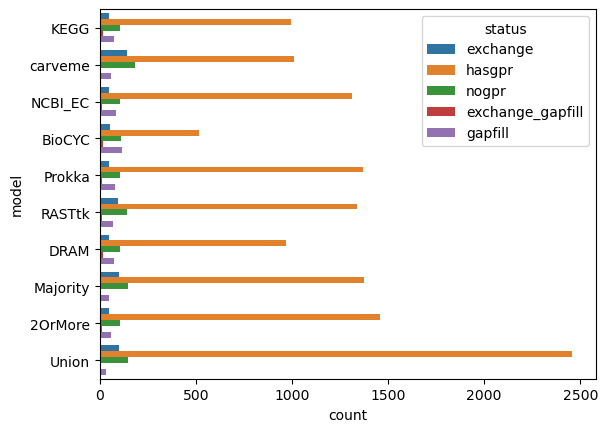

In [50]:
sns.countplot(data=rdf2, y='model', hue='status', order=morder)
plt.show()

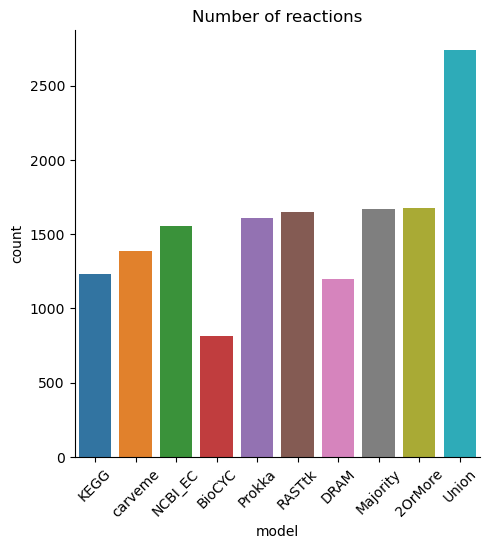

In [54]:
sns.catplot(data=rdf2, x='model', kind='count', order=morder)
plt.xticks(rotation = 45) # Rotates X-Axis Ticks by 45-degrees
plt.title('Number of reactions')
plt.show()

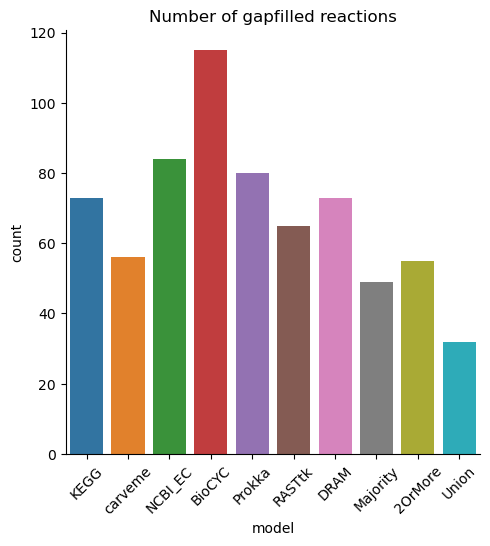

In [55]:
sns.catplot(data=rdf2.loc[rdf2.status.isin(['gapfill'])], x='model', kind='count', order=morder)
plt.xticks(rotation = 45) # Rotates X-Axis Ticks by 45-degrees
plt.title('Number of gapfilled reactions')
plt.show()

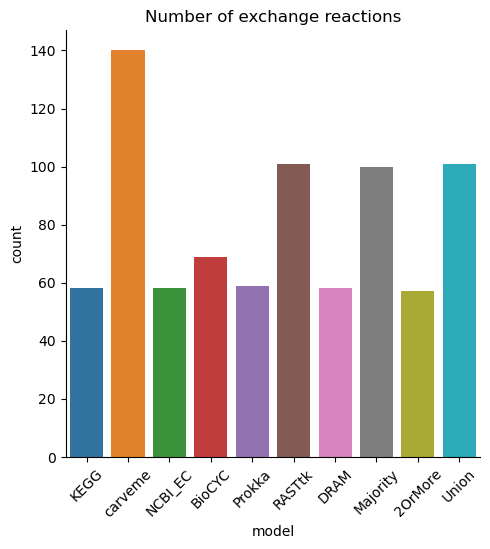

In [56]:
sns.catplot(data=rdf2.loc[rdf2.status.isin(['exchange', 'exchange_gapfill' ])], x='model', kind='count', order=morder)
plt.xticks(rotation = 45) # Rotates X-Axis Ticks by 45-degrees
plt.title('Number of exchange reactions')
plt.show()

In [57]:
rdf2.pivot_table(index='model', columns='status', aggfunc='count', sort=True, values='index_gapfill', margins=True)

status,exchange,exchange_gapfill,gapfill,hasgpr,nogpr,All
model,,,,,,
2OrMore,48.0,9.0,55.0,1460.0,102.0,1674
BioCYC,51.0,18.0,115.0,516.0,111.0,811
DRAM,45.0,13.0,73.0,966.0,104.0,1201
KEGG,45.0,13.0,73.0,996.0,104.0,1231
Majority,97.0,3.0,49.0,1374.0,148.0,1671
NCBI_EC,46.0,12.0,84.0,1311.0,105.0,1558
Prokka,49.0,10.0,80.0,1369.0,104.0,1612
RASTtk,93.0,8.0,65.0,1340.0,141.0,1647
Union,98.0,3.0,32.0,2459.0,146.0,2738


In [58]:
rdf2.columns

Index(['index_nogap', 'name', 'id', 'gpr_nogap', 'exchange_nogap',
       'reversibility_nogap', 'modelname', 'gapfill_nogap', 'model',
       'hasgpr_nogap', 'index_gapfill', 'gpr_gapfill', 'exchange_gapfill',
       'reversibility_gapfill', 'gapfill_gapfill', 'hasgpr_gapfill',
       'gapfilled', 'status'],
      dtype='object')

In [59]:
cols = ['id', 'name',   'model', 'status', 'hasgpr_nogap', 
       'exchange_gapfill',  'gapfilled',  'gpr_nogap','gpr_gapfill',]

rdf_clean = rdf2[cols].rename(columns={'hasgpr_nogap' : 'hasgpr', 
       'exchange_gapfill' : 'exchange',  }
)
rdf_clean.head()

,id,name,model,status,hasgpr,exchange,gapfilled,gpr_nogap,gpr_gapfill
0,EX_cpd02701_b,EX_cpd02701_b,KEGG,exchange,False,True,False,,
1,EX_cpd11416_b,EX_cpd11416_b,KEGG,exchange,False,True,False,,
2,EX_cpd00001_b,EX_cpd00001_b,KEGG,exchange,False,True,False,,
3,EX_cpd00254_b,EX_cpd00254_b,KEGG,exchange,False,True,False,,
4,EX_cpd10516_b,EX_cpd10516_b,KEGG,exchange,False,True,False,,


In [60]:
rdf_clean.to_csv('kbase_reaction_per_model.csv')

In [61]:
r.reversibility

True

In [46]:
model = models_dict['HOT1A3_Majority_gapfill.model.sbml']
model

Name,HOT1A3_Majority_gapfill_model
Memory address,0x07f9e6bb7c2e0
Number of metabolites,1864
Number of reactions,1671
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"Cytosol_0, Extracellular_0"


In [47]:
model = models_dict['HOT1A3_Majority_nogap.model.sbml']
model

Name,HOT1A3_Majority_nogap_model
Memory address,0x07f9e71916220
Number of metabolites,1837
Number of reactions,1619
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"Cytosol_0, Extracellular_0"


In [48]:
model = models_dict['HOT1A3_Union_nogap.model.sbml']
model

Name,HOT1A3_Union_nogap_model
Memory address,0x07f9e6a65dc10
Number of metabolites,2803
Number of reactions,2703
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"Cytosol_0, Extracellular_0"


In [121]:
model

Name,HOT1A3_Majority_gapfill_model
Memory address,1eb93c7f9d0
Number of metabolites,424
Number of reactions,411
Number of genes,1
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"Cytosol_0, Extracellular_0"
